
## RNN for data with time delays

* Per cast
* This one is smooth. I think is may be because of weight decay in Adam, and L1 loss


In [1]:

import pandas as pd
import numpy as np


In [2]:

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')


In [3]:

import matplotlib 
## import pytorch_lightning as pl
import torch 

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable


In [4]:

## Requires Python = 3.9



## Parameters


In [5]:

window                 = 5   ## 90   ## 30          ## seq length

silicon_feature_index  = 0

avg_the_rows_parameter =  1   ##   15

vector_n_out = 24


## 1    ->  1 minute time step
## 15   -> 15 minute time step
## 1440 -> 24 hour time step
## 480  -> 8 hour shift
## 60   -> 1 hour time step



## Read the data


In [6]:

for_RNN_data_CIVS = pd.read_csv('input/RNN_time_DELAYS_2000_PerCast_rcalix.csv')


In [7]:

for_RNN_data_CIVS.head(5)


,Unnamed: 0,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,5,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0


In [8]:

for_RNN_data_CIVS


,Unnamed: 0,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,5,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0


In [9]:

cols_list_DF = for_RNN_data_CIVS.columns.values.tolist()
cols_list_DF


['Unnamed: 0',
 'SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3',
 'cokerate_f4']

In [10]:

l_new = ['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3',
 'cokerate_f4']


In [11]:

for_RNN_data_CIVS = for_RNN_data_CIVS[l_new]


In [12]:

for_RNN_data_CIVS 


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,Selec_Top_Gas_CO_f3,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,21.039583,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,21.043999,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,21.048415,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,21.053935,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0


In [13]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1383 entries, 0 to 1382
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   SI_f1                    1383 non-null   float64
 1   HOST_BLAST_MOISTURE_f3   1383 non-null   float64
 2   HOT_BLAST_TMP_NS_f3      1383 non-null   float64
 3   NAT_GAS _INJECTION_f3    1383 non-null   float64
 4   WINDRATE_f3              1383 non-null   float64
 5   HIGH_PURITY_OXYGEN_f3    1383 non-null   float64
 6   COAL_FLOW_f3             1383 non-null   float64
 7   Cast_Avg_Mn_f2           1383 non-null   float64
 8   Slag_Fe_f2               1383 non-null   float64
 9   Selec_Top_Gas_CO_f3      1383 non-null   float64
 10  Selec_Top_Gas_CO2_f3     1383 non-null   float64
 11  Selec_Top_Gas_H2_f3      1383 non-null   float64
 12  Selec_Top_Gas_N2_f3      1383 non-null   float64
 13  NE_Uptake_f3             1383 non-null   float64
 14  SE_Uptake_f3            


## Plots


In [14]:
'''
for_RNN_data_CIVS['MM_Timestamp_f1'] = for_RNN_data_CIVS['MM_Timestamp_f1'].astype("datetime64[ns]")

rc22 = for_RNN_data_CIVS['MM_Timestamp_f1'].astype("datetime64[ns]")
'''

'\nfor_RNN_data_CIVS[\'MM_Timestamp_f1\'] = for_RNN_data_CIVS[\'MM_Timestamp_f1\'].astype("datetime64[ns]")\n\nrc22 = for_RNN_data_CIVS[\'MM_Timestamp_f1\'].astype("datetime64[ns]")\n'

In [15]:

##rc22


In [16]:

plt.rcParams["figure.figsize"] = [15, 5]


In [17]:

## plt.plot(rc22, for_RNN_data_CIVS['SI_f1'])


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
      dtype=object)

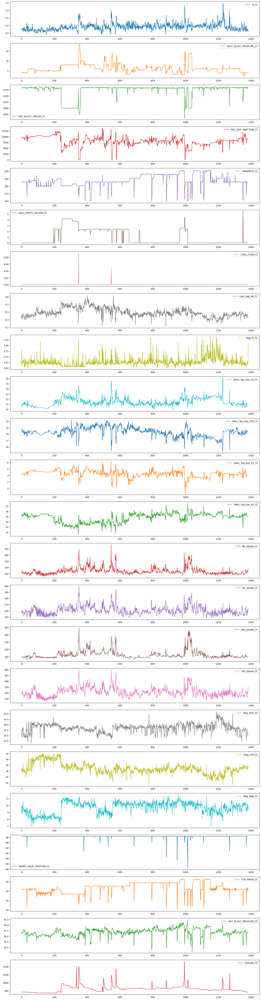

In [18]:

## layout=(4, 3), 
## style=['r', 'r', 'r', 'g', 'g', 'g', 'b', 'b', 'b', 'r', 'r', 'r'],
## xticks=np.arange(0, len(df), 16)

## for_RNN_data_CIVS.plot( xticks=rc22, figsize=(20,80),  subplots=True   )

## x='MM_Timestamp_f1' ,

for_RNN_data_CIVS.plot( kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )


In [19]:

l_new


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3',
 'cokerate_f4']


## Back to the Data Processing


In [20]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1383 entries, 0 to 1382
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   SI_f1                    1383 non-null   float64
 1   HOST_BLAST_MOISTURE_f3   1383 non-null   float64
 2   HOT_BLAST_TMP_NS_f3      1383 non-null   float64
 3   NAT_GAS _INJECTION_f3    1383 non-null   float64
 4   WINDRATE_f3              1383 non-null   float64
 5   HIGH_PURITY_OXYGEN_f3    1383 non-null   float64
 6   COAL_FLOW_f3             1383 non-null   float64
 7   Cast_Avg_Mn_f2           1383 non-null   float64
 8   Slag_Fe_f2               1383 non-null   float64
 9   Selec_Top_Gas_CO_f3      1383 non-null   float64
 10  Selec_Top_Gas_CO2_f3     1383 non-null   float64
 11  Selec_Top_Gas_H2_f3      1383 non-null   float64
 12  Selec_Top_Gas_N2_f3      1383 non-null   float64
 13  NE_Uptake_f3             1383 non-null   float64
 14  SE_Uptake_f3            

In [21]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,Selec_Top_Gas_CO_f3,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,21.039583,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,21.043999,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,21.048415,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,21.053935,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Iterate and mark transitions


In [22]:
'''
for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control1',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control4',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control2',
                                value = 0)


for_RNN_data_CIVS.insert(       loc = 0,
                                column = 'control3',
                                value = 0)



for_RNN_data_CIVS
'''

"\nfor_RNN_data_CIVS.insert(       loc = 0,\n                                column = 'control1',\n                                value = 0)\n\n\nfor_RNN_data_CIVS.insert(       loc = 0,\n                                column = 'control4',\n                                value = 0)\n\n\nfor_RNN_data_CIVS.insert(       loc = 0,\n                                column = 'control2',\n                                value = 0)\n\n\nfor_RNN_data_CIVS.insert(       loc = 0,\n                                column = 'control3',\n                                value = 0)\n\n\n\nfor_RNN_data_CIVS\n"

In [23]:
'''
indeces_to_2500_control2 = []

indeces_to_2500 = [] 

counter_control2 = 0

counter = 500

prev_val = 0.0
    
for index, row in for_RNN_data_CIVS.iterrows():

    ## print( row["SI_f1"]  )
    #########################################################################
    if row["SI_f1"] == prev_val:
        for_RNN_data_CIVS.at[index, 'control1'] = counter
        counter = counter + 1
        indeces_to_2500.append( index )
    else:
        if counter > 2000:
            ## print(counter)
            ## input()
            for_RNN_data_CIVS["control4"][indeces_to_2500 ] = 1
            indeces_to_2500 = []
        else:
            indeces_to_2500 = []
        counter = 0

    ##########################################################################
    if row["SI_f1"] != prev_val:
        for_RNN_data_CIVS.at[index, 'control2'] = counter_control2
        counter_control2 = counter_control2 + 1
        indeces_to_2500_control2.append(  index  )
    else:
        if counter_control2 > 2000:
            ## print(counter)
            ## input()
            for_RNN_data_CIVS["control4"][indeces_to_2500_control2 ] = 1
            indeces_to_2500_control2 = []
        else:
            indeces_to_2500_control2 = []
        counter_control2 = 0

    ##########################################################################
    if row["SI_f1"] == prev_val:
        for_RNN_data_CIVS.at[index, 'control3'] = 1.0

    ##########################################################################
    if index  % 50000 == 0:
        print(index )
    prev_val = row["SI_f1"]
        
    
'''
    


'\nindeces_to_2500_control2 = []\n\nindeces_to_2500 = [] \n\ncounter_control2 = 0\n\ncounter = 500\n\nprev_val = 0.0\n    \nfor index, row in for_RNN_data_CIVS.iterrows():\n\n    ## print( row["SI_f1"]  )\n    #########################################################################\n    if row["SI_f1"] == prev_val:\n        for_RNN_data_CIVS.at[index, \'control1\'] = counter\n        counter = counter + 1\n        indeces_to_2500.append( index )\n    else:\n        if counter > 2000:\n            ## print(counter)\n            ## input()\n            for_RNN_data_CIVS["control4"][indeces_to_2500 ] = 1\n            indeces_to_2500 = []\n        else:\n            indeces_to_2500 = []\n        counter = 0\n\n    ##########################################################################\n    if row["SI_f1"] != prev_val:\n        for_RNN_data_CIVS.at[index, \'control2\'] = counter_control2\n        counter_control2 = counter_control2 + 1\n        indeces_to_2500_control2.append(  index  )

In [24]:
'''
## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )


for_RNN_data_CIVS.plot(x='MM_Timestamp_f1' , kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )
'''

"\n## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )\n\n\nfor_RNN_data_CIVS.plot(x='MM_Timestamp_f1' , kind='line', subplots=True, figsize=(20,80),\n        sharex=False, sharey=False, legend=True )\n"

In [25]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,Selec_Top_Gas_CO_f3,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,21.039583,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,21.043999,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,21.048415,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,21.053935,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Drop row with value above x


In [26]:
'''
## for_RNN_data_CIVS = for_RNN_data_CIVS.drop( for_RNN_data_CIVS[ for_RNN_data_CIVS.control4 == 1 ].index ) ## , inplace = True)

for_RNN_data_CIVS = for_RNN_data_CIVS [ for_RNN_data_CIVS ["control4"] == 0].reset_index( drop=True )  ## this one
'''

'\n## for_RNN_data_CIVS = for_RNN_data_CIVS.drop( for_RNN_data_CIVS[ for_RNN_data_CIVS.control4 == 1 ].index ) ## , inplace = True)\n\nfor_RNN_data_CIVS = for_RNN_data_CIVS [ for_RNN_data_CIVS ["control4"] == 0].reset_index( drop=True )  ## this one\n'

In [27]:

## for_RNN_data_CIVS


In [28]:
'''
## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )

for_RNN_data_CIVS.plot( kind='line', subplots=True, figsize=(20,80),
        sharex=False, sharey=False, legend=True )
'''

"\n## for_RNN_data_CIVS.plot(  figsize=(20,80),  subplots=True   )\n\nfor_RNN_data_CIVS.plot( kind='line', subplots=True, figsize=(20,80),\n        sharex=False, sharey=False, legend=True )\n"

In [29]:

for_RNN_data_CIVS.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1383 entries, 0 to 1382
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   SI_f1                    1383 non-null   float64
 1   HOST_BLAST_MOISTURE_f3   1383 non-null   float64
 2   HOT_BLAST_TMP_NS_f3      1383 non-null   float64
 3   NAT_GAS _INJECTION_f3    1383 non-null   float64
 4   WINDRATE_f3              1383 non-null   float64
 5   HIGH_PURITY_OXYGEN_f3    1383 non-null   float64
 6   COAL_FLOW_f3             1383 non-null   float64
 7   Cast_Avg_Mn_f2           1383 non-null   float64
 8   Slag_Fe_f2               1383 non-null   float64
 9   Selec_Top_Gas_CO_f3      1383 non-null   float64
 10  Selec_Top_Gas_CO2_f3     1383 non-null   float64
 11  Selec_Top_Gas_H2_f3      1383 non-null   float64
 12  Selec_Top_Gas_N2_f3      1383 non-null   float64
 13  NE_Uptake_f3             1383 non-null   float64
 14  SE_Uptake_f3            

In [30]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,Selec_Top_Gas_CO_f3,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,21.039583,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,21.043999,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,21.048415,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,21.053935,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Average the rows to control time step



## Sanity check


In [31]:



data = [
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30],
[18 , 22,  39 , 29],
[20 , 9,   15,  47],
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30],
[18 , 22,  39 , 29],
[20 , 9,   15,  47],
[2,   50,  25,  26],
[4,   11,  38,  44],
[6,   33,  16,  25],
[8 ,  37,  27,  25],
[10,  28,  48,  32],
[12,  47,  35,  45],
[14,  8,   16,  7],
[16,  12,  16,  30]
]



df_example = pd.DataFrame( data, columns=['a', 'b', 'c', 'd'] )
 

print(df_example)


     a   b   c   d
0   20   9  15  47
1    2  50  25  26
2    4  11  38  44
3    6  33  16  25
4    8  37  27  25
5   10  28  48  32
6   12  47  35  45
7   14   8  16   7
8   16  12  16  30
9   18  22  39  29
10  20   9  15  47
11  20   9  15  47
12   2  50  25  26
13   4  11  38  44
14   6  33  16  25
15   8  37  27  25
16  10  28  48  32
17  12  47  35  45
18  14   8  16   7
19  16  12  16  30
20  18  22  39  29
21  20   9  15  47
22   2  50  25  26
23   4  11  38  44
24   6  33  16  25
25   8  37  27  25
26  10  28  48  32
27  12  47  35  45
28  14   8  16   7
29  16  12  16  30


In [32]:

print(df_example.shape)


(30, 4)


In [33]:

## avg_df_example = df_example.groupby(np.arange(len(df_example))//avg_the_rows_parameter).mean()
## avg_df_example.shape


In [34]:

## avg_df_example



## Now Avg to change time step


In [35]:

## for_RNN_data_CIVS

print(for_RNN_data_CIVS.shape)


(1383, 24)


In [36]:
'''
for_RNN_data_CIVS = for_RNN_data_CIVS.groupby(np.arange(len(for_RNN_data_CIVS))//avg_the_rows_parameter).mean()
for_RNN_data_CIVS.shape
'''

'\nfor_RNN_data_CIVS = for_RNN_data_CIVS.groupby(np.arange(len(for_RNN_data_CIVS))//avg_the_rows_parameter).mean()\nfor_RNN_data_CIVS.shape\n'

In [37]:

for_RNN_data_CIVS


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,Selec_Top_Gas_CO_f3,...,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,...,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,...,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
2,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,...,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
3,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,...,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
4,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,...,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1378,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,21.039583,...,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1379,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,21.043999,...,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1380,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,21.048415,...,181.684649,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1381,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,21.053935,...,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Create datasets of selected features


In [38]:

pd.options.display.max_columns = None


In [39]:

def window_seq_conversion_multi_feature(df, window, target_index):
    d = df.values
    ## print( d )
    print( d.shape )
    x = []
    n = len(df)
    n_features = df.shape[1]
    ## print(n_features)
    ## print(n)

    idx = df.index[ : -window]
    print(idx)
    print(  idx.shape  )


    for start in range(n-window):
        end = start + window
        ## print(start, "....", end)
        x.append( d[ start:end, : ] )

    ## print(x)
    cols_x = [ f'xt_{i}_fx_{j}' for i in range(1, window+1) for j in range(0, n_features)]
    cols_y = [ f'y_fy_{j}' for j in range(0, n_features)]
    ## print(  cols  )

    x = np.array(x)
    print(x.shape)
    x = np.array(x).reshape(n-window, -1)
    print(x.shape)

    y = df.iloc[ window: , : ].values
    print( y.shape )
    ## print( y.reshape(-1).shape )

    df_xs = pd.DataFrame(x  , columns=cols_x,  index=idx)
    df_y  = pd.DataFrame(y  , columns=cols_y,  index=idx)
    ## print(df_y)
    return pd.concat( [df_xs, df_y], axis=1 )



## Make Data Sequential


In [40]:

 
res_multi_feature_df = window_seq_conversion_multi_feature( for_RNN_data_CIVS, window,  silicon_feature_index )


(1383, 24)
RangeIndex(start=0, stop=1378, step=1)
(1378,)
(1378, 5, 24)
(1378, 120)
(1378, 24)


In [41]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_1_fx_19,xt_1_fx_20,xt_1_fx_21,xt_1_fx_22,xt_1_fx_23,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_2_fx_19,xt_2_fx_20,xt_2_fx_21,xt_2_fx_22,xt_2_fx_23,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,xt_3_fx_19,xt_3_fx_20,xt_3_fx_21,xt_3_fx_22,xt_3_fx_23,xt_4_fx_0,xt_4_fx_1,xt_4_fx_2,xt_4_fx_3,xt_4_fx_4,xt_4_fx_5,xt_4_fx_6,xt_4_fx_7,xt_4_fx_8,xt_4_fx_9,xt_4_fx_10,xt_4_fx_11,xt_4_fx_12,xt_4_fx_13,xt_4_fx_14,xt_4_fx_15,xt_4_fx_16,xt_4_fx_17,xt_4_fx_18,xt_4_fx_19,xt_4_fx_20,xt_4_fx_21,xt_4_fx_22,xt_4_fx_23,xt_5_fx_0,xt_5_fx_1,xt_5_fx_2,xt_5_fx_3,xt_5_fx_4,xt_5_fx_5,xt_5_fx_6,xt_5_fx_7,xt_5_fx_8,xt_5_fx_9,xt_5_fx_10,xt_5_fx_11,xt_5_fx_12,xt_5_fx_13,xt_5_fx_14,xt_5_fx_15,xt_5_fx_16,xt_5_fx_17,xt_5_fx_18,xt_5_fx_19,xt_5_fx_20,xt_5_fx_21,xt_5_fx_22,xt_5_fx_23,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18,y_fy_19,y_fy_20,y_fy_21,y_fy_22,y_fy_23
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0,0.812430,4.201480,2165.928695,9720.889670,185.986077,0.0,0.0,0.334,0.20,20.999677,18.571620,4.389799,55.136950,162.255752,204.143524,142.246698,215.755604,38.330002,36

In [42]:

print( res_multi_feature_df.shape )


(1378, 144)



## Drop desired columns from Sequential Data Frame (such as silicon from X)


In [43]:

'''

df = res_multi_feature_df

df.drop(  list(   df.filter(regex='_fx_0')   ), axis=1, inplace=True)

no_silicon_in_seq_X_df = df

print( df.shape )

'''


"\n\ndf = res_multi_feature_df\n\ndf.drop(  list(   df.filter(regex='_fx_0')   ), axis=1, inplace=True)\n\nno_silicon_in_seq_X_df = df\n\nprint( df.shape )\n\n"

In [44]:

print( res_multi_feature_df.shape )


(1378, 144)


In [45]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_1_fx_19,xt_1_fx_20,xt_1_fx_21,xt_1_fx_22,xt_1_fx_23,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_2_fx_19,xt_2_fx_20,xt_2_fx_21,xt_2_fx_22,xt_2_fx_23,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,xt_3_fx_19,xt_3_fx_20,xt_3_fx_21,xt_3_fx_22,xt_3_fx_23,xt_4_fx_0,xt_4_fx_1,xt_4_fx_2,xt_4_fx_3,xt_4_fx_4,xt_4_fx_5,xt_4_fx_6,xt_4_fx_7,xt_4_fx_8,xt_4_fx_9,xt_4_fx_10,xt_4_fx_11,xt_4_fx_12,xt_4_fx_13,xt_4_fx_14,xt_4_fx_15,xt_4_fx_16,xt_4_fx_17,xt_4_fx_18,xt_4_fx_19,xt_4_fx_20,xt_4_fx_21,xt_4_fx_22,xt_4_fx_23,xt_5_fx_0,xt_5_fx_1,xt_5_fx_2,xt_5_fx_3,xt_5_fx_4,xt_5_fx_5,xt_5_fx_6,xt_5_fx_7,xt_5_fx_8,xt_5_fx_9,xt_5_fx_10,xt_5_fx_11,xt_5_fx_12,xt_5_fx_13,xt_5_fx_14,xt_5_fx_15,xt_5_fx_16,xt_5_fx_17,xt_5_fx_18,xt_5_fx_19,xt_5_fx_20,xt_5_fx_21,xt_5_fx_22,xt_5_fx_23,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18,y_fy_19,y_fy_20,y_fy_21,y_fy_22,y_fy_23
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0,0.812430,4.201480,2165.928695,9720.889670,185.986077,0.0,0.0,0.334,0.20,20.999677,18.571620,4.389799,55.136950,162.255752,204.143524,142.246698,215.755604,38.330002,36


## Drop last in X input sequence

* predict the one not seen , i think




In [46]:

window_str = str(window)
window_str


'5'

In [47]:

string_match_last_seq = "xt_" + window_str
string_match_last_seq 


'xt_5'

In [48]:

'''

df = res_multi_feature_df

df.drop(  list(   df.filter(regex=string_match_last_seq)   ), axis=1, inplace=True)

no_silicon_in_seq_X_df = df

print( df.shape )

'''


'\n\ndf = res_multi_feature_df\n\ndf.drop(  list(   df.filter(regex=string_match_last_seq)   ), axis=1, inplace=True)\n\nno_silicon_in_seq_X_df = df\n\nprint( df.shape )\n\n'

In [49]:

print( res_multi_feature_df.shape )


(1378, 144)


In [50]:

res_multi_feature_df


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_1_fx_19,xt_1_fx_20,xt_1_fx_21,xt_1_fx_22,xt_1_fx_23,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_2_fx_19,xt_2_fx_20,xt_2_fx_21,xt_2_fx_22,xt_2_fx_23,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,xt_3_fx_19,xt_3_fx_20,xt_3_fx_21,xt_3_fx_22,xt_3_fx_23,xt_4_fx_0,xt_4_fx_1,xt_4_fx_2,xt_4_fx_3,xt_4_fx_4,xt_4_fx_5,xt_4_fx_6,xt_4_fx_7,xt_4_fx_8,xt_4_fx_9,xt_4_fx_10,xt_4_fx_11,xt_4_fx_12,xt_4_fx_13,xt_4_fx_14,xt_4_fx_15,xt_4_fx_16,xt_4_fx_17,xt_4_fx_18,xt_4_fx_19,xt_4_fx_20,xt_4_fx_21,xt_4_fx_22,xt_4_fx_23,xt_5_fx_0,xt_5_fx_1,xt_5_fx_2,xt_5_fx_3,xt_5_fx_4,xt_5_fx_5,xt_5_fx_6,xt_5_fx_7,xt_5_fx_8,xt_5_fx_9,xt_5_fx_10,xt_5_fx_11,xt_5_fx_12,xt_5_fx_13,xt_5_fx_14,xt_5_fx_15,xt_5_fx_16,xt_5_fx_17,xt_5_fx_18,xt_5_fx_19,xt_5_fx_20,xt_5_fx_21,xt_5_fx_22,xt_5_fx_23,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18,y_fy_19,y_fy_20,y_fy_21,y_fy_22,y_fy_23
0,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0
1,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0,0.794132,4.171589,2167.616317,9800.277716,185.660164,0.0,0.0,0.350,0.24,20.761851,18.565015,4.307315,55.405926,154.325145,197.306648,149.145198,194.222601,37.590000,36.959999,9.96,98.334297,18.358368,36.418951,884.0,0.812430,4.201480,2165.928695,9720.889670,185.986077,0.0,0.0,0.334,0.20,20.999677,18.571620,4.389799,55.136950,162.255752,204.143524,142.246698,215.755604,38.330002,36


## Need to adjust windows based on previous step


In [51]:


## window = window - 1



In [52]:


window


5


## Utility Functions


In [53]:

class Standardize:
    
    def __init__(self, df, split=0.10):
        self.data  = df
        self.split = split
    
    def split_data(self):
        n           = int( len( self.data ) * self.split )
        train       = self.data.iloc[   :-n ] 
        test        = self.data.iloc[ -n:   ]
        n           = int( len(   train   ) * self.split  * 0.30 )
        train       = train.iloc[   :-n ] 
        val         = train.iloc[ -n:   ]
        assert len(test) + len(train) + len(val) == len(self.data)
        return train, test, val
    
    def _transform(self, data):
        data_s = ( data - self.mu ) / self.sigma          
        return data_s
    
    def fit_transform(self):
        train, test, val    = self.split_data()
        self.mu             = train.mean() 
        self.sigma          = train.std()
        train_s             = self._transform( train )
        test_s              = self._transform( test  )
        val_s               = self._transform( val   )
        return train_s, test_s, val_s
    
    def inverse(self,   data):
        return ( data * self.sigma     ) + self.mu          ## all data
        
    def inverse_y(self, data):
        print(self.sigma.shape)
        print(self.mu.shape)
        print(self.mu[-vector_n_out:].shape)
        print(self.sigma[-vector_n_out:].shape)
        print(data.shape)
        the_sigma = self.sigma[-vector_n_out:]
        the_mu    = self.mu[-vector_n_out:]

        the_sigma = np.expand_dims(the_sigma, axis=0)
        the_mu    = np.expand_dims(the_mu,    axis=0)

        print(the_sigma.shape)
        print(the_sigma.shape)
        
        return ( data * the_sigma ) + the_mu       


In [54]:

scale_civs = Standardize(  res_multi_feature_df , split=0.20 )


In [55]:

train_si, test_si, val_si = scale_civs.fit_transform()


In [56]:

train_si


,xt_1_fx_0,xt_1_fx_1,xt_1_fx_2,xt_1_fx_3,xt_1_fx_4,xt_1_fx_5,xt_1_fx_6,xt_1_fx_7,xt_1_fx_8,xt_1_fx_9,xt_1_fx_10,xt_1_fx_11,xt_1_fx_12,xt_1_fx_13,xt_1_fx_14,xt_1_fx_15,xt_1_fx_16,xt_1_fx_17,xt_1_fx_18,xt_1_fx_19,xt_1_fx_20,xt_1_fx_21,xt_1_fx_22,xt_1_fx_23,xt_2_fx_0,xt_2_fx_1,xt_2_fx_2,xt_2_fx_3,xt_2_fx_4,xt_2_fx_5,xt_2_fx_6,xt_2_fx_7,xt_2_fx_8,xt_2_fx_9,xt_2_fx_10,xt_2_fx_11,xt_2_fx_12,xt_2_fx_13,xt_2_fx_14,xt_2_fx_15,xt_2_fx_16,xt_2_fx_17,xt_2_fx_18,xt_2_fx_19,xt_2_fx_20,xt_2_fx_21,xt_2_fx_22,xt_2_fx_23,xt_3_fx_0,xt_3_fx_1,xt_3_fx_2,xt_3_fx_3,xt_3_fx_4,xt_3_fx_5,xt_3_fx_6,xt_3_fx_7,xt_3_fx_8,xt_3_fx_9,xt_3_fx_10,xt_3_fx_11,xt_3_fx_12,xt_3_fx_13,xt_3_fx_14,xt_3_fx_15,xt_3_fx_16,xt_3_fx_17,xt_3_fx_18,xt_3_fx_19,xt_3_fx_20,xt_3_fx_21,xt_3_fx_22,xt_3_fx_23,xt_4_fx_0,xt_4_fx_1,xt_4_fx_2,xt_4_fx_3,xt_4_fx_4,xt_4_fx_5,xt_4_fx_6,xt_4_fx_7,xt_4_fx_8,xt_4_fx_9,xt_4_fx_10,xt_4_fx_11,xt_4_fx_12,xt_4_fx_13,xt_4_fx_14,xt_4_fx_15,xt_4_fx_16,xt_4_fx_17,xt_4_fx_18,xt_4_fx_19,xt_4_fx_20,xt_4_fx_21,xt_4_fx_22,xt_4_fx_23,xt_5_fx_0,xt_5_fx_1,xt_5_fx_2,xt_5_fx_3,xt_5_fx_4,xt_5_fx_5,xt_5_fx_6,xt_5_fx_7,xt_5_fx_8,xt_5_fx_9,xt_5_fx_10,xt_5_fx_11,xt_5_fx_12,xt_5_fx_13,xt_5_fx_14,xt_5_fx_15,xt_5_fx_16,xt_5_fx_17,xt_5_fx_18,xt_5_fx_19,xt_5_fx_20,xt_5_fx_21,xt_5_fx_22,xt_5_fx_23,y_fy_0,y_fy_1,y_fy_2,y_fy_3,y_fy_4,y_fy_5,y_fy_6,y_fy_7,y_fy_8,y_fy_9,y_fy_10,y_fy_11,y_fy_12,y_fy_13,y_fy_14,y_fy_15,y_fy_16,y_fy_17,y_fy_18,y_fy_19,y_fy_20,y_fy_21,y_fy_22,y_fy_23
0,-0.765070,-0.946087,0.367938,0.508422,-0.277023,-0.877953,-0.052398,-0.960257,-0.503719,-0.343504,-0.231716,-0.320565,0.341086,-0.096807,-0.632599,-0.604631,-0.446477,-0.511305,-0.491922,0.180109,0.104798,-0.114819,-0.083390,-0.970913,-0.804059,-0.974276,0.484702,0.523099,-0.114375,-0.877953,-0.052398,-1.679932,3.736603,-0.452961,-0.233257,-0.316517,0.483127,-0.139306,-0.599388,-0.603625,-0.451426,-1.526412,-0.755031,-0.734356,0.104798,-0.239342,0.089069,-0.972370,-0.997527,-0.994352,0.478463,0.561510,-0.137182,-0.877953,-0.052398,-0.855697,-0.887166,-0.773049,-0.189500,-0.310913,0.807427,-0.260518,-0.265711,-0.624639,-0.306659,-1.910431,-0.407009,-0.625752,0.104798,-0.242269,-0.099501,-0.973829,-0.959061,-0.998491,0.465506,0.627456,-0.123882,-0.877953,-0.052398,-1.570325,0.640971,-0.956378,0.255790,-0.301336,0.773182,-0.687604,-0.482504,-0.618060,-0.773915,-2.379436,-0.793858,-0.968338,0.104798,-0.263943,0.065958,-0.975290,-0.514137,-0.999564,0.456804,0.665906,-0.117215,-0.877953,-0.052398,-1.291994,0.259315,-0.947275,0.552392,-0.168067,0.709338,-0.621370,-0.147725,-0.579281,-0.607425,-2.181737,-0.754932,-1.069188,0.105849,-0.235804,-0.038267,-0.976755,-0.437821,-0.979019,0.477937,0.734535,-0.153276,-0.877953,-0.052398,-1.028889,0.003441,-0.761036,0.143656,-0.019425,0.837428,-0.685691,-0.226715,-0.575721,-0.410837,-0.406075,-0.198937,0.284506,0.105849,-0.267059,-0.176391,-0.978222
1,-0.804595,-0.974470,0.483340,0.521621,-0.114281,-0.877953,-0.052398,-1.679288,3.737418,-0.452344,-0.234001,-0.315946,0.483152,-0.136336,-0.599250,-0.603457,-0.450034,-1.526451,-0.755968,-0.734099,0.104798,-0.239510,0.087380,-0.970913,-0.998596,-0.994281,0.476935,0.560072,-0.137228,-0.877953,-0.052398,-0.855494,-0.884461,-0.772669,-0.189265,-0.310113,0.806832,-0.258758,-0.263385,-0.623392,-0.304861,-1.908594,-0.406876,-0.624224,0.104798,-0.242322,-0.101864,-0.972370,-0.957924,-0.996588,0.464905,0.626127,-0.123882,-0.877953,-0.052398,-1.574987,0.642329,-0.954908,0.255489,-0.301979,0.771911,-0.686662,-0.481288,-0.616581,-0.772962,-2.375312,-0.794499,-0.967091,0.104798,-0.264004,0.064437,-0.973829,-0.513375,-0.998658,0.455560,0.664919,-0.121324,-0.877953,-0.052398,-1.290217,0.258527,-0.945859,0.551627,-0.167391,0.711652,-0.620419,-0.147406,-0.578392,-0.606527,-2.174617,-0.754558,-1.067429,0.104798,-0.240475,-0.043745,-0.975290,-0.438278,-0.978364,0.477558,0.733655,-0.156142,-0.877953,-0.052398,-1.029172,0.004303,-0.760144,0.141551,-0.019060,0.839269,-0.684903,-0.226155,-0.574978,-0.410167,-0.402131,-0.199025,0.285509,0.10584


## Some Sanity Checks


In [57]:

print( scale_civs.split)


0.2


In [58]:

print(f'''
SI: train: { len(train_si) } , val:{ len(val_si) }, test: { len(test_si) } 
''')



SI: train: 1037 , val:66, test: 275 



In [59]:

numpy_array = train_si.values
type(numpy_array)


numpy.ndarray

In [60]:

torch_tensor = torch.from_numpy(numpy_array)
type(torch_tensor)


torch.Tensor

In [61]:

from_torch_to_numpy = torch_tensor.detach().numpy()
type(from_torch_to_numpy)


numpy.ndarray


## Convert to Torch tensors Option 1


In [62]:


def Convert_to_RNN_tensors( list_data_civs ):
    
    y=[torch.from_numpy(col.iloc[ :,  -vector_n_out: ].values.reshape(-1, vector_n_out)   ).float()   for col in list_data_civs]
    x=[torch.from_numpy(col.iloc[ :, :-vector_n_out].values.reshape(*col.iloc[ :, :-vector_n_out].shape)).float() for col in list_data_civs]
    
    return y, x


In [63]:

list_data_civs = [ train_si, val_si, test_si ]

y, x           = Convert_to_RNN_tensors(   list_data_civs  )


In [64]:

y_train_si = y[0]
y_val_si   = y[1]
y_test_si  = y[2]
x_train_si = x[0]
x_val_si   = x[1]
x_test_si  = x[2]


In [65]:

print( y_train_si.shape )
print(   y_val_si.shape ) 
print(  y_test_si.shape ) 
print( x_train_si.shape )
print(   x_val_si.shape )
print(  x_test_si.shape )


torch.Size([1037, 24])
torch.Size([66, 24])
torch.Size([275, 24])
torch.Size([1037, 120])
torch.Size([66, 120])
torch.Size([275, 120])



## Parameters (set these manually)


In [66]:

vector_n_out


24

In [67]:

params_si = {
'seq_length': window,       ## this is the window
'input_size': vector_n_out, ## 18,  ## 4,      ## x input size -> my_4_cols = [  'SI_f1', 'HM_Temp_f1', 'Slag_CaO_f2', 'C_perce_sat_f1' ]
'output_size':vector_n_out,
'units': 64,         ## 32,                 ## neurons in hidden layers
'n_layers':1,
'epochs': 3000,
'print_every': 25,
'lr':  0.01,      ## 0.001
'train_data': (x_train_si, y_train_si),
'val_data':     (x_val_si, y_val_si),
'test_data':   (x_test_si, y_test_si),
'idx': test_si.index,                        ## needed for validation, use test set here
'scale': scale_civs
}



plt.rcParams["figure.figsize"] = [14, 5] 


In [68]:

test_si.index


RangeIndex(start=1103, stop=1378, step=1)


## Training Function



In [69]:

def myKL_loss():
    kl_loss = nn.KLDivLoss(reduction="batchmean")
    input = F.log_softmax(torch.randn(3, 5, requires_grad=True), dim=1)

    target = F.softmax(torch.rand(3, 5), dim=1)
    output = kl_loss(input, target)


In [70]:

def train_model_pt(model_type='RNN', **kwargs):
    """
    Parameters:
        input_size: input size
        output_size: output size
        n_features: number of features (hidden dimension)
        n_layers: number of layers
        train_data: tuple ex (x_train, y_train)
        val_data: tuple ex (x_val, y_val)
        epochs: number of epochs
        print_every: output and history tracking
        lr: learning rate
    """
    if model_type=='RNN':
        model = RNN(kwargs['seq_length'],
                    kwargs['input_size'], 
                    kwargs['output_size'], 
                    kwargs['units'], 
                    kwargs['n_layers'])
    elif model_type=='LSTM':
        model = LSTM(kwargs['seq_length'],
                     kwargs['input_size'], 
                     kwargs['output_size'], 
                     kwargs['units'], 
                     kwargs['n_layers'])
    elif model_type=='GRU':
         model = LSTM(kwargs['seq_length'],
                      kwargs['input_size'], 
                      kwargs['output_size'], 
                      kwargs['units'], 
                      kwargs['n_layers'])

    criterion       = nn.MSELoss()
    criterion_mse   = nn.MSELoss()

    criterion_l1    = nn.L1Loss()
    criterion_kl    = nn.KLDivLoss(reduction="batchmean")
    
    optimizer = torch.optim.Adam(model.parameters(), lr=kwargs['lr'], weight_decay=0.0005)
    
    x_train, y_train = kwargs['train_data']
    x_val, y_val     = kwargs['val_data']
    x_test, y_test   = kwargs['test_data']
    
    history = {'loss': [], 'val_loss': []}
    # batch_size = x_train.shape[0]
    model.train()
    epochs      = kwargs['epochs']
    print_every = kwargs['print_every']

    ## epochs = 200
    
    for batch_i, epoch in enumerate(range(epochs)):

        
        h = model.init_hidden( x_train.shape[0])
        optimizer.zero_grad()
        
        pred, h = model( x_train, h )   #model(x_train)
        #hidden = hidden.data

        ## print(pred.shape)
        ## print(y_train.shape)

        input_kl  = F.log_softmax(y_train, dim=1)
        target_kl = F.softmax(pred, dim=1)
        
        ## loss = criterion_kl(input_kl, target_kl)
        l1_lambda = 0.001
        l1_norm = sum(p.abs().sum() for p in model.parameters())
        ## loss    = criterion_kl(input_kl, target_kl)  + l1_lambda*l1_norm  

        loss =  criterion_l1( pred, y_train ) 
        
        ## loss = criterion_l1( pred, y_train ) + criterion_kl(input_kl, target_kl)
        
        loss.backward()
        optimizer.step()
        
        if batch_i % print_every == 0:
            model.eval()
            with torch.no_grad():
                val_h        = model.init_hidden( x_val.shape[0] )
                val_p, val_h = model(x_val, val_h)
                val_loss     = criterion(val_p, y_val)
                history['val_loss'].append(val_loss.item())
            model.train()
            history['loss'].append(loss.item())
            print(f'{batch_i}/{epochs} - Loss:  {loss.item()}, val_loss: {val_loss.item()}')
    
    ## Prediction
    model.eval()
    with torch.no_grad():
        h0    = model.init_hidden( x_test.shape[0] )
        y_hat = model(x_test, h0)
        
    y_hat, _ = y_hat
    mse_loss_air = criterion_mse(y_hat, y_test)
    print(f'Test MSE Loss: {mse_loss_air.item():.4f}')
    
    ## Plotting
    fig, ax = plt.subplots(2, 1) 

    ax[0].set_title(f'{model_type}: Loss and Validation Loss per epoch')
    ax[0].plot(history['loss'], 'k--',   label='loss')
    ax[0].plot(history['val_loss'], 'k', label='val_loss')
    ax[0].legend()
    ax[1].set_title(f"{model_type} TEST MSE = {mse_loss_air.item():.4f}: Forecast vs Actual (Out-of-Sample data)")
    scale = kwargs['scale']
    print("ricardo check this")
    print(y_test.shape)
    print(y_hat.shape )
    actual = scale.inverse_y(y_test.detach().numpy() ) ## .ravel() )
    pred   = scale.inverse_y( y_hat.detach().numpy() ) ## .ravel() )
    idx = kwargs['idx']
    ##pd.Series(actual, index=idx).plot(style='k--', label='actual', alpha=0.65, color='blue')
    ##pd.Series(pred,   index=idx).plot(style='k',   label='forecast' , color='red')
    print(actual.shape)
    print(pred.shape)
    actual = actual[:, 0]
    pred   =   pred[:, 0]
    pd.Series(actual, index=idx).plot( label='actual',    color='blue')
    pd.Series(pred,   index=idx).plot( label='forecast' , color='red' )
    fig.tight_layout()
    ax[1].legend(); plt.show()
    
    return model, history



## Inference Utility functions


In [96]:

def bins_inference_model_pt(model, x_test, y_test, which_feature , string_feature):

    model_type='RNN'

    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    for i in range( n_test ):

        if i == 0:
            input_test_x = x_test[i]    
            input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
            
            y_pred, h0 = model( input_test_x , h0 )
           
            
            temp_x_test = input_test_x[:, vector_n_out:]   ## 19 if si included, 18 if si not included 
            
            concat_part = y_pred[:, 0:]       ## 0 if si in x, 1 if si not in x
            new_x_test = torch.cat((temp_x_test , concat_part), 1)
            
            
            input_test_x = new_x_test
            
            
            y_pred_si     = y_pred[:, which_feature].detach().numpy() 
            y_real_si     = y_test[i, which_feature].detach().numpy() 


            the_sigma = scale_civs.sigma[-vector_n_out]
            the_mu    = scale_civs.mu[-vector_n_out]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    l_real = list_real_si
    l_pred = list_pred_si

    eval_criterion = nn.MSELoss()
    ## torch.FloatTensor(a)
    mse_eval_bins = eval_criterion(torch.FloatTensor(l_pred), torch.FloatTensor( l_real))
    print( string_feature )
    print(f'Test MSE Loss: {mse_eval_bins.item():.4f}')
 
    x = [ i for i in range(len(l_real)) ] 
    print(len(x))
  
    # plot lines 

    plt.scatter(x, l_real, label = "real", color='red') 
    plt.plot(   x, l_real, label = "real", color='red') 
    
    plt.scatter(x, l_pred, label = "pred", color='blue') 
    plt.plot(   x, l_pred, label = "pred", color='blue') 
    
    plt.legend() 
    plt.show()

## return list_real_si, list_pred_si
            


In [72]:


def inference_model_pt_2(model, model_type='RNN', **kwargs):
    ''' 
    if model_type=='RNN':
        model = RNN(kwargs['seq_length'],
                    kwargs['input_size'], 
                    kwargs['output_size'], 
                    kwargs['units'], 
                    kwargs['n_layers'])
    elif model_type=='LSTM':
        model = LSTM(kwargs['seq_length'],
                     kwargs['input_size'], 
                     kwargs['output_size'], 
                     kwargs['units'], 
                     kwargs['n_layers'])
    elif model_type=='GRU':
         model = LSTM(kwargs['seq_length'],
                      kwargs['input_size'], 
                      kwargs['output_size'], 
                      kwargs['units'], 
                      kwargs['n_layers'])
        
    '''
    
    x_test, y_test   = kwargs['test_data']
    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    ## h0       = model.init_hidden( 1 )
    
    for i in range( n_test ):

        ## if i == 0:
        input_test_x = x_test[i]    ## [1, 30x18]
        input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
          
            y_pred, h0 = model( input_test_x , h0 )
           
            
      
            y_pred_si     = y_pred[:, 0].detach().numpy() 

            y_real_si     = y_test[i, 0].detach().numpy() 

     

            the_sigma = scale_civs.sigma[-vector_n_out]
            the_mu    = scale_civs.mu[-vector_n_out]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    return list_real_si, list_pred_si
            
        



In [73]:

def inference_model_pt(model, model_type='RNN', **kwargs):

    
    x_test, y_test   = kwargs['test_data']
    n_test = x_test.shape[0]

    list_real_si = []
    list_pred_si = []

    input_test_x = 0

    ## h0       = model.init_hidden( 1 )
    
    for i in range( n_test ):

        if i == 0:
            input_test_x = x_test[i]    ## [1, 30x18]
            input_test_x = input_test_x.unsqueeze(0)

        if i % 10000 == 0:
            print(i)
        
        model.eval()
        with torch.no_grad():
            h0       = model.init_hidden( 1 )
           
            y_pred, h0 = model( input_test_x , h0 )
          

            
            temp_x_test = input_test_x[:, vector_n_out:]
         
            concat_part = y_pred[:, 0:]
           
            new_x_test = torch.cat((temp_x_test , concat_part), 1)
          
            
            
            input_test_x = new_x_test
            
            
            y_pred_si     = y_pred[:, 0].detach().numpy() 

            y_real_si     = y_test[i, 0].detach().numpy() 

        

            the_sigma = scale_civs.sigma[-vector_n_out]
            the_mu    = scale_civs.mu[-vector_n_out]

            y_pred_si = (y_pred_si * the_sigma) + the_mu 
            y_real_si = (y_real_si * the_sigma) + the_mu 

            list_real_si.append(y_real_si )
            list_pred_si.append(y_pred_si)

    return list_real_si, list_pred_si
            
        



## Normal RNN


In [74]:

class SelfAttentionLayer(nn.Module):
    def __init__(self, feature_size):
        super(SelfAttentionLayer, self).__init__()
        self.feature_size = feature_size

        # Linear transformations for Q, K, V from the same source
        self.key = nn.Linear(feature_size, feature_size)
        self.query = nn.Linear(feature_size, feature_size)
        self.value = nn.Linear(feature_size, feature_size)

    def forward(self, x, mask=None):
        # Apply linear transformations
        keys = self.key(x)
        queries = self.query(x)
        values = self.value(x)

        # Scaled dot-product attention
        scores = torch.matmul(queries, keys.transpose(-2, -1)) / torch.sqrt(torch.tensor(self.feature_size, dtype=torch.float32))

        # Apply mask (if provided)
        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)

        # Apply softmax
        attention_weights = F.softmax(scores, dim=-1)

        # Multiply weights with values
        output = torch.matmul(attention_weights, values)

        return output, attention_weights


In [75]:

## n_features: number of features (hidden dimension)

class RNN(nn.Module):
    
    def __init__(self, seq_length, input_size, output_size, n_features, n_layers):
        super(RNN, self).__init__()
        self.n_layers   = n_layers
        self.output_size= output_size
        self.hidden_dim = n_features
        self.seq_length = seq_length
        self.input_size = input_size
        ## rnn_basic_rc = nn.RNN(   vector_size, hidden_size,  n_layers  )
        self.rnn        = nn.RNN(input_size, n_features, n_layers,  batch_first=False)
        self.dropout    = nn.Dropout(0.2)
        self.fc         = nn.Linear(n_features, output_size)

        self.Attention  = SelfAttentionLayer( seq_length * input_size )     ## or n_features if after LSTM
        self.fc1        = nn.Linear(n_features, 30)
        self.relu       = nn.ReLU()
        self.fc2        = nn.Linear(30, output_size)
        
    def forward(self, x, hn):


        x2     = self.Attention(x)  
        x2     = x2[0]
        x      = x2 + x

        ## print(x.shape)
        ##                    3                4
        x = x.view(-1, self.seq_length, self.input_size)
        
        ## print(x.shape)
        ## print( x[0, :, :])
        ## torch.Size([2826, 12 ])
        ## torch.Size([706,  12 ])
        ## torch.Size([882,  12 ])
        ## x comes in as [ batch_n, 3, 4]
        ## first reshape to [ batch_n, 3, 4 ], then
        ## with batch_first=false, need to reshape to 
        ##    (   seq_len,  batch_size,    vector_size)
       

        x = x.permute(1, 0, 2)


        rnn_o, hn = self.rnn(x, hn)
  
        rnn_o     = self.dropout(rnn_o)
        
        # reshape
        ## rnn_o  = rnn_o.view(-1, self.hidden_dim)

        ########################################
        ## original      
        ## output = self.fc( hn )
        ########################################
        ## remove

        ## print(rnn_o.shape)

        ## output = self.fc1(rnn_o)

        hn = hn[-1, :, :]         ## remove this rc

        ## x     = self.Attention(hn)  
        ## x     = x[0]
        ## hn = hn + x
        
        output = self.fc1( hn )
        output = self.relu( output ) 
        output = self.dropout(output)
        output = self.fc2( output )
        ########################################
    
        ##                     batch_size, n_classes) 
        output  = output.view( -1,  self.output_size ) 
        
        return output, hn

    def init_hidden(self, batch_size_x_data):
        ## hidden has shape (n_layers  , batch_size, rnn_hidden_size)
        ##                  (  n_layers, batch_size, rnn_hidden_size)
        ## hidden_rc   = torch.zeros( 1,   N_batches_rc,         128)
        
        weight = next( self.parameters() ).data
        hidden = weight.new(   self.n_layers, 1, self.hidden_dim).zero_()
        N_batches_rc = batch_size_x_data    ## or is this the size of the x set ??
        hidden2 = torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim )
        return hidden2


In [76]:

'''
 self.model = nn.Sequential(
         
            self.lstm,
            Attention_Layer(256),
            nn.Linear(
                in_features=256,
                out_features=3
            )
'''

'\n self.model = nn.Sequential(\n         \n            self.lstm,\n            Attention_Layer(256),\n            nn.Linear(\n                in_features=256,\n                out_features=3\n            )\n'


## Training Loop and Evaluation


0/3000 - Loss:  0.7223999500274658, val_loss: 2.4028751850128174
25/3000 - Loss:  0.42570266127586365, val_loss: 1.609735369682312
50/3000 - Loss:  0.3673549294471741, val_loss: 1.3179250955581665
75/3000 - Loss:  0.34901300072669983, val_loss: 1.1713443994522095
100/3000 - Loss:  0.3468930125236511, val_loss: 1.0932358503341675
125/3000 - Loss:  0.3316591680049896, val_loss: 1.1097227334976196
150/3000 - Loss:  0.32794129848480225, val_loss: 1.0763938426971436
175/3000 - Loss:  0.3228819668292999, val_loss: 1.0083222389221191
200/3000 - Loss:  0.32450512051582336, val_loss: 0.9708278179168701
225/3000 - Loss:  0.32140305638313293, val_loss: 0.9707028865814209
250/3000 - Loss:  0.3117108643054962, val_loss: 0.966361939907074
275/3000 - Loss:  0.3117012679576874, val_loss: 0.9875769019126892
300/3000 - Loss:  0.3110618591308594, val_loss: 0.9483634829521179
325/3000 - Loss:  0.30861613154411316, val_loss: 0.9638788104057312
350/3000 - Loss:  0.30923372507095337, val_loss: 0.925888299942

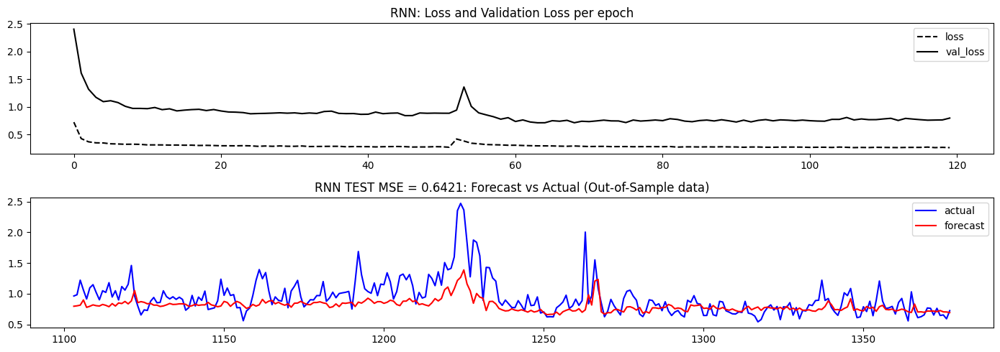

In [77]:

si_normal_rnn, history_normal_rnn = train_model_pt('RNN', **params_si)



## Inference simple RNN



## Inference sanity check first


In [78]:

model = si_normal_rnn


In [79]:


l_real, l_pred = inference_model_pt_2(model, model_type='RNN', **params_si)


0


In [80]:

l_real[:20]


[0.9630800273047798,
 0.98378829199744,
 1.2208307257867776,
 1.0601666819936835,
 0.9145106389945638,
 1.096306689299513,
 1.1471282138194072,
 1.019205839634076,
 0.9014426360042346,
 1.0485954160332076,
 1.021611559286487,
 1.1800714229221456,
 0.9466170094617548,
 1.0487394932487495,
 0.8986731943831988,
 1.1169999901401815,
 1.0589999774445755,
 1.1539999736232622,
 1.459963061047441,
 0.96425001560696]

In [81]:

l_pred[:20]


[array([0.8045052], dtype=float32),
 array([0.7900431], dtype=float32),
 array([0.7885342], dtype=float32),
 array([0.8780853], dtype=float32),
 array([0.80842507], dtype=float32),
 array([0.76006687], dtype=float32),
 array([0.8620952], dtype=float32),
 array([0.8772073], dtype=float32),
 array([0.80207926], dtype=float32),
 array([0.8262736], dtype=float32),
 array([0.8490416], dtype=float32),
 array([0.8301285], dtype=float32),
 array([0.9018758], dtype=float32),
 array([0.8352556], dtype=float32),
 array([0.8454085], dtype=float32),
 array([0.8190942], dtype=float32),
 array([0.847162], dtype=float32),
 array([0.80956155], dtype=float32),
 array([0.8879991], dtype=float32),
 array([1.0688796], dtype=float32)]

In [82]:

## plt.rcParams["figure.figsize"] = [14, 5] 


275


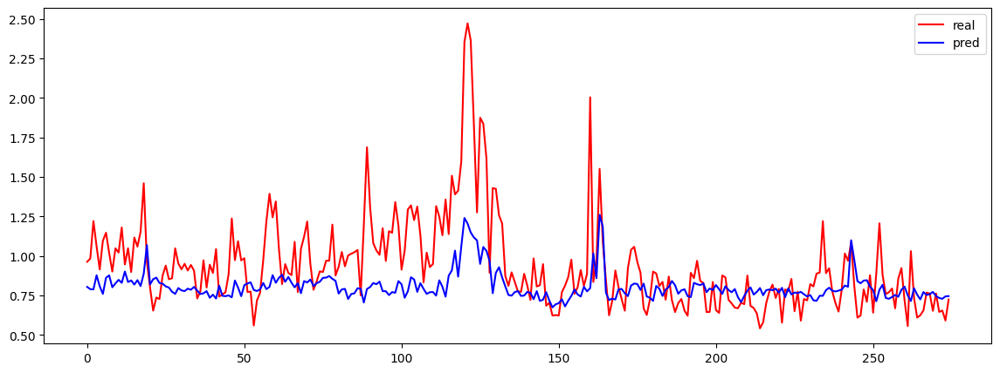

In [83]:


  
# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Now run actual INFERENCE to predict x vector and silicon together


In [84]:

model = si_normal_rnn


In [85]:

l_real, l_pred = inference_model_pt(model, model_type='RNN', **params_si)


0


In [86]:

l_real[:20]


[0.9630800273047798,
 0.98378829199744,
 1.2208307257867776,
 1.0601666819936835,
 0.9145106389945638,
 1.096306689299513,
 1.1471282138194072,
 1.019205839634076,
 0.9014426360042346,
 1.0485954160332076,
 1.021611559286487,
 1.1800714229221456,
 0.9466170094617548,
 1.0487394932487495,
 0.8986731943831988,
 1.1169999901401815,
 1.0589999774445755,
 1.1539999736232622,
 1.459963061047441,
 0.96425001560696]

In [87]:

l_pred[:20]


[array([0.8045052], dtype=float32),
 array([0.74977124], dtype=float32),
 array([0.7239195], dtype=float32),
 array([0.7080891], dtype=float32),
 array([0.72369814], dtype=float32),
 array([0.75809896], dtype=float32),
 array([0.7745574], dtype=float32),
 array([0.80152714], dtype=float32),
 array([0.82008725], dtype=float32),
 array([0.830023], dtype=float32),
 array([0.83247167], dtype=float32),
 array([0.8690826], dtype=float32),
 array([0.89093864], dtype=float32),
 array([0.89190584], dtype=float32),
 array([0.8860297], dtype=float32),
 array([0.8754015], dtype=float32),
 array([0.86416405], dtype=float32),
 array([0.8596789], dtype=float32),
 array([0.86422706], dtype=float32),
 array([0.8766385], dtype=float32)]

275


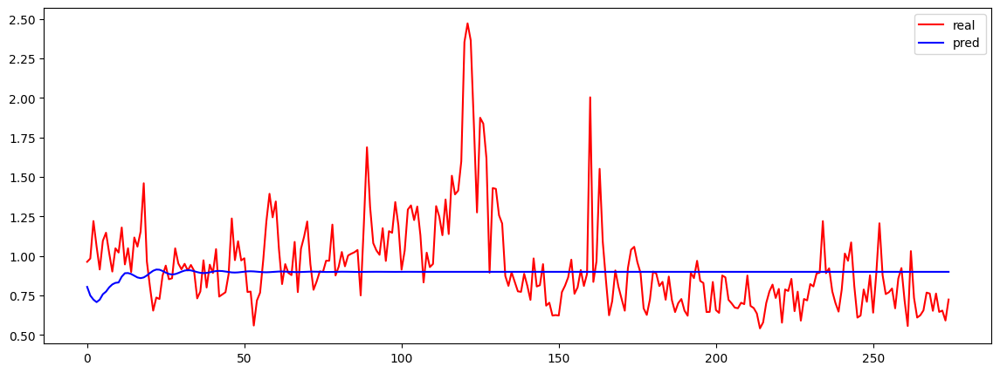

In [88]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Break up test set into test bins 

* example
* input is 30 (about 7.5 hours)
* predicts rest of week


In [89]:

model = si_normal_rnn


In [90]:

x_test, y_test   = params_si['test_data']

## l_real, l_pred = bins_inference_model_pt(model, x_test, y_test)




In [91]:

x_test.shape


torch.Size([275, 120])

In [92]:

bin_size = int( x_test.shape[0] / window )
bin_size 


55

In [93]:

318/ 30


10.6

In [94]:

bin_size = 20


In [95]:

l_new


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3',
 'cokerate_f4']

In [ ]:

for i in range(0, y_test.shape[0]- bin_size, bin_size):
    batch_x_test = x_test[i:i+bin_size, :]
    print( batch_x_test.shape )

    batch_y_test = y_test[i:i+bin_size, :]
    print( batch_y_test.shape )
    print("---------------")
    for jz in range( vector_n_out ):
        bins_inference_model_pt( model, batch_x_test, batch_y_test, jz, l_new[jz] )





## LSTM


In [98]:

class LSTM(nn.Module):
    def __init__(self, seq_length, input_size, output_size, n_features, n_layers):
        super(LSTM, self).__init__()
        self.n_layers   = n_layers
        self.hidden_dim = n_features
        self.output_size= output_size
        self.seq_length = seq_length
        self.input_size = input_size

        self.lstm    = nn.LSTM(input_size, n_features, n_layers, batch_first=False)
        self.dropout = nn.Dropout(0.2)
        self.fc      = nn.Linear(n_features, output_size)

        self.Attention  = SelfAttentionLayer( seq_length * input_size )    ## or n_features if after LSTM

        self.fc1     = nn.Linear(n_features, 40)
        self.relu    = nn.ReLU()
        self.fc2     = nn.Linear(40, output_size)
        
    def forward(self, x, hn):

        x2     = self.Attention(x)  
        x2     = x2[0]
        x = x2 + x

        x = x.view(-1, self.seq_length, self.input_size)
        x = x.permute(1, 0, 2)


       
        ## hn is a tuple here of (h0, c0)
        lstm_o, (hn, cn) = self.lstm(x, hn)
    
        lstm_o = self.dropout(lstm_o)

        hn = hn[-1, :, :]

        ## x     = self.Attention(hn)  
        ## x     = x[0]
        ## hn = hn + x

        
        ## output = self.fc( hn )
        
        output    = self.fc1( hn )
        output    = self.relu( output )
        output    = self.dropout(  output  )
        output    = self.fc2( output )
    
        ##                     batch_size, n_classes) 
        output  = output.view( -1,  self.output_size ) 
        
        return output, hn


    def init_hidden(self, batch_size_x_data):
        weight = next(self.parameters()).data
        hidden = ( weight.new(self.n_layers, 1, self.hidden_dim).zero_(),
                   weight.new(self.n_layers, 1, self.hidden_dim).zero_()   )
        N_batches_rc = batch_size_x_data    ## or is this the size of the x set ??
        hidden2 = ( torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim ),
                    torch.zeros( self.n_layers,   N_batches_rc,    self.hidden_dim )    )
        return hidden2


0/3000 - Loss:  0.719943106174469, val_loss: 2.3773674964904785
25/3000 - Loss:  0.42112311720848083, val_loss: 1.45060133934021
50/3000 - Loss:  0.36313948035240173, val_loss: 1.1778945922851562
75/3000 - Loss:  0.3414757549762726, val_loss: 1.141355037689209
100/3000 - Loss:  0.3298322260379791, val_loss: 1.076975703239441
125/3000 - Loss:  0.3221707344055176, val_loss: 1.054526925086975
150/3000 - Loss:  0.31719931960105896, val_loss: 0.9584551453590393
175/3000 - Loss:  0.3115377724170685, val_loss: 0.9366792440414429
200/3000 - Loss:  0.3053976595401764, val_loss: 0.936225175857544
225/3000 - Loss:  0.3037787675857544, val_loss: 0.9362781643867493
250/3000 - Loss:  0.30122309923171997, val_loss: 0.8745550513267517
275/3000 - Loss:  0.2988032400608063, val_loss: 0.8494544625282288
300/3000 - Loss:  0.2990742623806, val_loss: 0.8959307670593262
325/3000 - Loss:  0.29355674982070923, val_loss: 0.8443750143051147
350/3000 - Loss:  0.29284676909446716, val_loss: 0.8577384352684021
375/

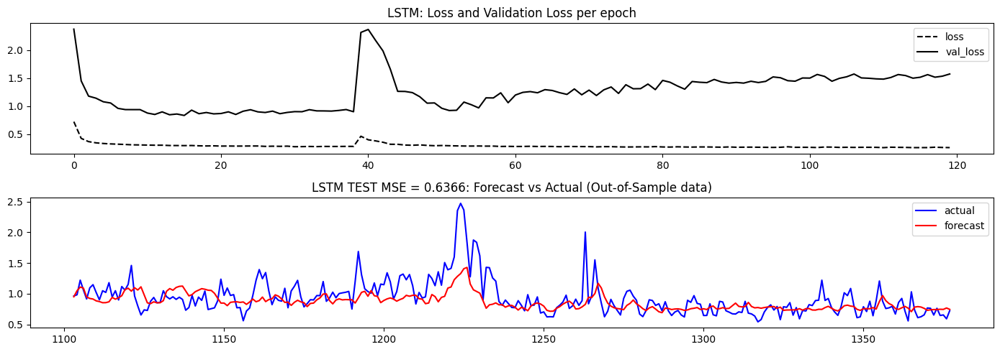

In [99]:

si_lstm, history_a_lstm = train_model_pt('LSTM', **params_si)



## LSTM Inference



## Inference sanity check first


In [100]:

model = si_lstm


In [101]:

l_real, l_pred = inference_model_pt_2(model, model_type='LSTM', **params_si)


0


In [103]:

l_real[:20]


[0.9630800273047798,
 0.98378829199744,
 1.2208307257867776,
 1.0601666819936835,
 0.9145106389945638,
 1.096306689299513,
 1.1471282138194072,
 1.019205839634076,
 0.9014426360042346,
 1.0485954160332076,
 1.021611559286487,
 1.1800714229221456,
 0.9466170094617548,
 1.0487394932487495,
 0.8986731943831988,
 1.1169999901401815,
 1.0589999774445755,
 1.1539999736232622,
 1.459963061047441,
 0.96425001560696]

In [104]:

l_pred[:20]


[array([1.0613235], dtype=float32),
 array([1.0377811], dtype=float32),
 array([0.9707072], dtype=float32),
 array([1.0038347], dtype=float32),
 array([0.89783585], dtype=float32),
 array([0.82602143], dtype=float32),
 array([0.8516937], dtype=float32),
 array([0.83854026], dtype=float32),
 array([0.8186615], dtype=float32),
 array([0.832932], dtype=float32),
 array([0.84868497], dtype=float32),
 array([0.86125135], dtype=float32),
 array([0.95610714], dtype=float32),
 array([0.90045935], dtype=float32),
 array([0.91971815], dtype=float32),
 array([0.91692543], dtype=float32),
 array([0.9958782], dtype=float32),
 array([0.9466693], dtype=float32),
 array([0.9219692], dtype=float32),
 array([1.0174121], dtype=float32)]

275


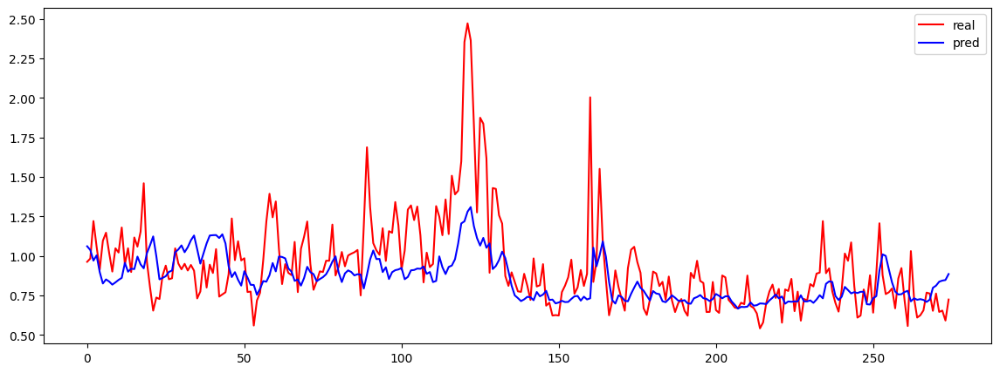

In [105]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Now run actual INFERENCE to predict x vector and silicon together


In [106]:

model = si_lstm


In [107]:

l_real, l_pred = inference_model_pt(model, model_type='LSTM', **params_si)


0


In [108]:

l_real[:50]


[0.9630800273047798,
 0.98378829199744,
 1.2208307257867776,
 1.0601666819936835,
 0.9145106389945638,
 1.096306689299513,
 1.1471282138194072,
 1.019205839634076,
 0.9014426360042346,
 1.0485954160332076,
 1.021611559286487,
 1.1800714229221456,
 0.9466170094617548,
 1.0487394932487495,
 0.8986731943831988,
 1.1169999901401815,
 1.0589999774445755,
 1.1539999736232622,
 1.459963061047441,
 0.96425001560696,
 0.801413847341183,
 0.6541764783769621,
 0.7371185332744226,
 0.7278170817408631,
 0.8769224761878993,
 0.9390000110763491,
 0.8527525969632564,
 0.8589317398186438,
 1.0482456521397214,
 0.9525810800882323,
 0.9158200185354637,
 0.9503839161485412,
 0.9080000129942244,
 0.9431447091349661,
 0.9069230771099127,
 0.7316078381290521,
 0.7755384850114699,
 0.9726199962483455,
 0.8004740684857498,
 0.9449705846216954,
 0.8923706839885343,
 1.0432205717240468,
 0.743052050720141,
 0.7566666813201011,
 0.7704999976370823,
 0.8849999903477125,
 1.2372499806514883,
 0.9736666908404534,
 1

In [109]:

l_pred[:500]


[array([1.0613235], dtype=float32),
 array([1.0867157], dtype=float32),
 array([1.0547296], dtype=float32),
 array([0.9383521], dtype=float32),
 array([0.83289075], dtype=float32),
 array([0.7898131], dtype=float32),
 array([0.76565135], dtype=float32),
 array([0.7499159], dtype=float32),
 array([0.7396142], dtype=float32),
 array([0.7272185], dtype=float32),
 array([0.7243874], dtype=float32),
 array([0.75810677], dtype=float32),
 array([0.77373326], dtype=float32),
 array([0.7855498], dtype=float32),
 array([0.78321755], dtype=float32),
 array([0.75891423], dtype=float32),
 array([0.7251269], dtype=float32),
 array([0.69269013], dtype=float32),
 array([0.67883825], dtype=float32),
 array([0.6690855], dtype=float32),
 array([0.66406214], dtype=float32),
 array([0.6633409], dtype=float32),
 array([0.6635895], dtype=float32),
 array([0.66406643], dtype=float32),
 array([0.66382456], dtype=float32),
 array([0.6608709], dtype=float32),
 array([0.6571462], dtype=float32),
 array([0.6564463

275


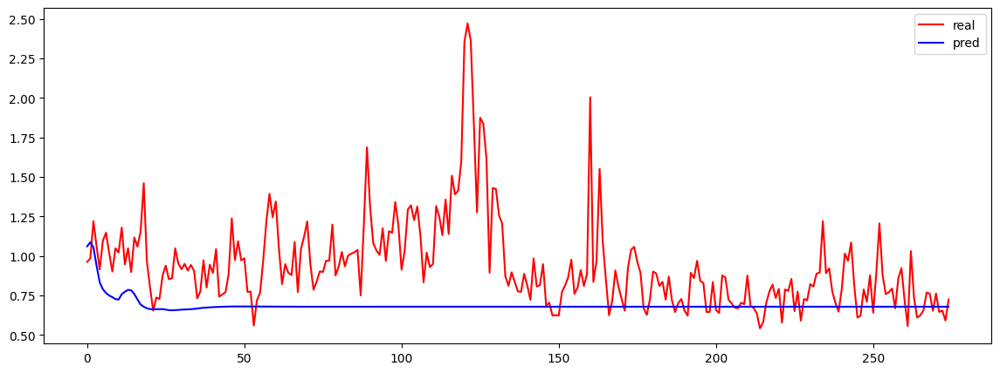

In [110]:

# create data 
x = [ i for i in range(len(l_real)) ] 
print(len(x))
  
# plot lines 

plt.plot(x, l_real, label = "real", color='red') 
plt.plot(x, l_pred, label = "pred", color='blue') 
plt.legend() 
plt.show()



## Break up test set into test bins 

* example
* input is 30 (about 7.5 hours)
* predicts rest of week


In [111]:

model = si_lstm


In [112]:


x_test, y_test   = params_si['test_data']

## l_real, l_pred = bins_inference_model_pt(model, x_test, y_test)



In [113]:

x_test.shape


torch.Size([275, 120])

In [114]:

bin_size = int( x_test.shape[0] / window )
bin_size 


55

In [115]:

bin_size = 20


torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0973
20


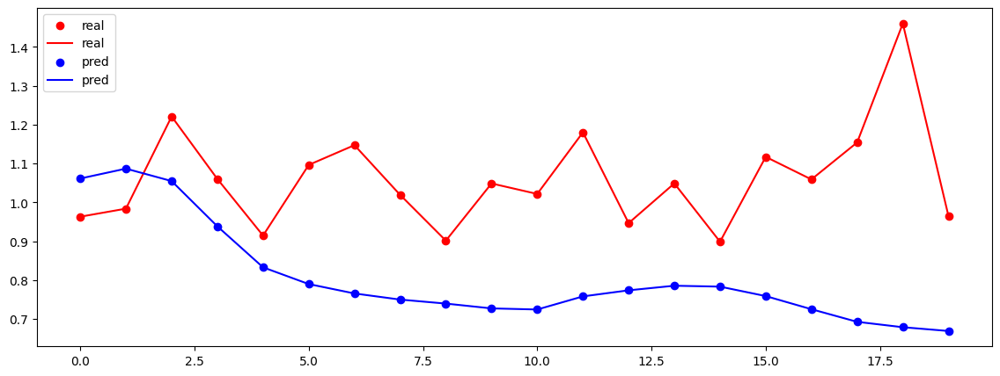

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0010
20


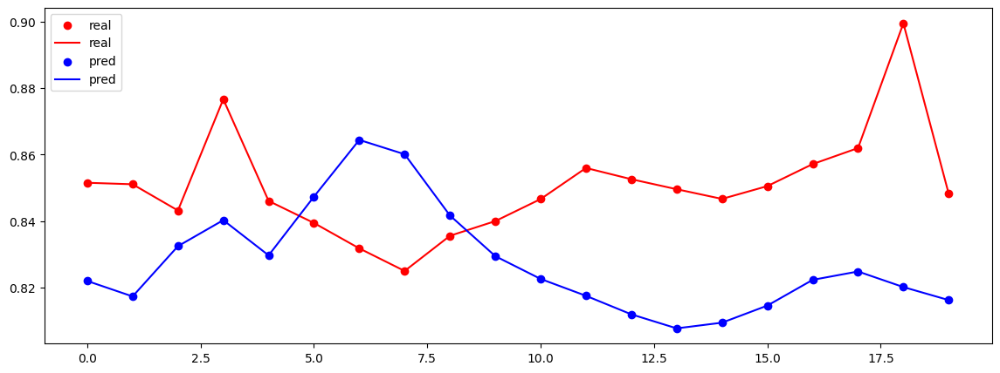

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0041
20


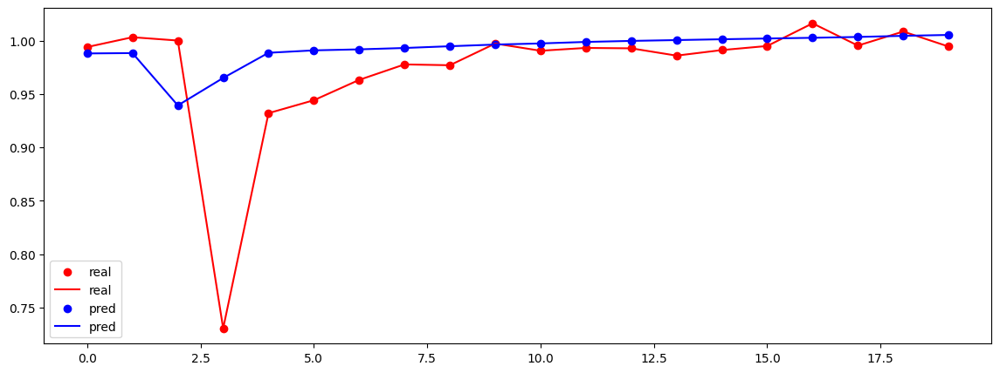

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0645
20


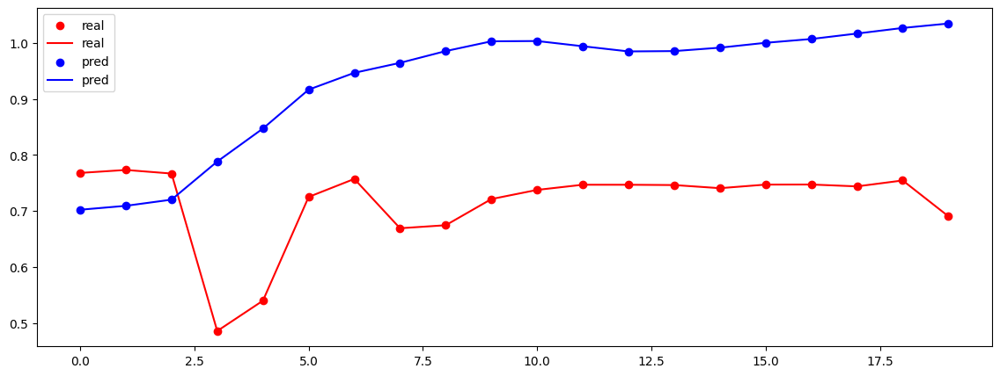

0
WINDRATE_f3
Test MSE Loss: 0.2402
20


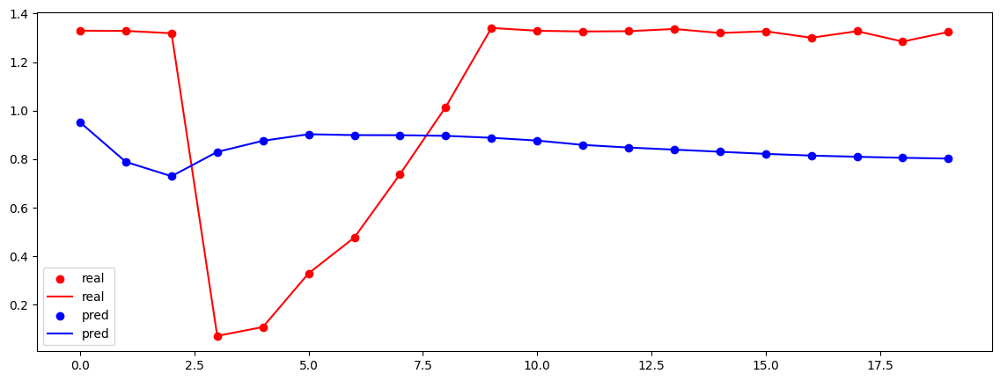

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0006
20


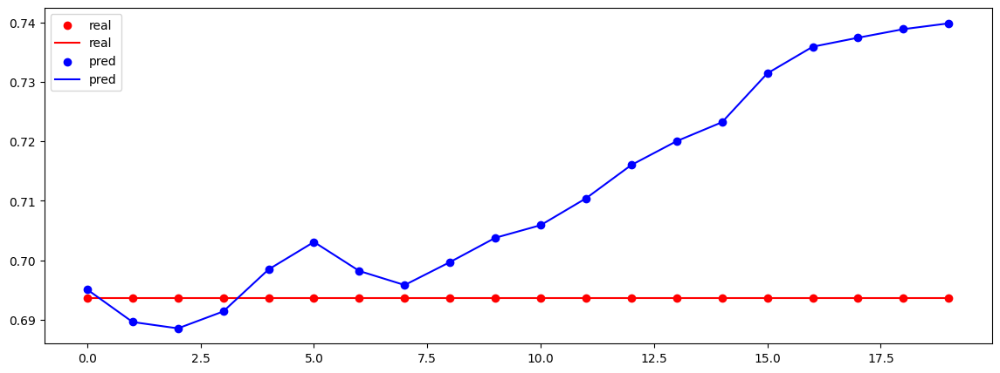

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


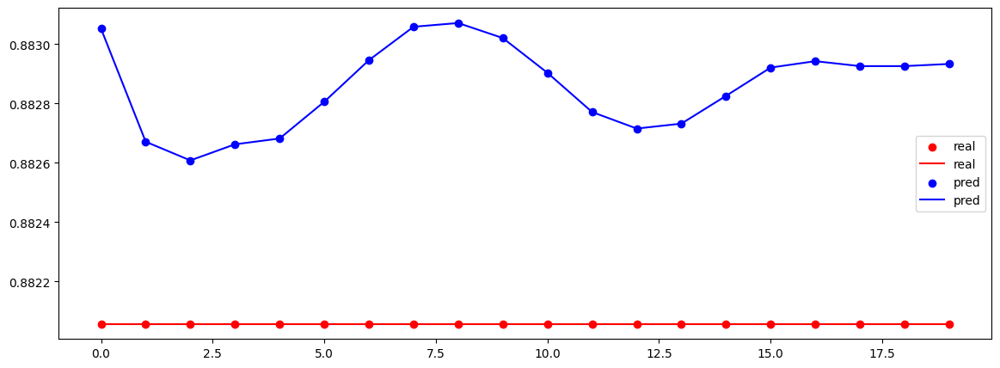

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0265
20


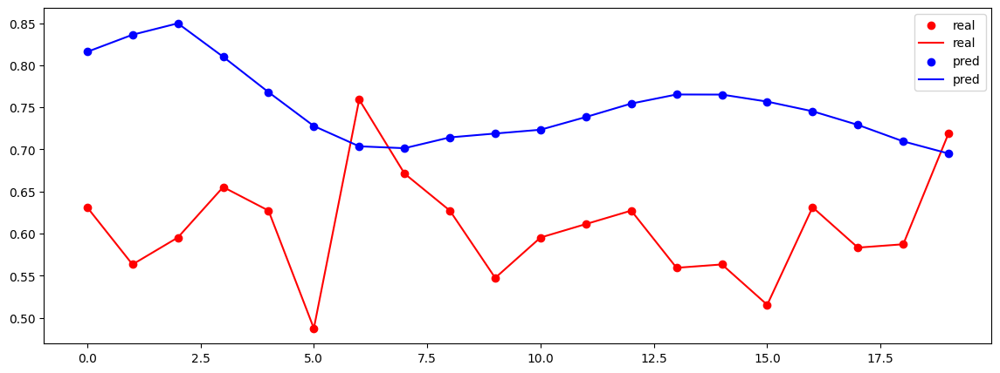

0
Slag_Fe_f2
Test MSE Loss: 0.2026
20


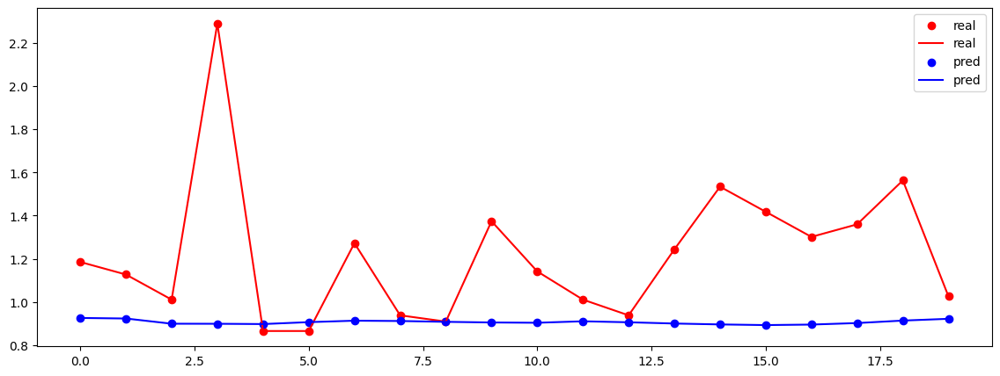

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1357
20


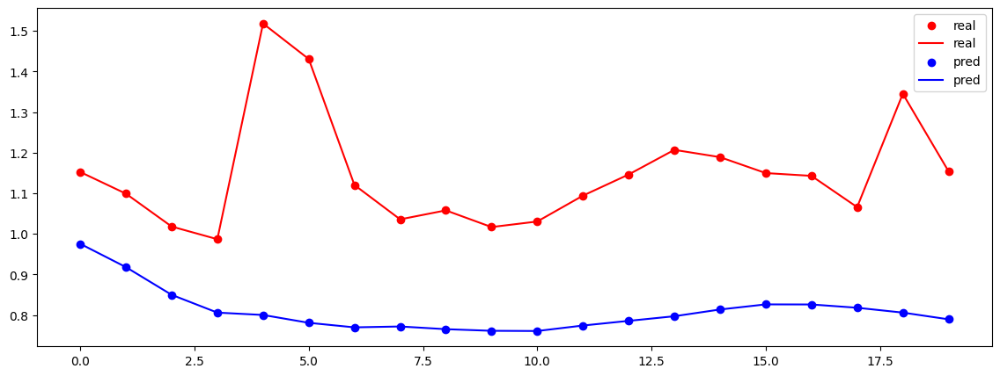

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.1674
20


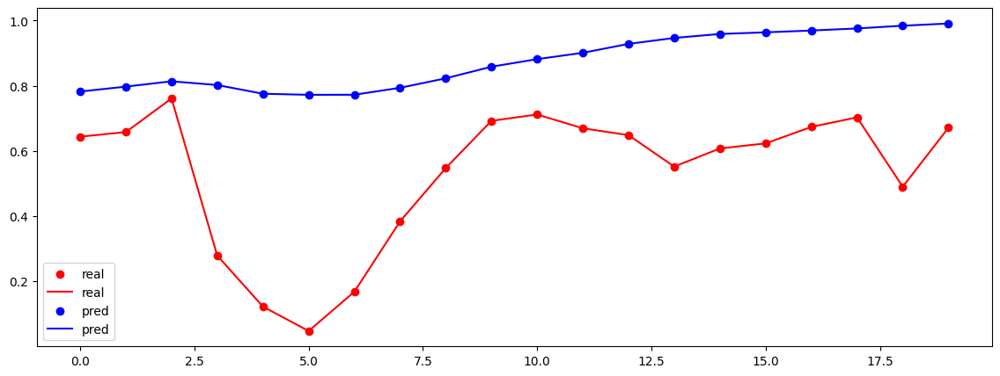

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0619
20


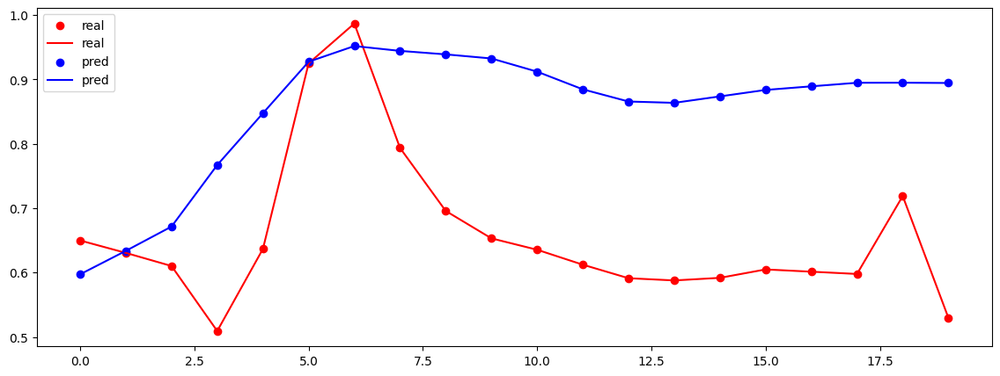

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0293
20


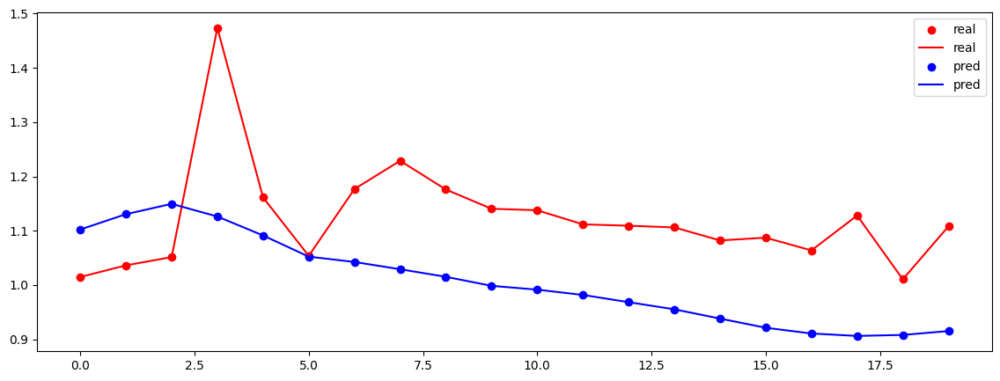

0
NE_Uptake_f3
Test MSE Loss: 0.0123
20


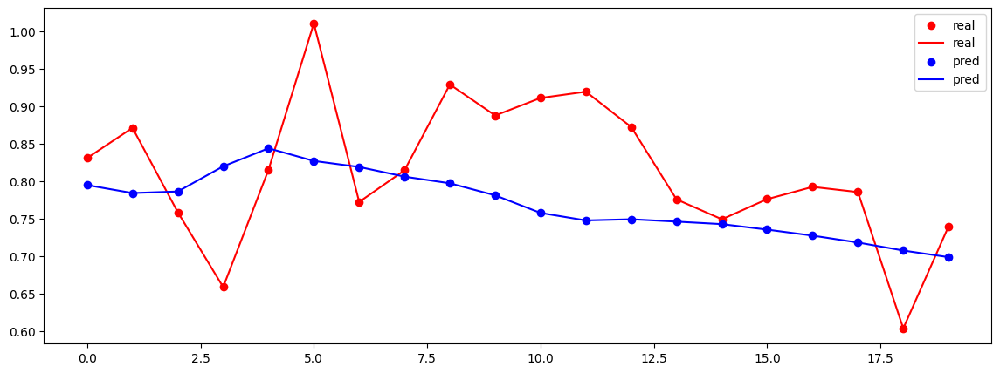

0
SE_Uptake_f3
Test MSE Loss: 0.0457
20


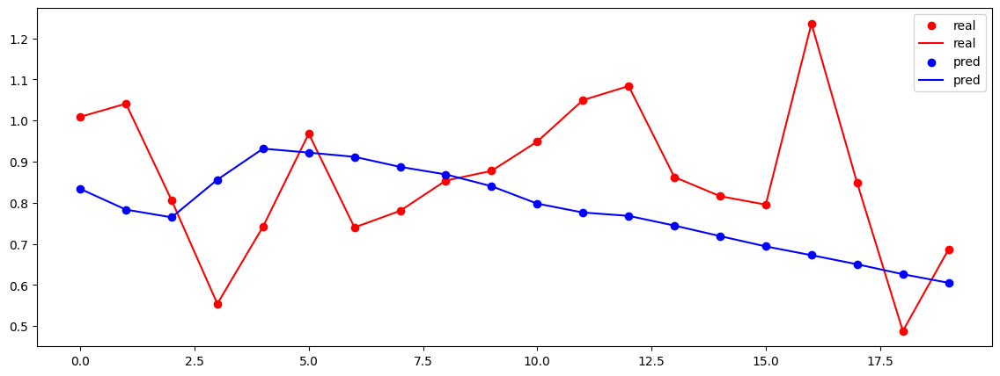

0
NW_Uptake_f3
Test MSE Loss: 0.0113
20


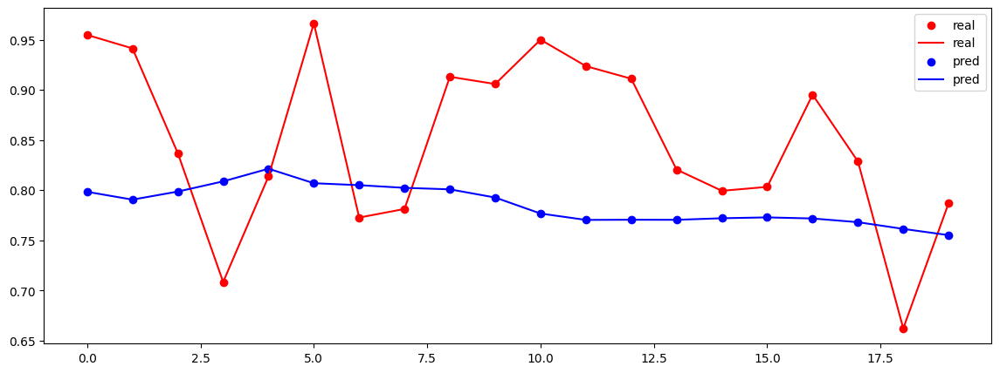

0
SW_Uptake_f3
Test MSE Loss: 0.0300
20


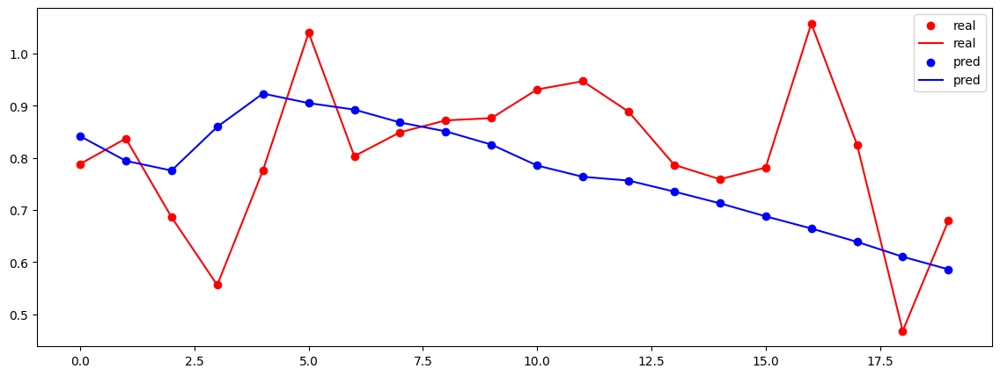

0
Slag_SiO2_f2
Test MSE Loss: 0.0409
20


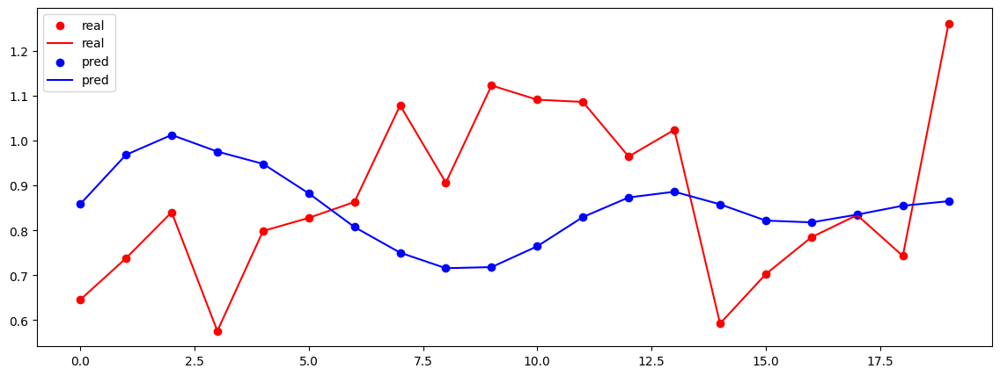

0
Slag_CaO_f2
Test MSE Loss: 0.0901
20


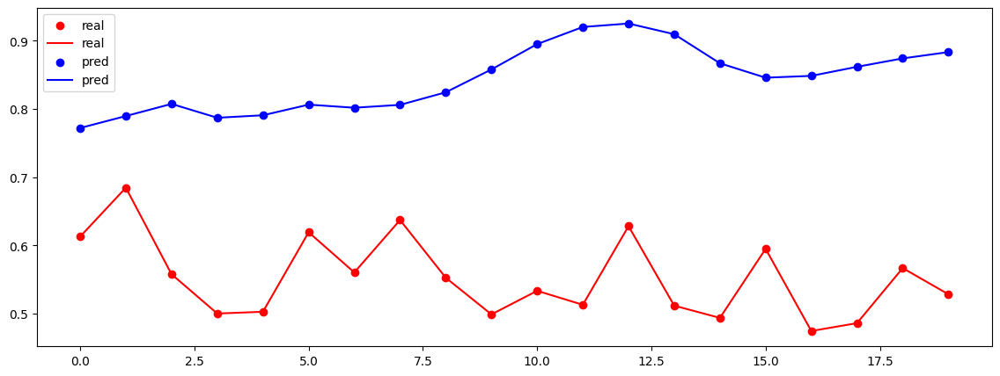

0
Slag_MgO_f2
Test MSE Loss: 0.0234
20


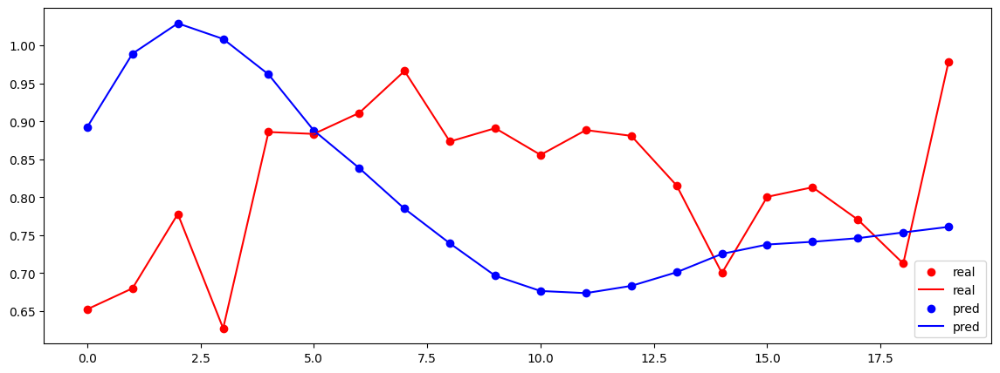

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0362
20


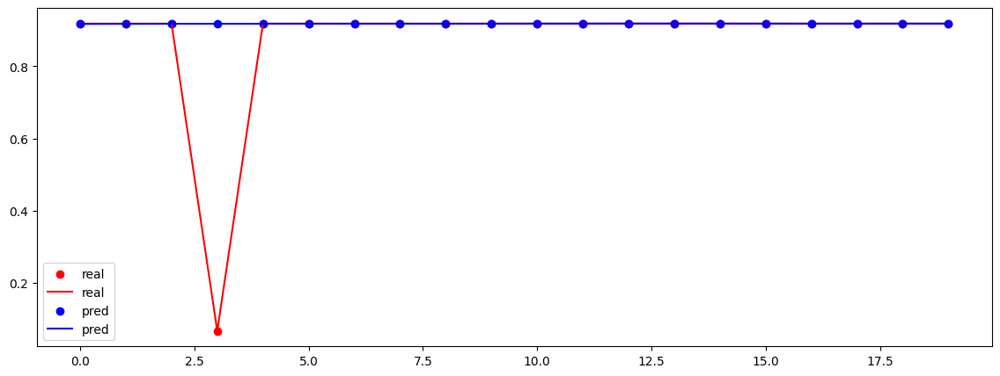

0
TOP_PRESS_f3
Test MSE Loss: 0.2080
20


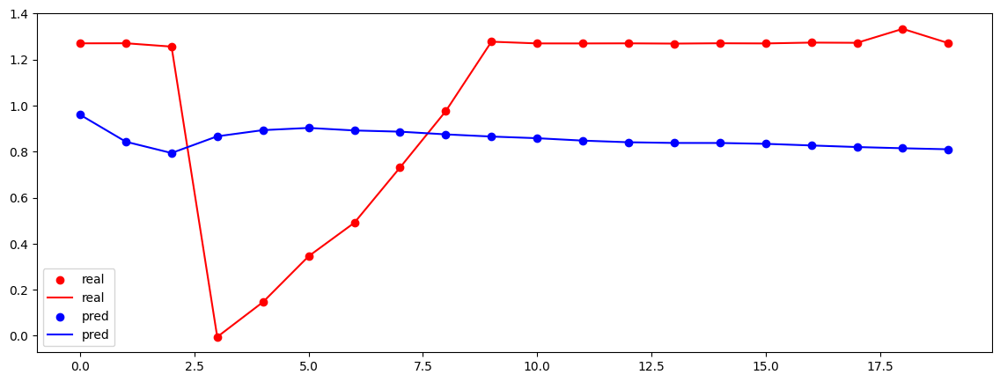

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.1621
20


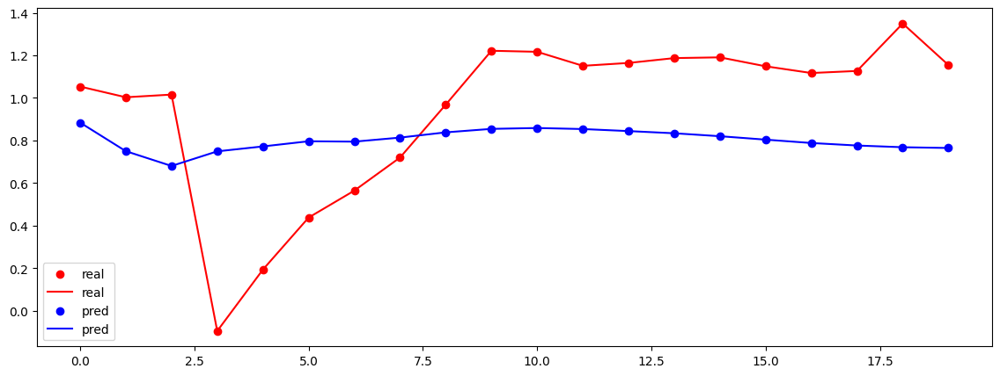

0
cokerate_f4
Test MSE Loss: 0.0092
20


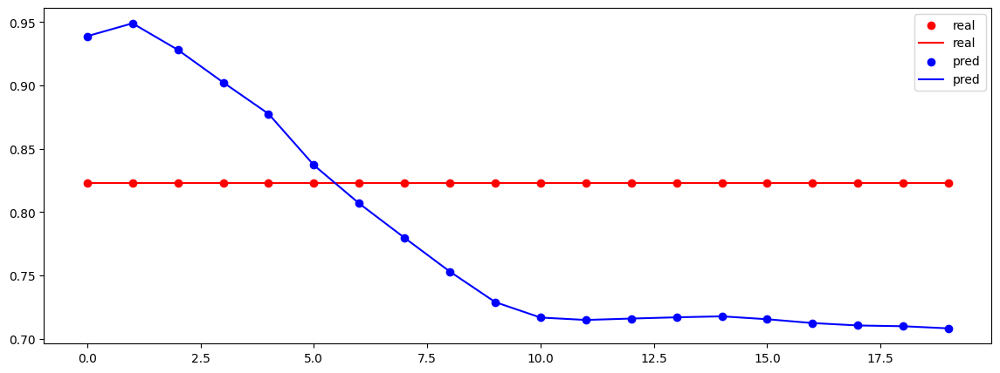

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0196
20


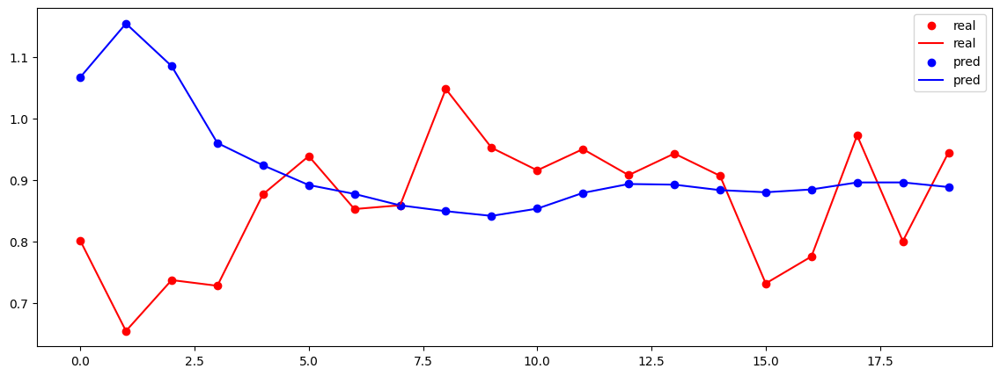

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0053
20


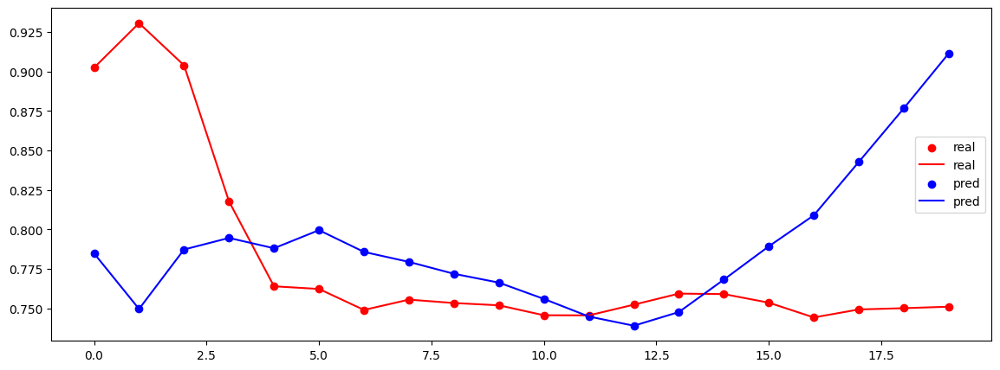

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0001
20


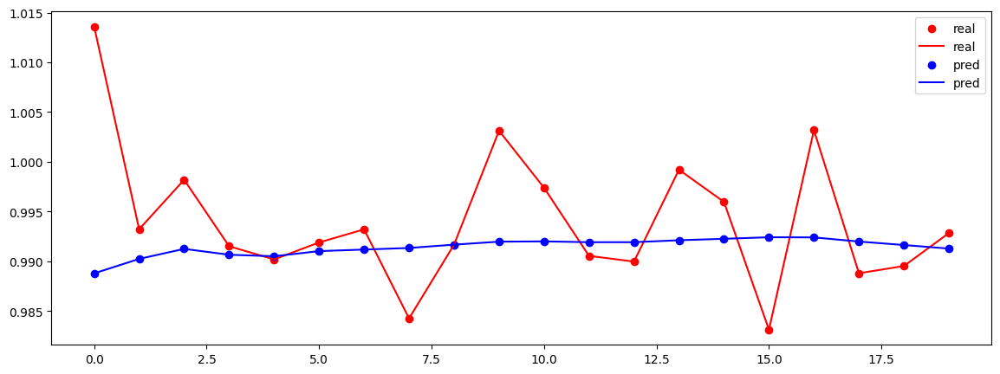

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0431
20


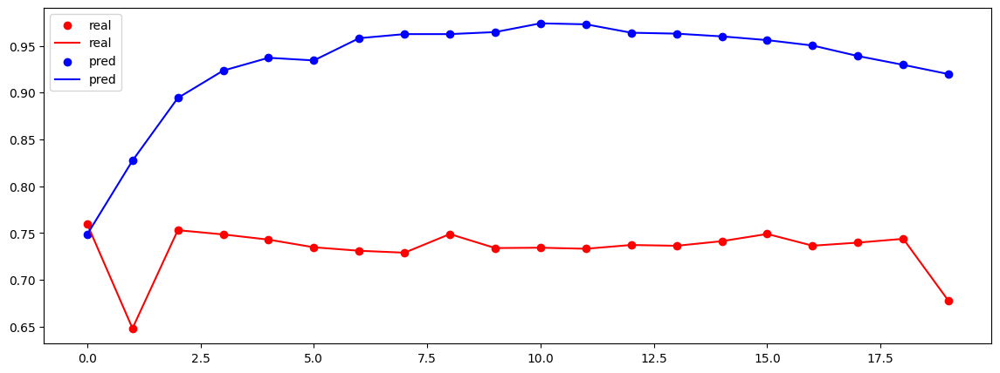

0
WINDRATE_f3
Test MSE Loss: 0.0437
20


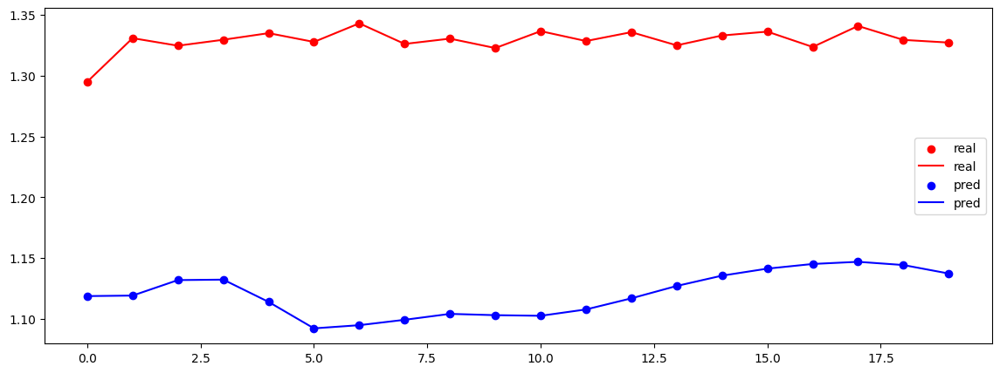

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0000
20


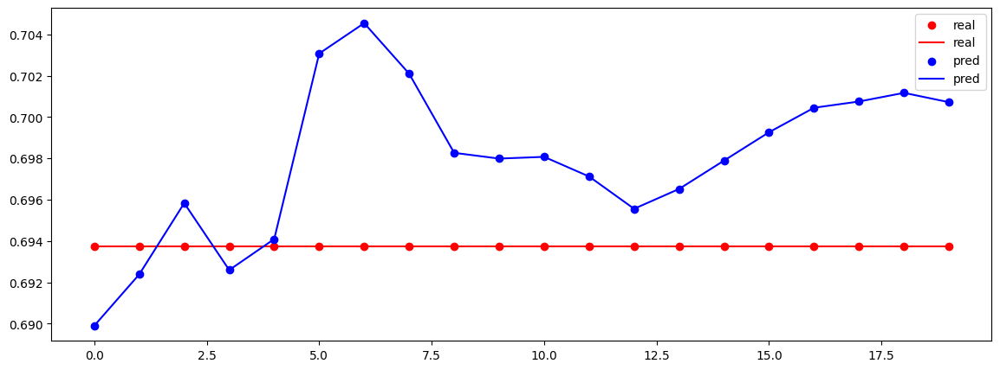

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


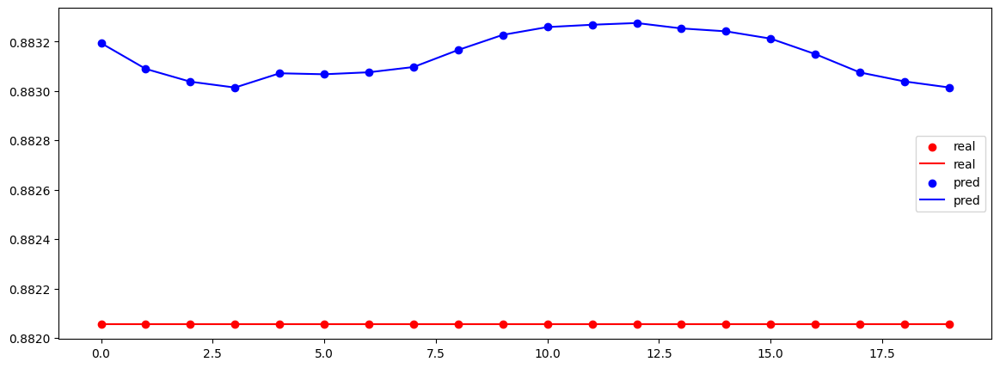

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0890
20


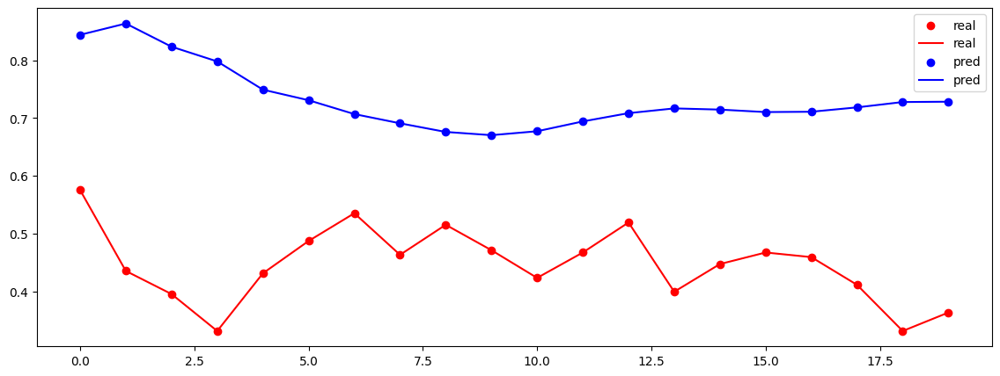

0
Slag_Fe_f2
Test MSE Loss: 0.3481
20


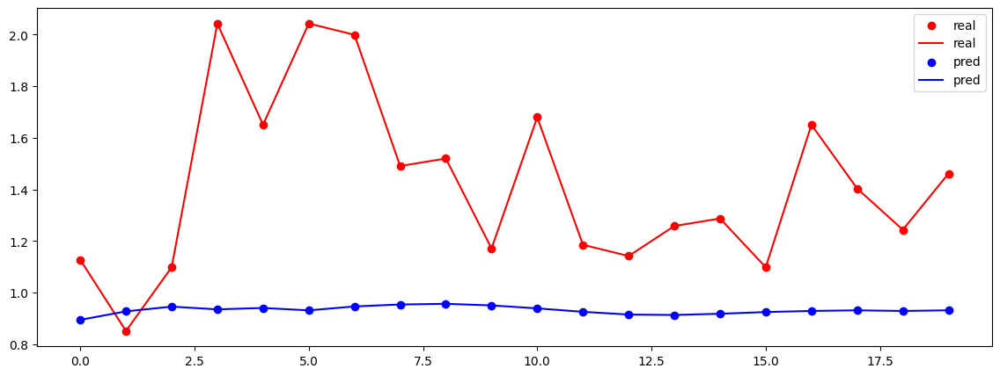

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1031
20


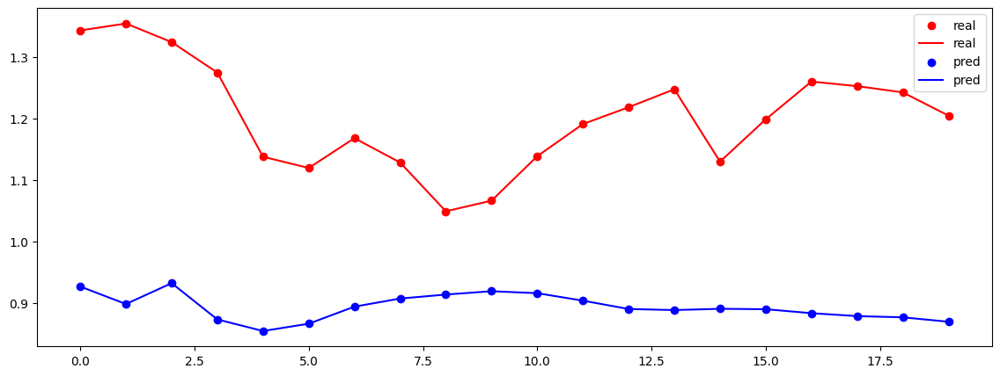

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0581
20


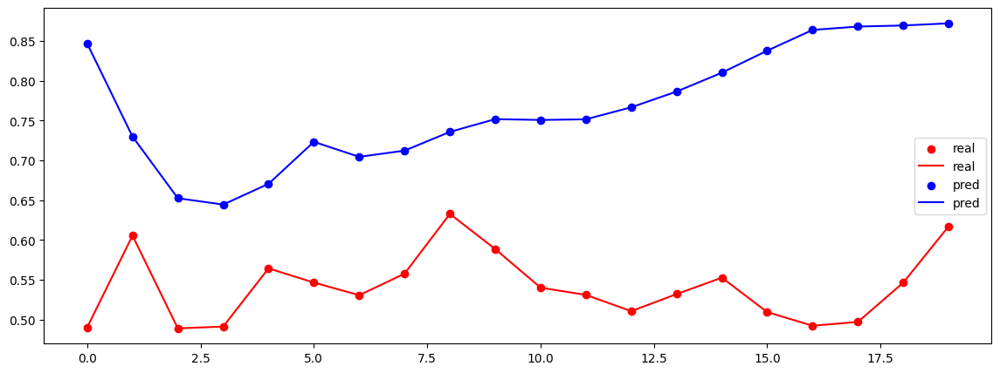

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0712
20


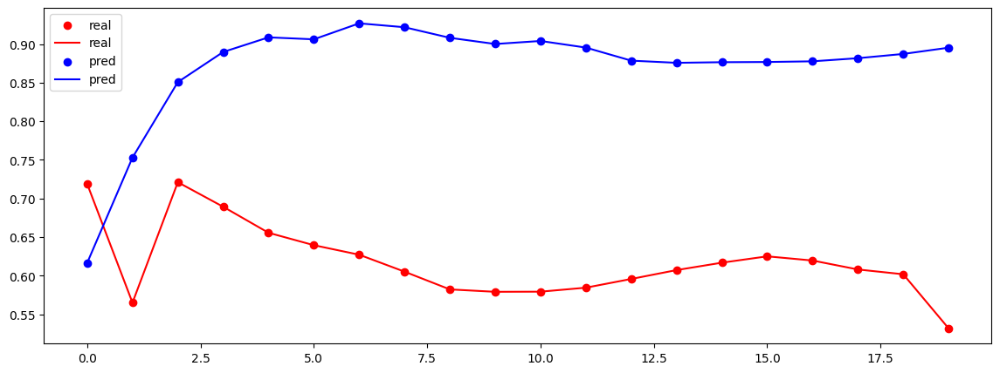

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0091
20


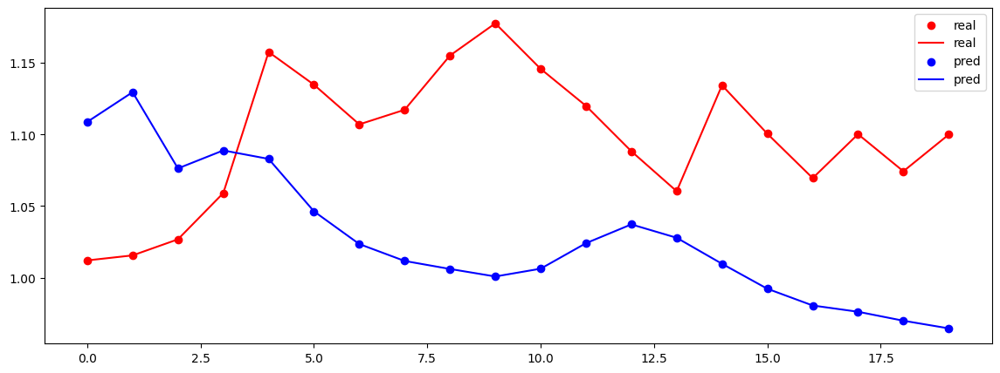

0
NE_Uptake_f3
Test MSE Loss: 0.0038
20


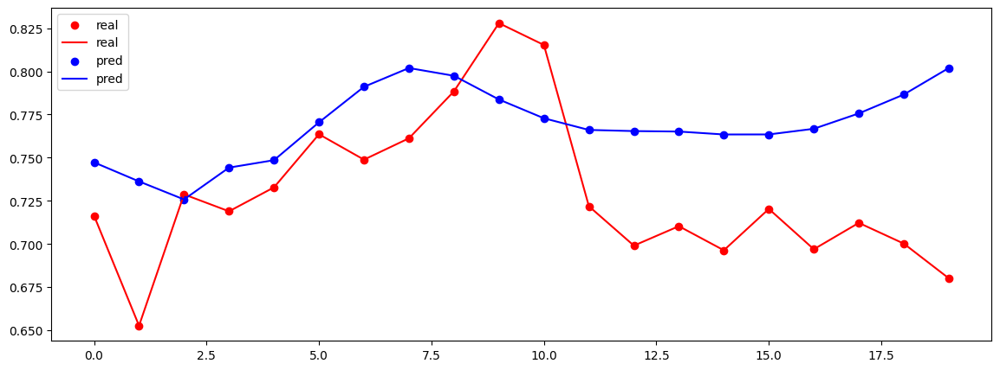

0
SE_Uptake_f3
Test MSE Loss: 0.0138
20


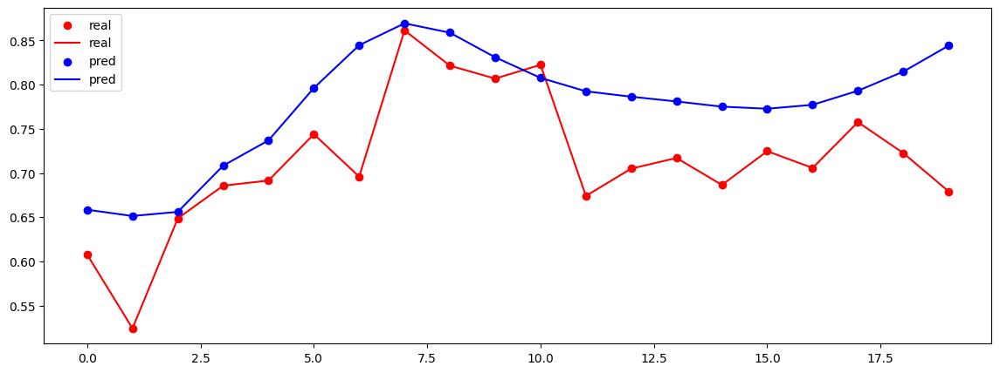

0
NW_Uptake_f3
Test MSE Loss: 0.0023
20


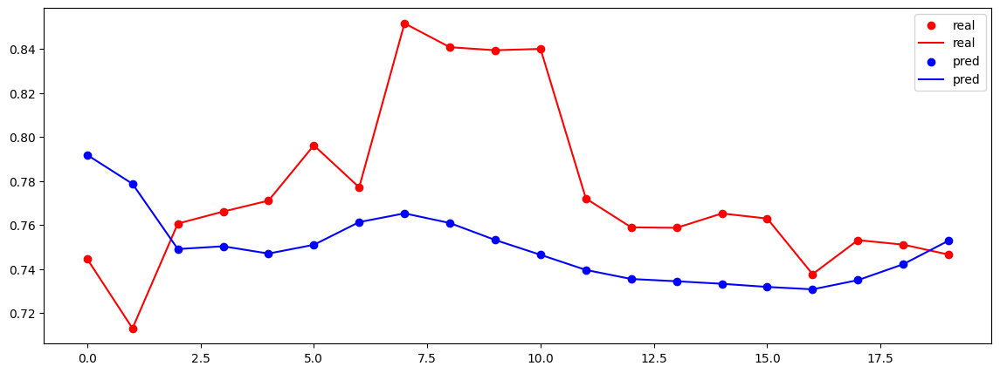

0
SW_Uptake_f3
Test MSE Loss: 0.0168
20


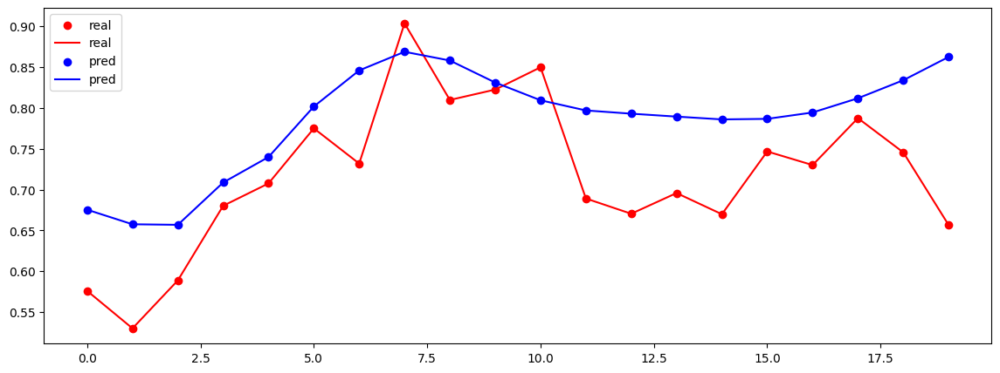

0
Slag_SiO2_f2
Test MSE Loss: 0.0317
20


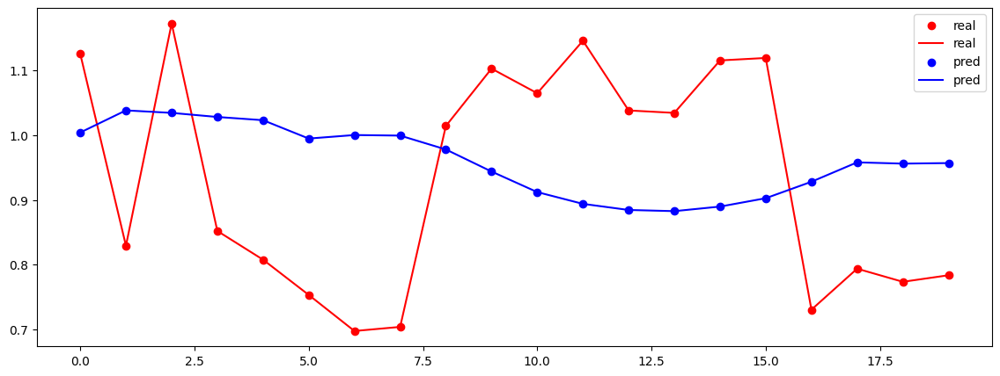

0
Slag_CaO_f2
Test MSE Loss: 0.0989
20


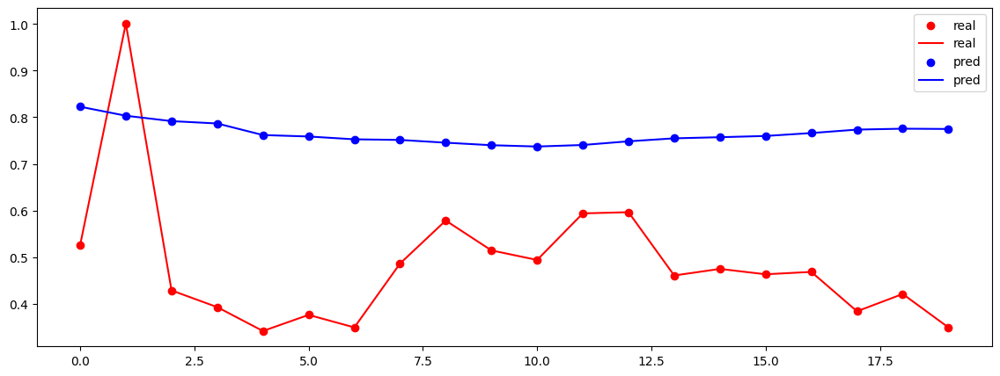

0
Slag_MgO_f2
Test MSE Loss: 0.0864
20


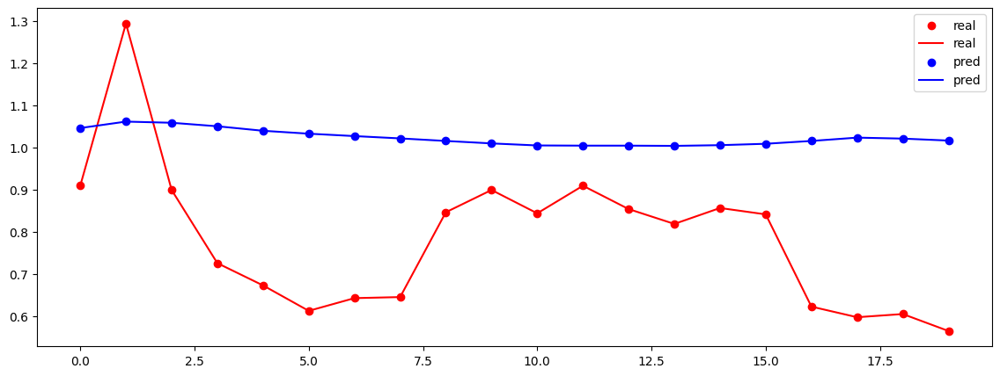

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


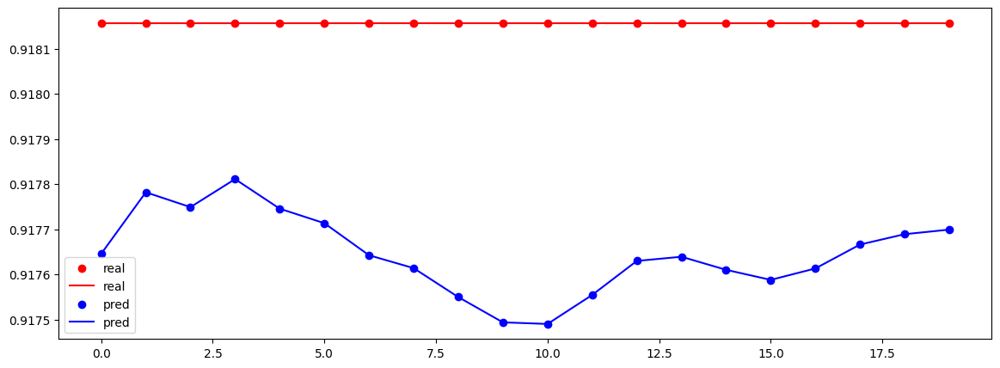

0
TOP_PRESS_f3
Test MSE Loss: 0.0311
20


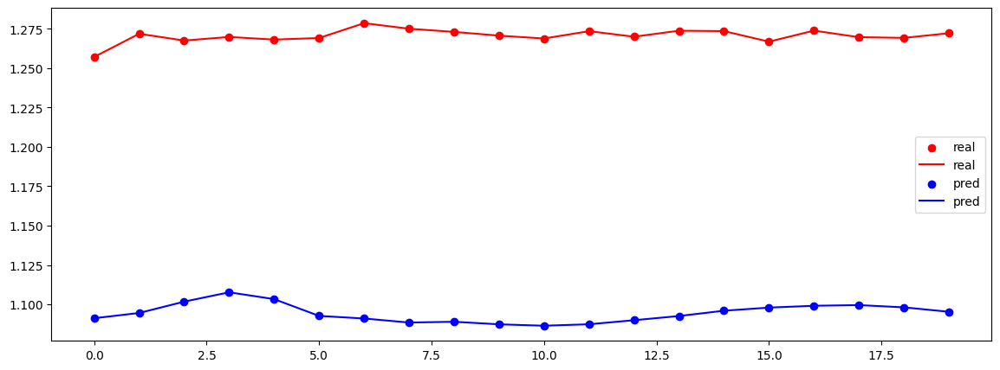

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0853
20


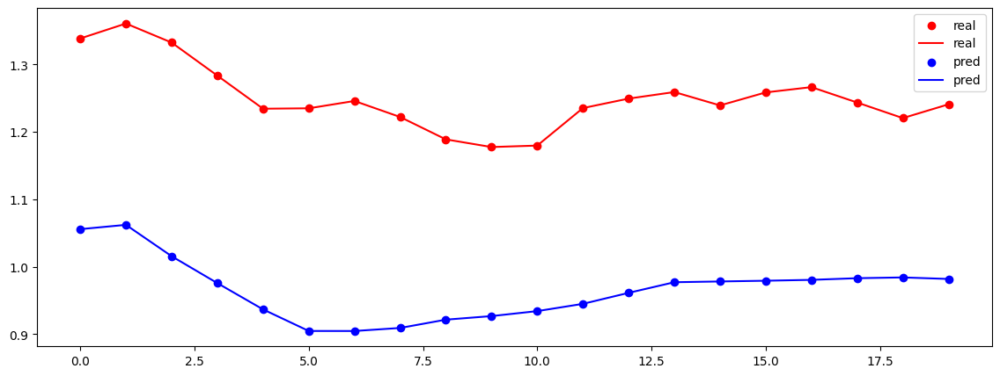

0
cokerate_f4
Test MSE Loss: 0.0139
20


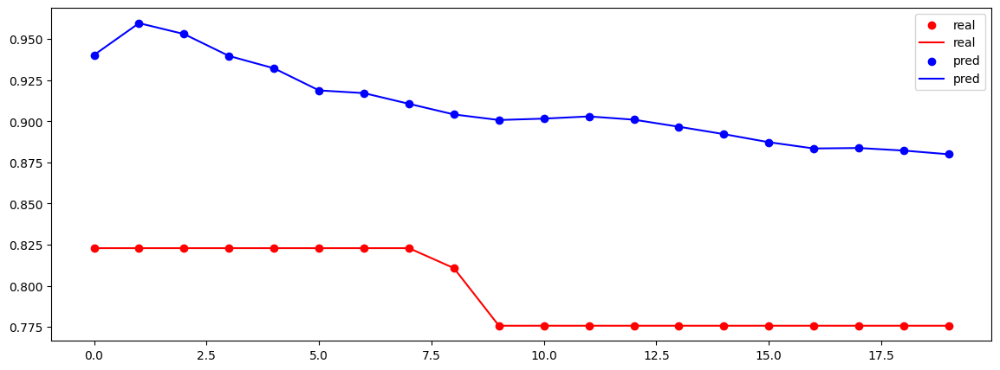

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0808
20


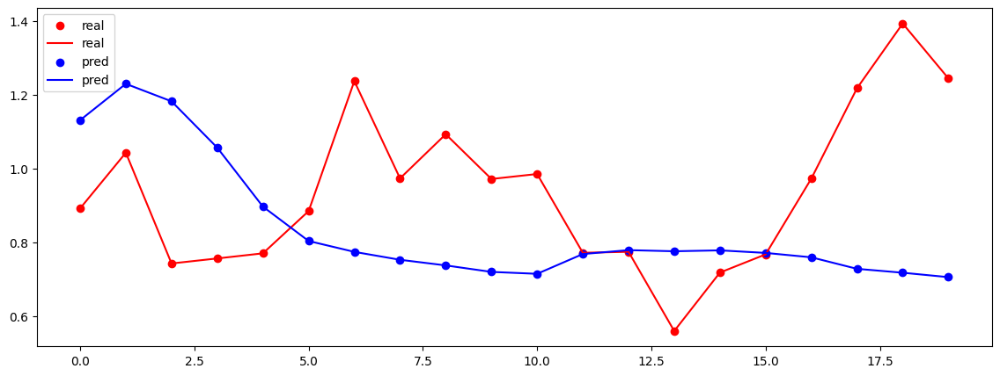

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0033
20


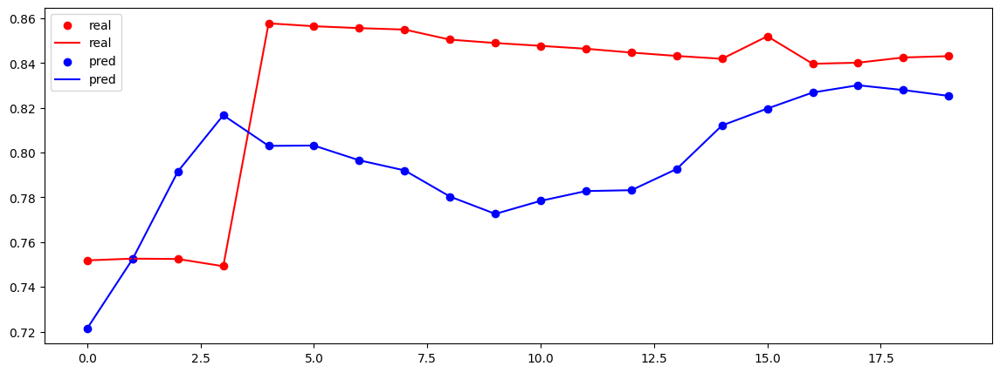

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0014
20


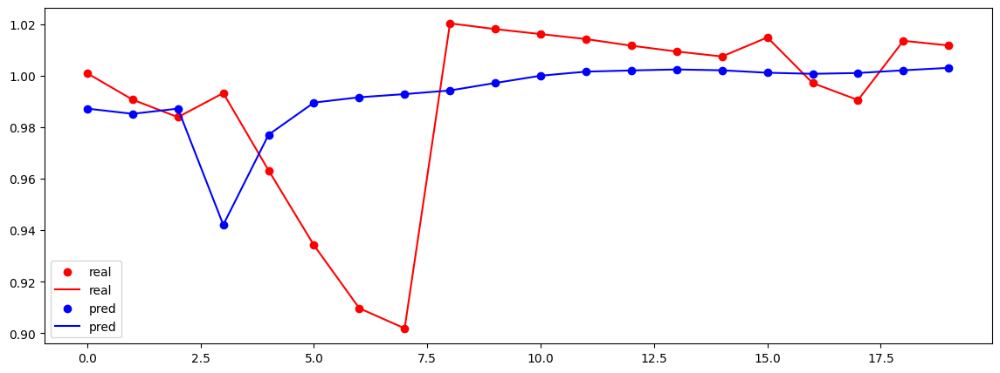

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0280
20


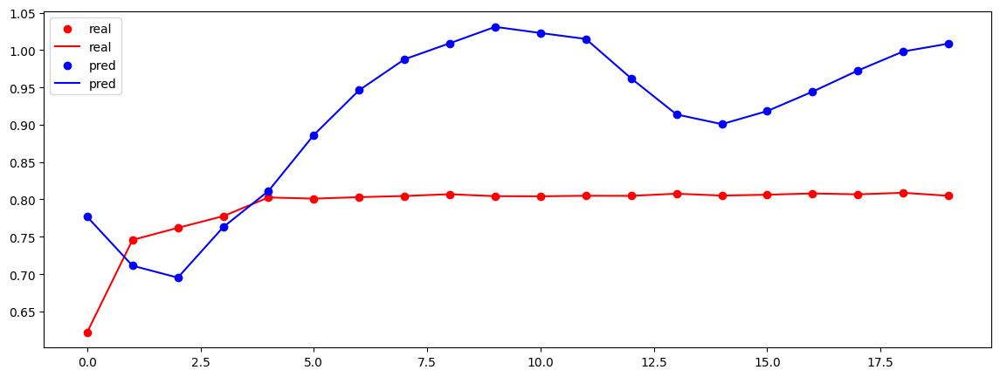

0
WINDRATE_f3
Test MSE Loss: 0.0768
20


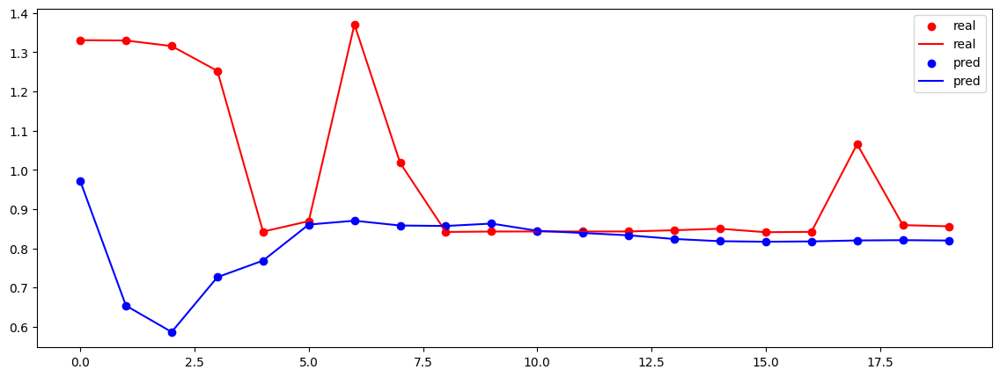

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0003
20


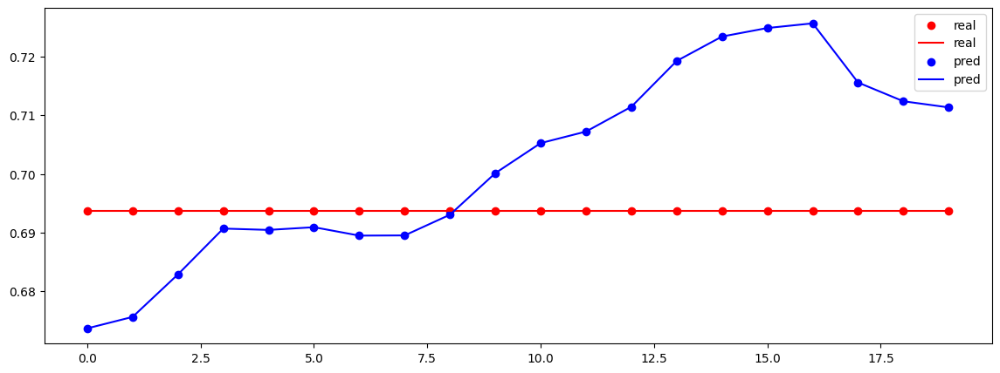

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


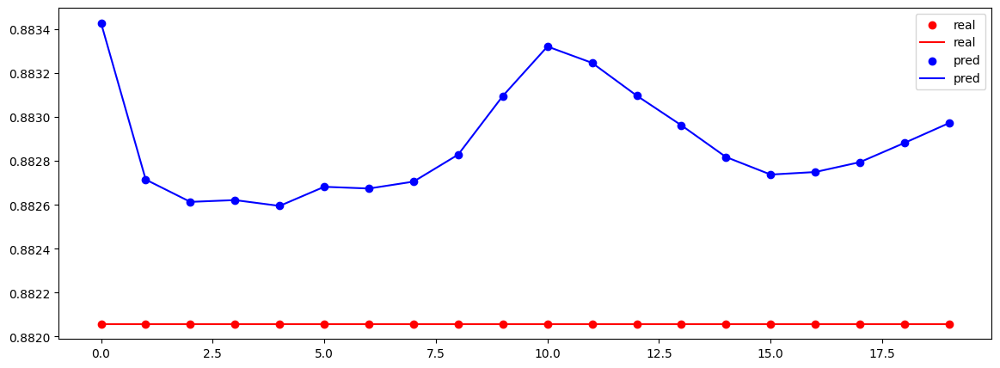

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0482
20


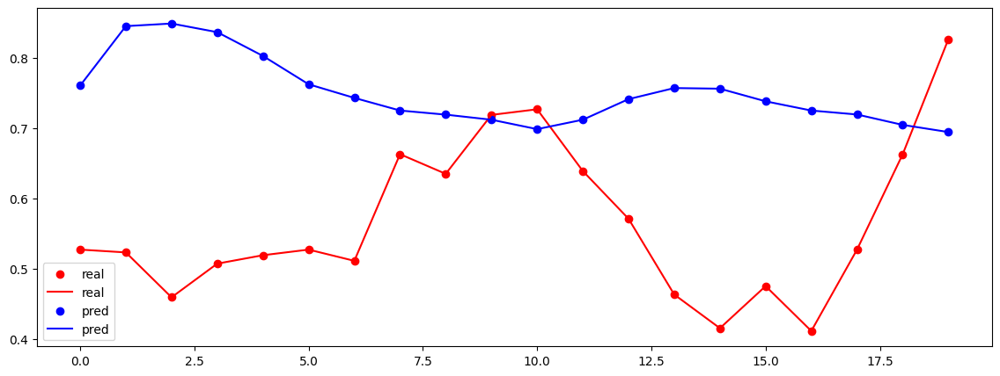

0
Slag_Fe_f2
Test MSE Loss: 0.4944
20


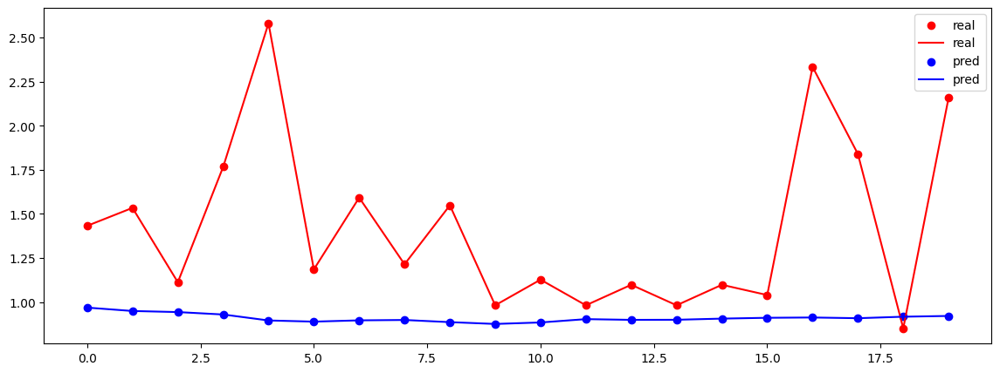

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1625
20


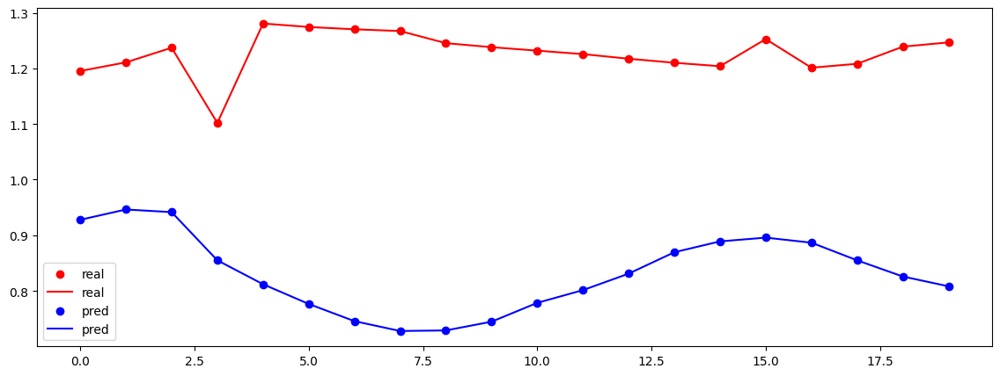

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0809
20


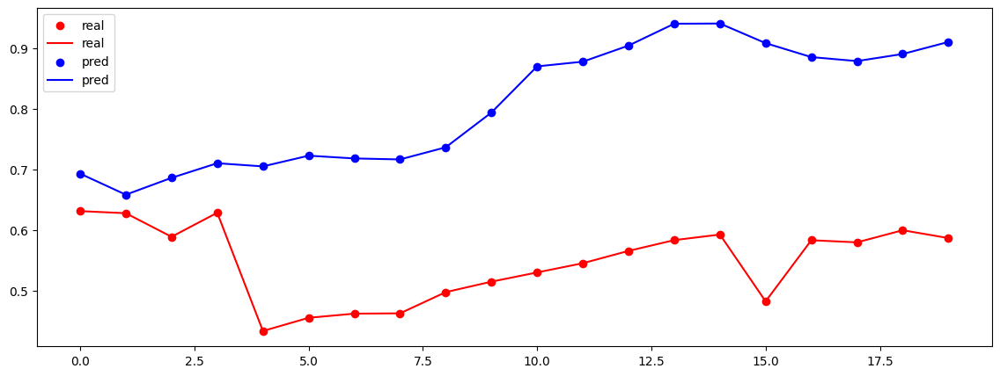

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0330
20


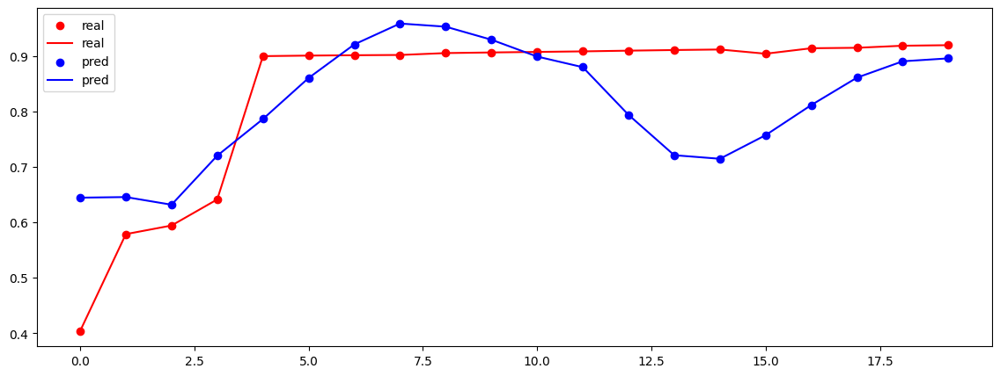

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0113
20


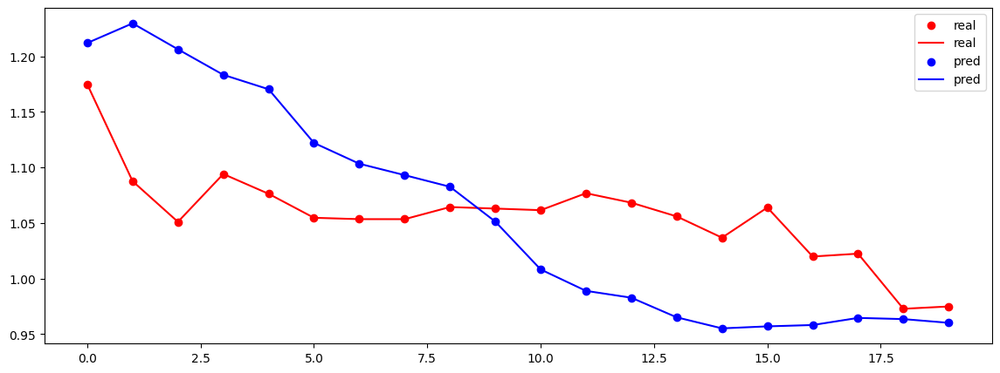

0
NE_Uptake_f3
Test MSE Loss: 0.0113
20


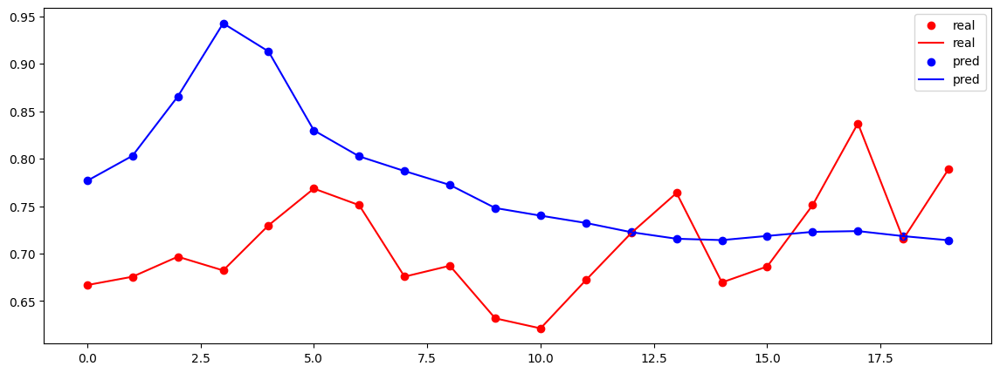

0
SE_Uptake_f3
Test MSE Loss: 0.0305
20


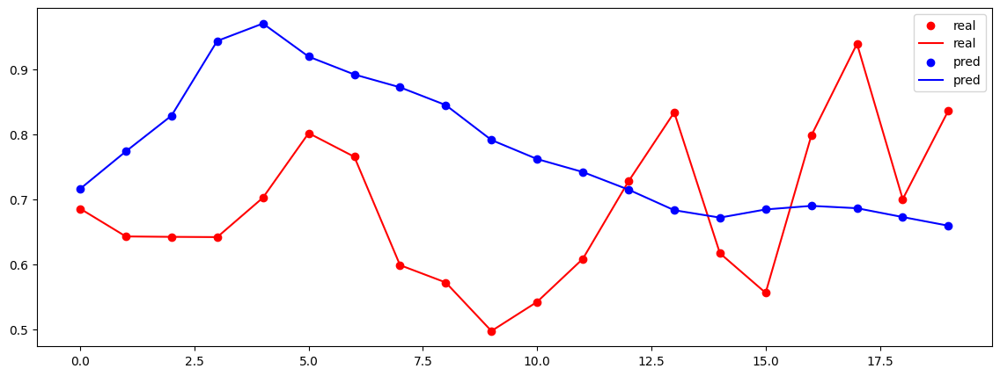

0
NW_Uptake_f3
Test MSE Loss: 0.0069
20


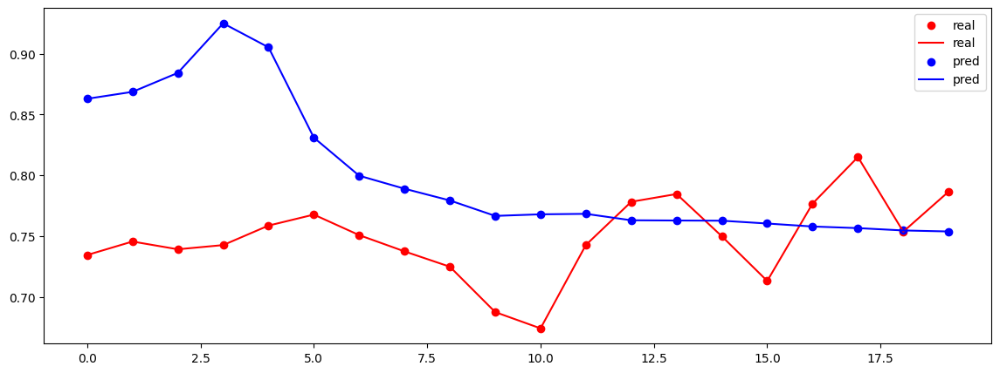

0
SW_Uptake_f3
Test MSE Loss: 0.0262
20


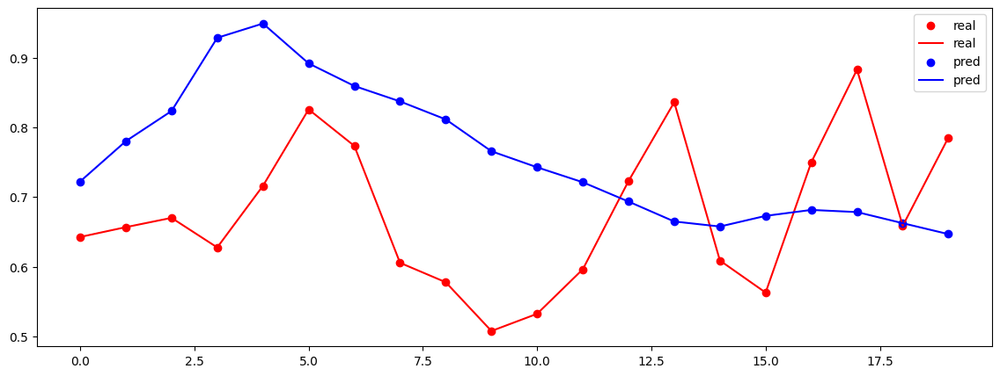

0
Slag_SiO2_f2
Test MSE Loss: 0.1083
20


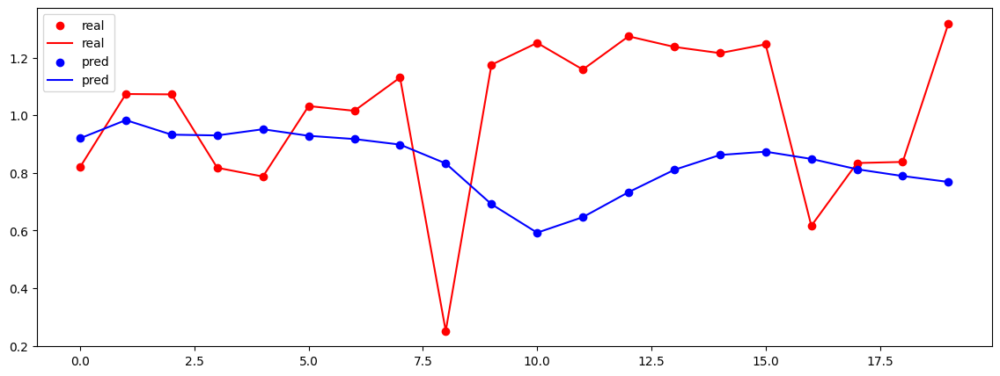

0
Slag_CaO_f2
Test MSE Loss: 0.1847
20


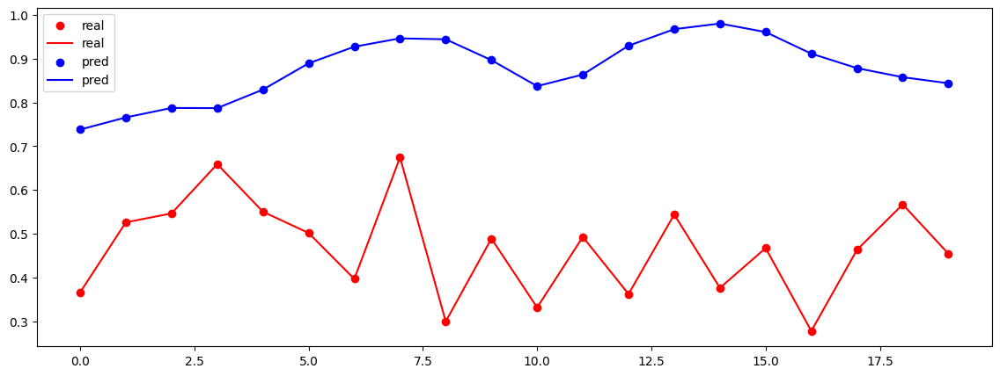

0
Slag_MgO_f2
Test MSE Loss: 0.0471
20


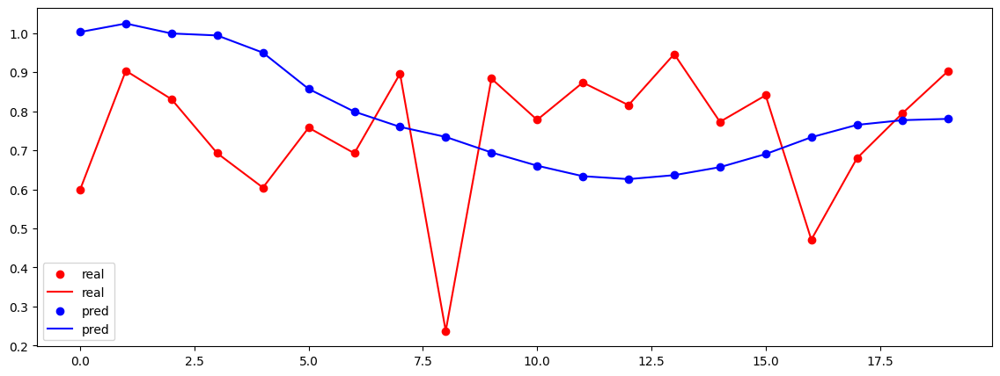

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


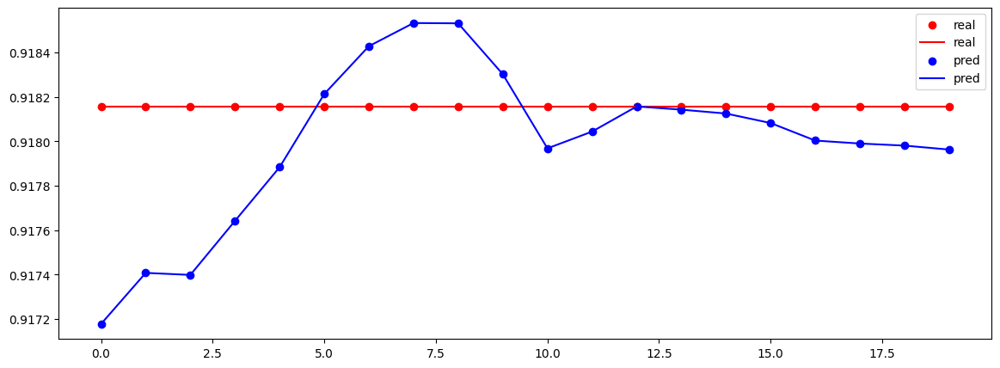

0
TOP_PRESS_f3
Test MSE Loss: 0.0437
20


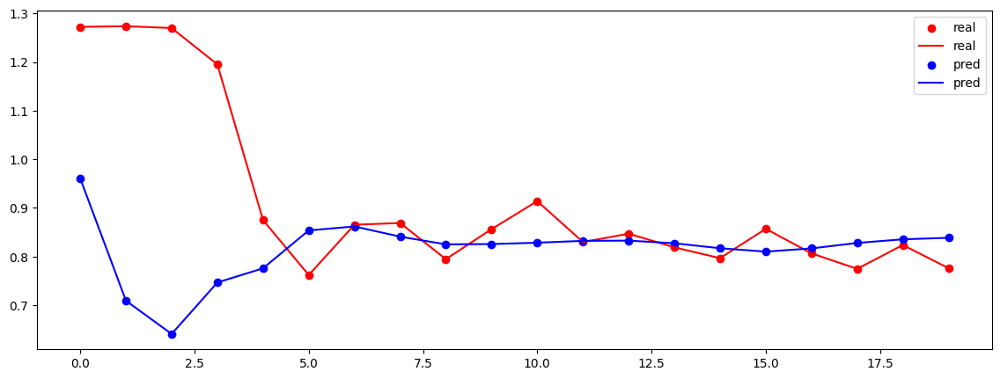

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0499
20


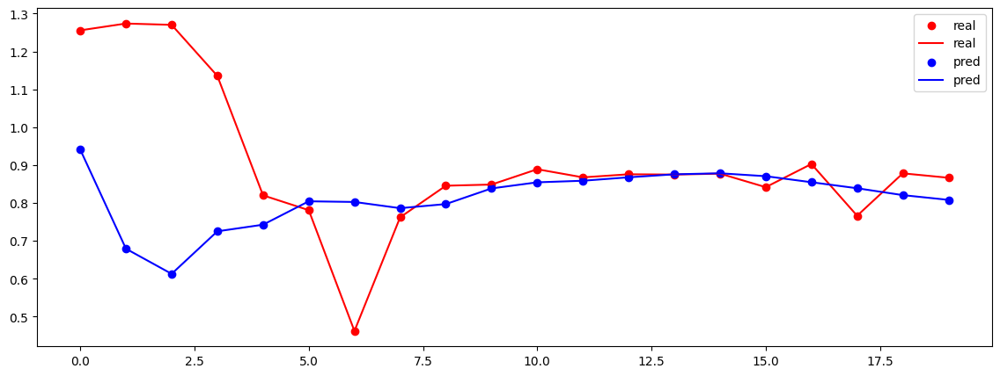

0
cokerate_f4
Test MSE Loss: 0.0084
20


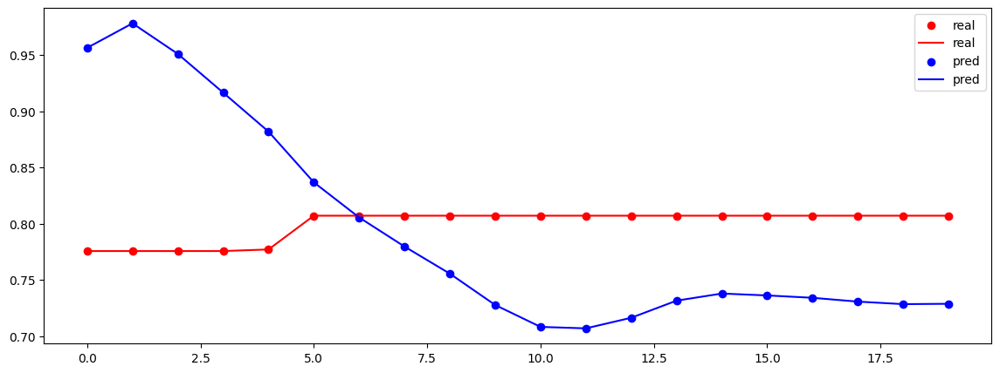

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0796
20


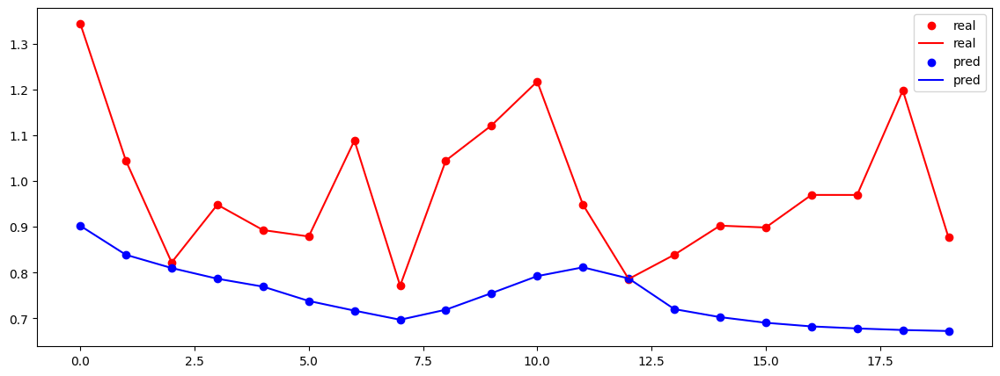

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0029
20


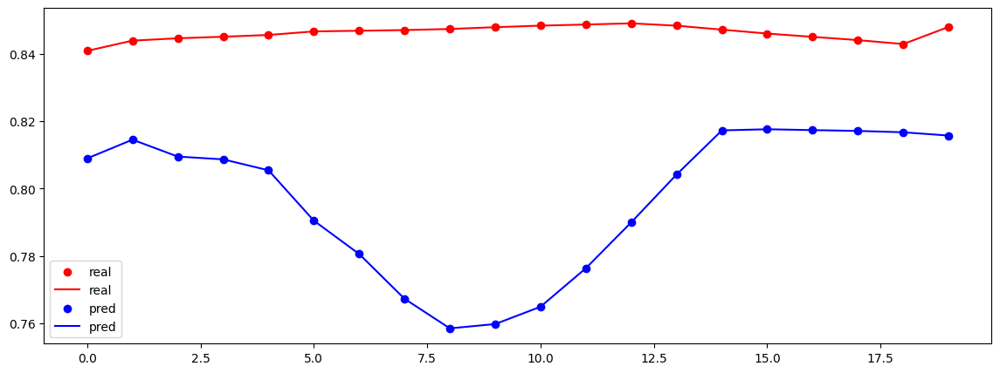

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0013
20


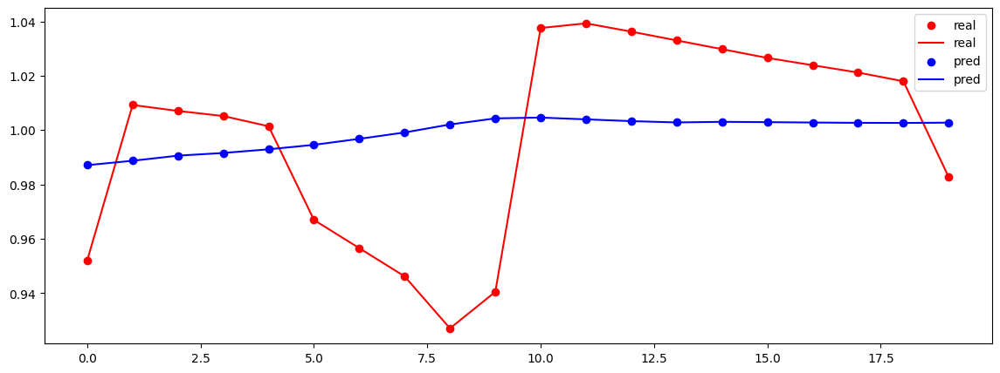

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0278
20


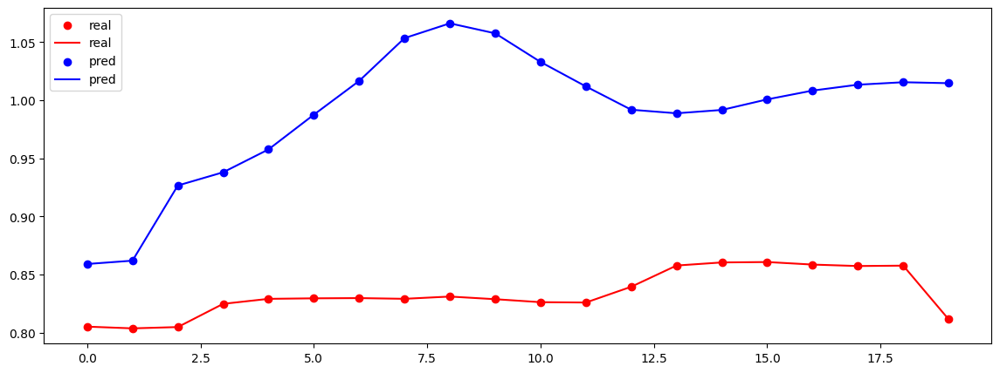

0
WINDRATE_f3
Test MSE Loss: 0.0092
20


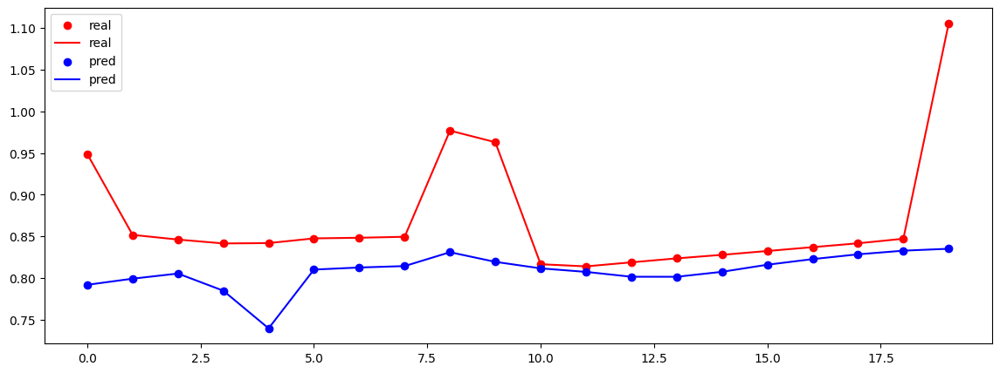

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0103
20


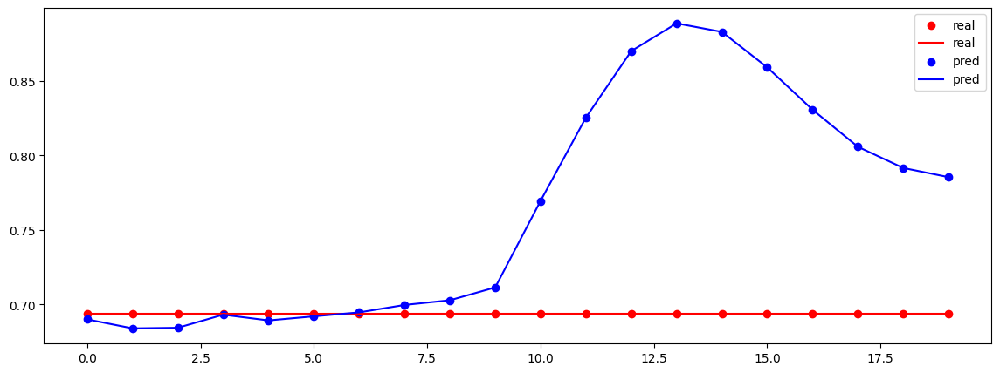

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


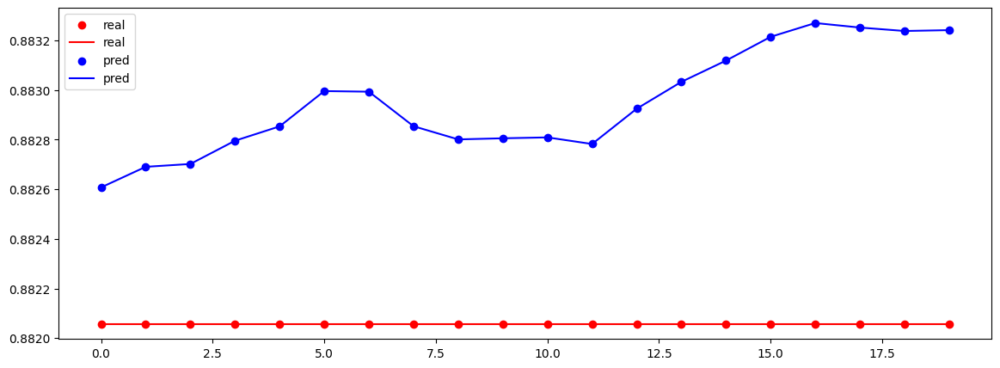

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0272
20


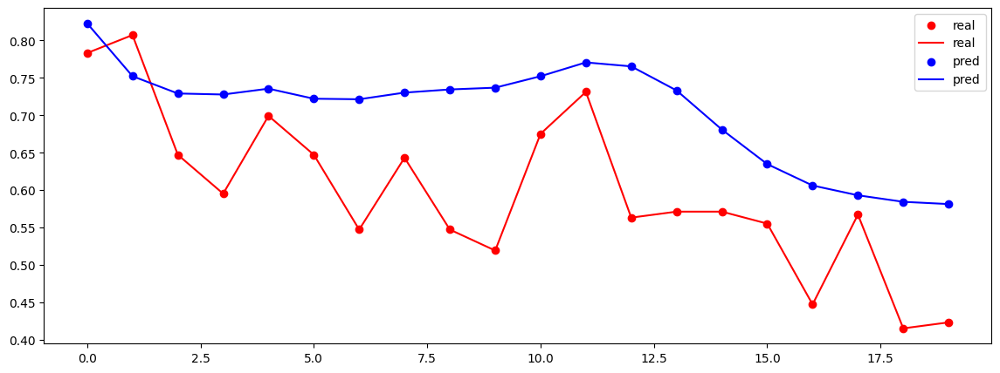

0
Slag_Fe_f2
Test MSE Loss: 0.1763
20


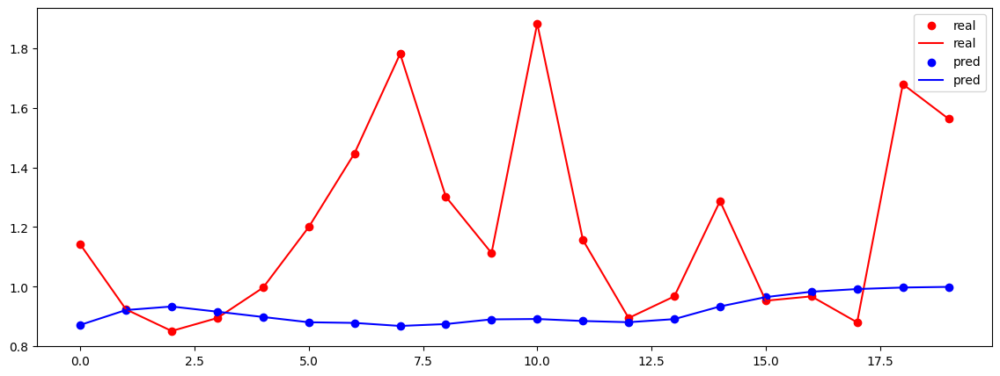

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1934
20


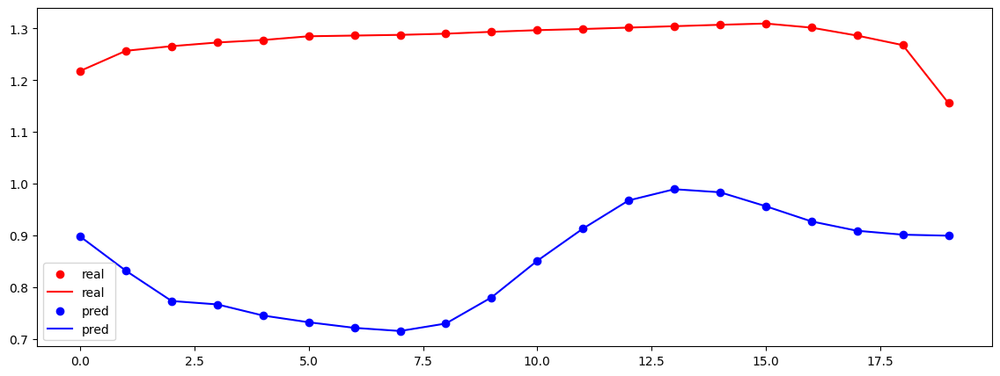

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.1457
20


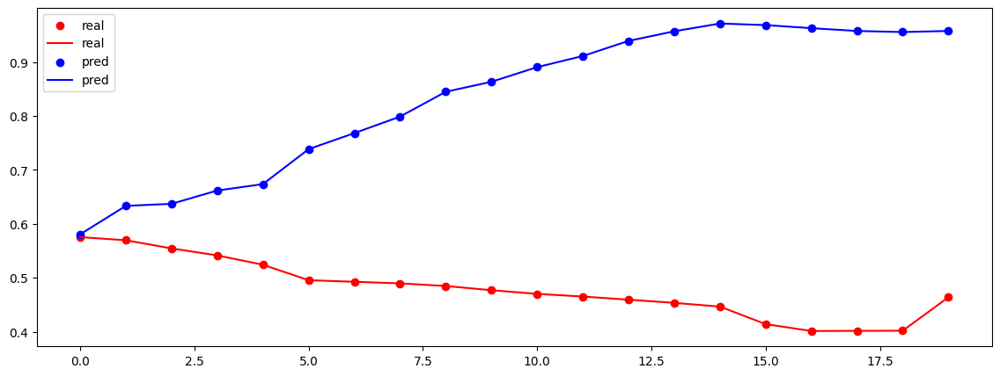

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0050
20


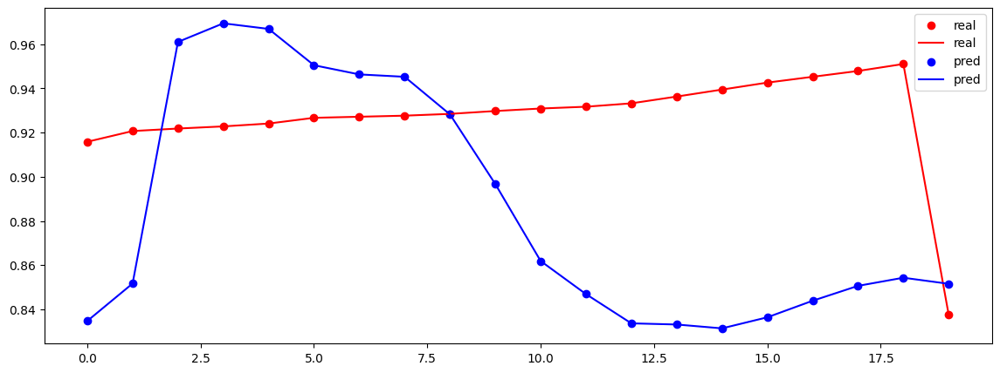

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0139
20


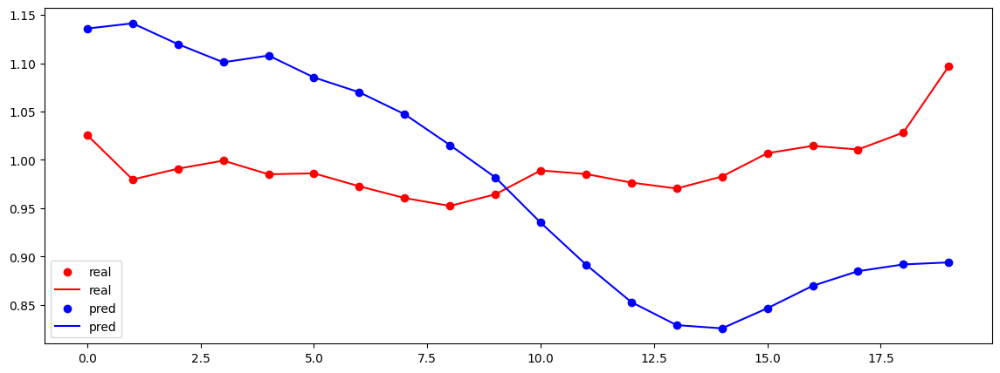

0
NE_Uptake_f3
Test MSE Loss: 0.0065
20


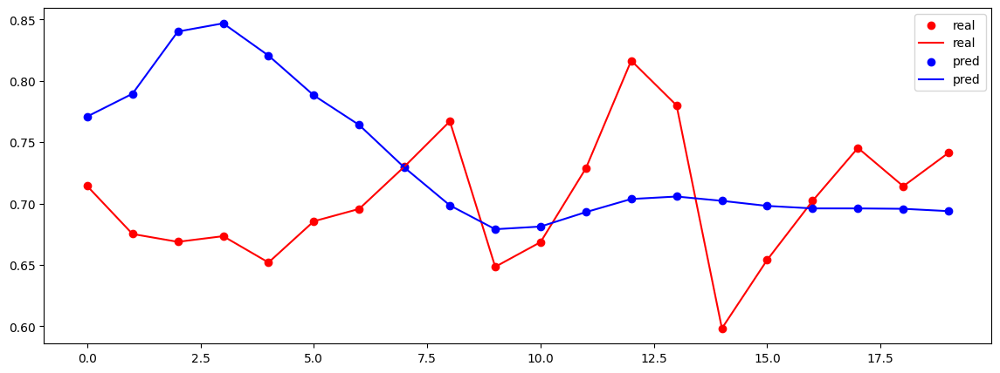

0
SE_Uptake_f3
Test MSE Loss: 0.0313
20


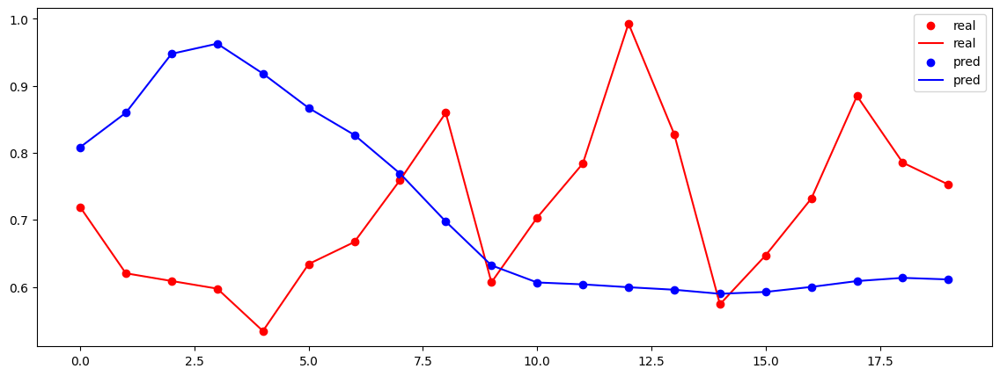

0
NW_Uptake_f3
Test MSE Loss: 0.0023
20


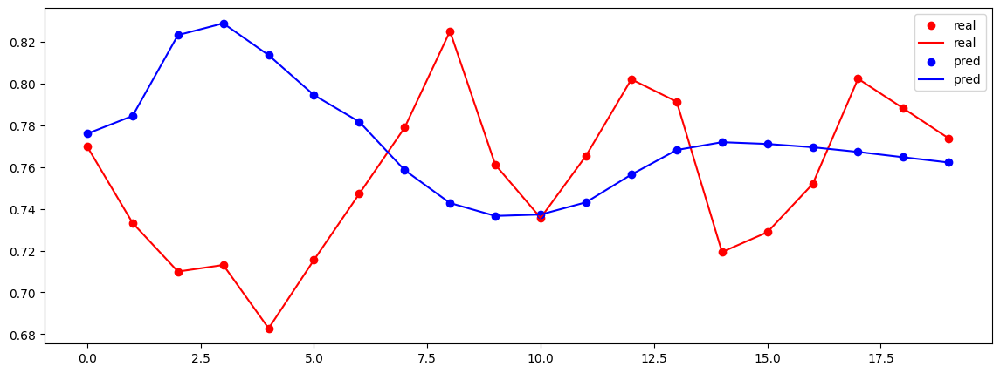

0
SW_Uptake_f3
Test MSE Loss: 0.0267
20


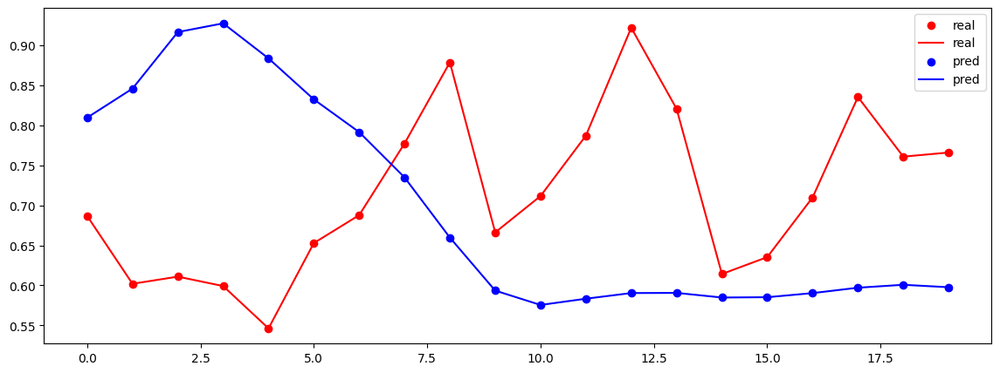

0
Slag_SiO2_f2
Test MSE Loss: 0.0835
20


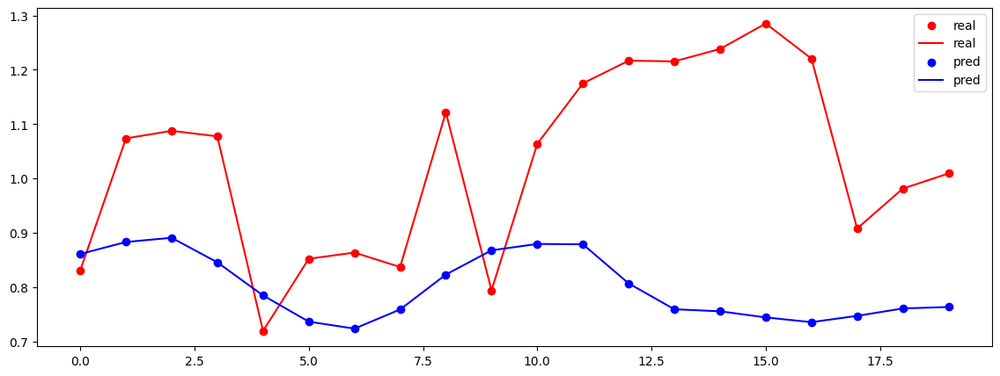

0
Slag_CaO_f2
Test MSE Loss: 0.1443
20


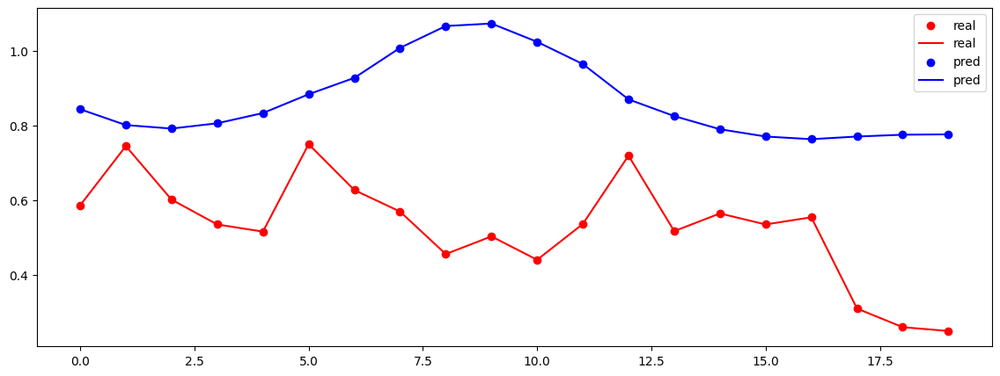

0
Slag_MgO_f2
Test MSE Loss: 0.0252
20


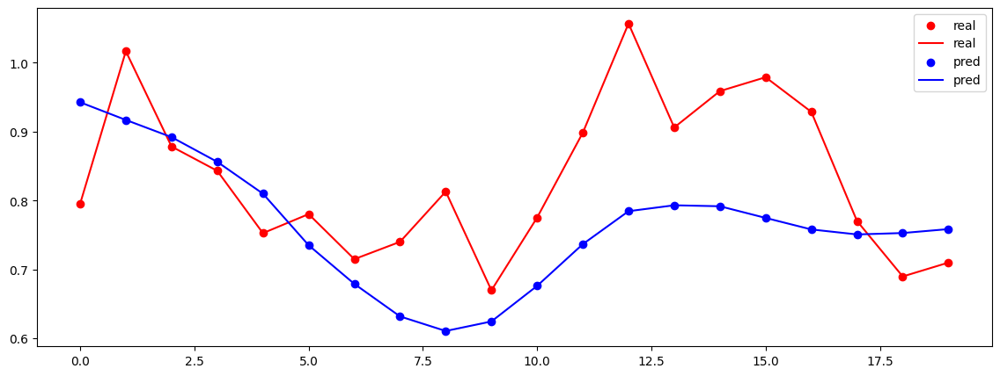

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


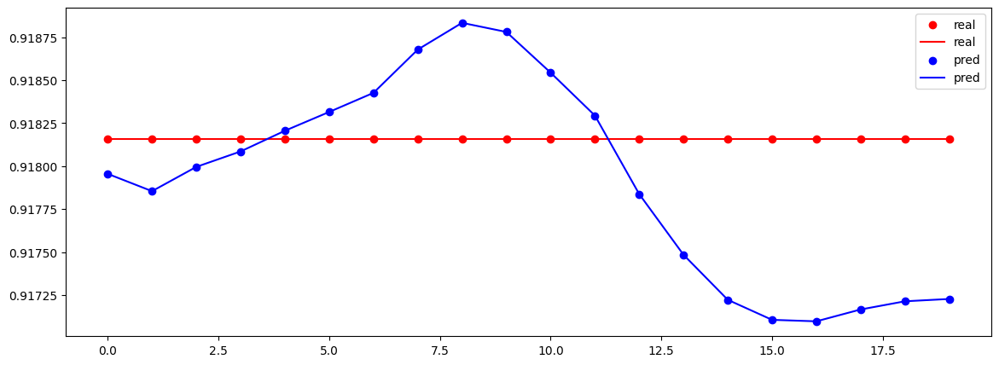

0
TOP_PRESS_f3
Test MSE Loss: 0.0058
20


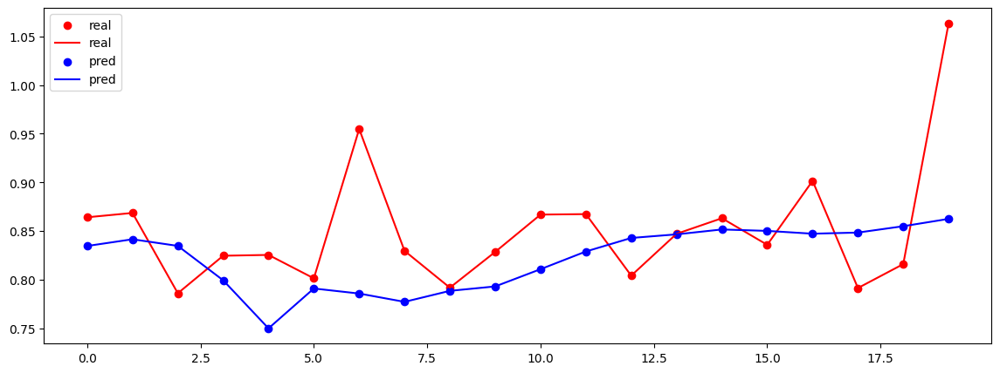

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0153
20


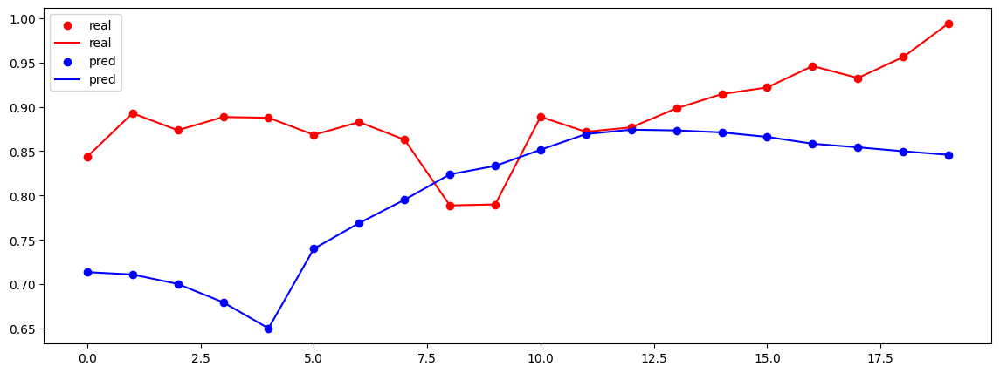

0
cokerate_f4
Test MSE Loss: 0.0060
20


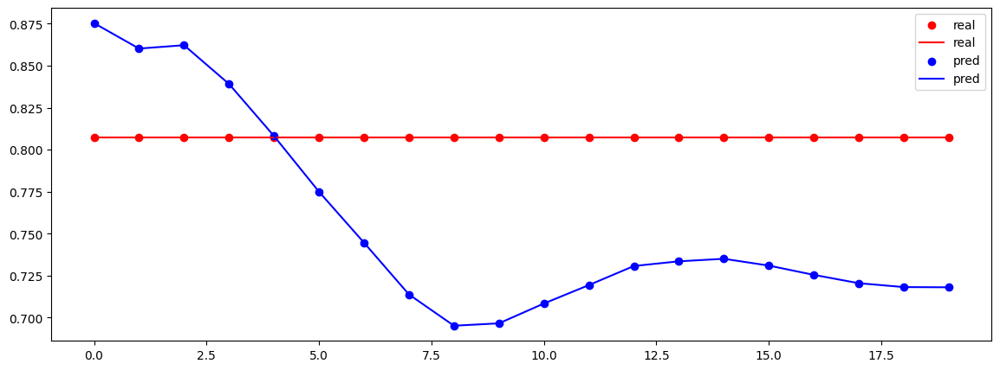

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.1437
20


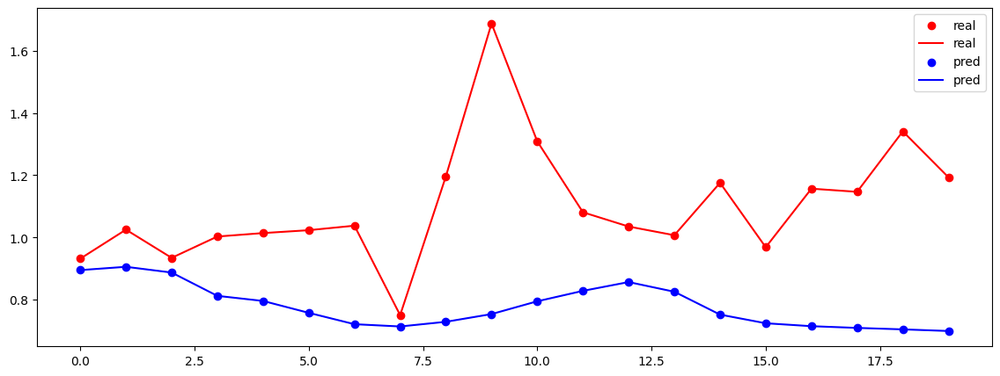

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0098
20


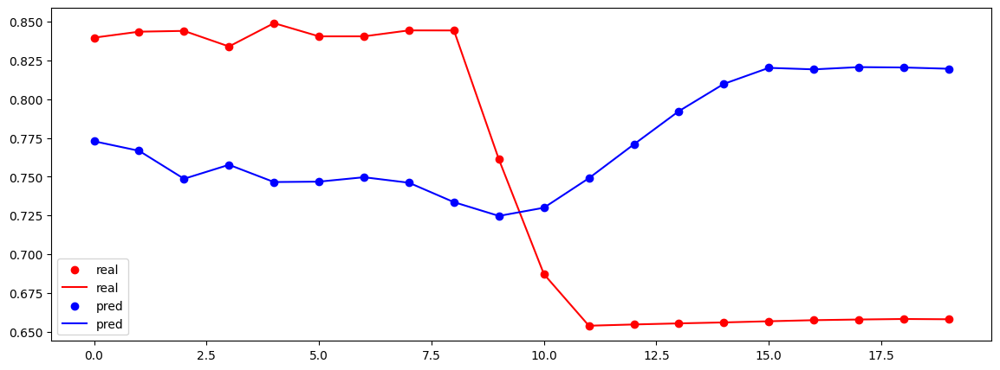

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0004
20


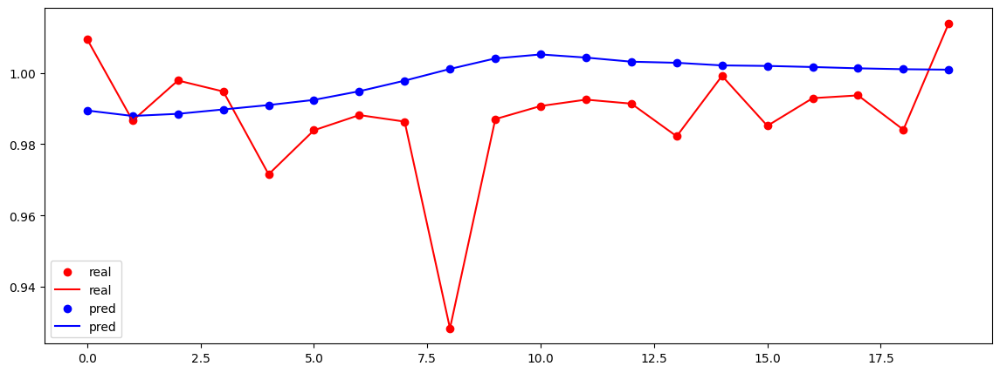

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0212
20


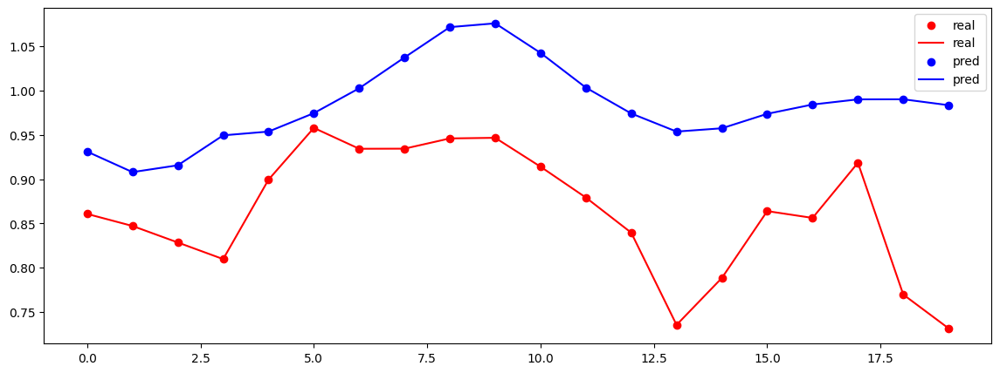

0
WINDRATE_f3
Test MSE Loss: 0.0399
20


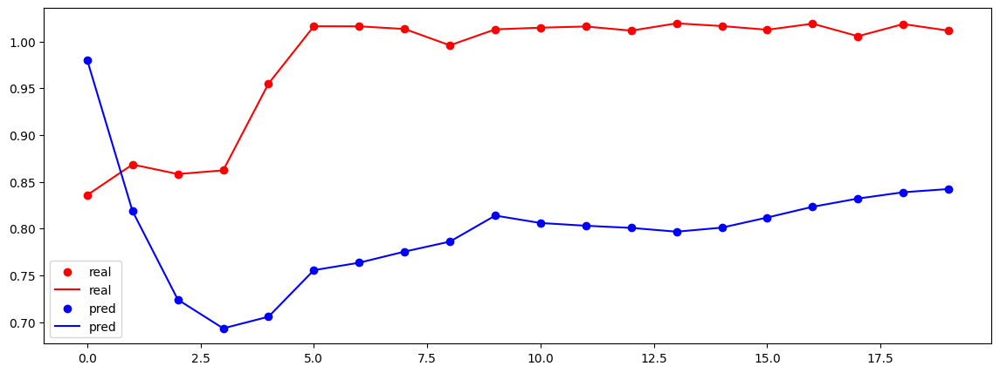

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0120
20


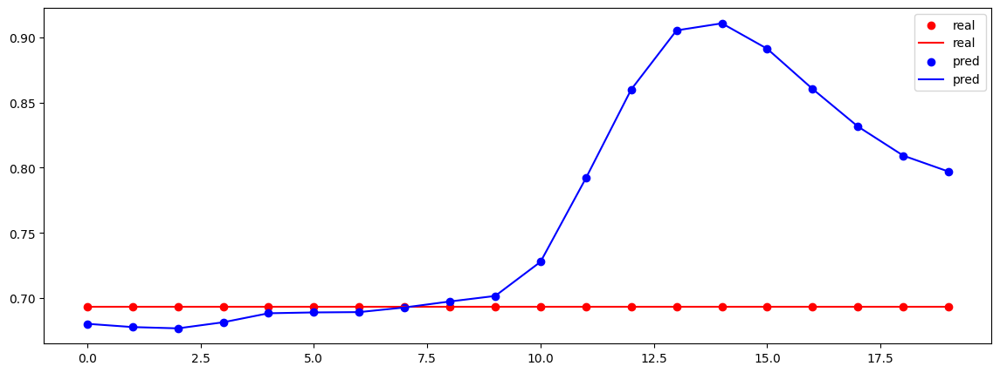

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


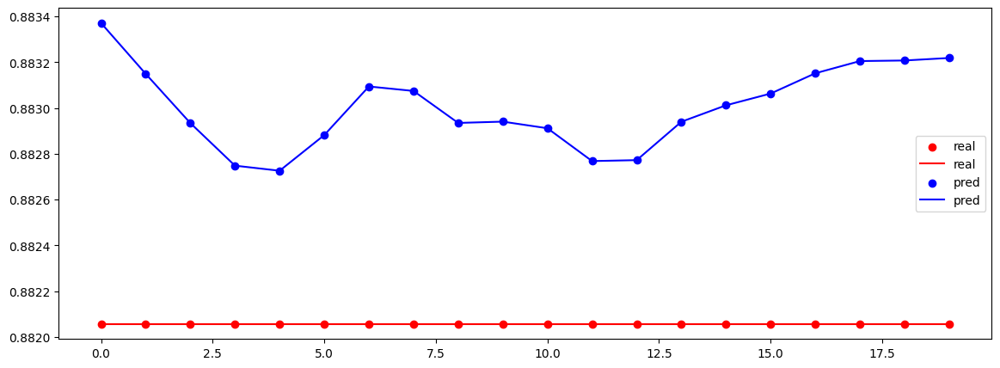

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0845
20


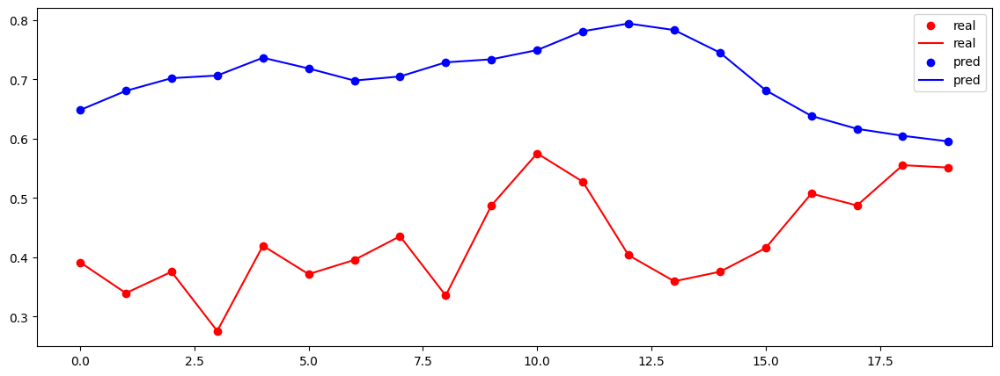

0
Slag_Fe_f2
Test MSE Loss: 0.6524
20


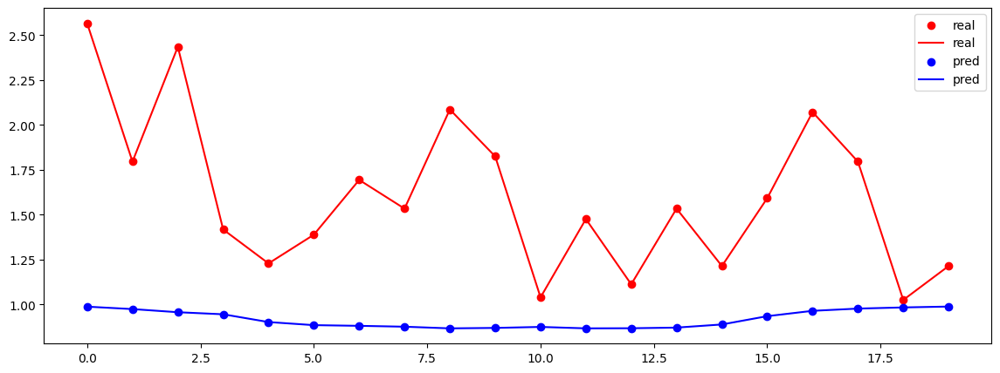

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1427
20


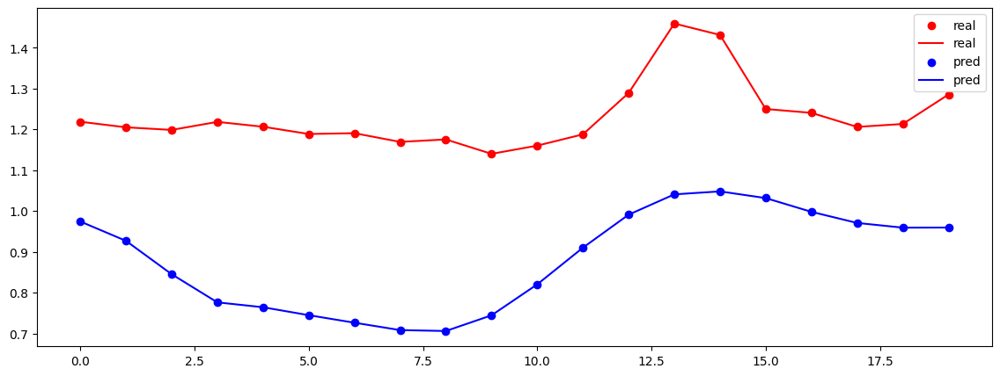

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.2100
20


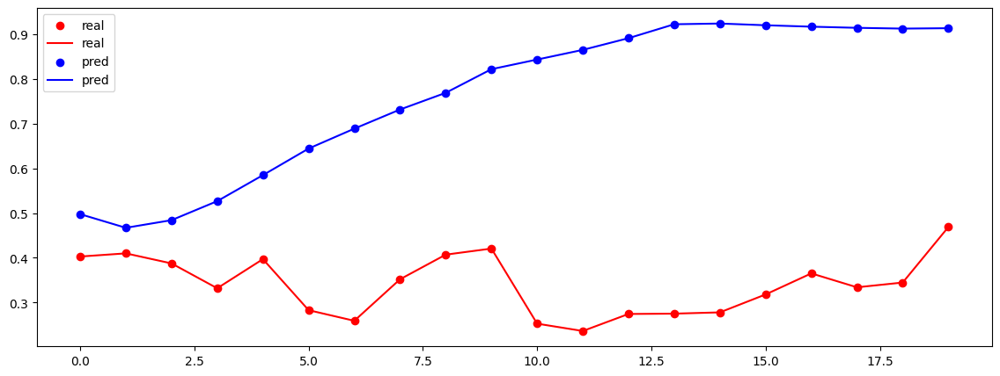

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0224
20


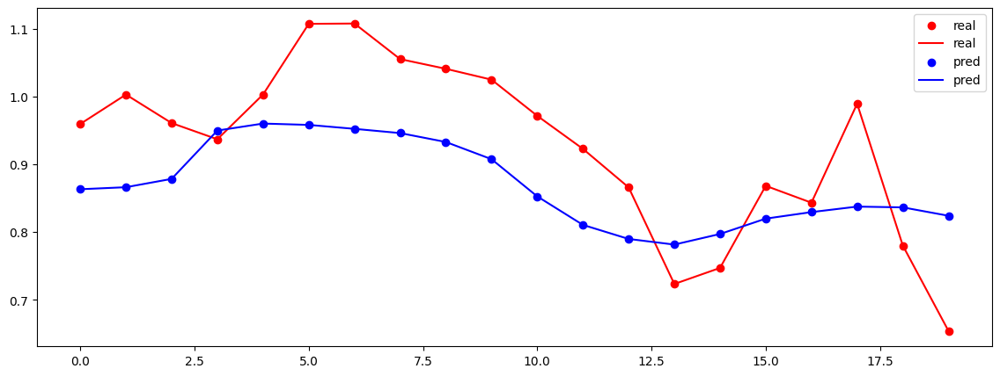

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0371
20


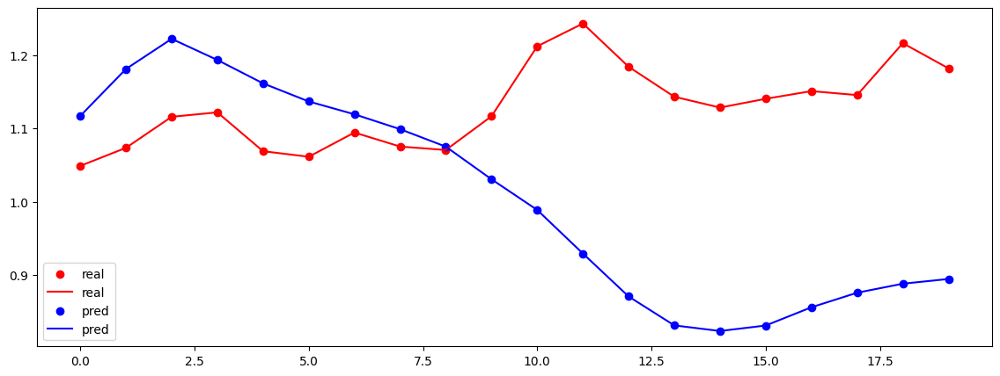

0
NE_Uptake_f3
Test MSE Loss: 0.0057
20


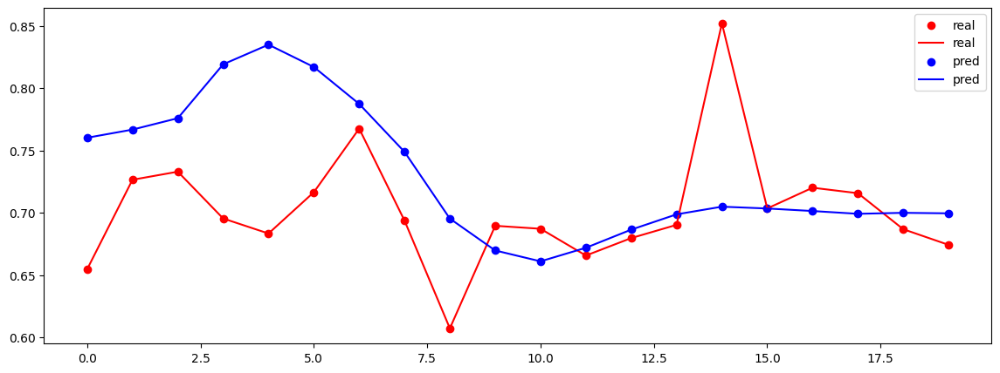

0
SE_Uptake_f3
Test MSE Loss: 0.0252
20


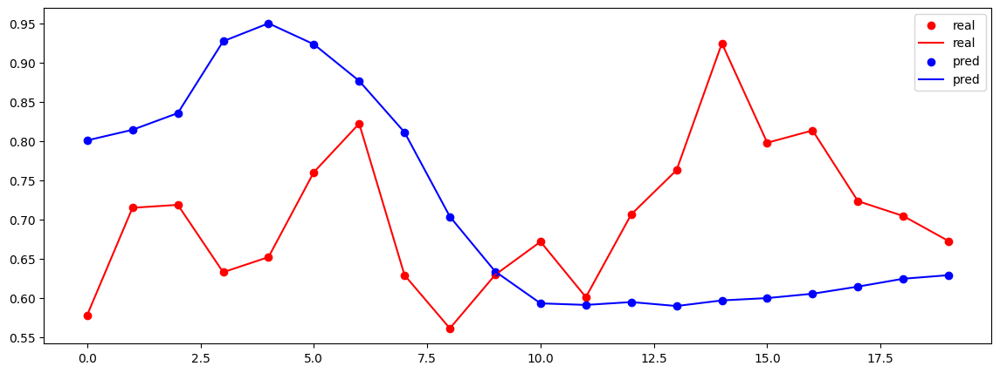

0
NW_Uptake_f3
Test MSE Loss: 0.0030
20


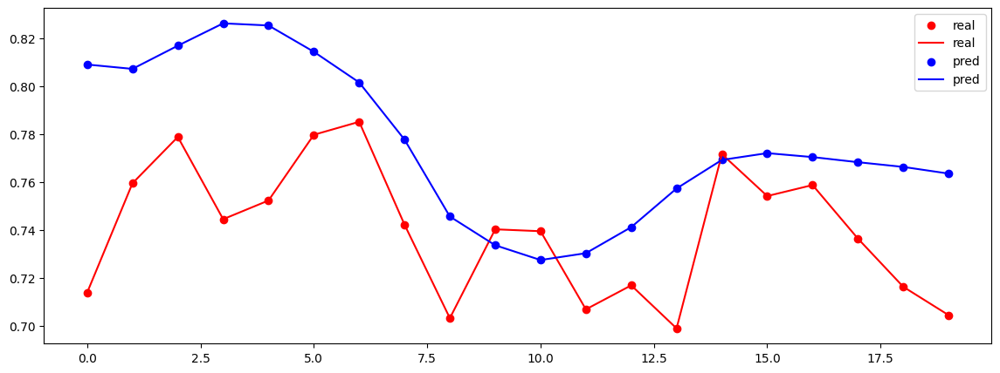

0
SW_Uptake_f3
Test MSE Loss: 0.0227
20


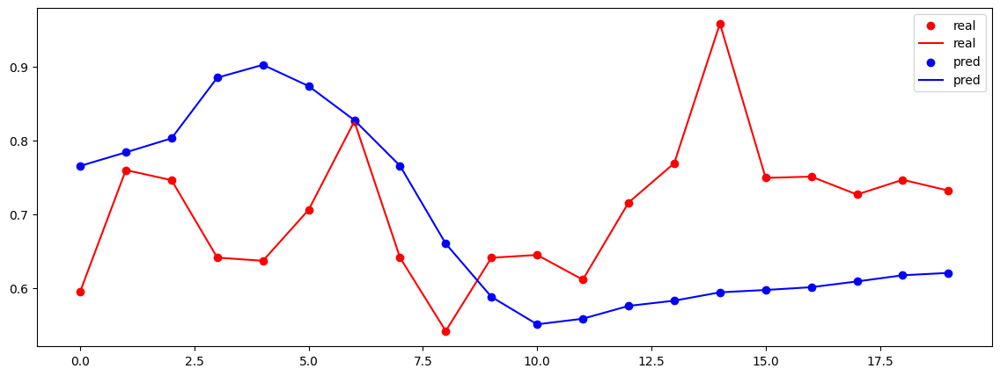

0
Slag_SiO2_f2
Test MSE Loss: 0.6409
20


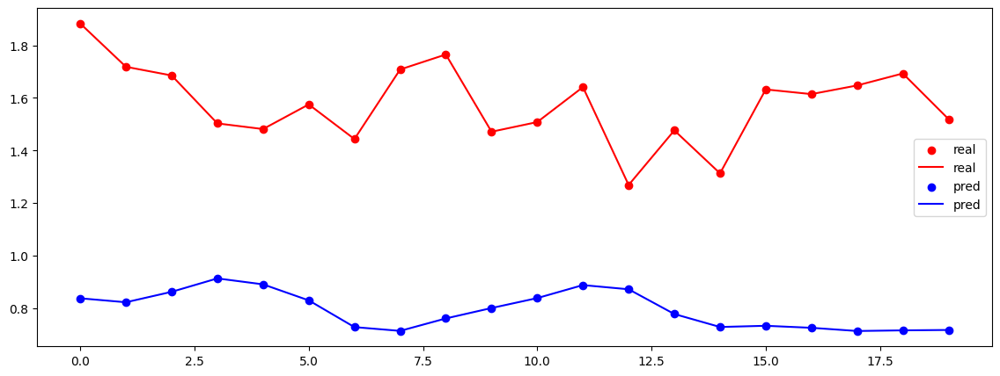

0
Slag_CaO_f2
Test MSE Loss: 0.2210
20


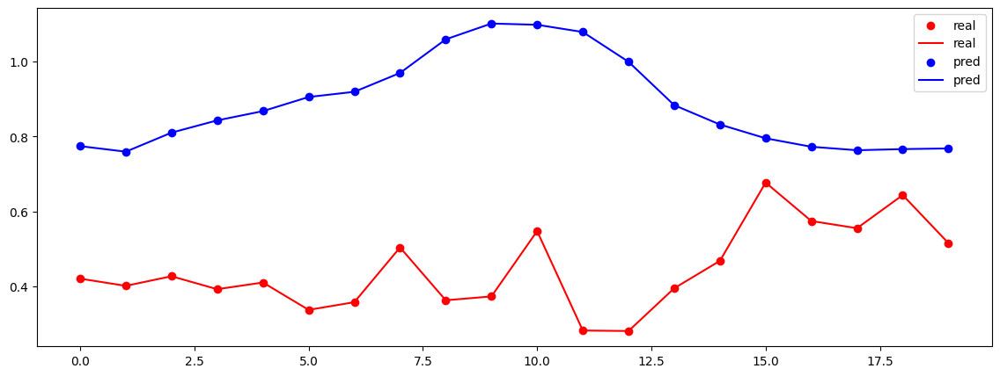

0
Slag_MgO_f2
Test MSE Loss: 0.0145
20


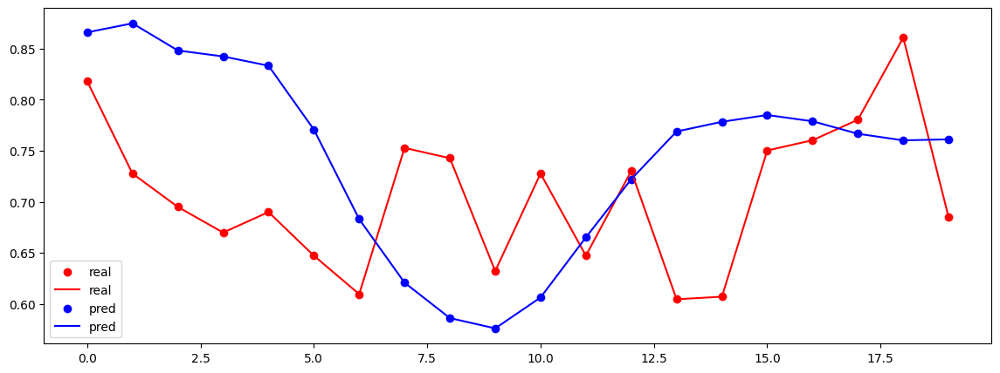

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


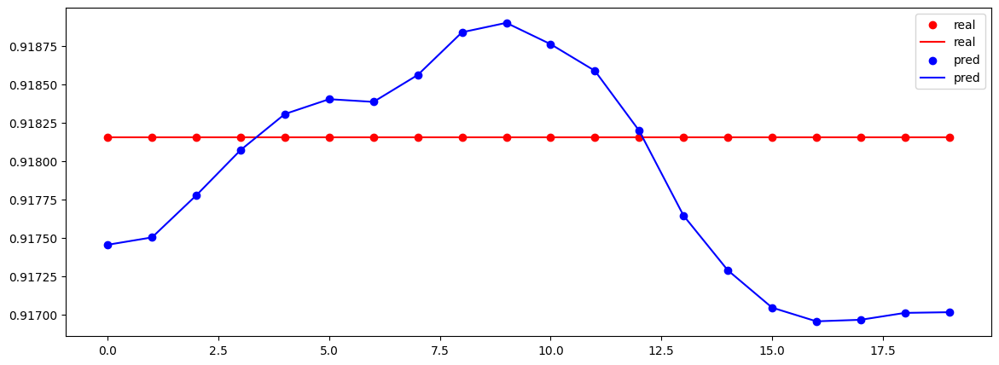

0
TOP_PRESS_f3
Test MSE Loss: 0.0336
20


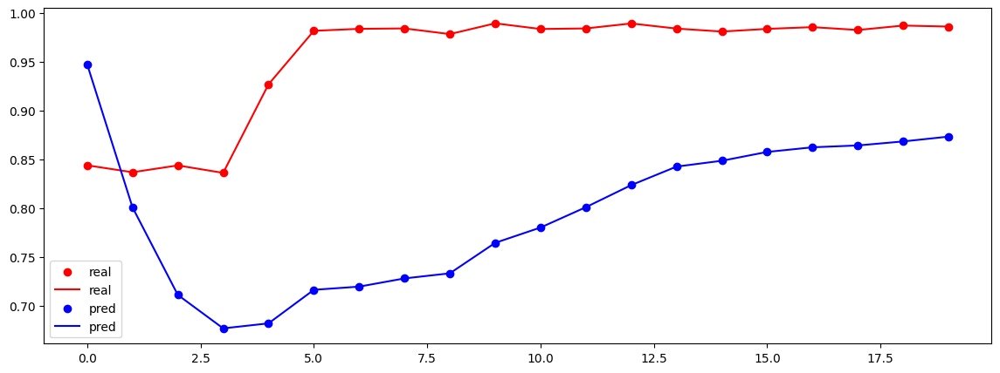

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0488
20


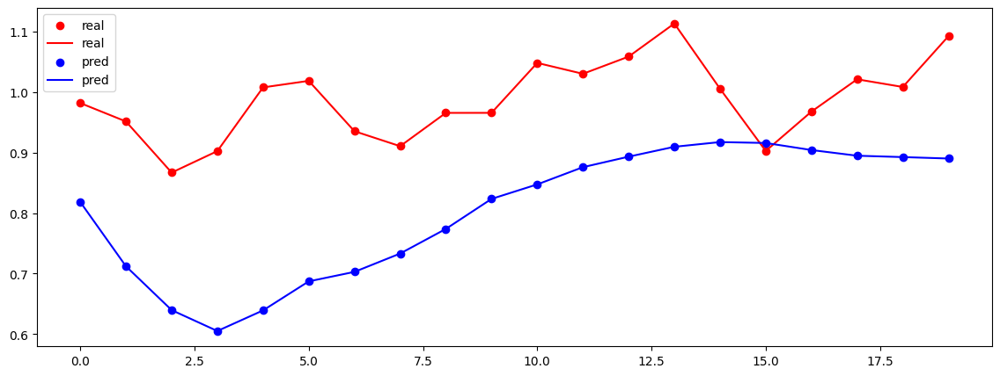

0
cokerate_f4
Test MSE Loss: 0.0044
20


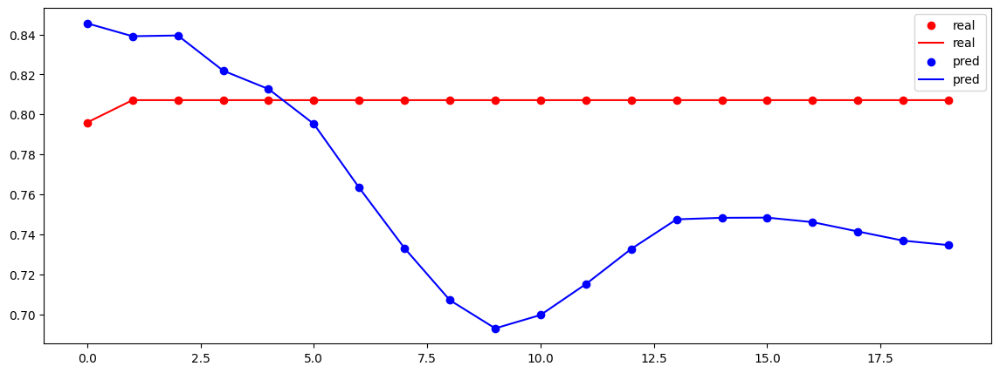

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.2559
20


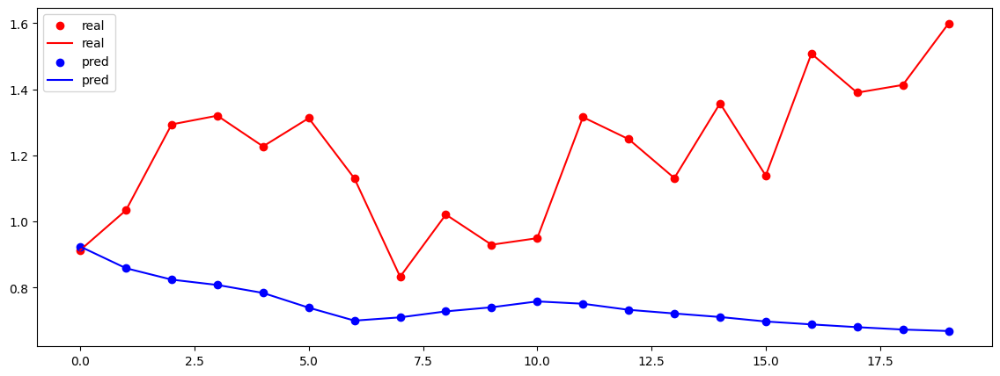

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0201
20


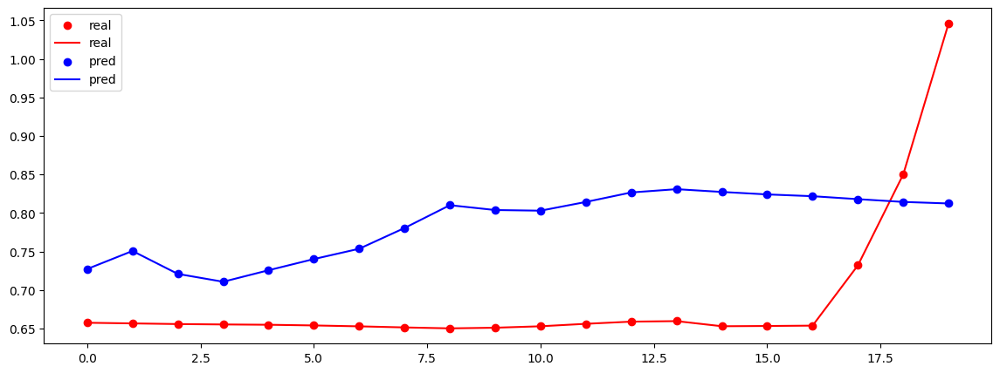

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0002
20


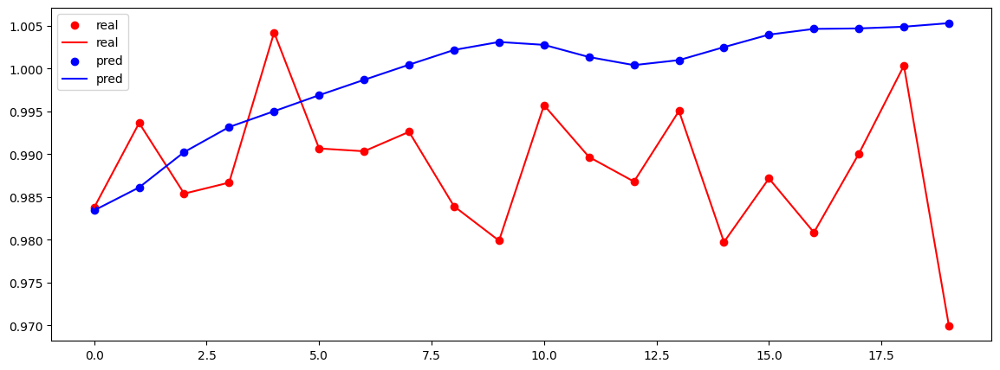

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0670
20


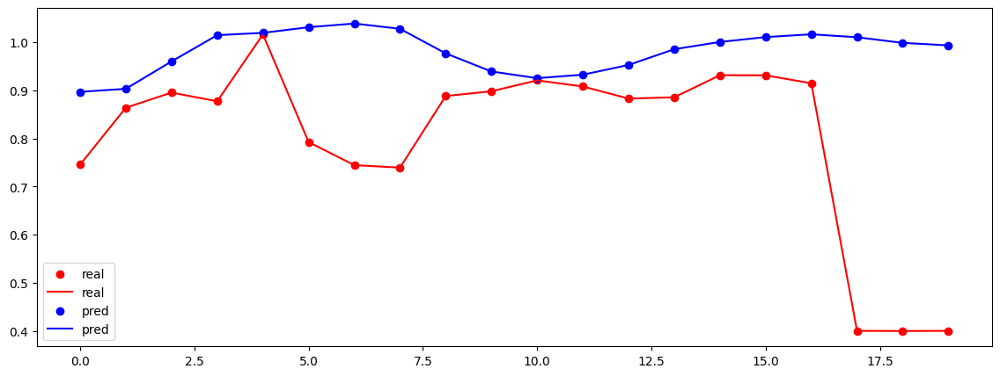

0
WINDRATE_f3
Test MSE Loss: 0.0756
20


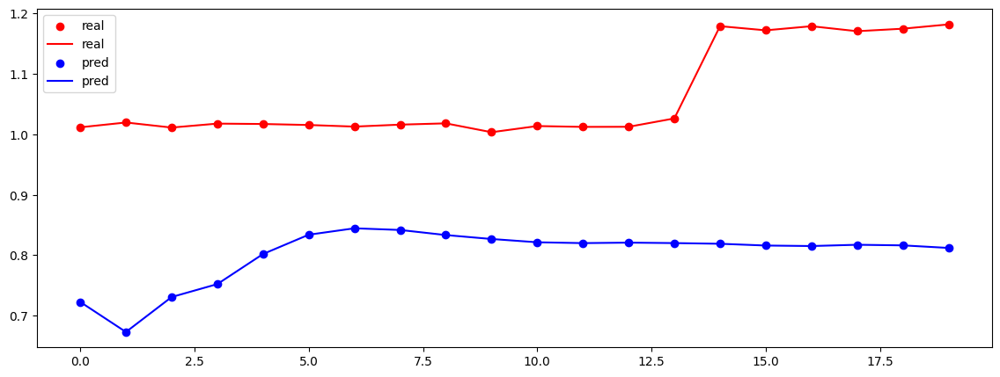

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0012
20


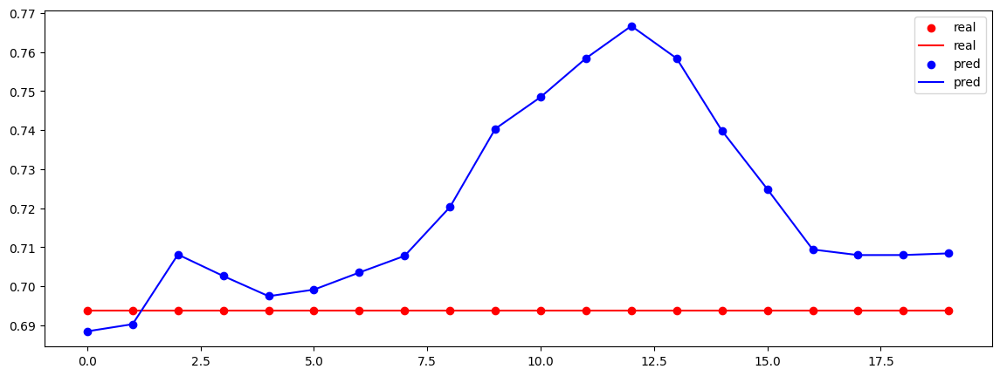

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


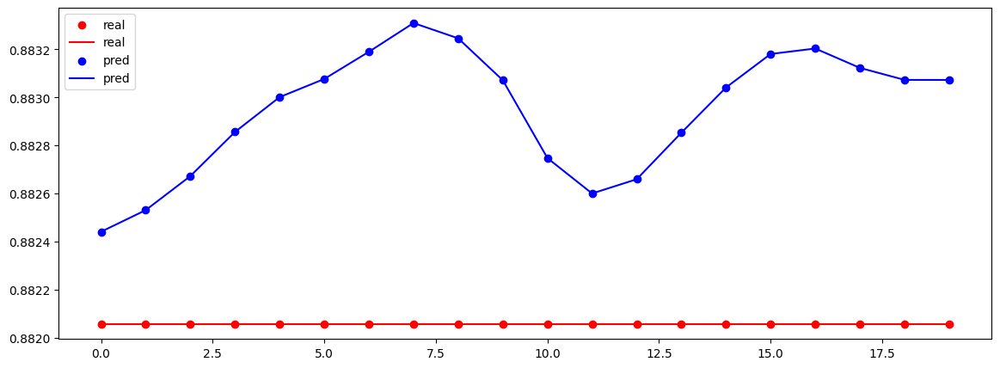

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0553
20


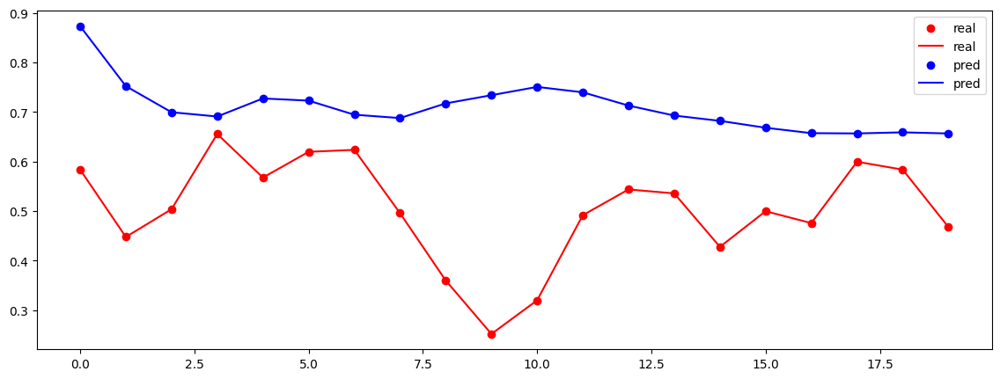

0
Slag_Fe_f2
Test MSE Loss: 0.2148
20


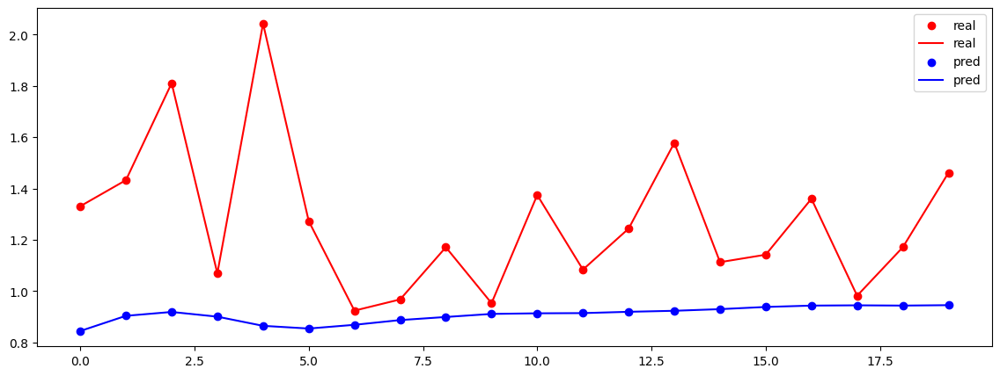

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.3595
20


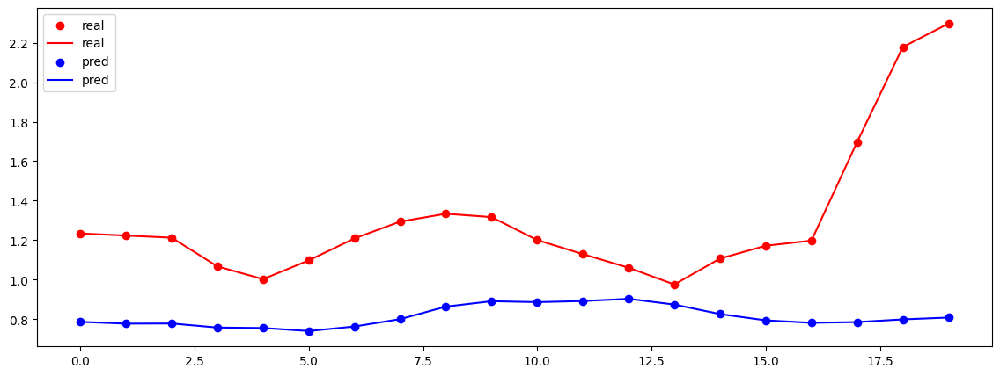

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.3063
20


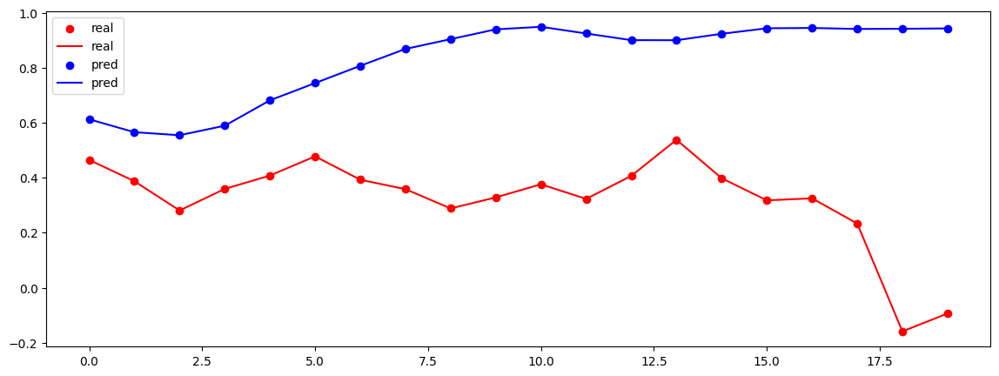

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0540
20


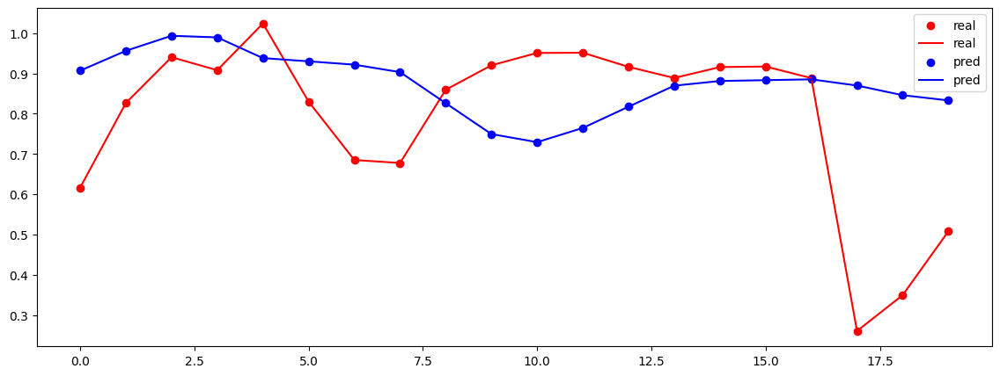

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0406
20


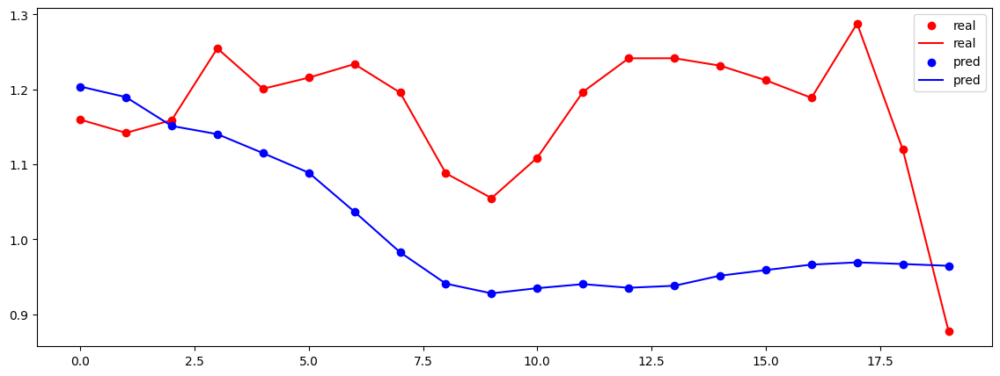

0
NE_Uptake_f3
Test MSE Loss: 0.0045
20


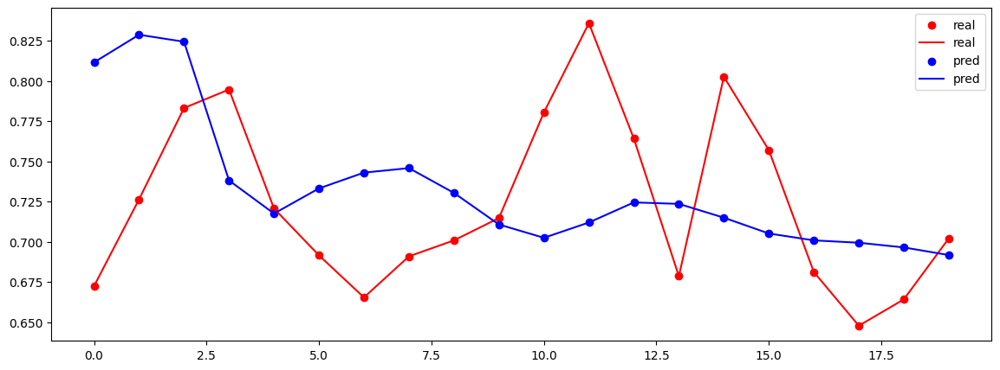

0
SE_Uptake_f3
Test MSE Loss: 0.0249
20


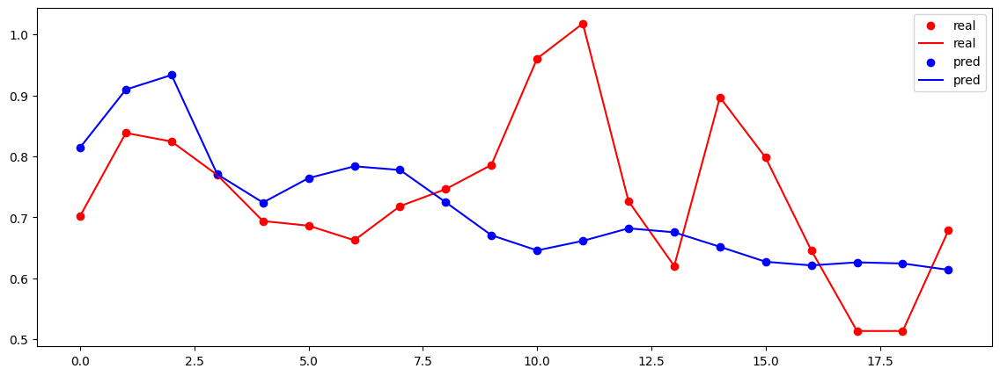

0
NW_Uptake_f3
Test MSE Loss: 0.0038
20


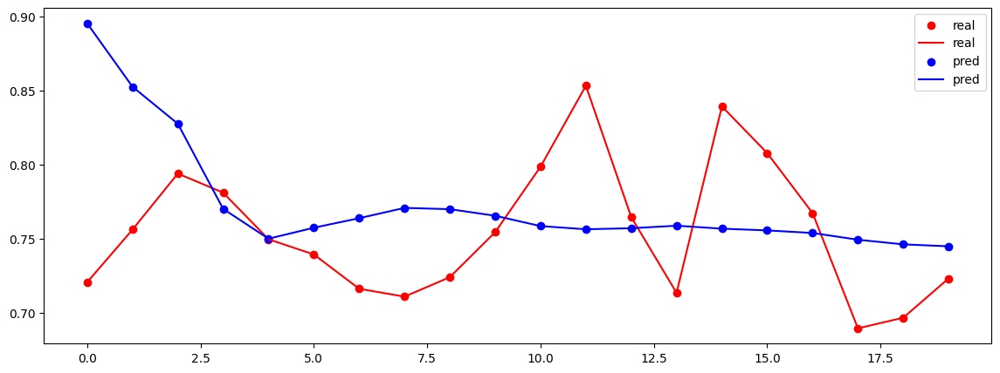

0
SW_Uptake_f3
Test MSE Loss: 0.0215
20


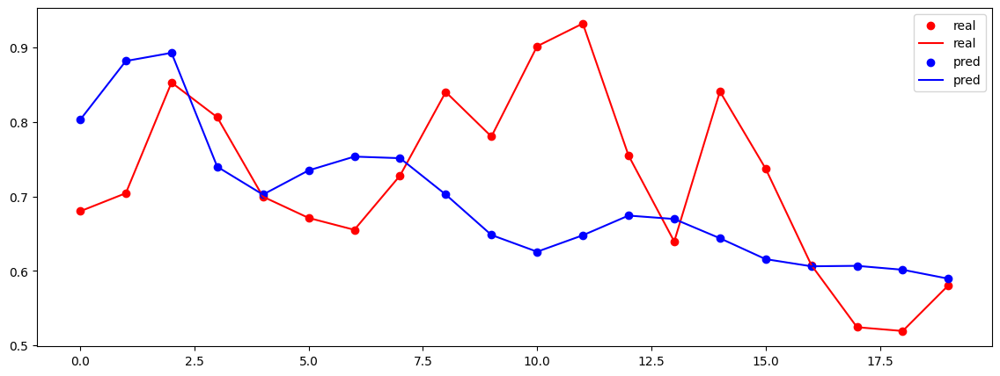

0
Slag_SiO2_f2
Test MSE Loss: 0.4365
20


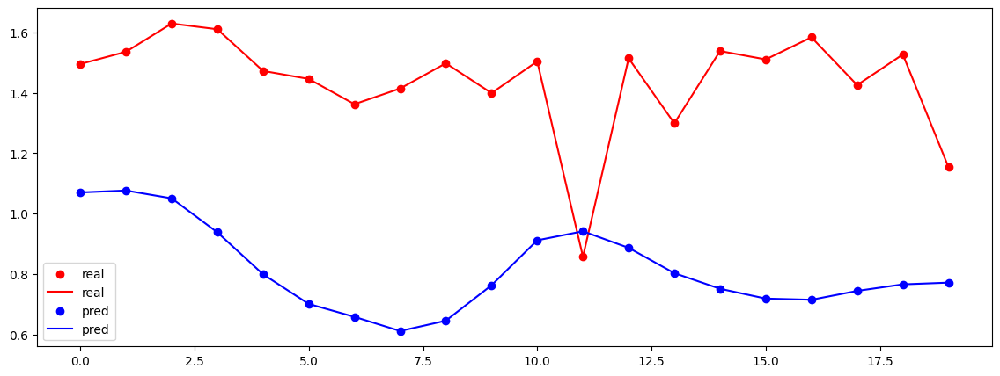

0
Slag_CaO_f2
Test MSE Loss: 0.1297
20


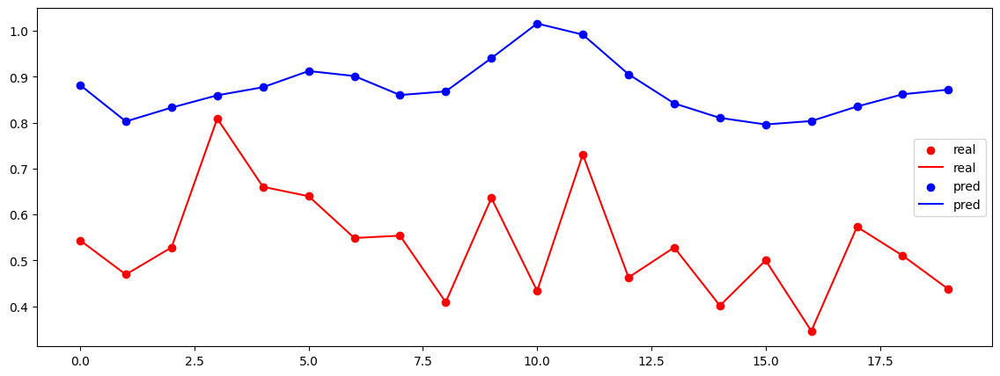

0
Slag_MgO_f2
Test MSE Loss: 0.0414
20


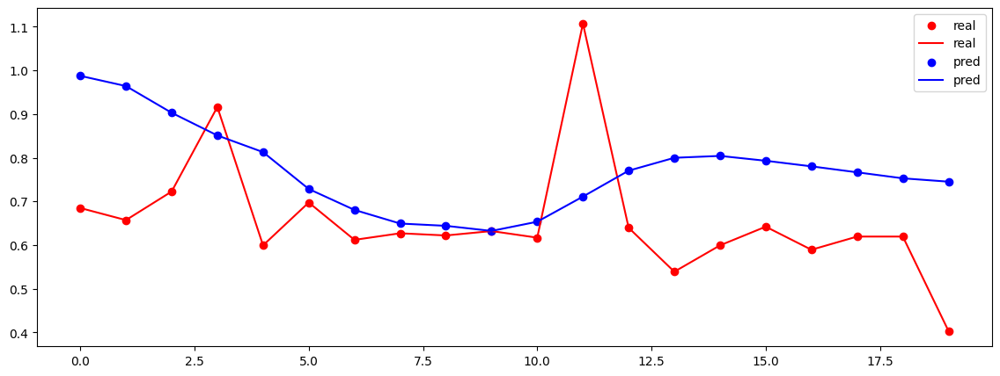

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


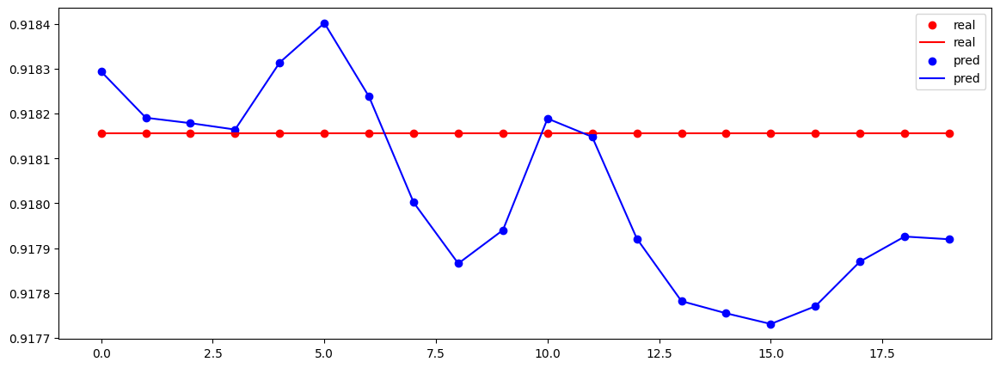

0
TOP_PRESS_f3
Test MSE Loss: 0.0578
20


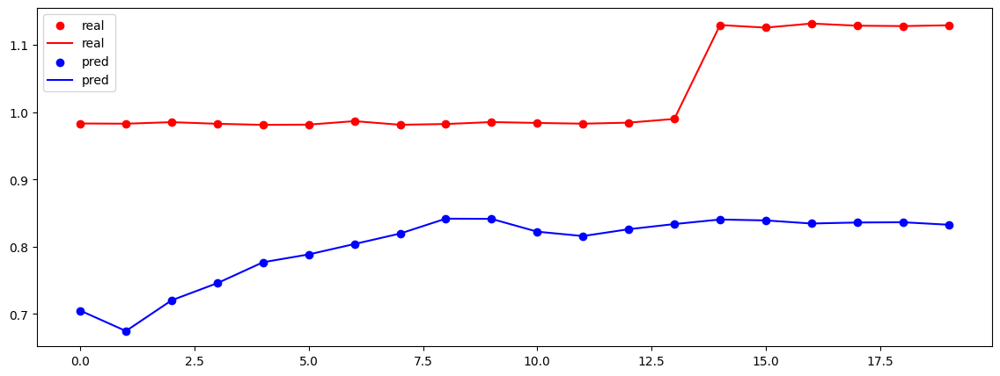

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0997
20


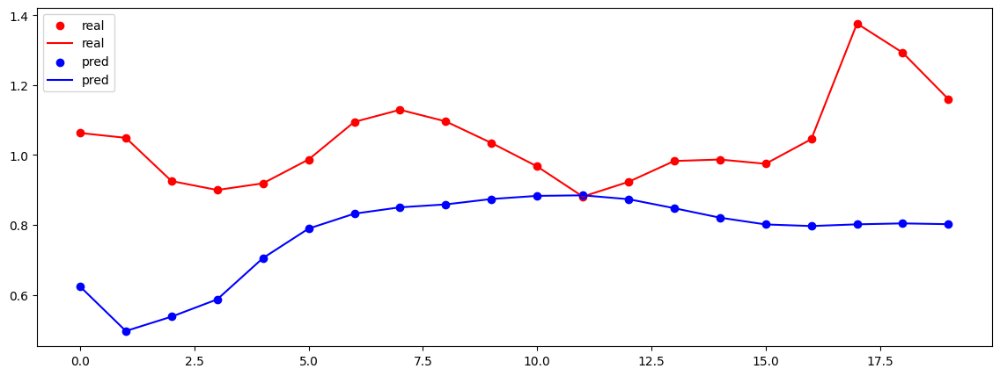

0
cokerate_f4
Test MSE Loss: 0.0883
20


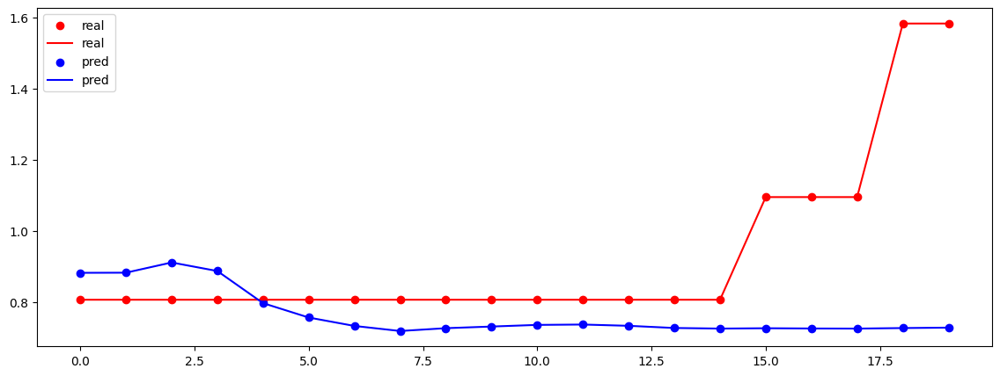

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.4979
20


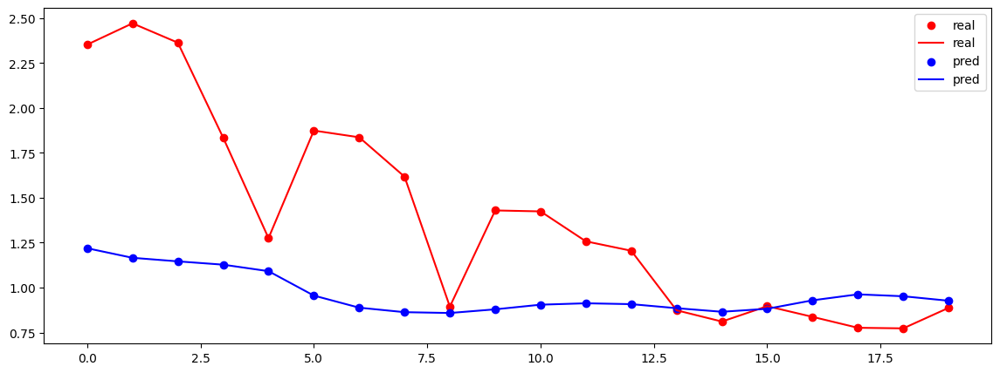

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0150
20


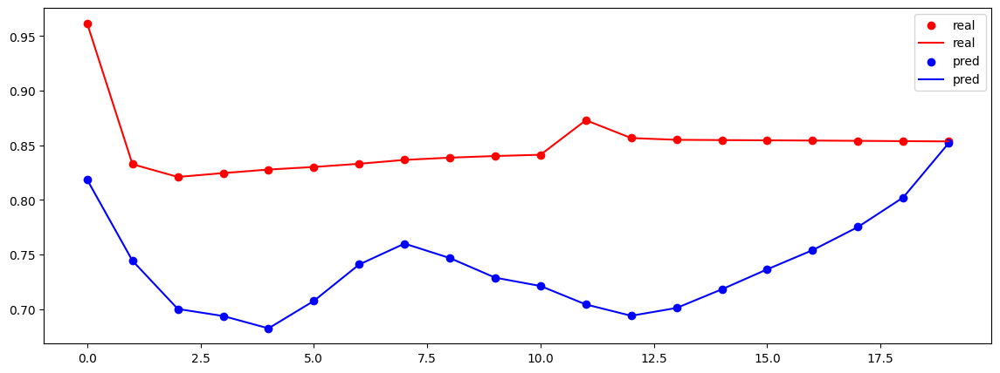

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0002
20


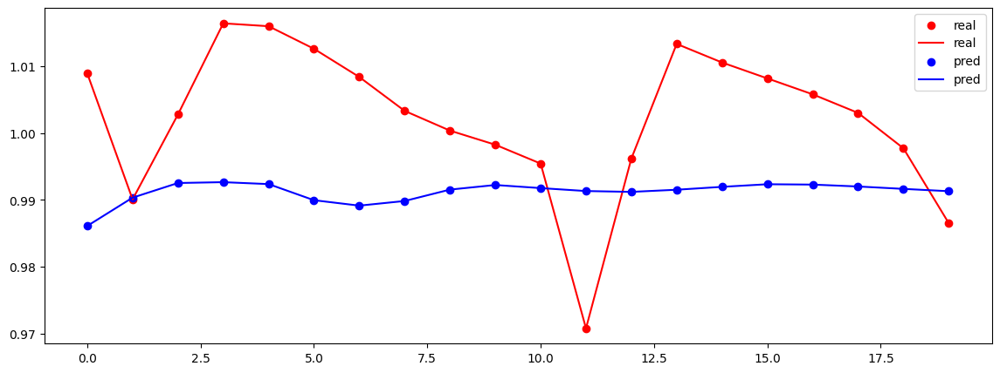

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0207
20


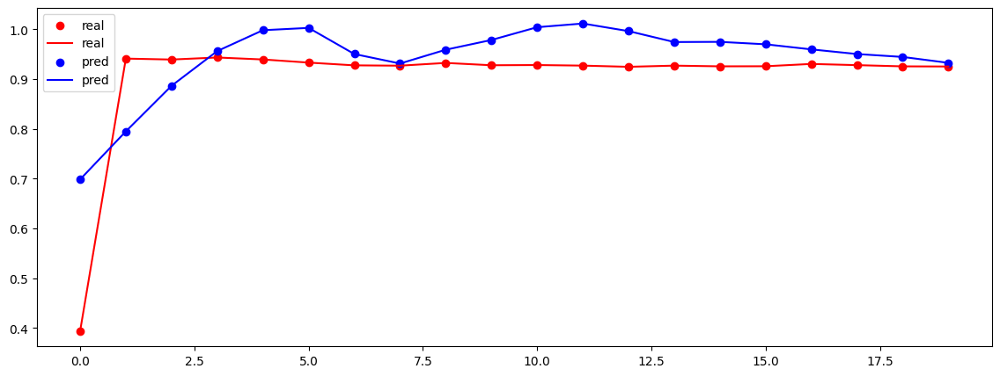

0
WINDRATE_f3
Test MSE Loss: 0.0616
20


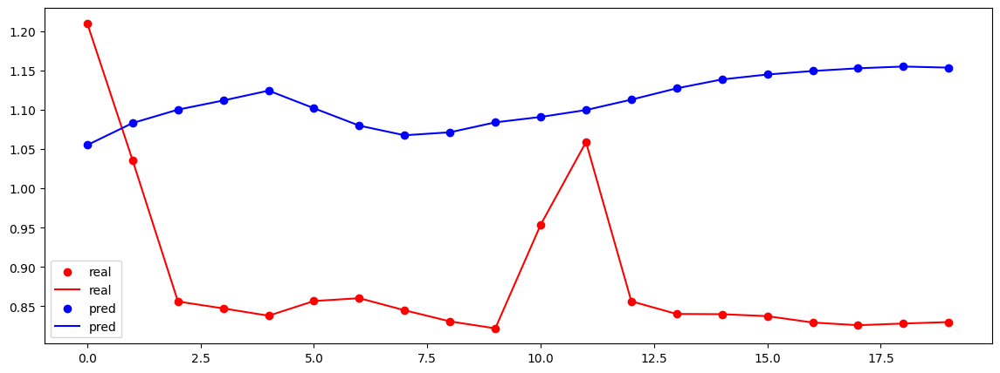

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0002
20


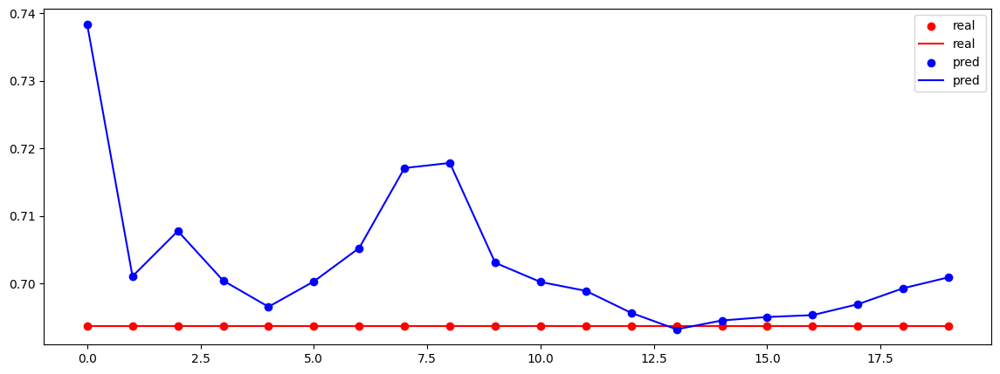

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


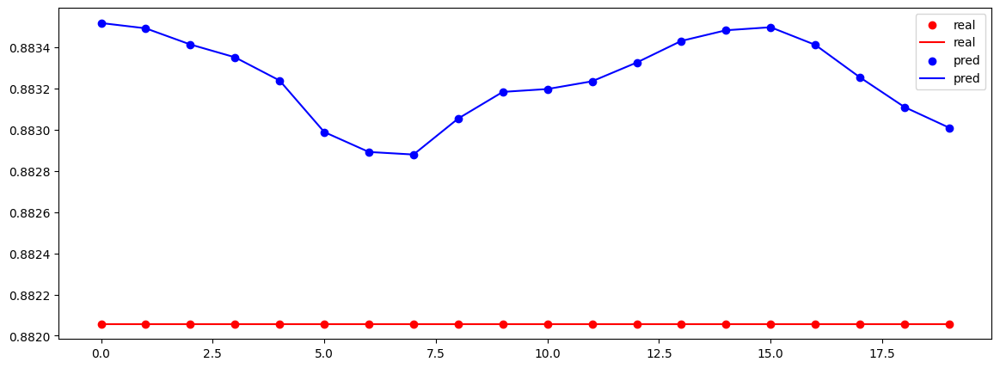

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0213
20


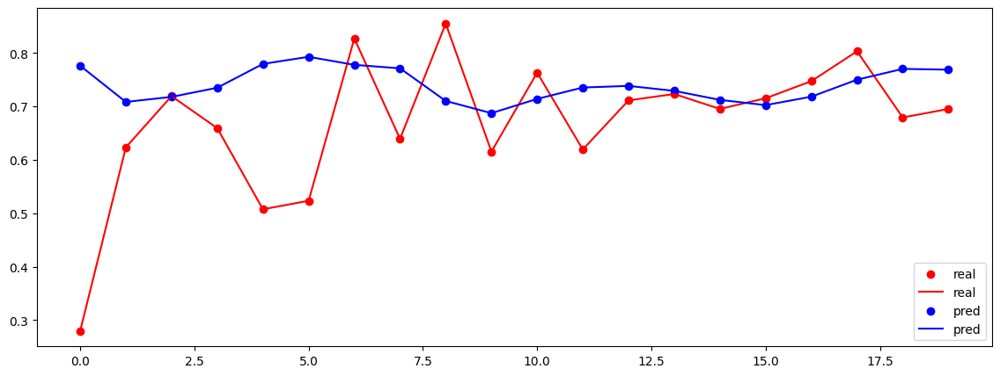

0
Slag_Fe_f2
Test MSE Loss: 0.0638
20


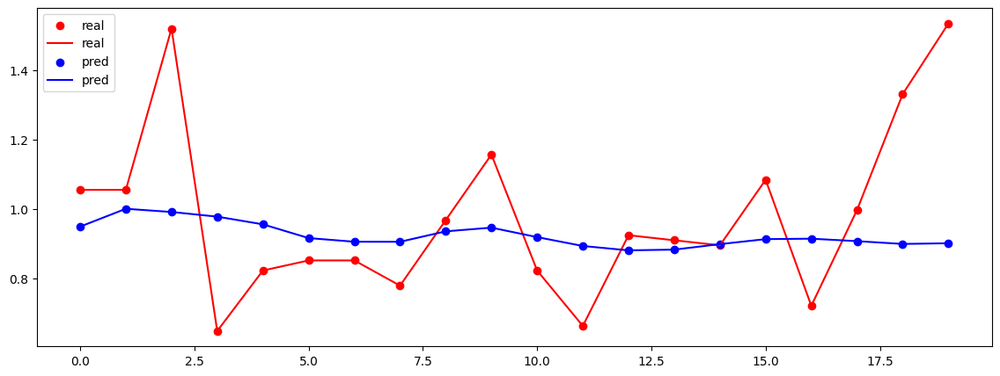

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.1046
20


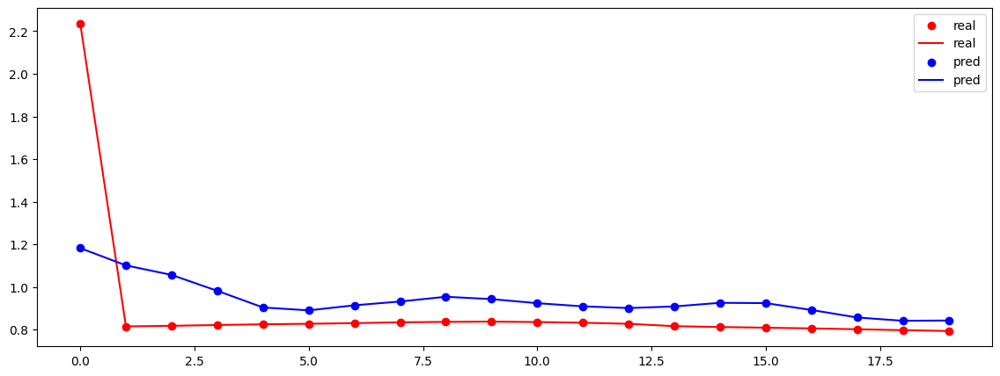

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0688
20


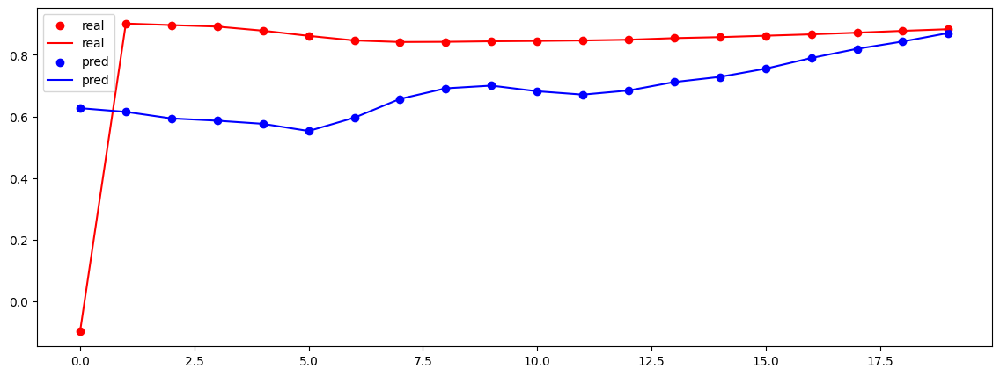

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0164
20


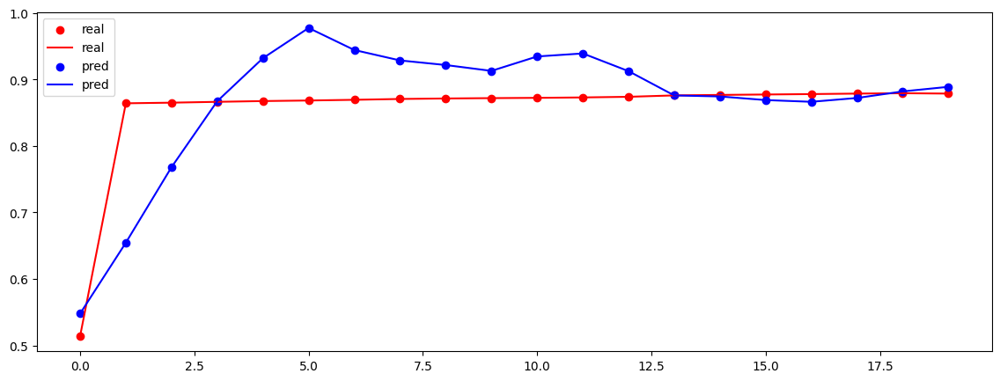

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0022
20


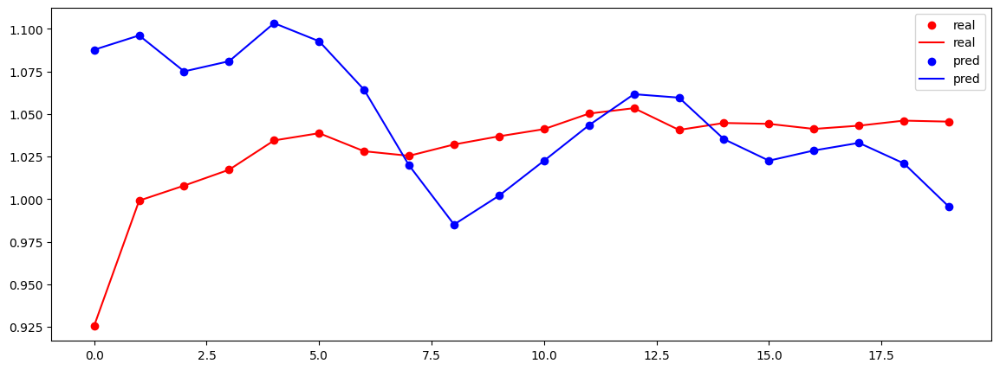

0
NE_Uptake_f3
Test MSE Loss: 0.0108
20


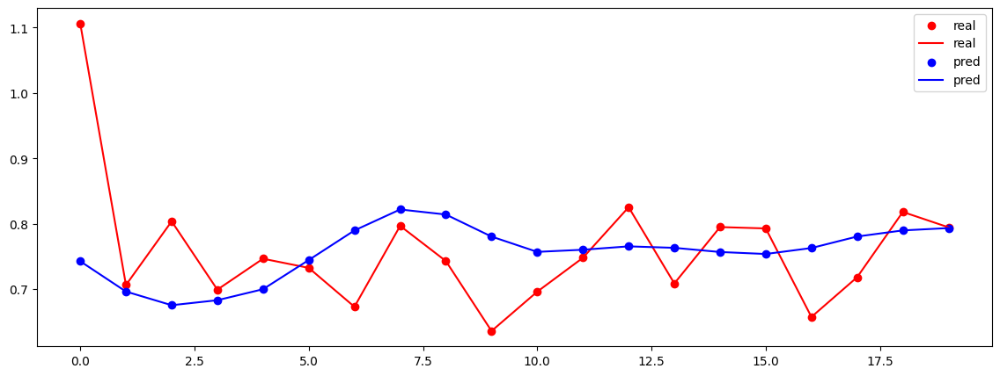

0
SE_Uptake_f3
Test MSE Loss: 0.0312
20


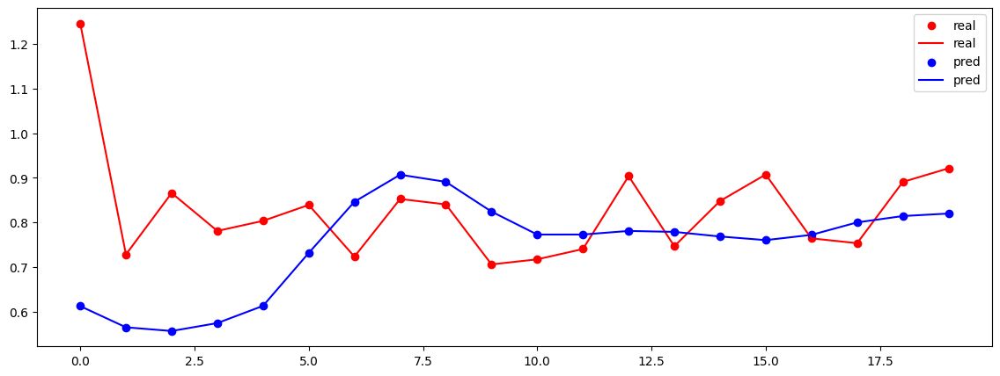

0
NW_Uptake_f3
Test MSE Loss: 0.0072
20


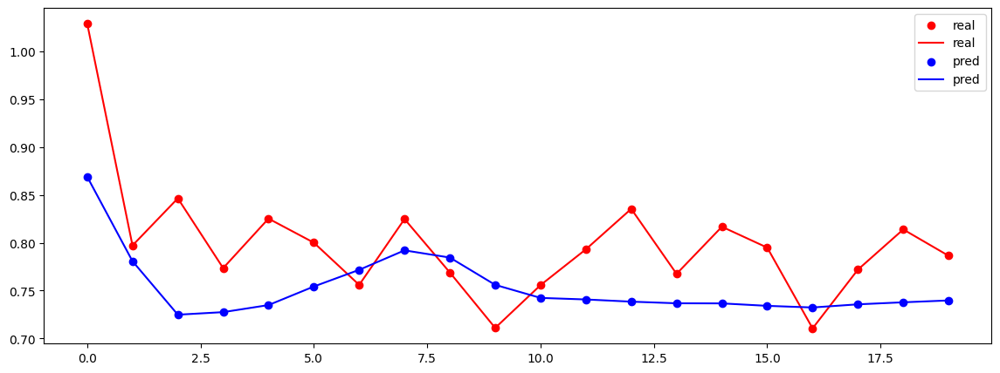

0
SW_Uptake_f3
Test MSE Loss: 0.0307
20


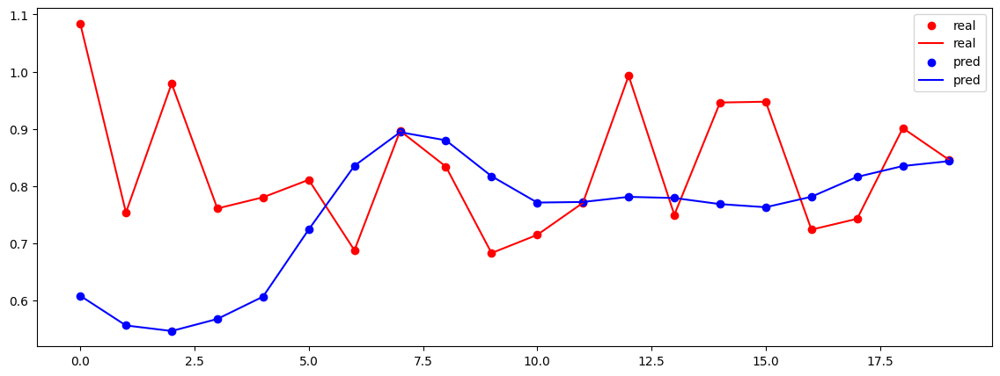

0
Slag_SiO2_f2
Test MSE Loss: 0.0659
20


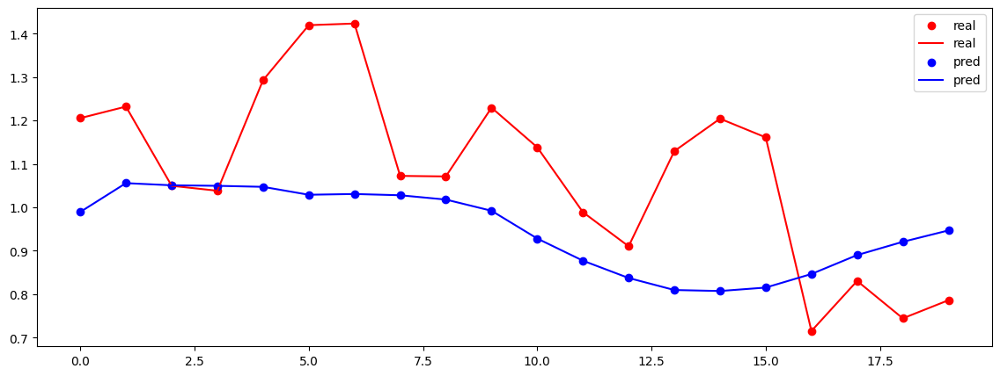

0
Slag_CaO_f2
Test MSE Loss: 0.0670
20


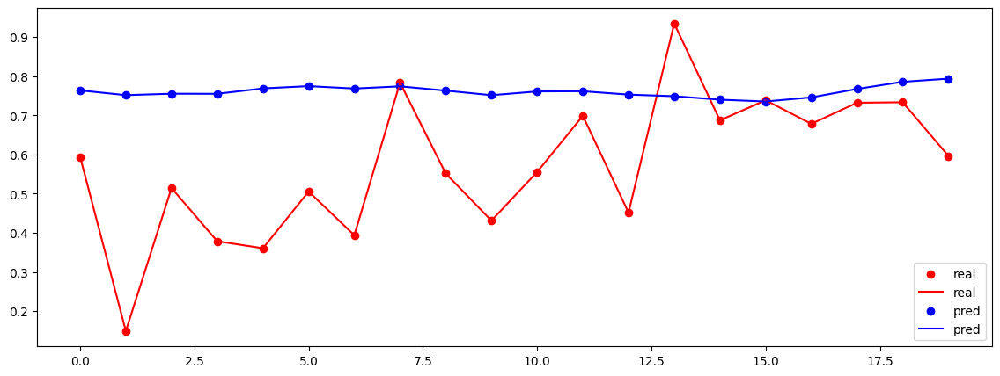

0
Slag_MgO_f2
Test MSE Loss: 0.0406
20


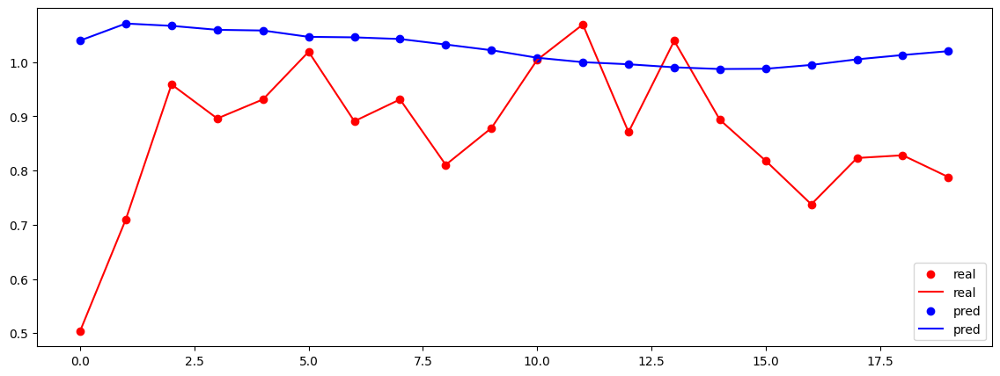

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


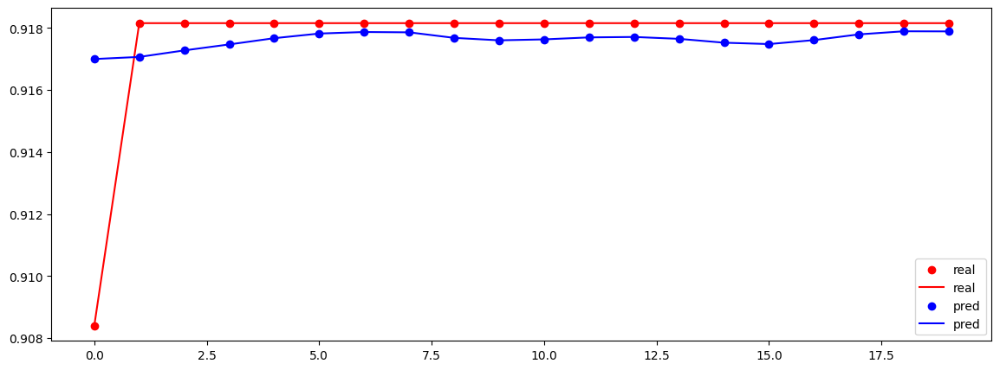

0
TOP_PRESS_f3
Test MSE Loss: 0.0629
20


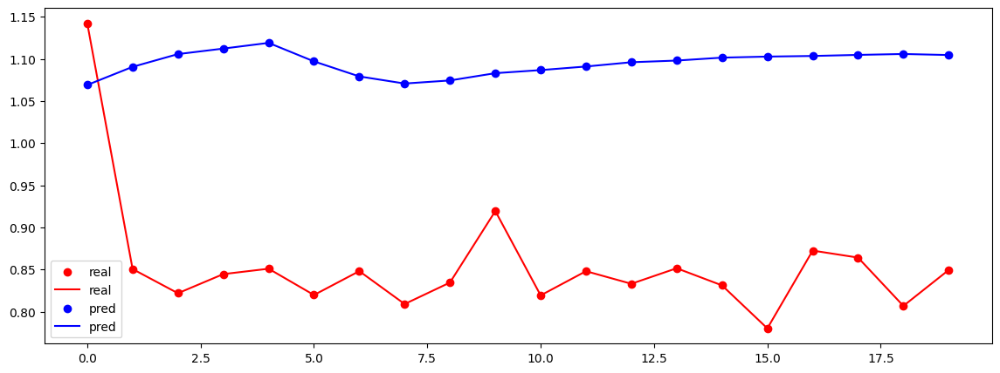

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0409
20


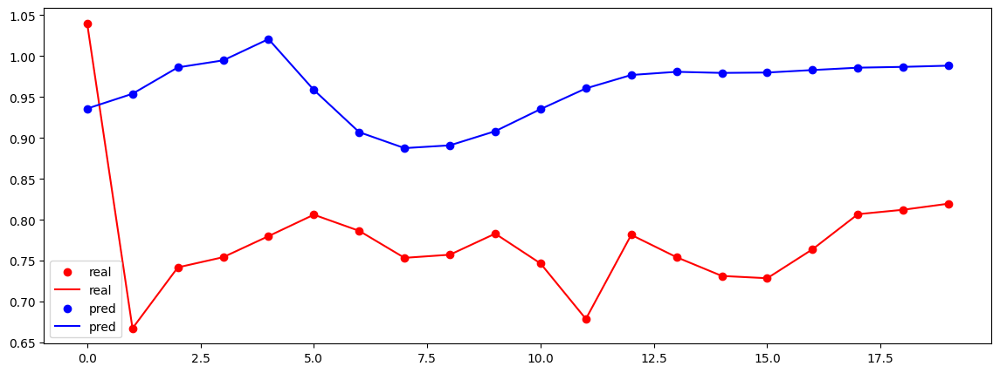

0
cokerate_f4
Test MSE Loss: 0.0234
20


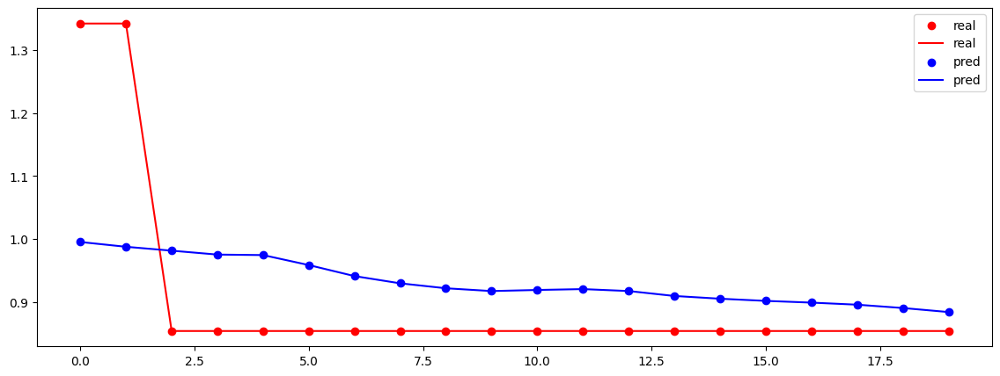

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0269
20


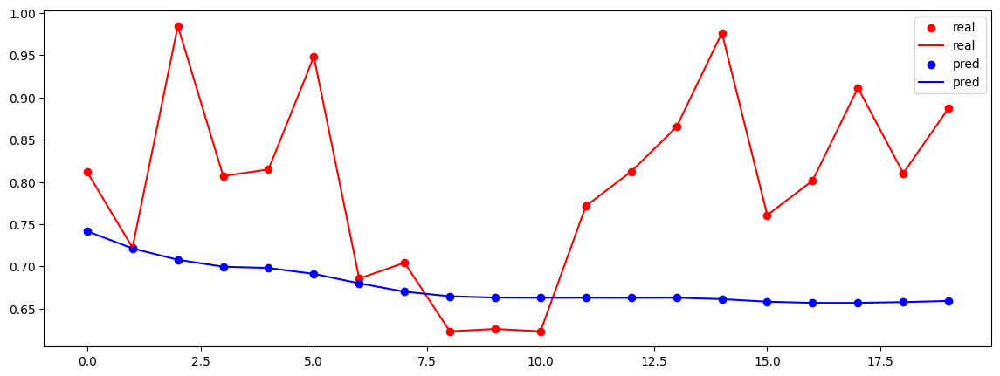

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0007
20


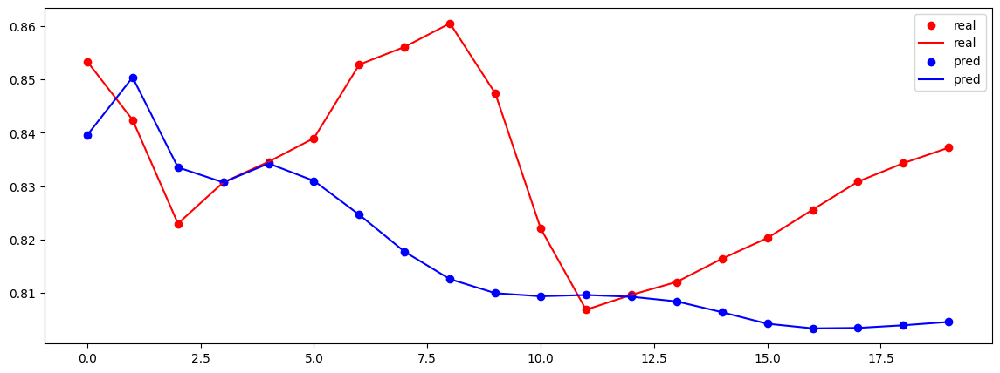

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0004
20


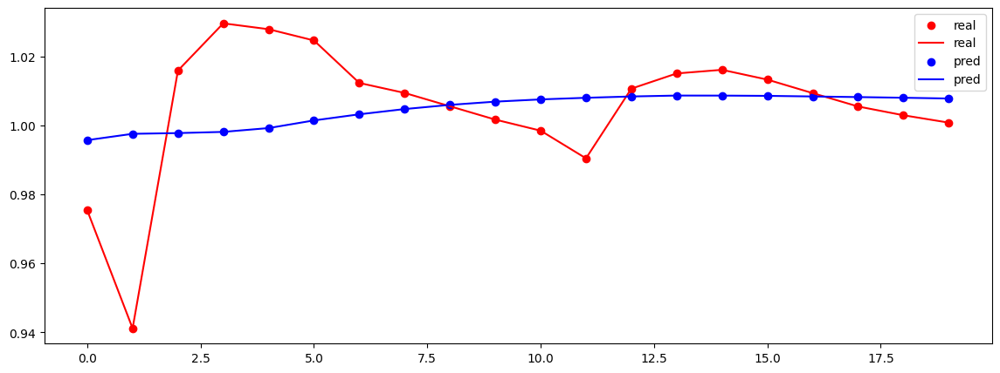

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0109
20


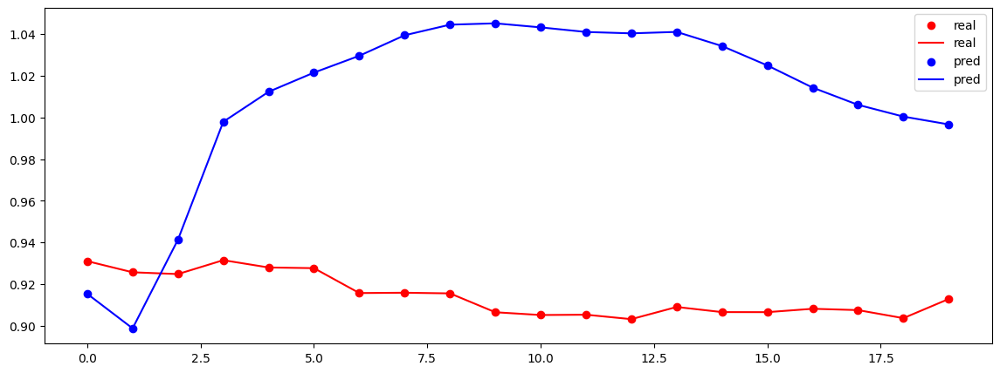

0
WINDRATE_f3
Test MSE Loss: 0.0171
20


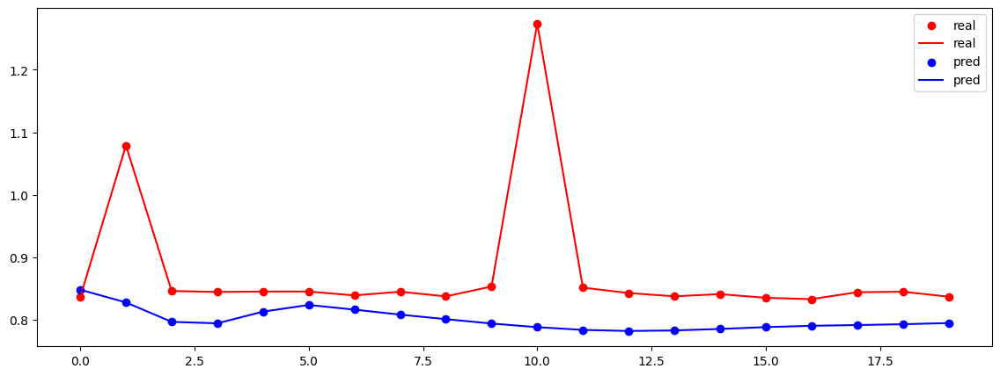

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0005
20


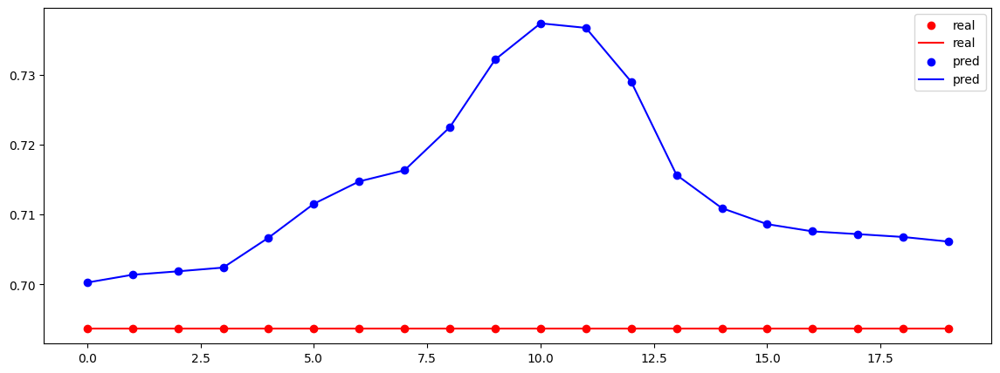

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


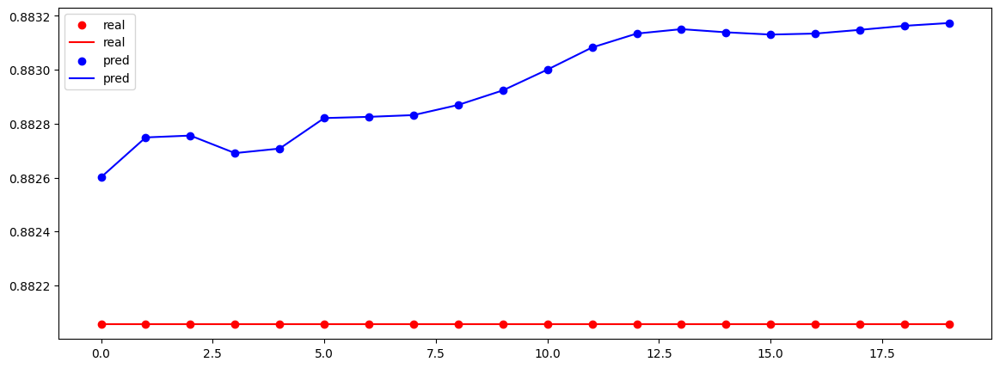

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0127
20


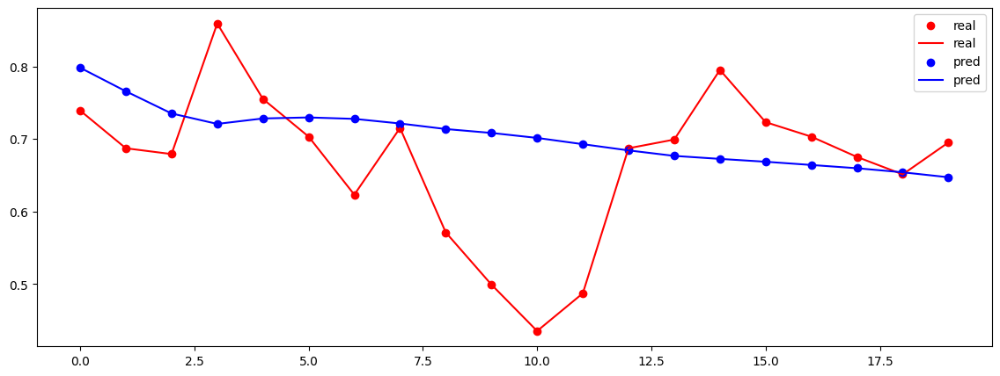

0
Slag_Fe_f2
Test MSE Loss: 0.0193
20


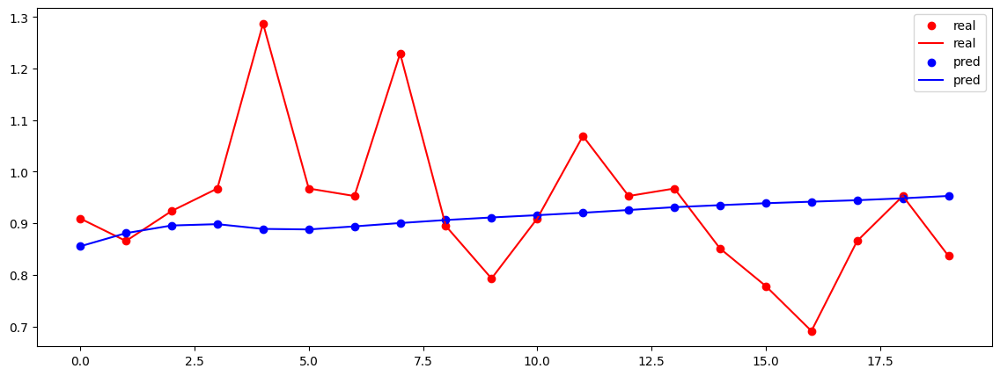

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0096
20


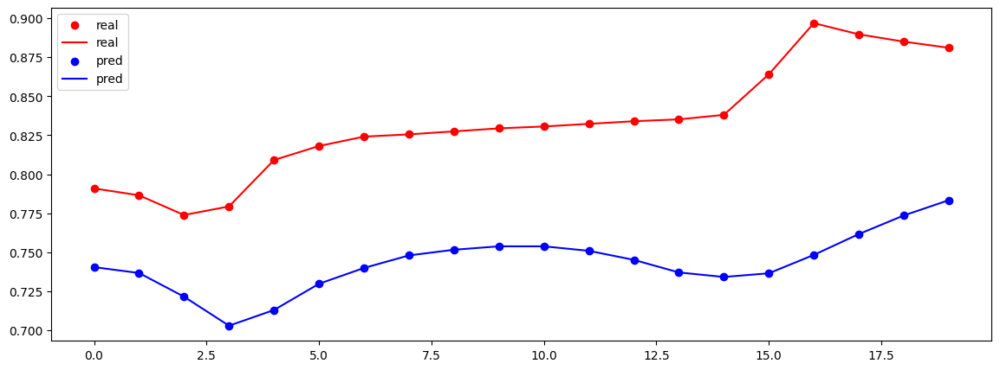

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0039
20


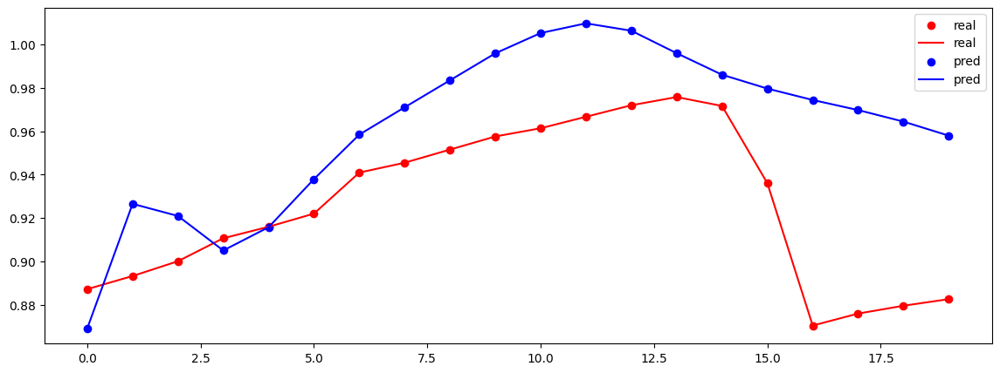

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0017
20


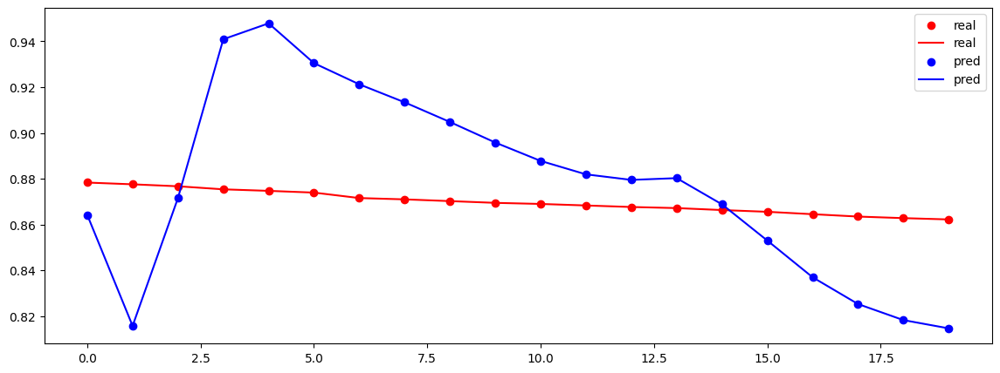

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0030
20


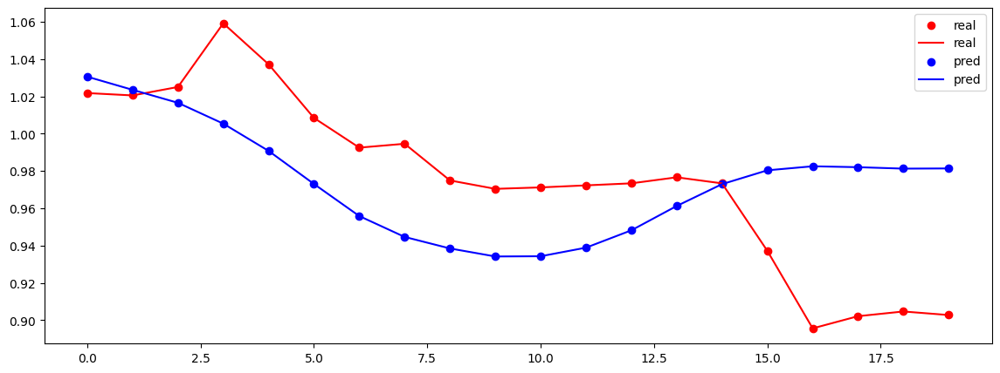

0
NE_Uptake_f3
Test MSE Loss: 0.0079
20


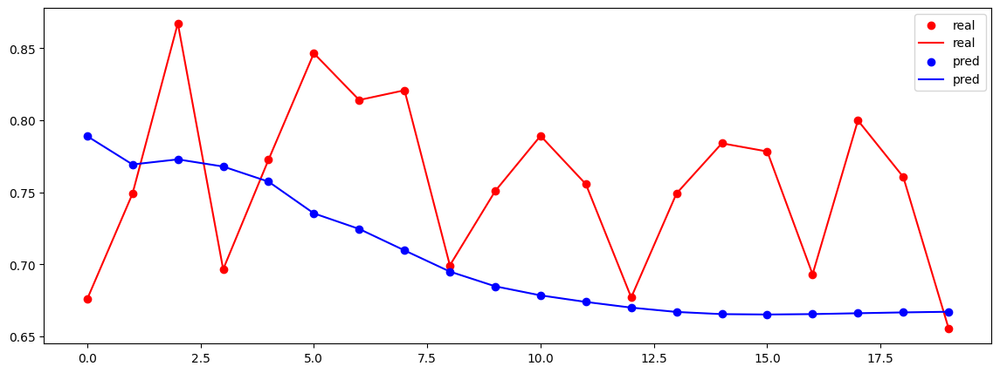

0
SE_Uptake_f3
Test MSE Loss: 0.0695
20


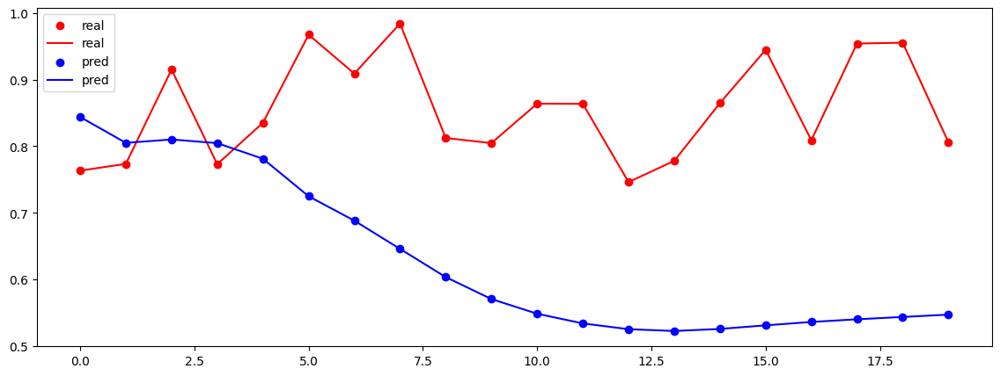

0
NW_Uptake_f3
Test MSE Loss: 0.0079
20


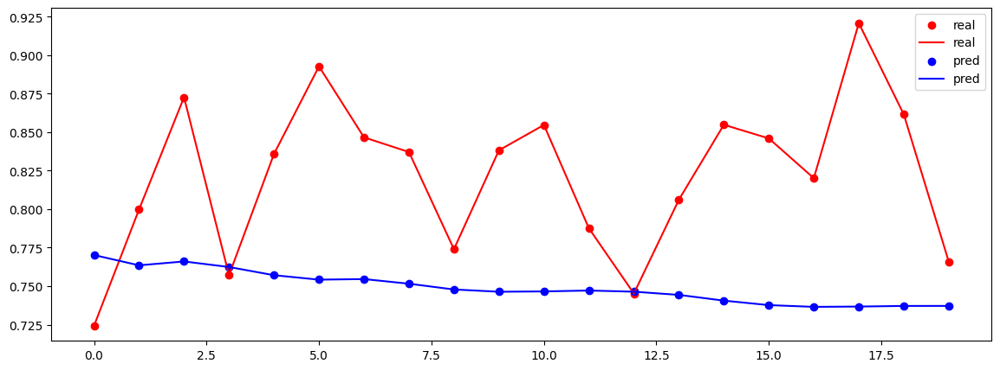

0
SW_Uptake_f3
Test MSE Loss: 0.0764
20


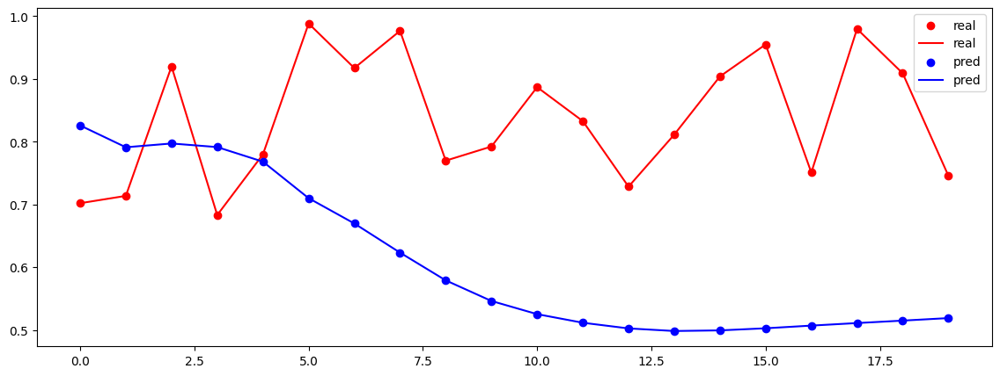

0
Slag_SiO2_f2
Test MSE Loss: 0.0709
20


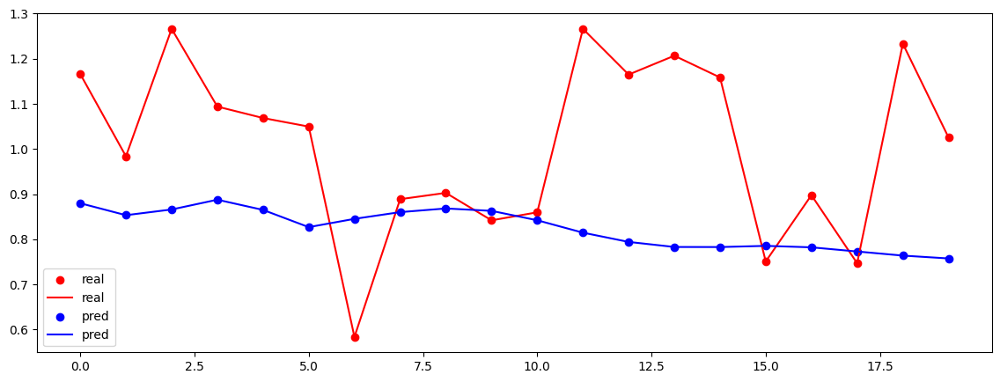

0
Slag_CaO_f2
Test MSE Loss: 0.0084
20


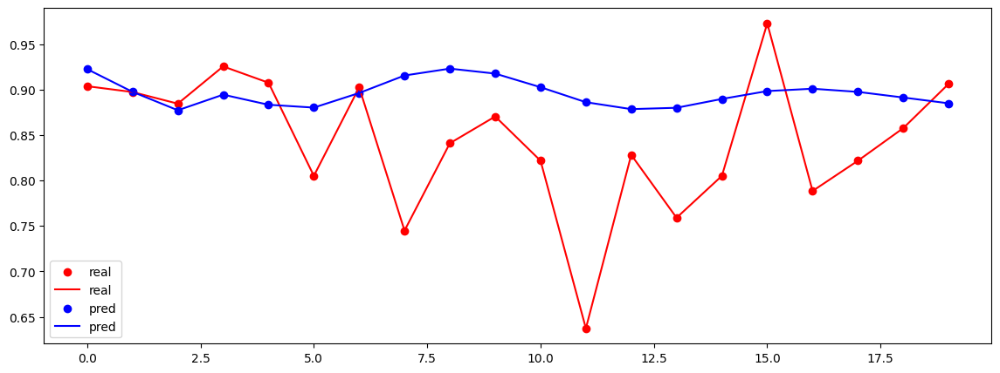

0
Slag_MgO_f2
Test MSE Loss: 0.0124
20


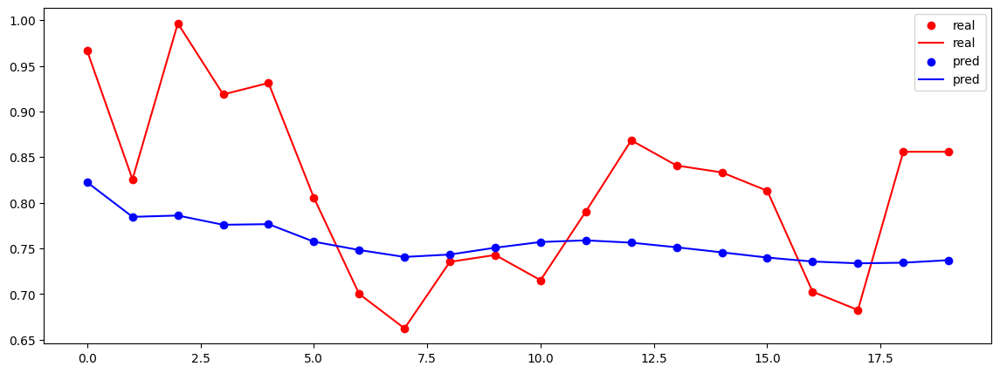

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


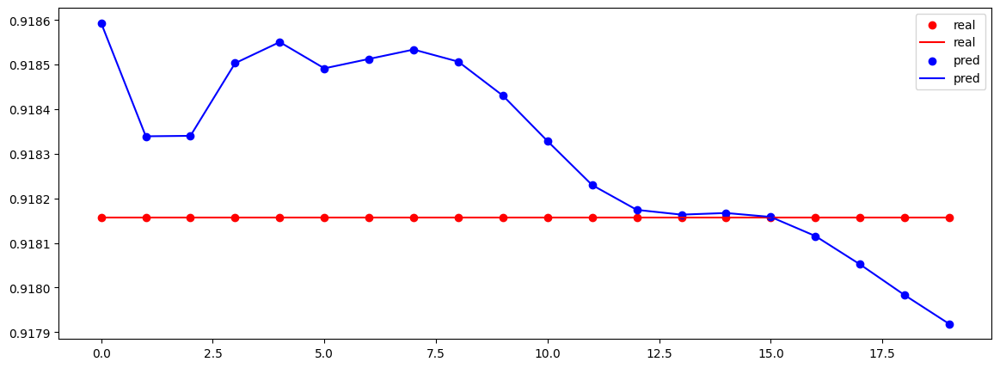

0
TOP_PRESS_f3
Test MSE Loss: 0.0013
20


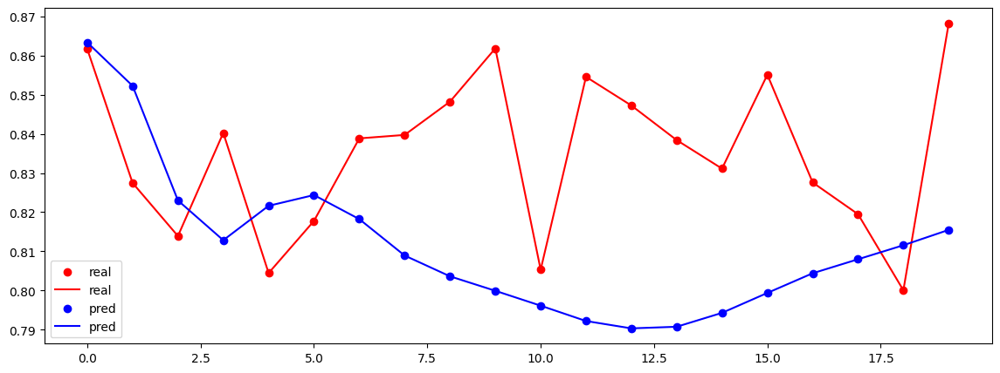

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0071
20


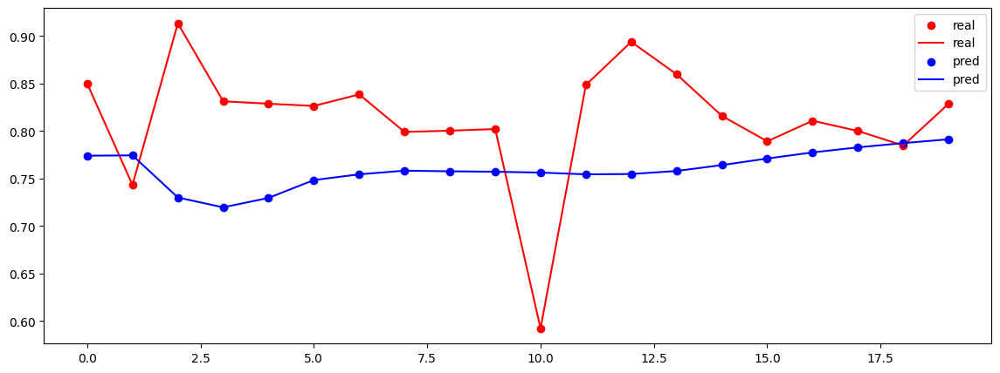

0
cokerate_f4
Test MSE Loss: 0.0186
20


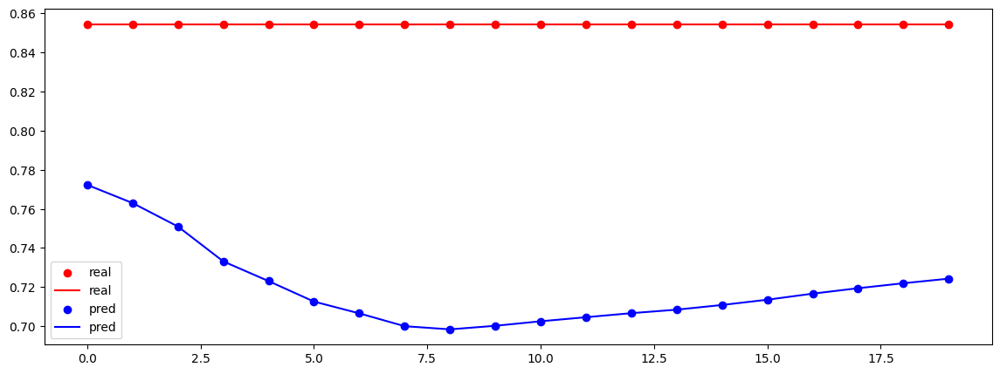

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.1713
20


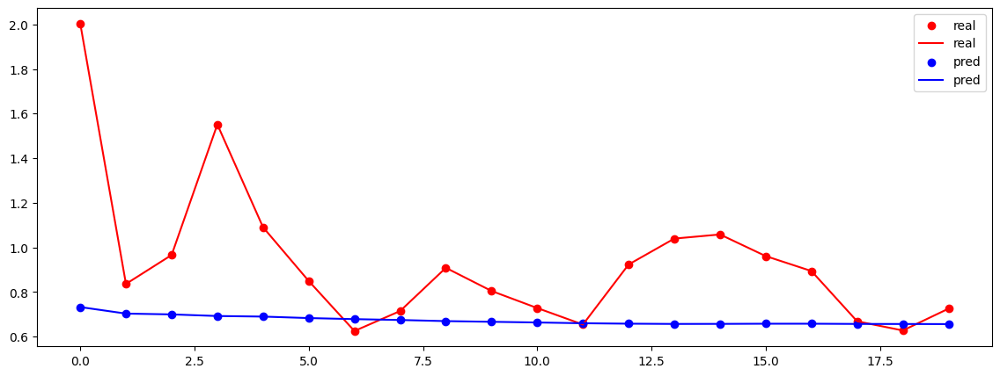

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0030
20


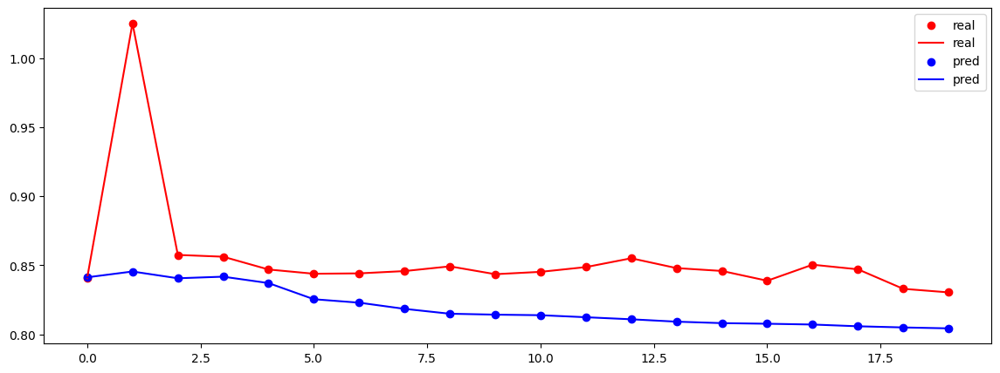

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0174
20


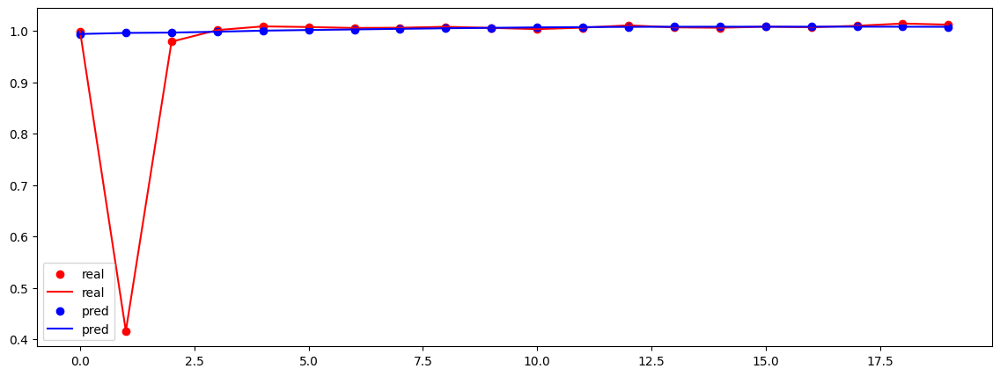

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0272
20


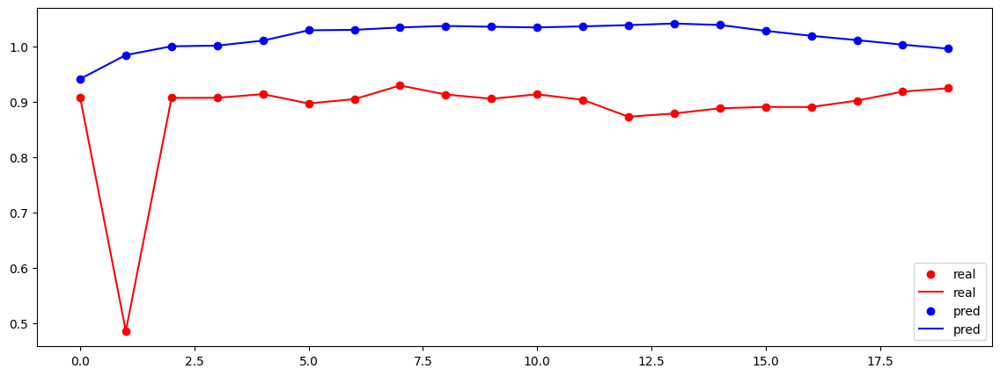

0
WINDRATE_f3
Test MSE Loss: 0.0079
20


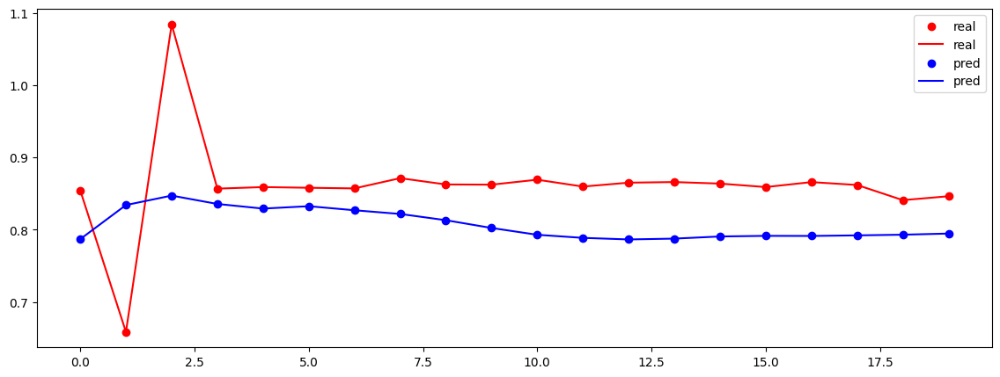

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0011
20


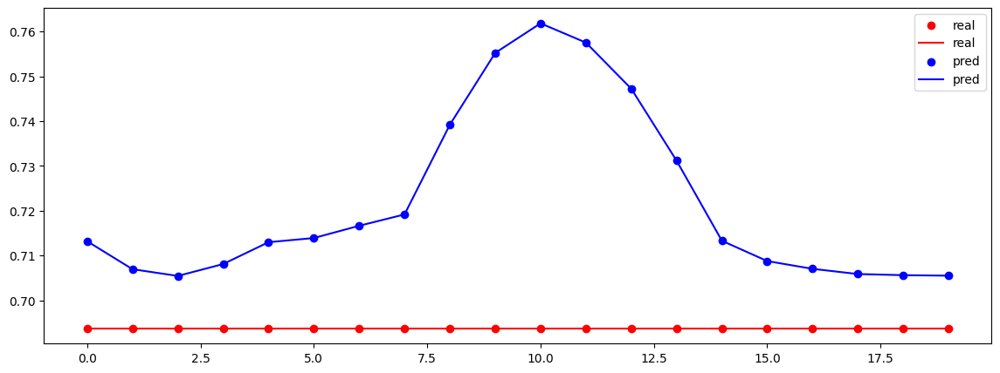

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


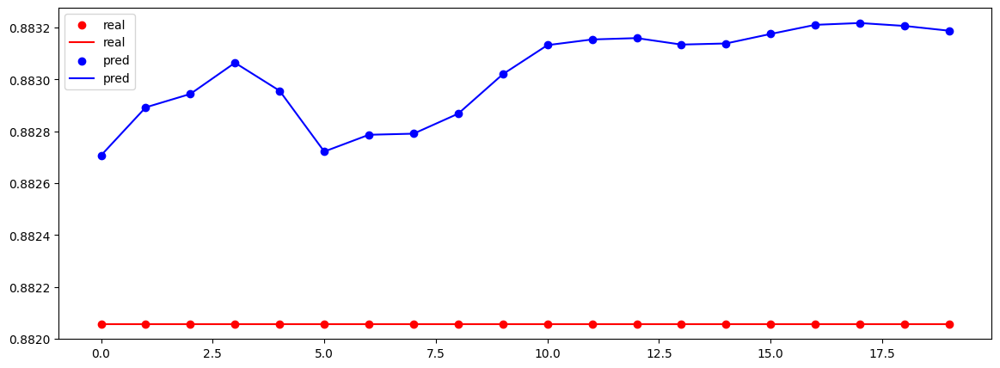

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0067
20


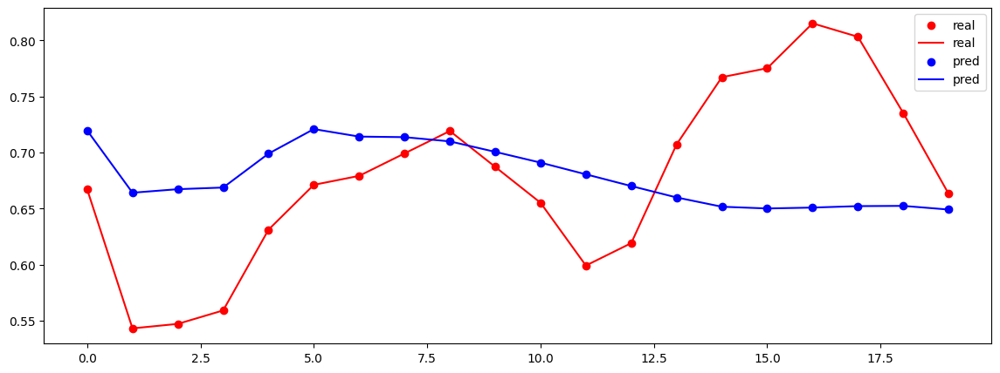

0
Slag_Fe_f2
Test MSE Loss: 0.0362
20


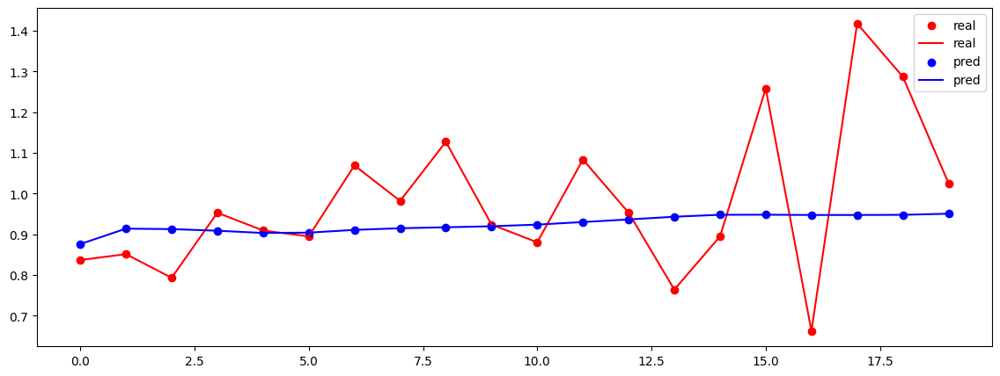

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0418
20


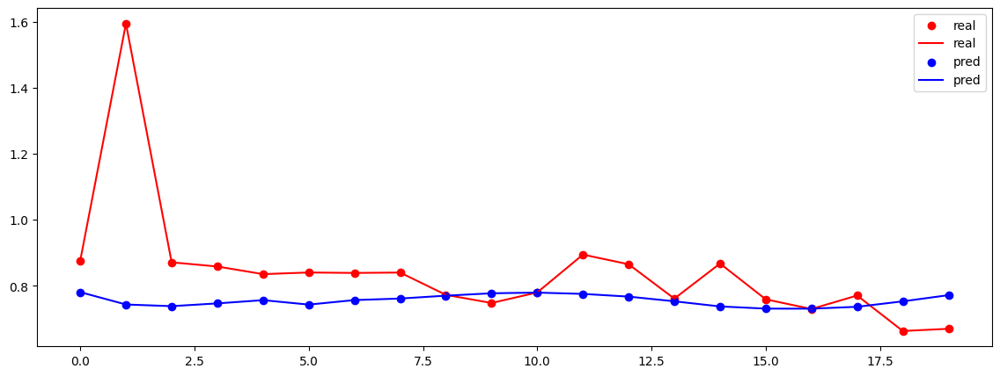

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0626
20


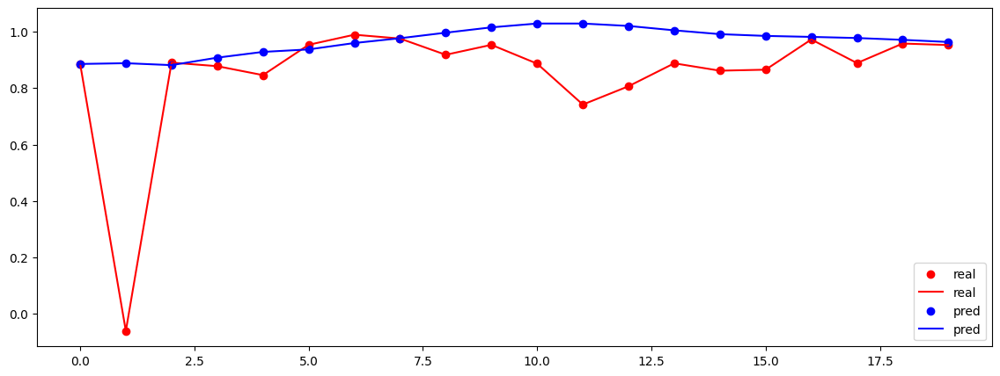

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0152
20


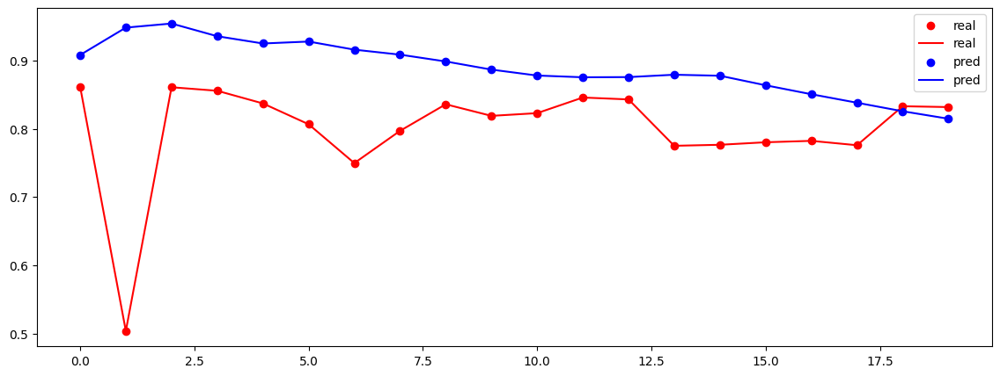

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0131
20


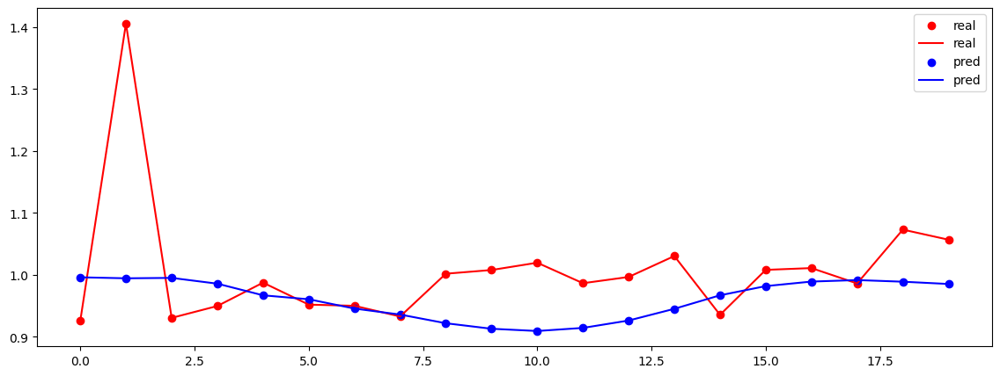

0
NE_Uptake_f3
Test MSE Loss: 0.0137
20


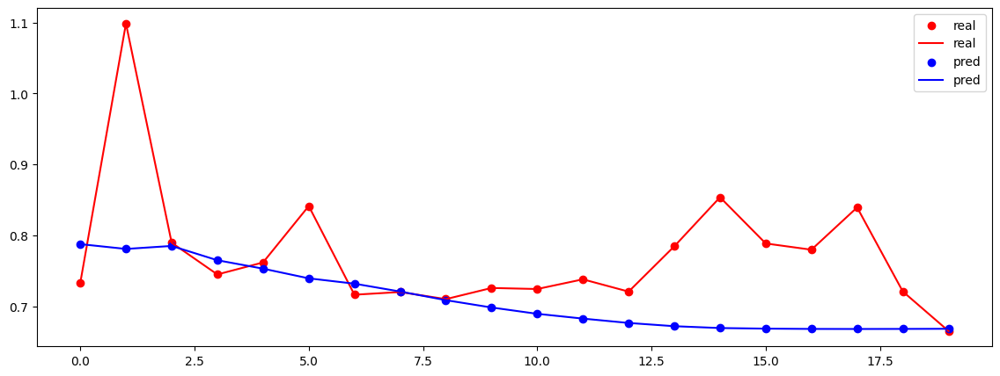

0
SE_Uptake_f3
Test MSE Loss: 0.0672
20


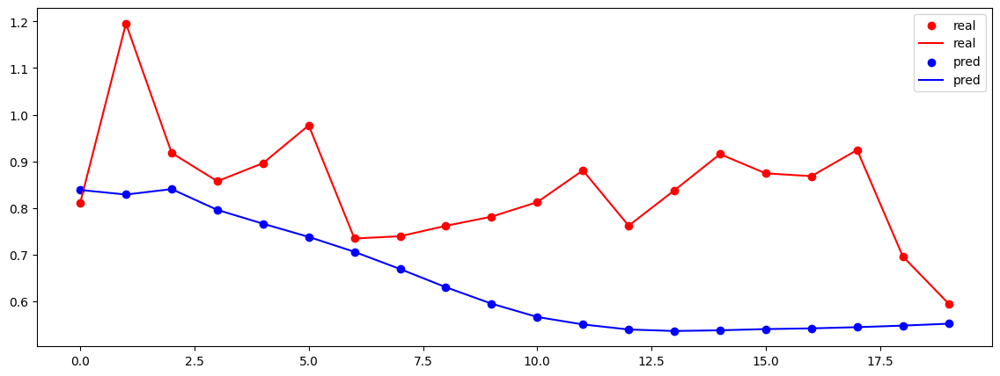

0
NW_Uptake_f3
Test MSE Loss: 0.0123
20


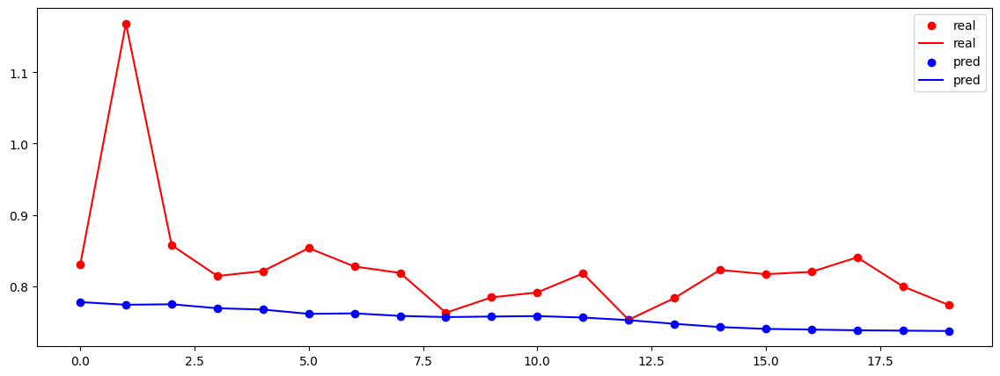

0
SW_Uptake_f3
Test MSE Loss: 0.0832
20


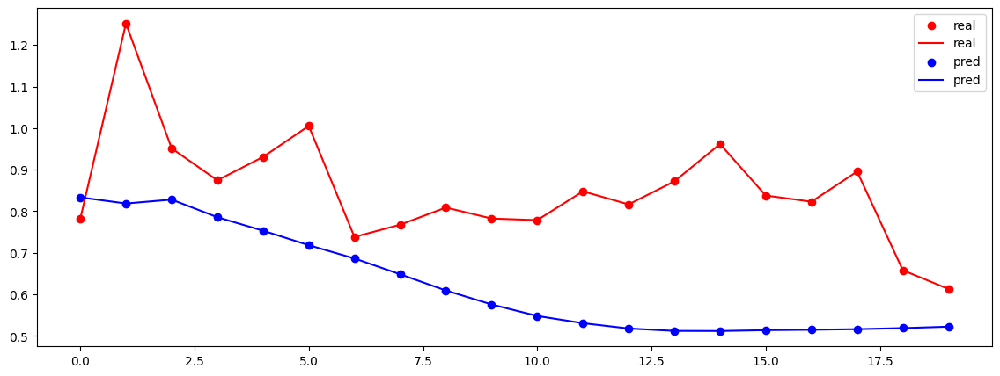

0
Slag_SiO2_f2
Test MSE Loss: 0.0818
20


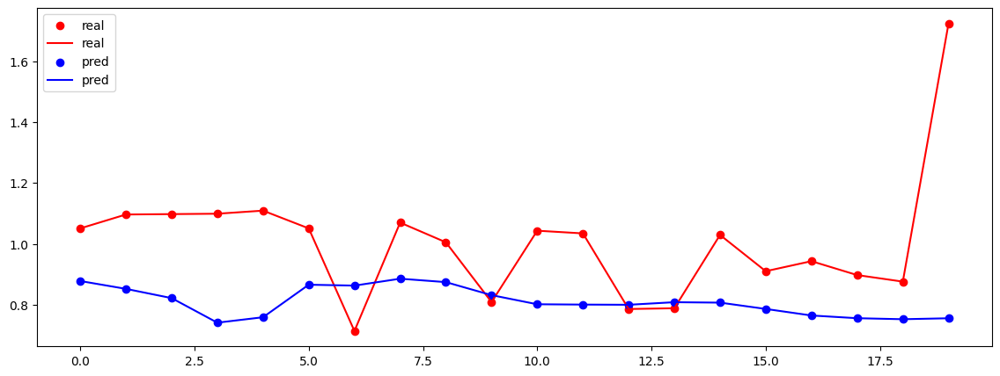

0
Slag_CaO_f2
Test MSE Loss: 0.0615
20


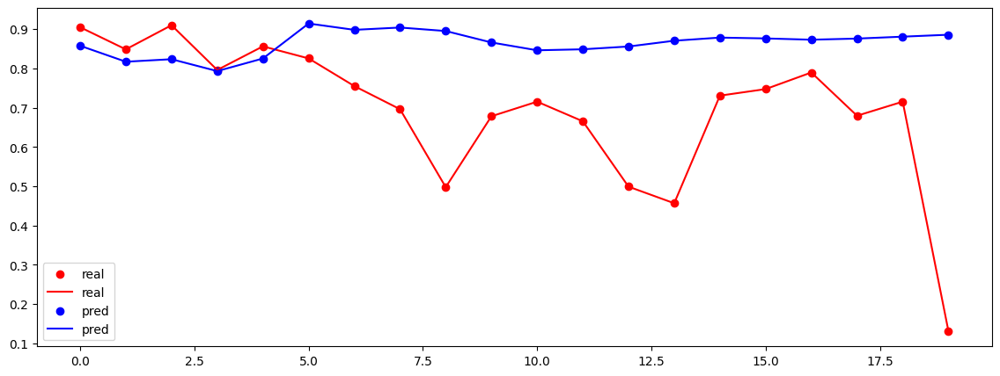

0
Slag_MgO_f2
Test MSE Loss: 0.0462
20


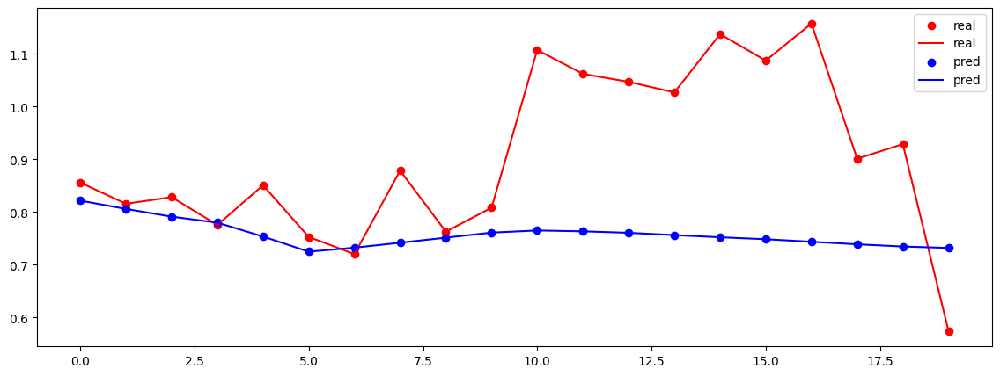

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.2030
20


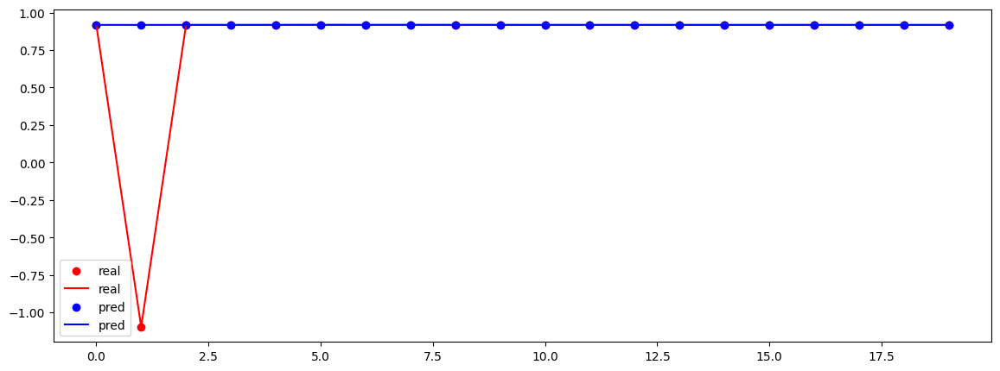

0
TOP_PRESS_f3
Test MSE Loss: 0.0112
20


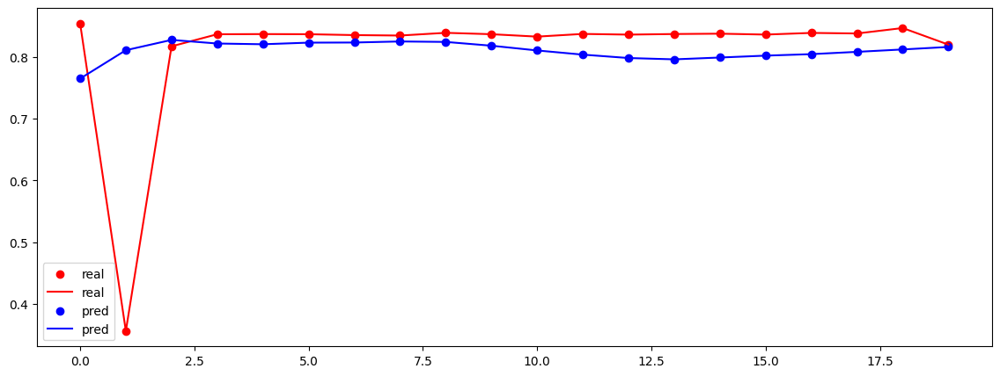

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0153
20


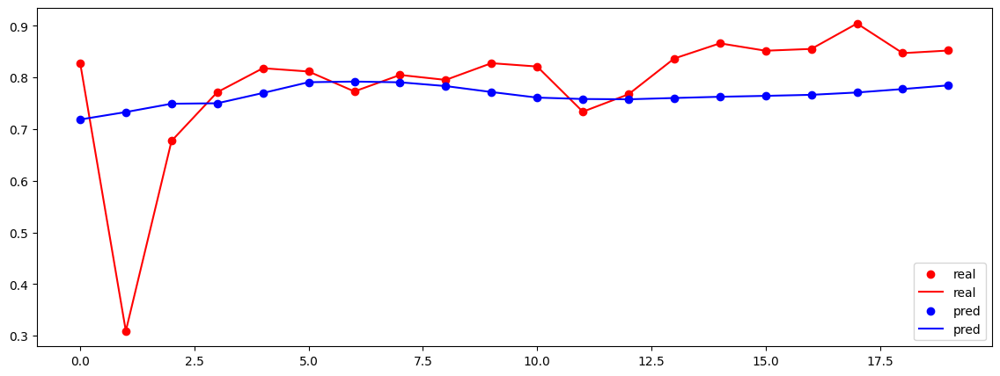

0
cokerate_f4
Test MSE Loss: 0.0756
20


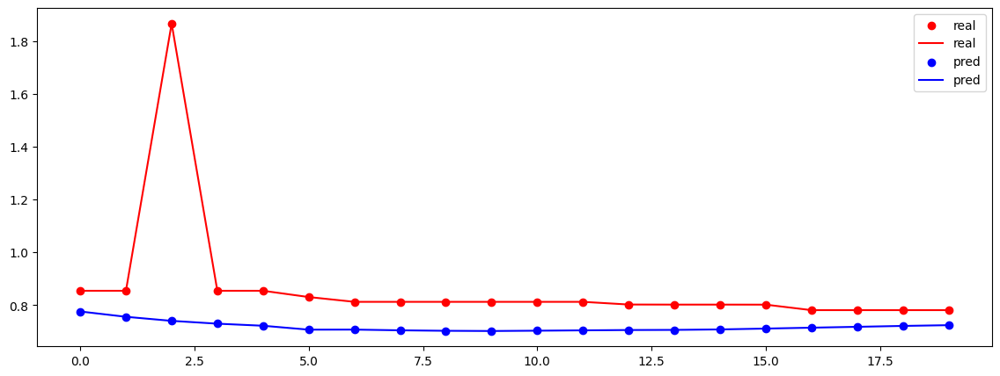

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0226
20


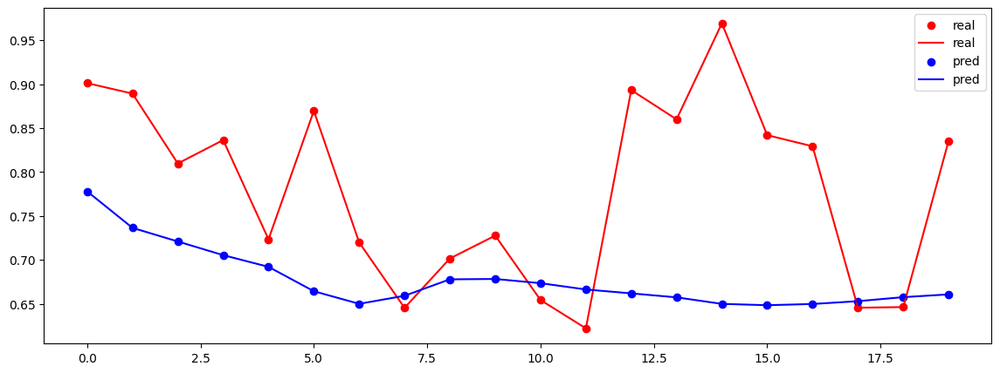

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0023
20


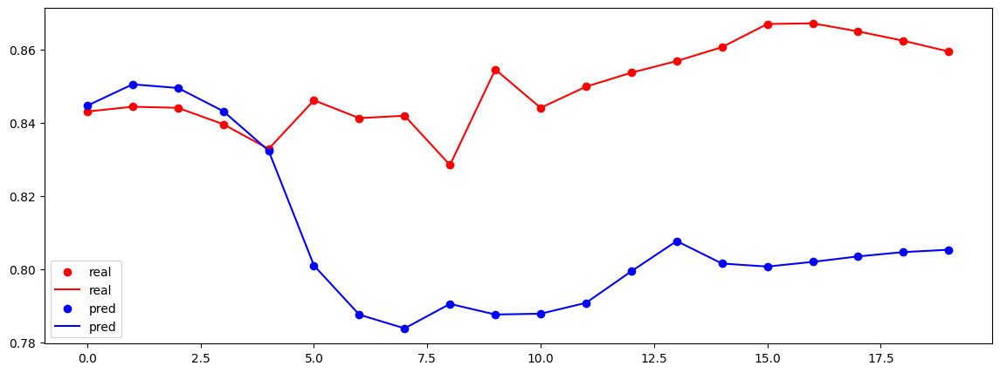

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0001
20


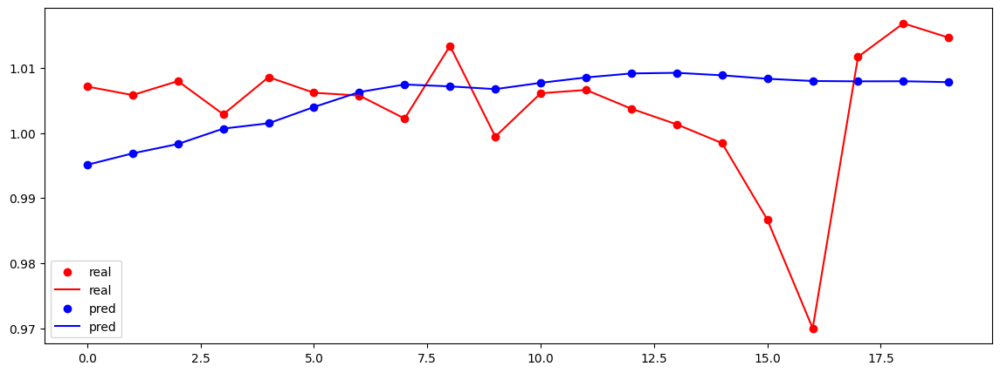

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0211
20


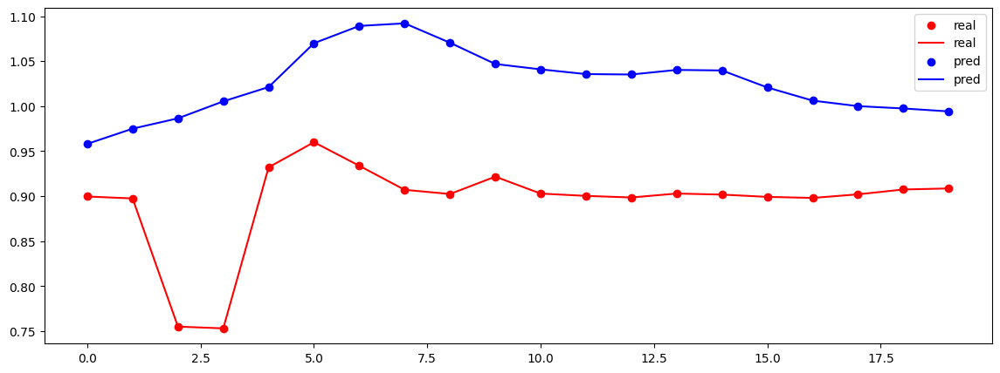

0
WINDRATE_f3
Test MSE Loss: 0.0145
20


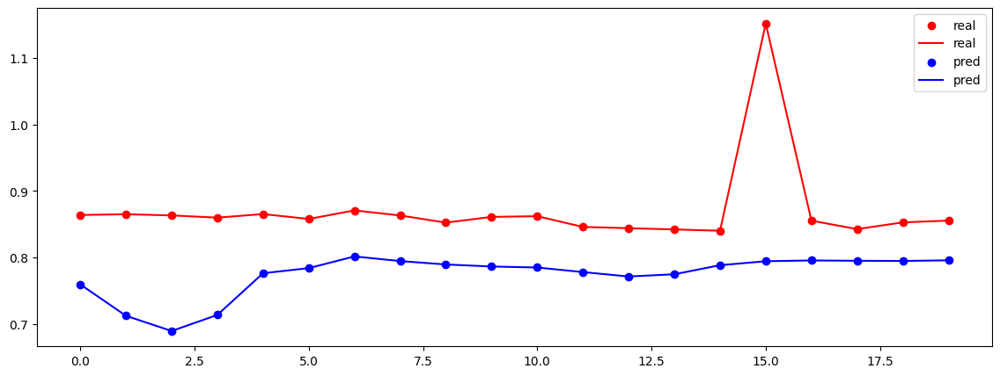

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0022
20


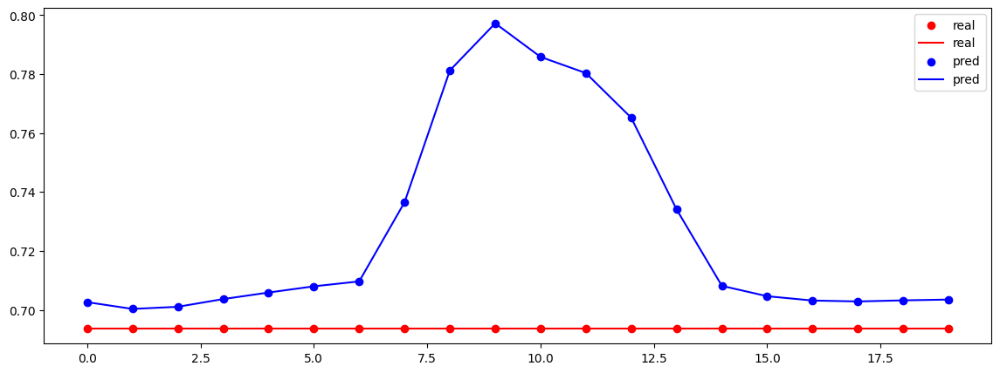

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


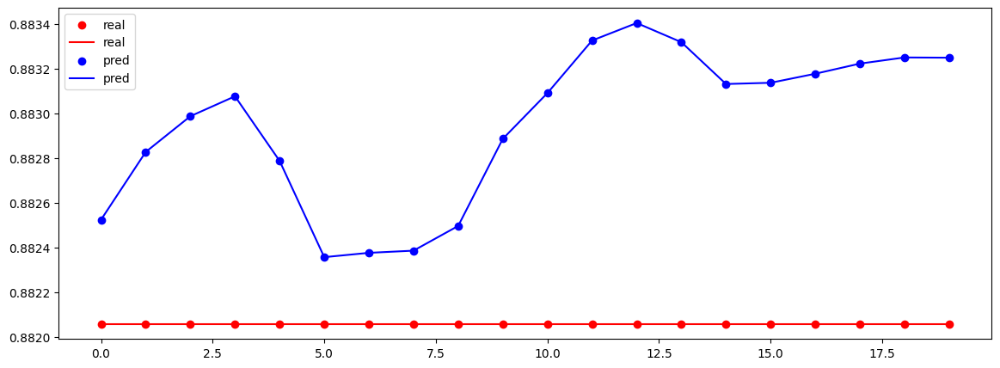

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0148
20


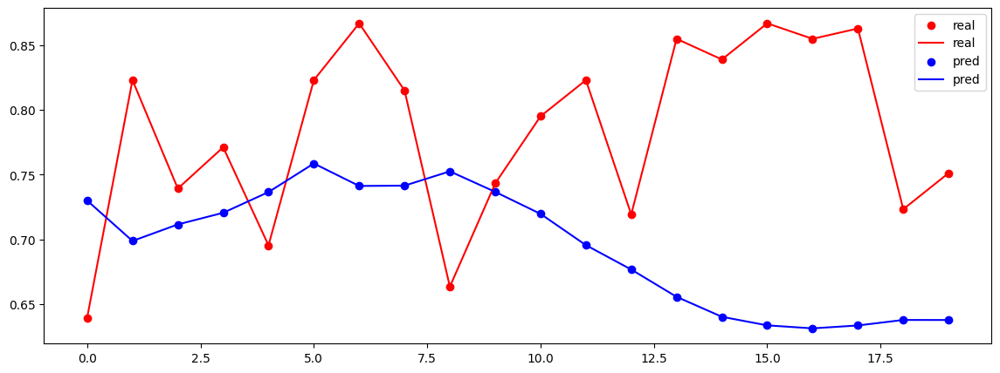

0
Slag_Fe_f2
Test MSE Loss: 0.0112
20


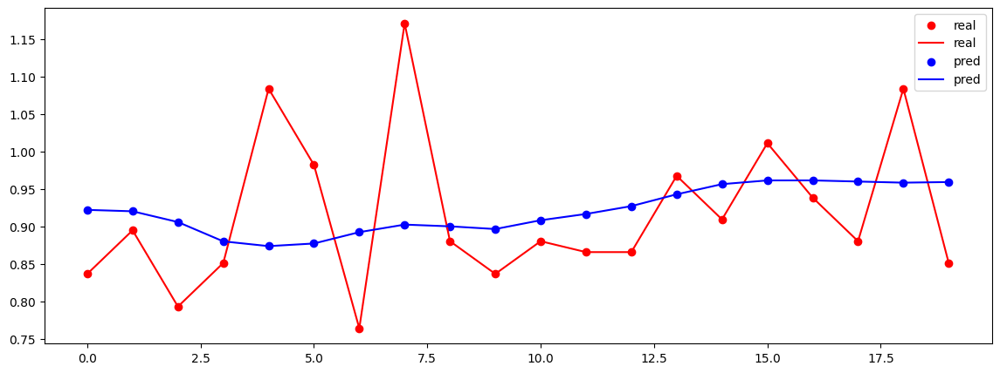

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0105
20


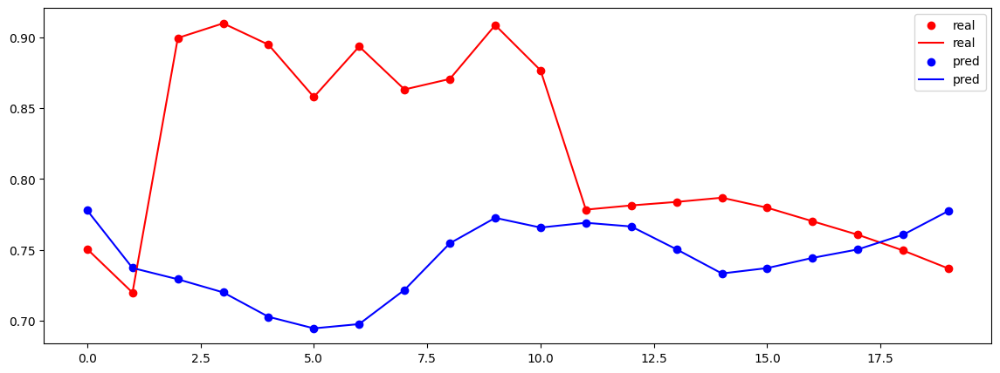

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0156
20


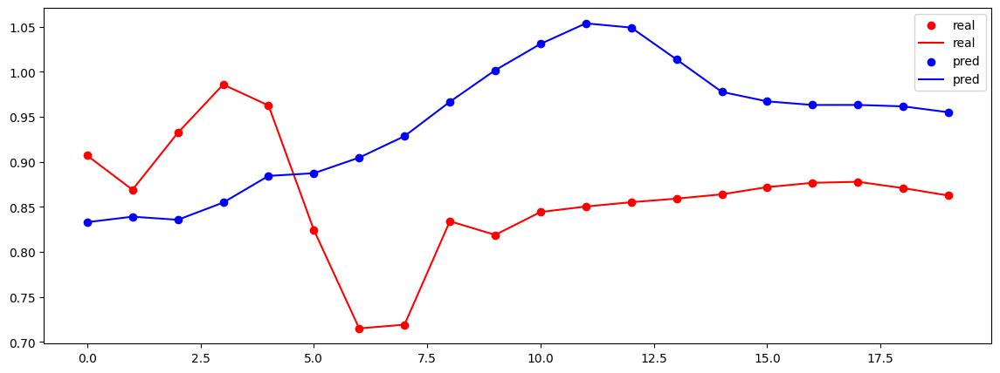

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0160
20


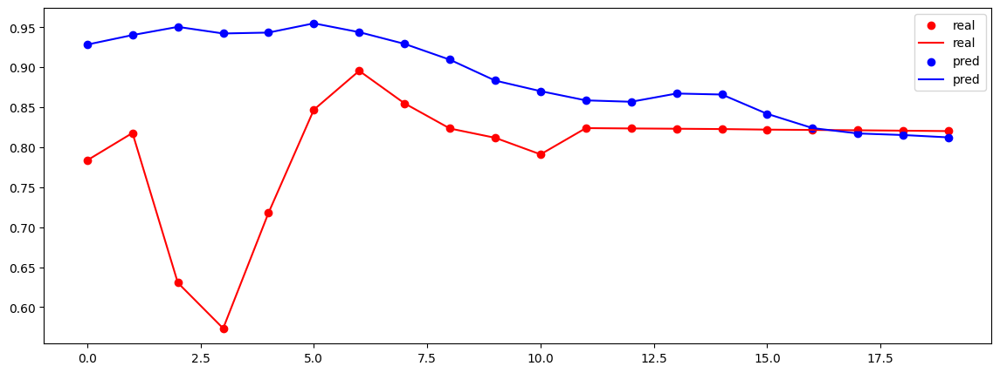

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0033
20


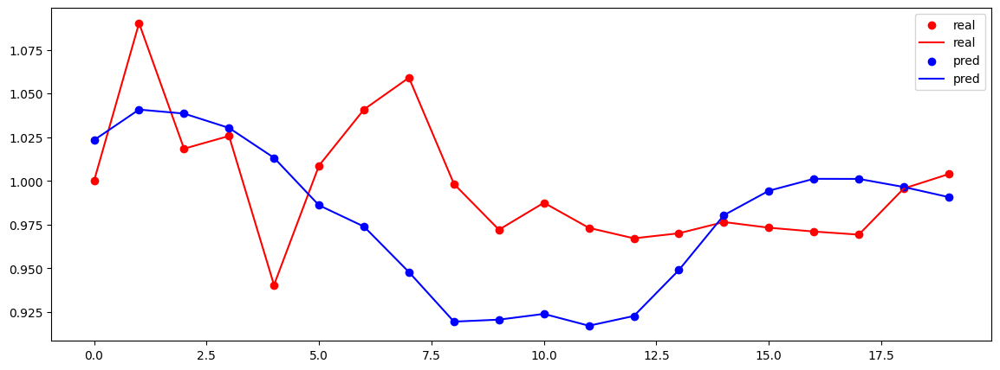

0
NE_Uptake_f3
Test MSE Loss: 0.0033
20


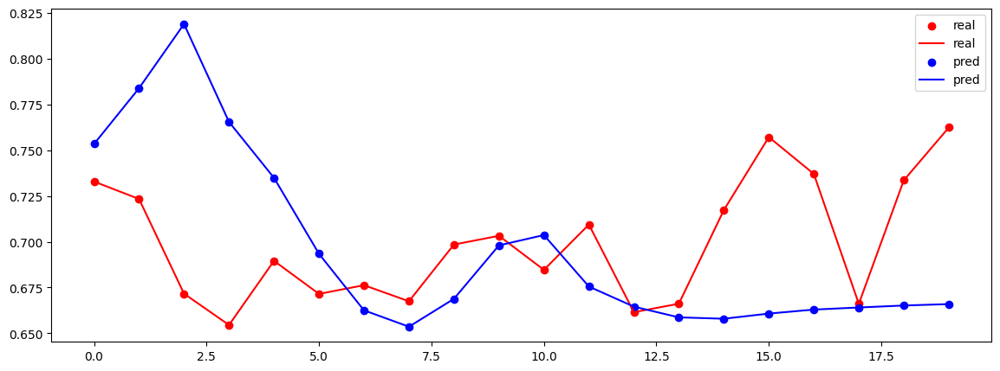

0
SE_Uptake_f3
Test MSE Loss: 0.0332
20


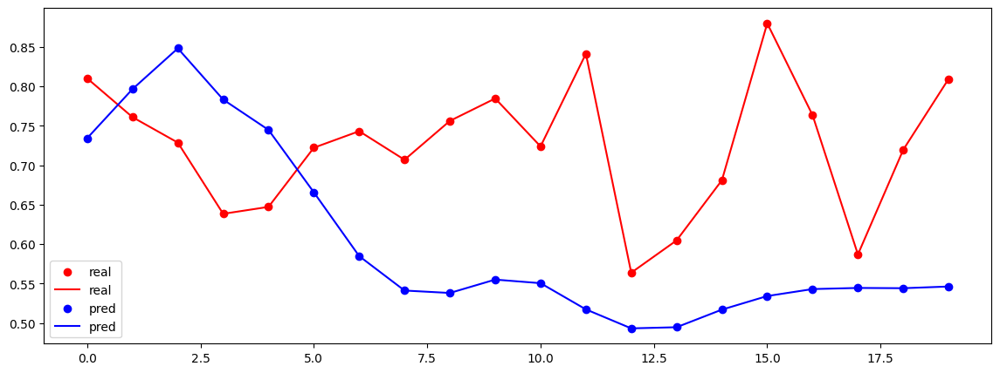

0
NW_Uptake_f3
Test MSE Loss: 0.0009
20


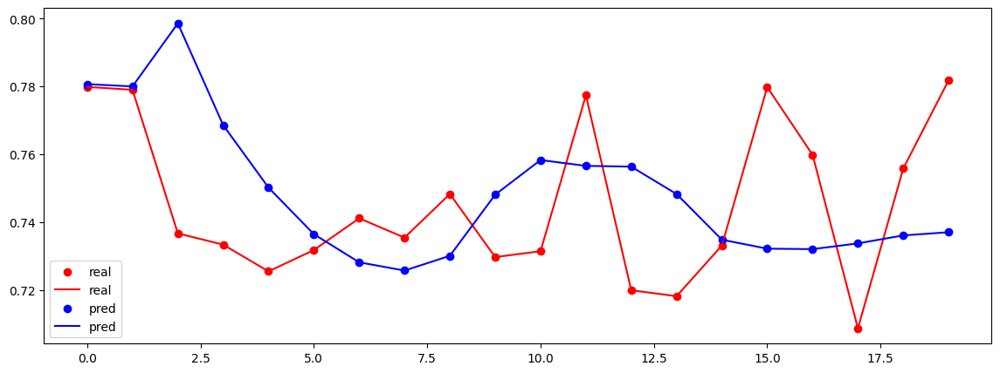

0
SW_Uptake_f3
Test MSE Loss: 0.0491
20


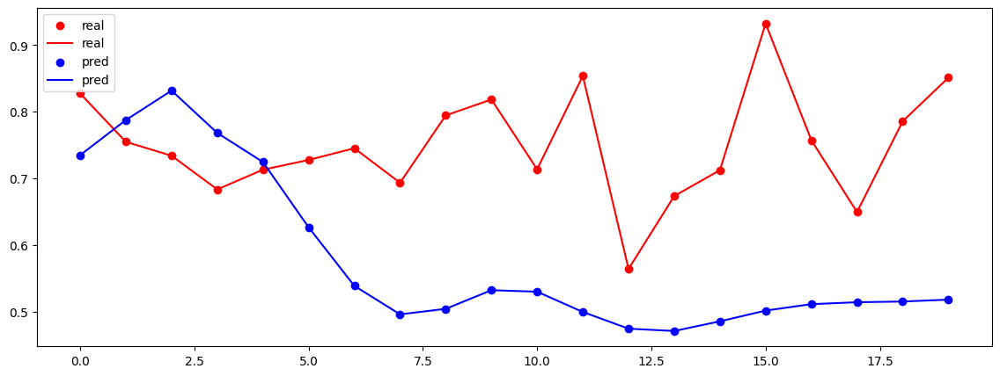

0
Slag_SiO2_f2
Test MSE Loss: 0.0237
20


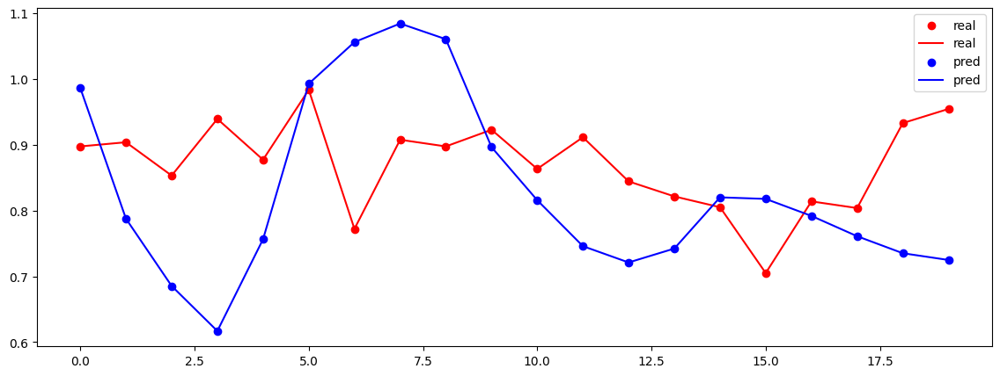

0
Slag_CaO_f2
Test MSE Loss: 0.0380
20


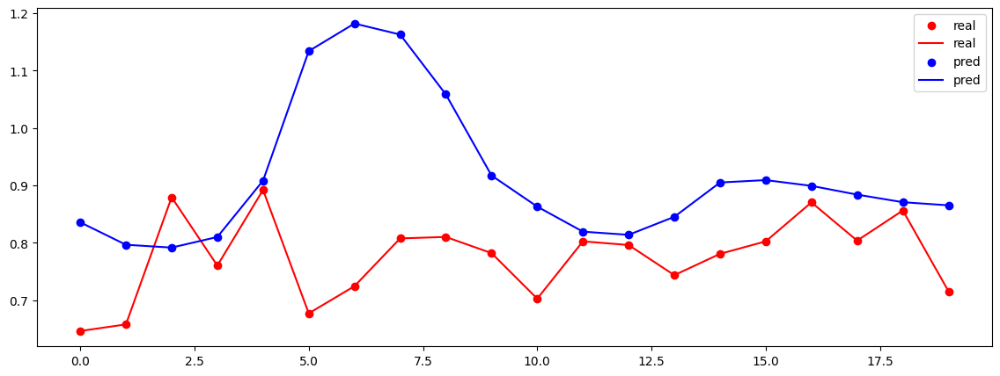

0
Slag_MgO_f2
Test MSE Loss: 0.0379
20


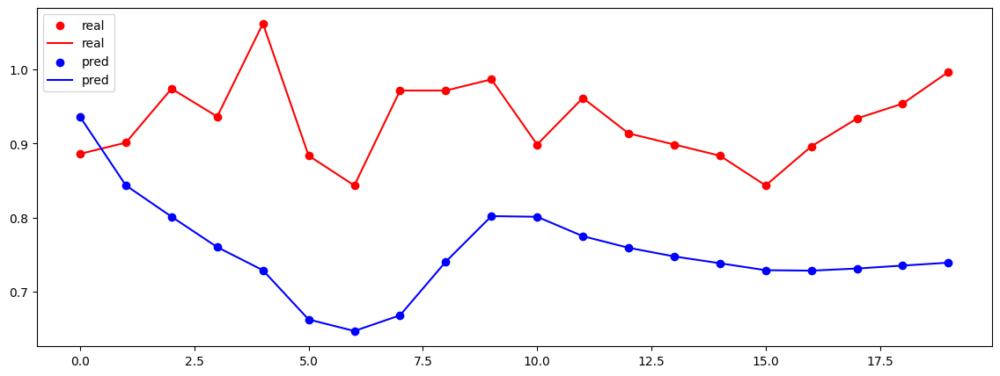

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


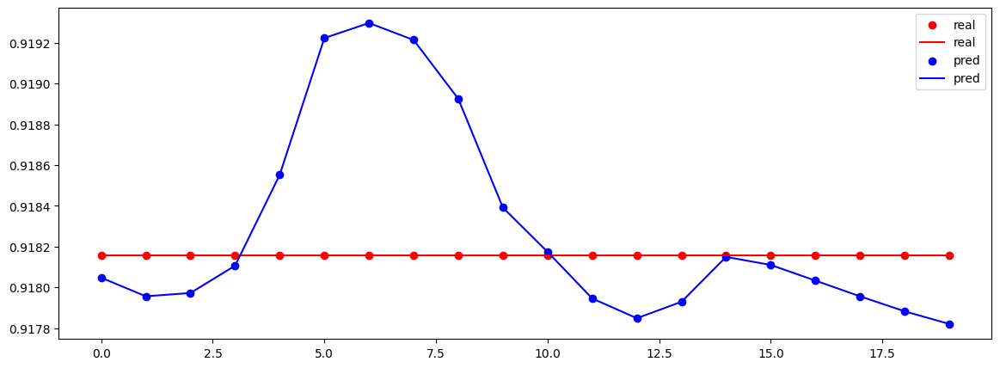

0
TOP_PRESS_f3
Test MSE Loss: 0.0050
20


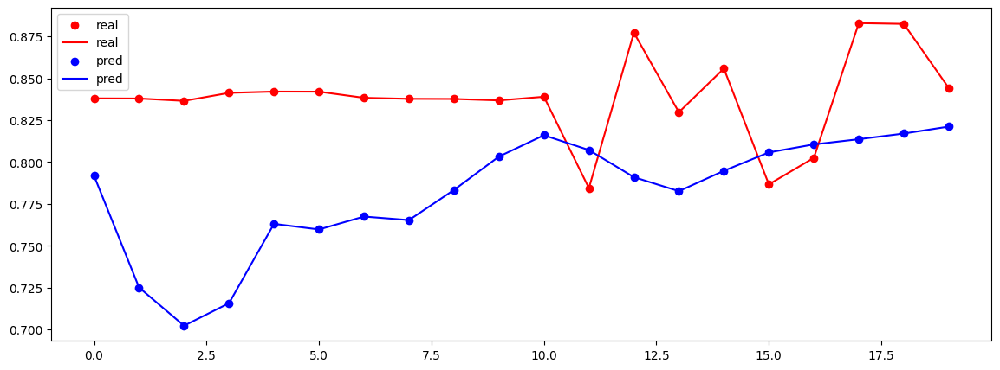

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0504
20


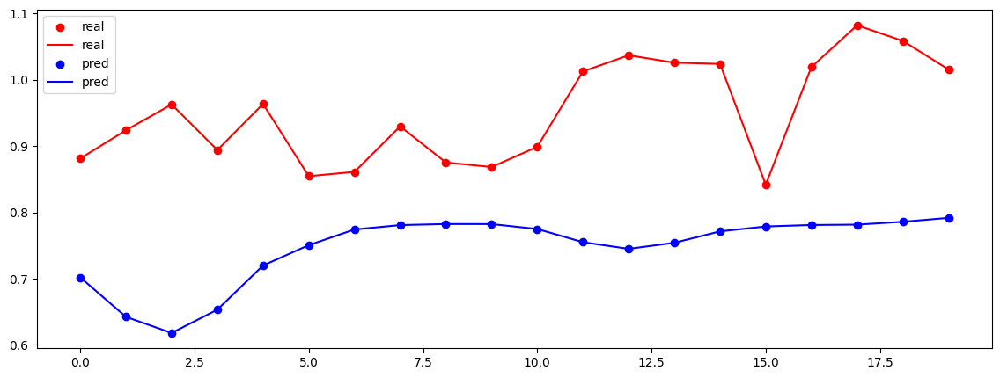

0
cokerate_f4
Test MSE Loss: 0.0046
20


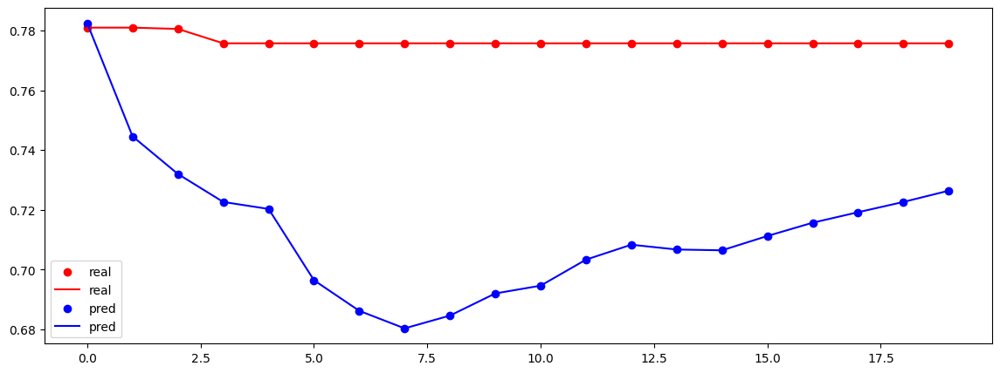

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0090
20


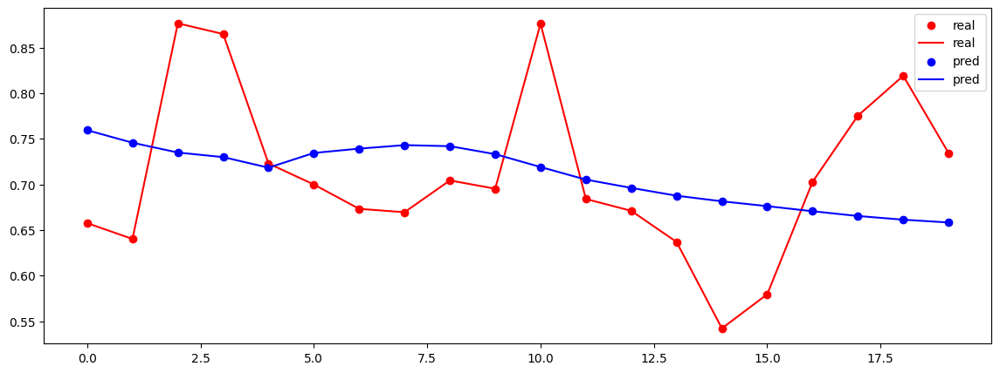

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0007
20


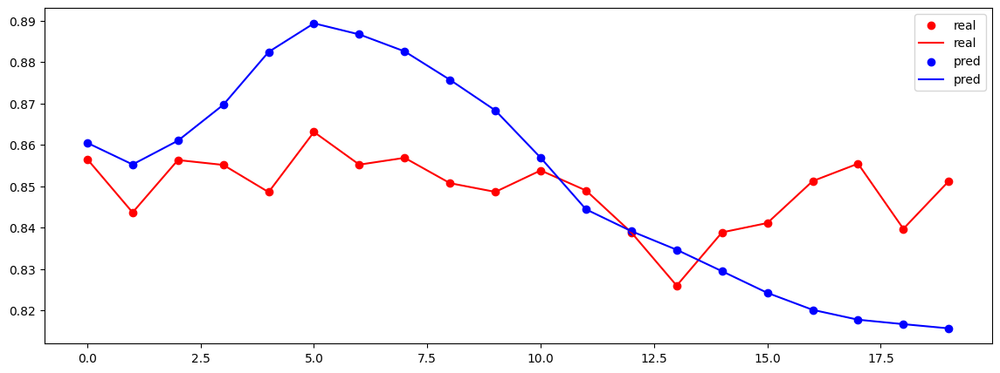

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0001
20


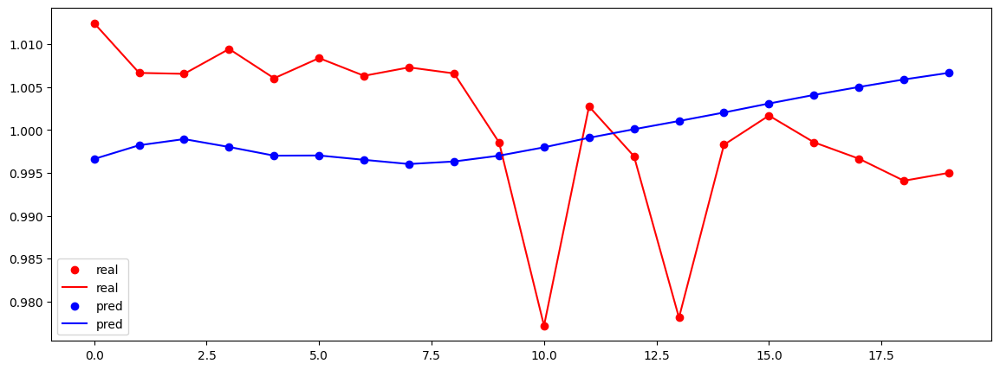

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0067
20


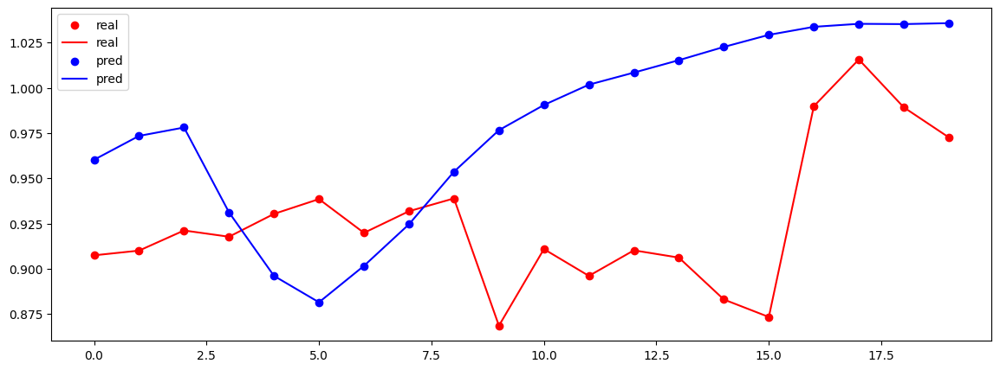

0
WINDRATE_f3
Test MSE Loss: 0.0018
20


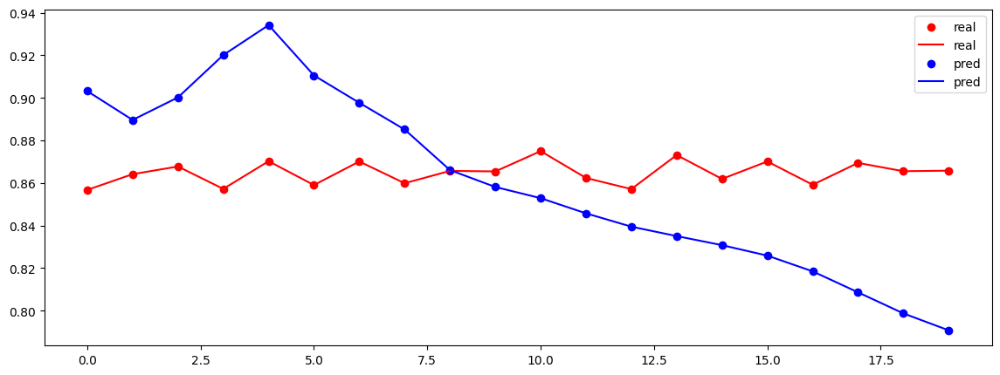

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0009
20


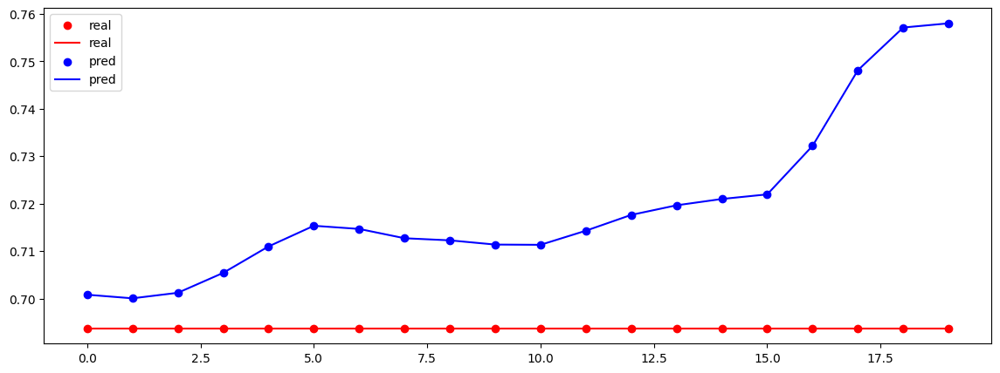

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


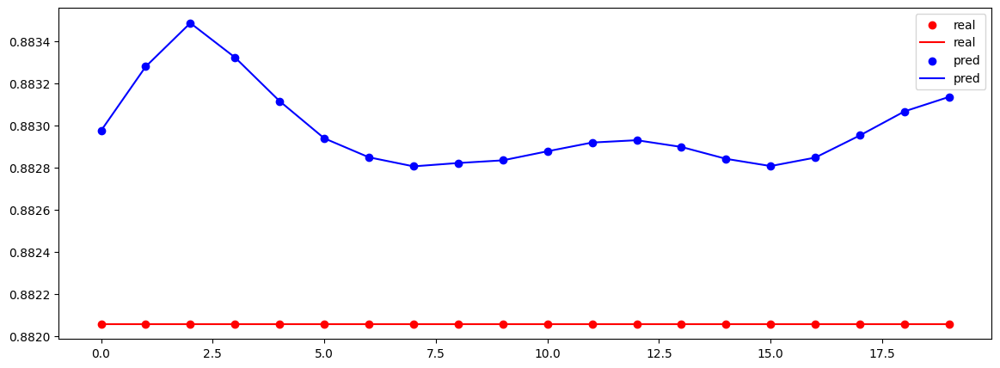

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0054
20


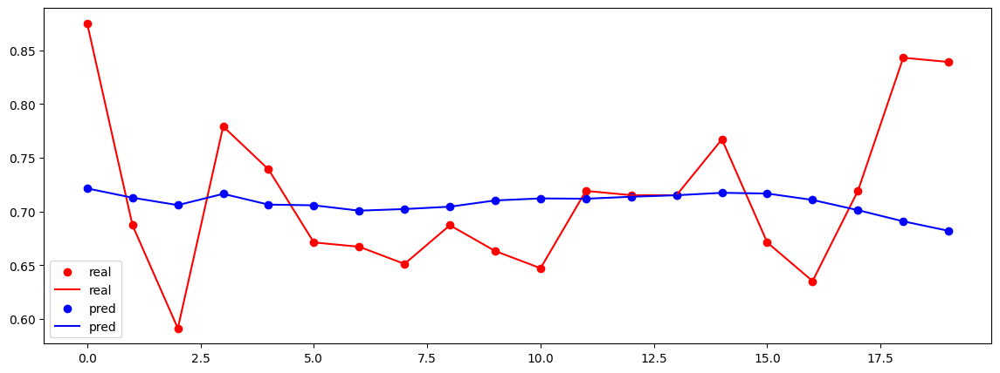

0
Slag_Fe_f2
Test MSE Loss: 0.0350
20


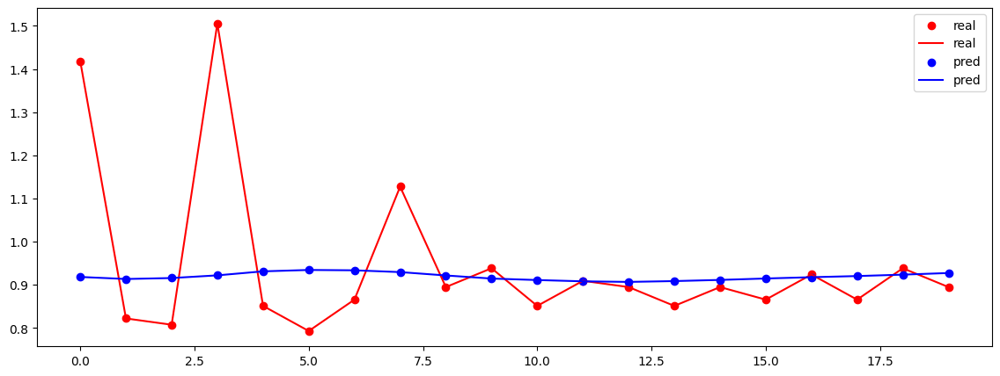

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0102
20


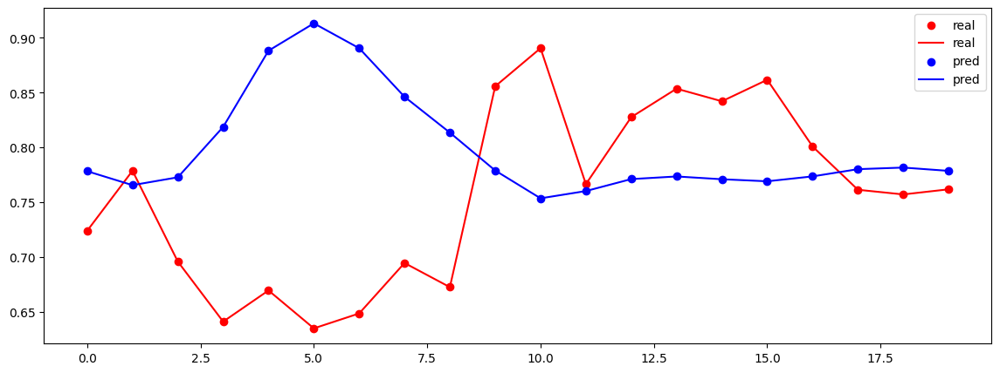

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0198
20


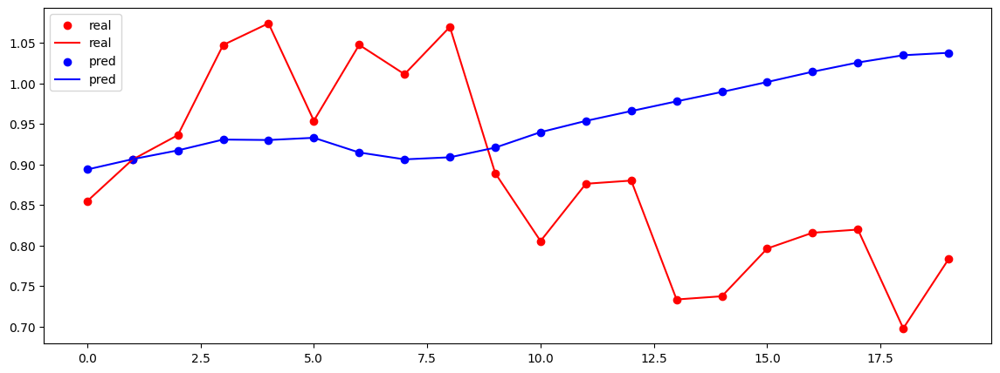

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0076
20


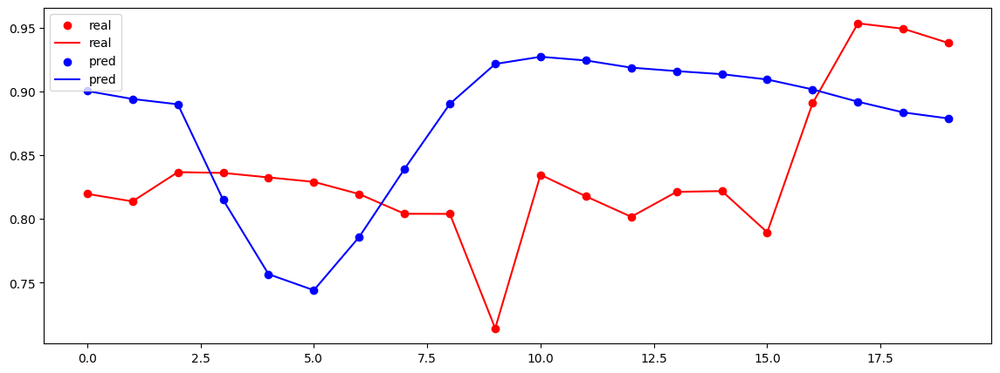

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0020
20


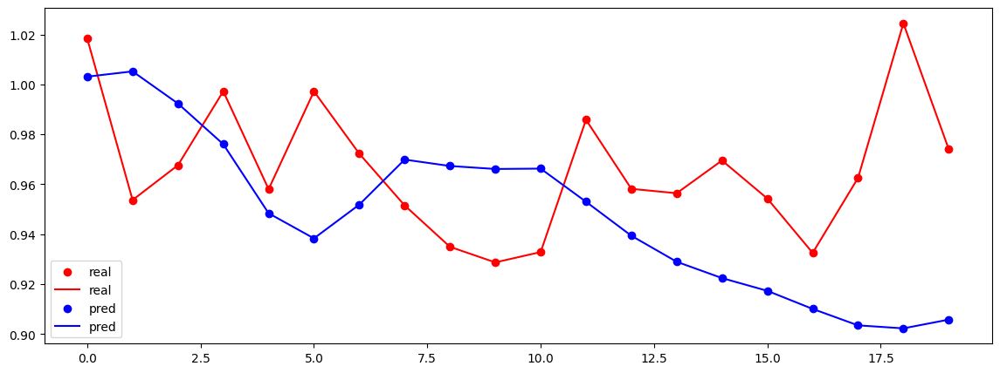

0
NE_Uptake_f3
Test MSE Loss: 0.0062
20


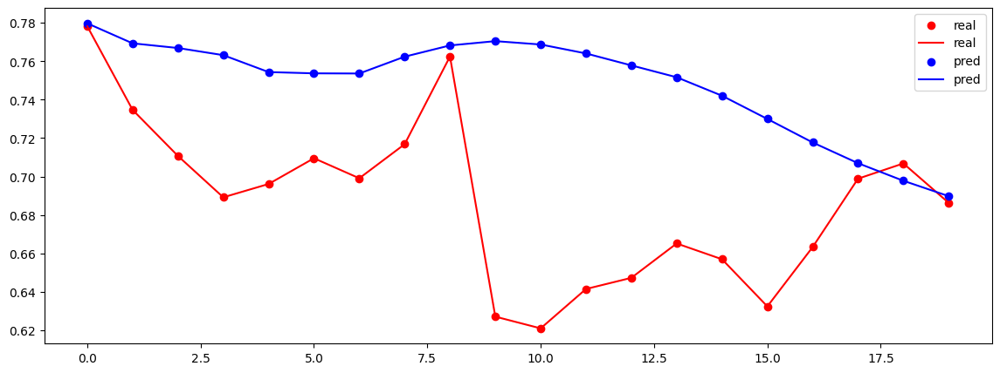

0
SE_Uptake_f3
Test MSE Loss: 0.0134
20


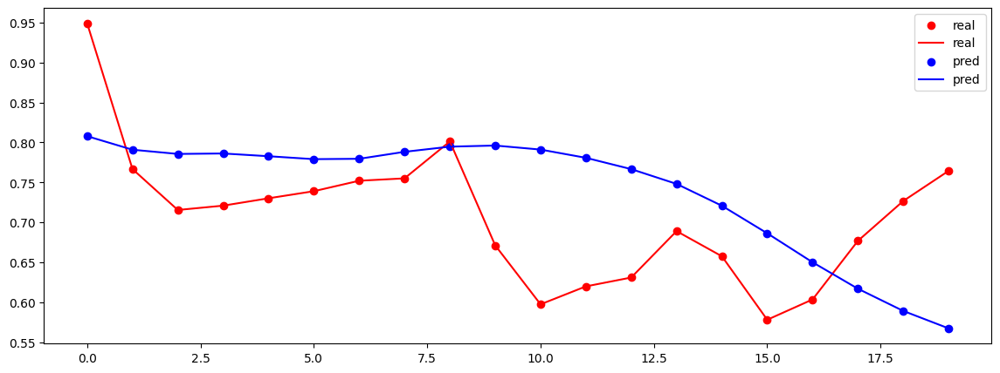

0
NW_Uptake_f3
Test MSE Loss: 0.0012
20


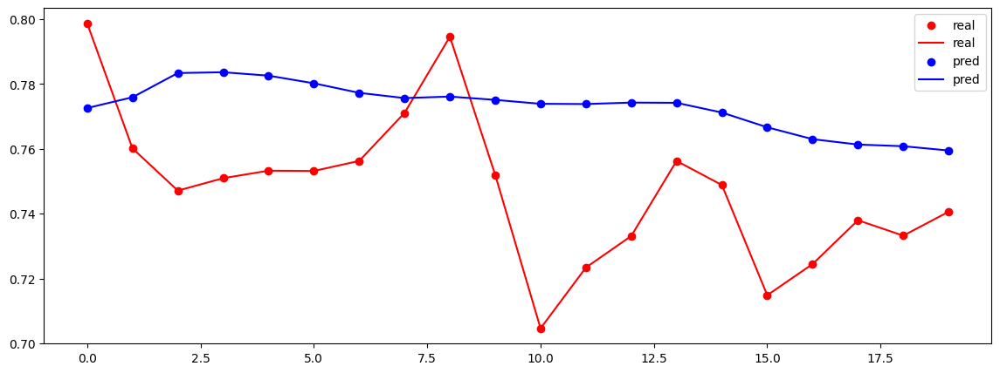

0
SW_Uptake_f3
Test MSE Loss: 0.0125
20


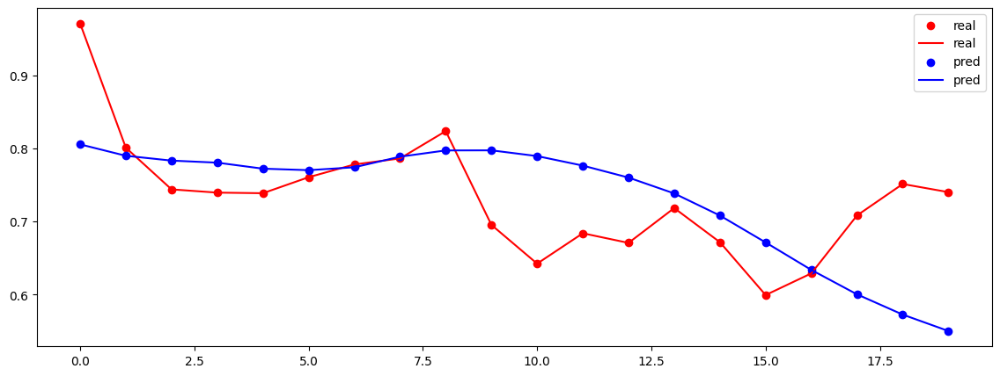

0
Slag_SiO2_f2
Test MSE Loss: 0.0393
20


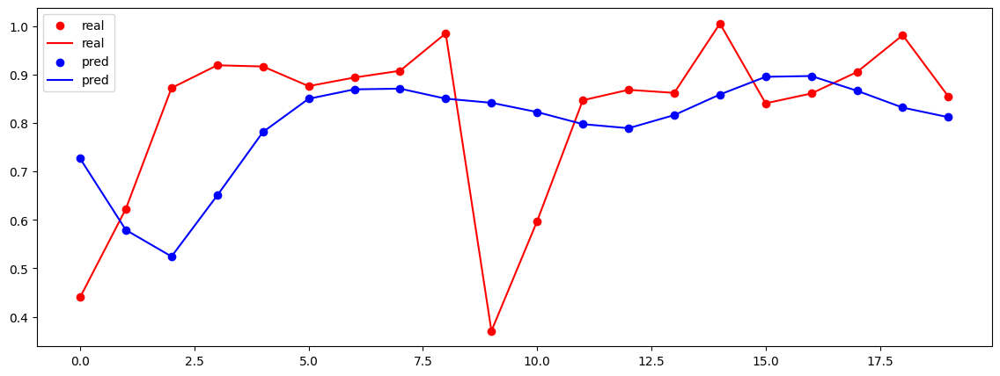

0
Slag_CaO_f2
Test MSE Loss: 0.0126
20


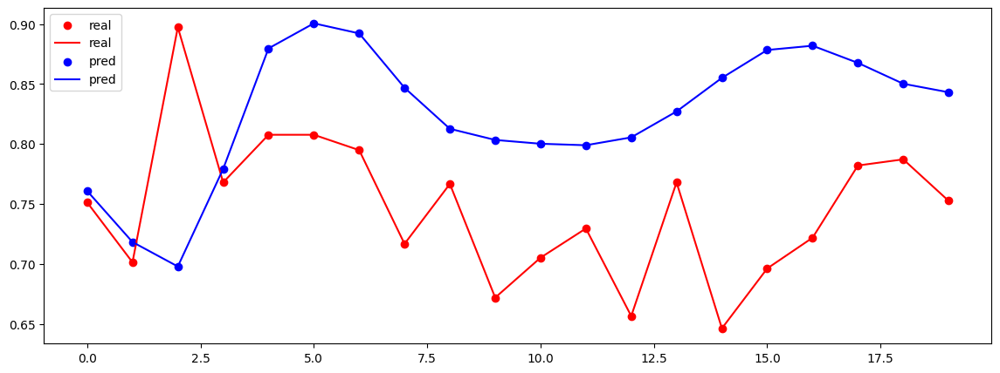

0
Slag_MgO_f2
Test MSE Loss: 0.0442
20


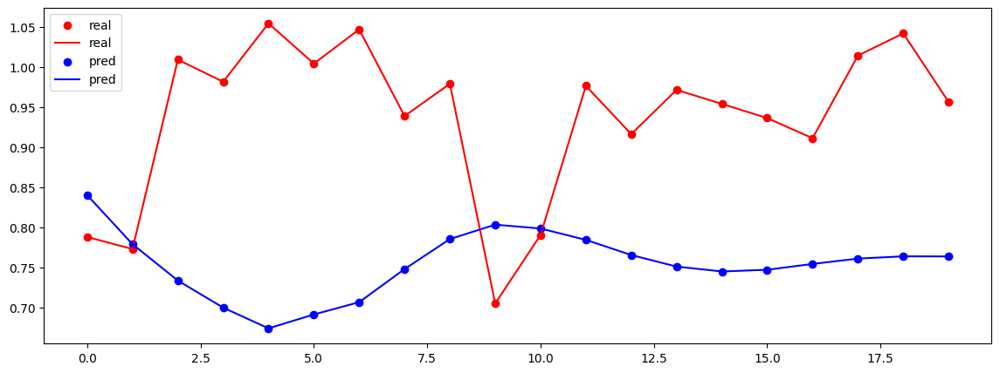

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


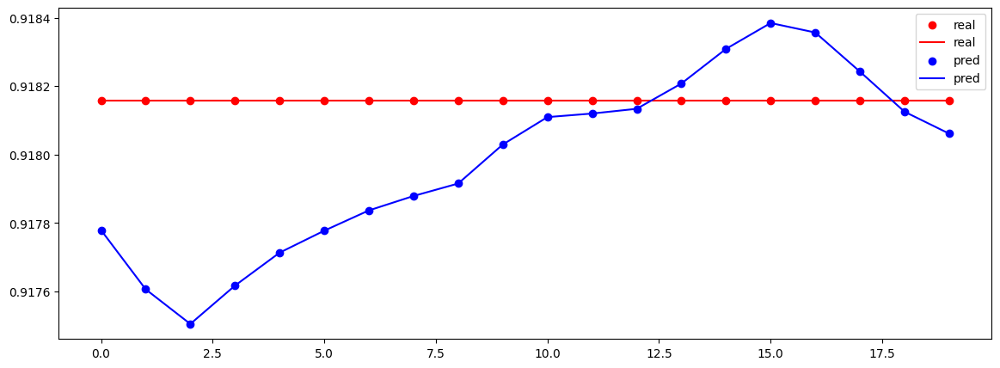

0
TOP_PRESS_f3
Test MSE Loss: 0.0030
20


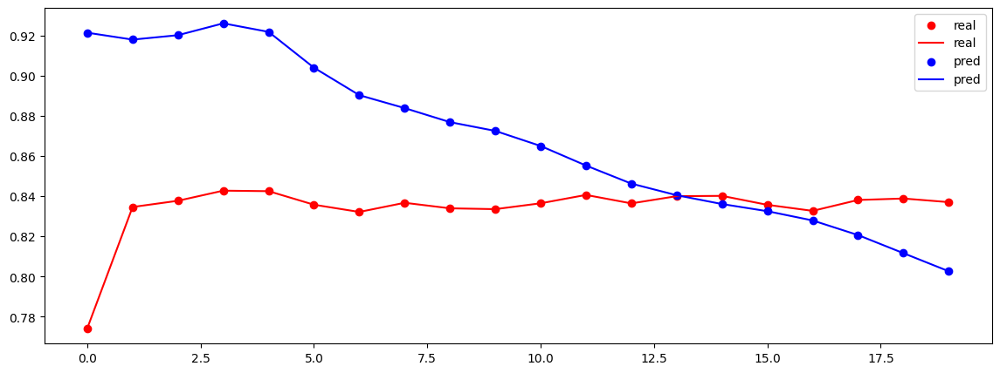

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0103
20


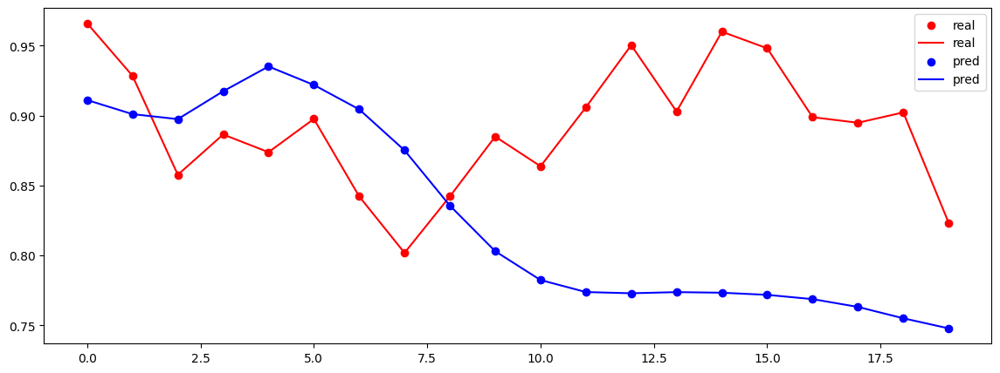

0
cokerate_f4
Test MSE Loss: 0.0032
20


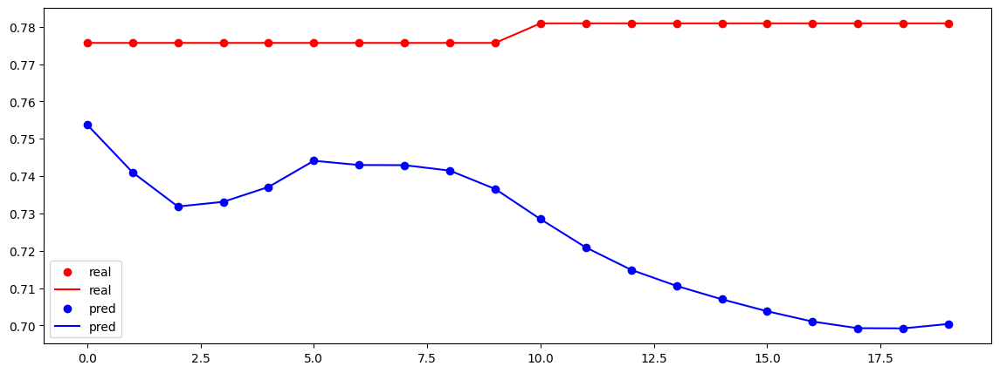

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0320
20


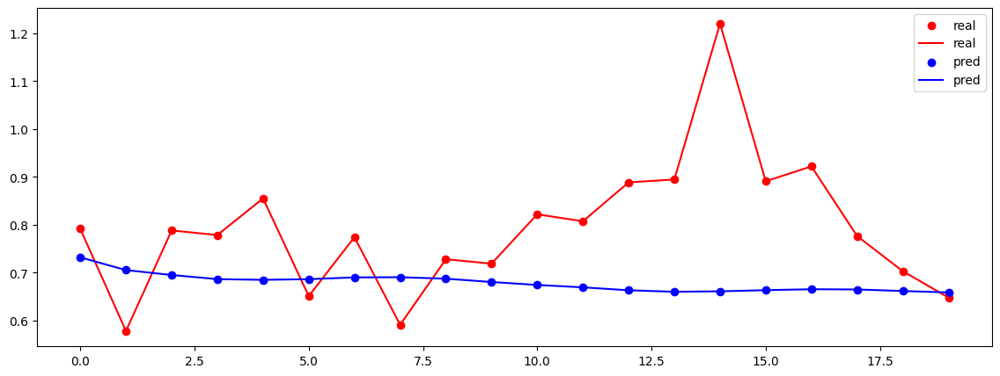

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0206
20


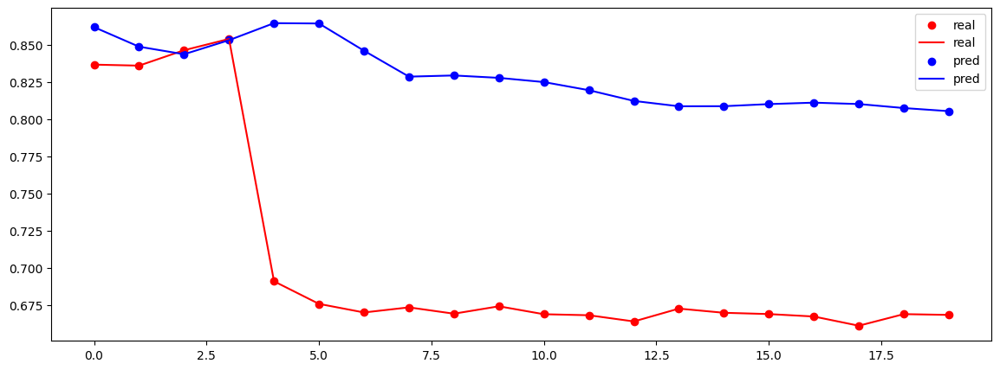

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0001
20


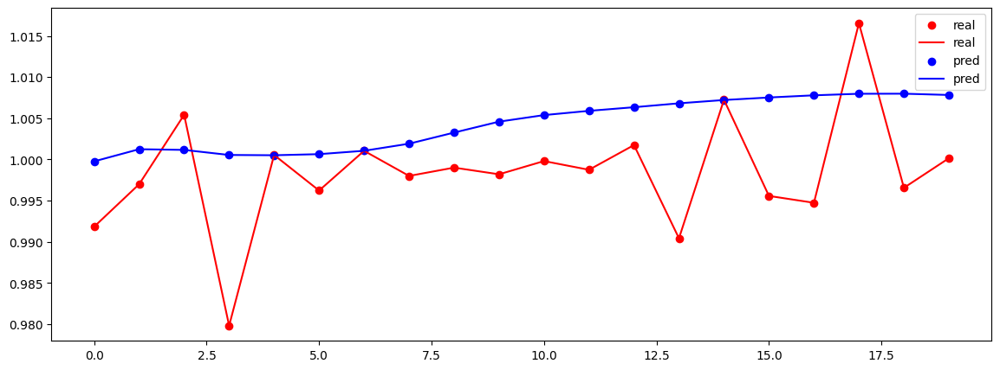

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0052
20


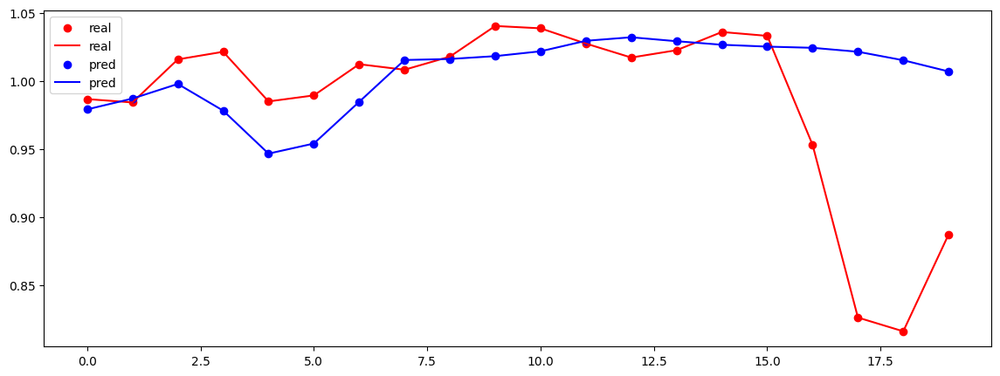

0
WINDRATE_f3
Test MSE Loss: 0.0027
20


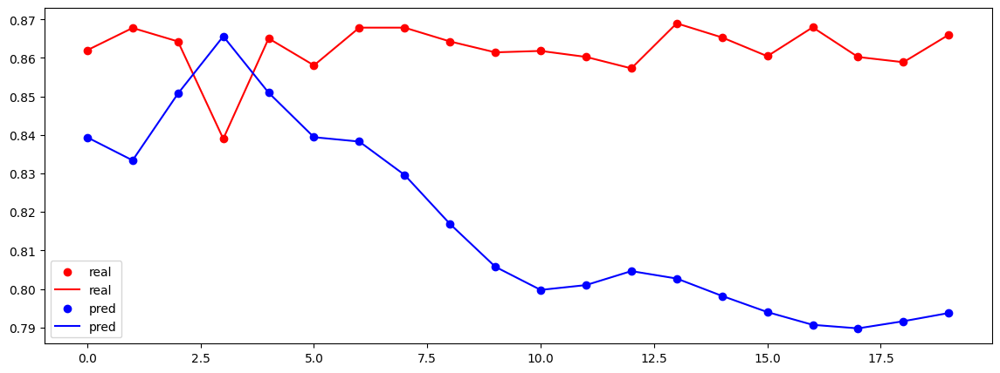

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0004
20


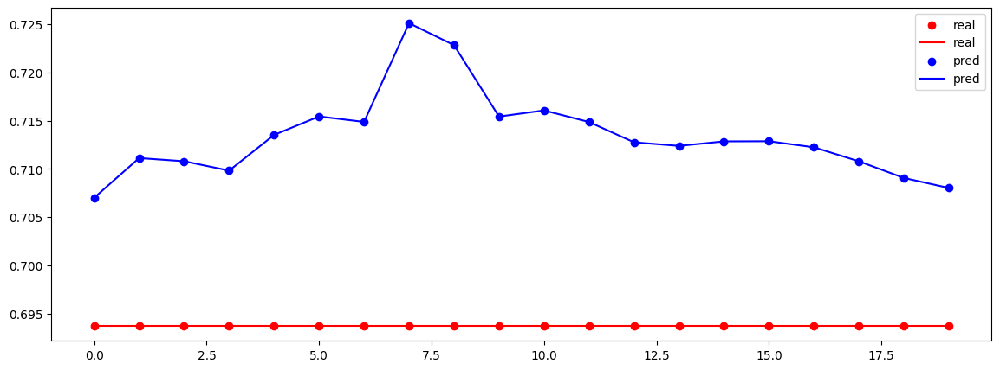

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


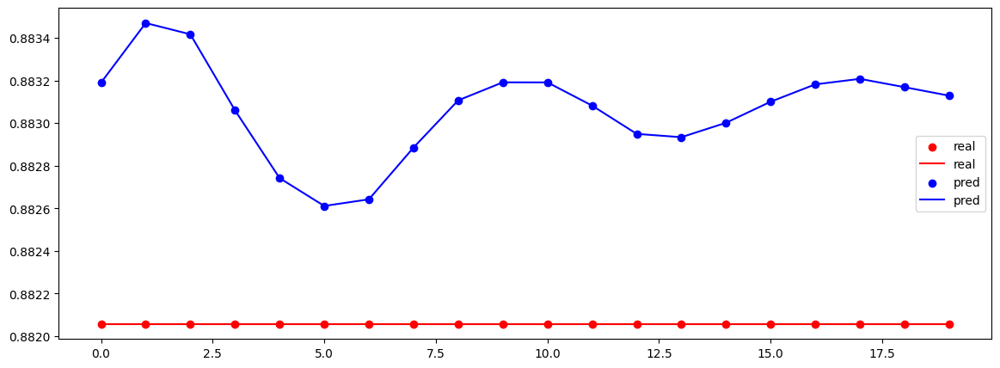

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0151
20


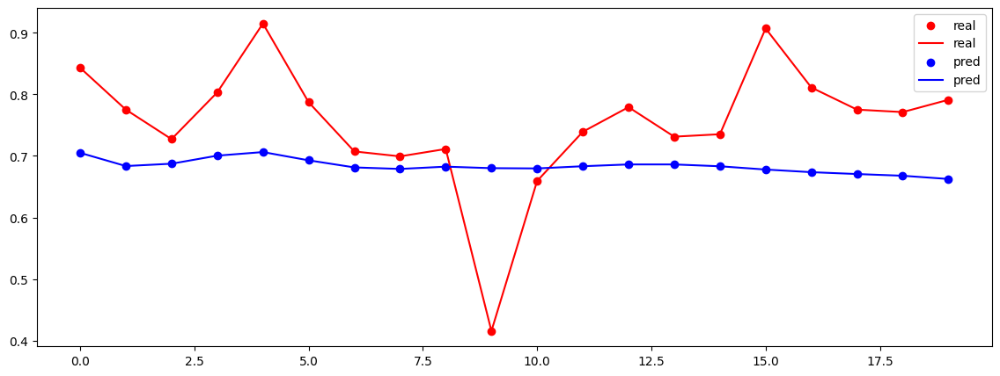

0
Slag_Fe_f2
Test MSE Loss: 0.0445
20


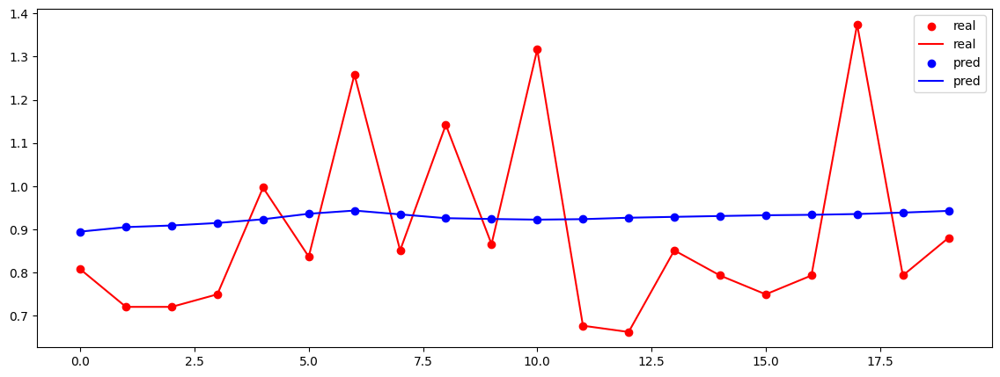

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0034
20


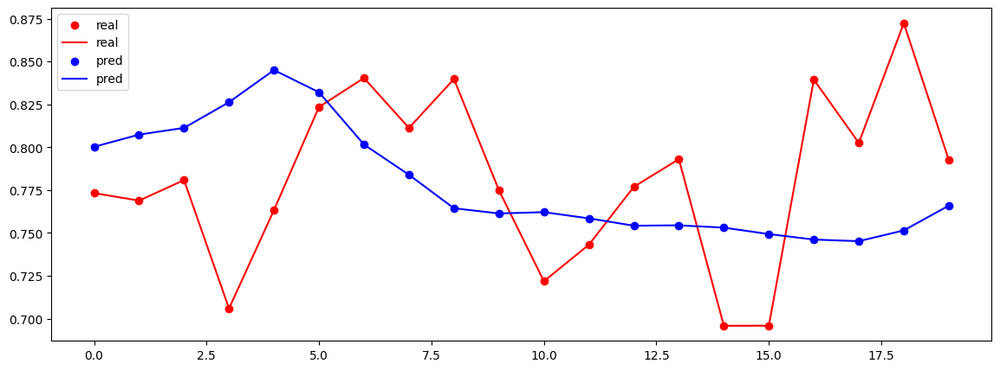

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0466
20


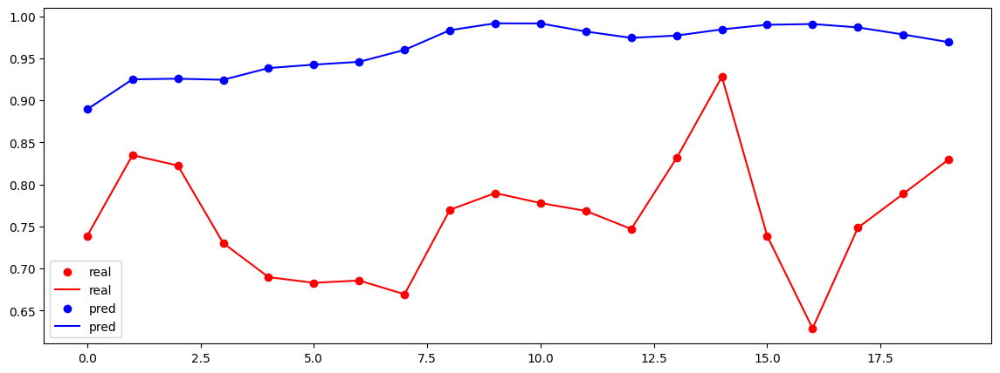

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0103
20


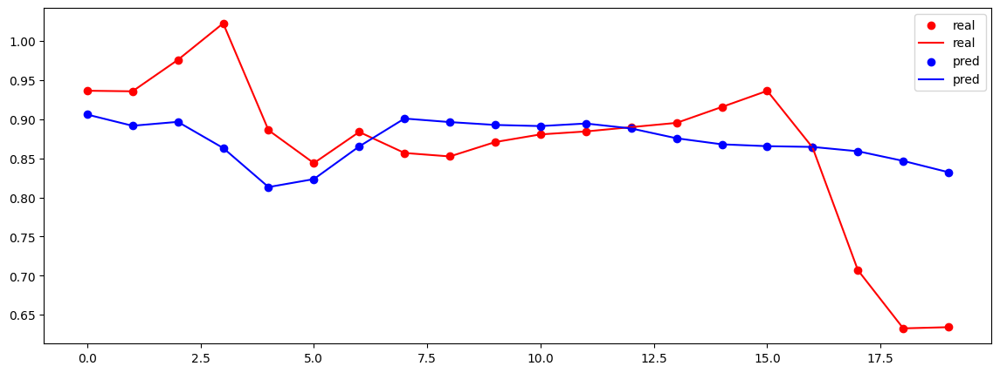

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0044
20


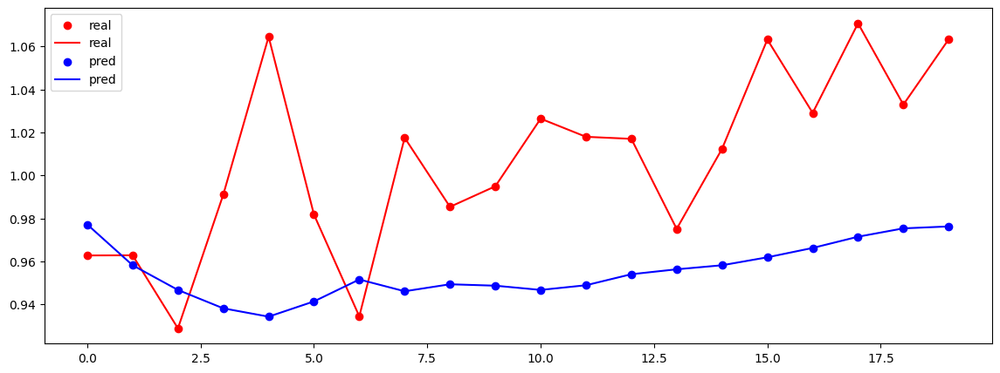

0
NE_Uptake_f3
Test MSE Loss: 0.0046
20


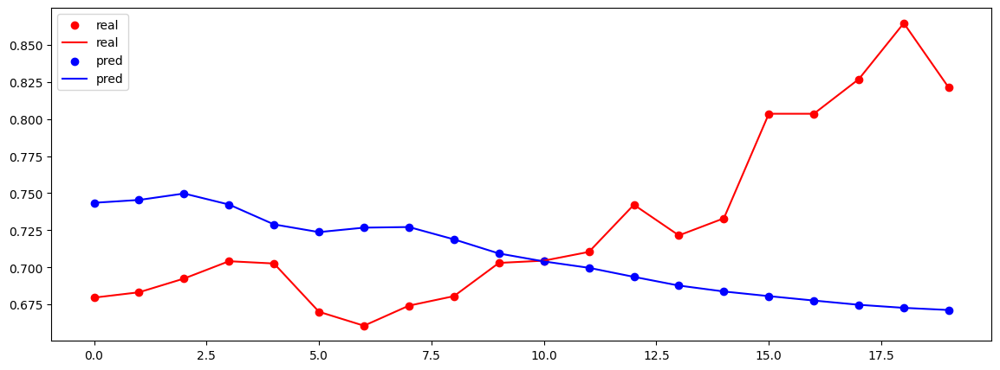

0
SE_Uptake_f3
Test MSE Loss: 0.0413
20


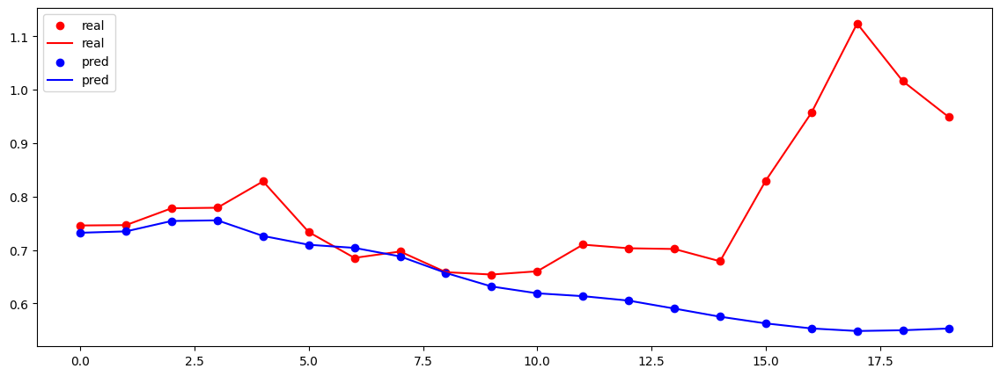

0
NW_Uptake_f3
Test MSE Loss: 0.0014
20


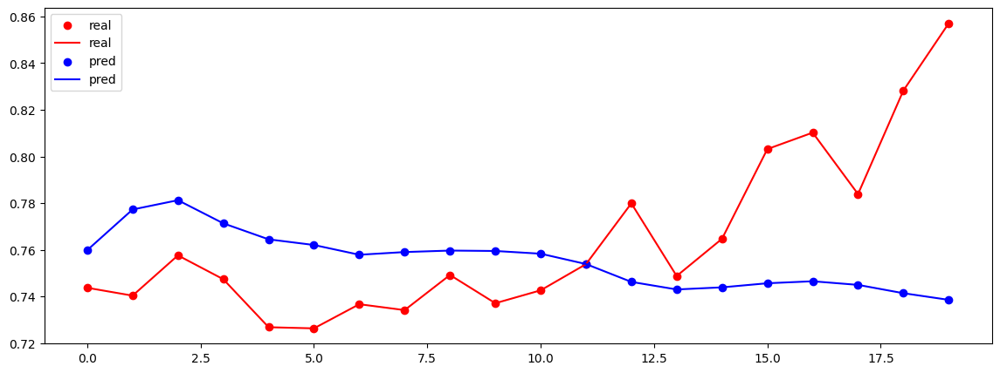

0
SW_Uptake_f3
Test MSE Loss: 0.0481
20


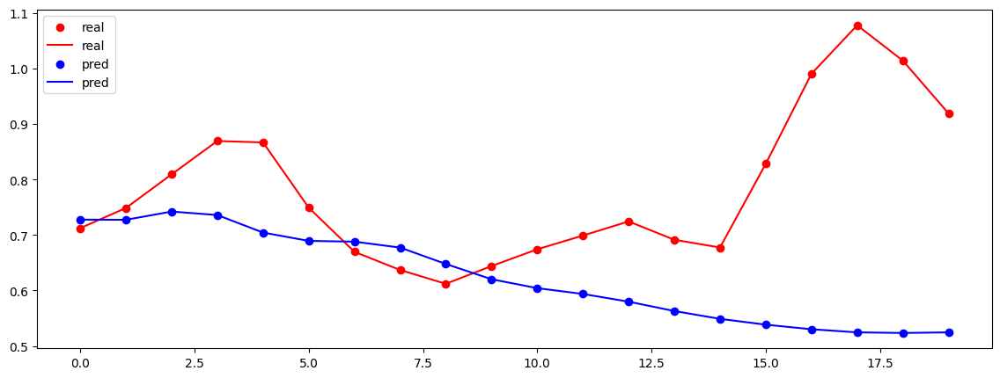

0
Slag_SiO2_f2
Test MSE Loss: 0.1104
20


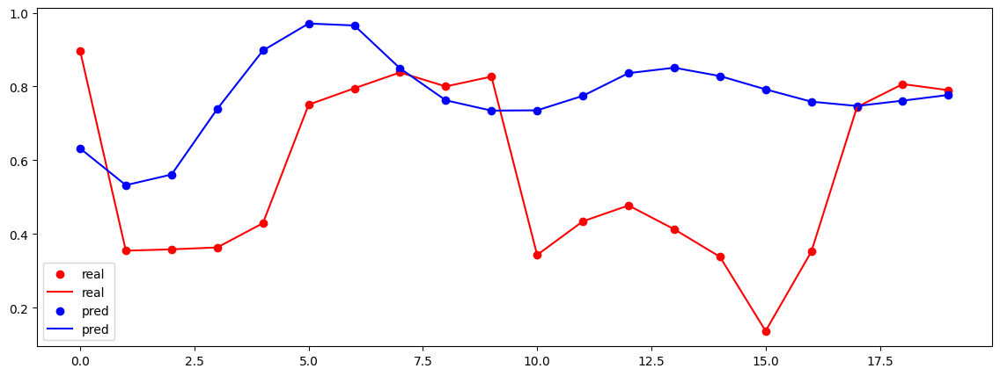

0
Slag_CaO_f2
Test MSE Loss: 0.0070
20


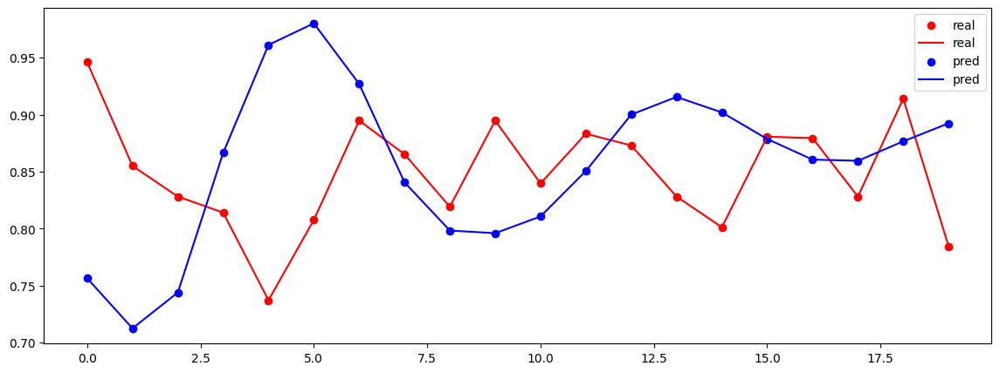

0
Slag_MgO_f2
Test MSE Loss: 0.0203
20


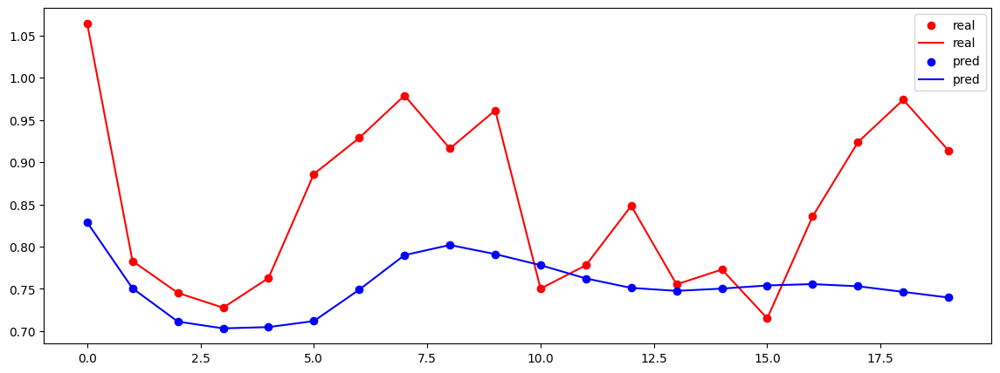

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


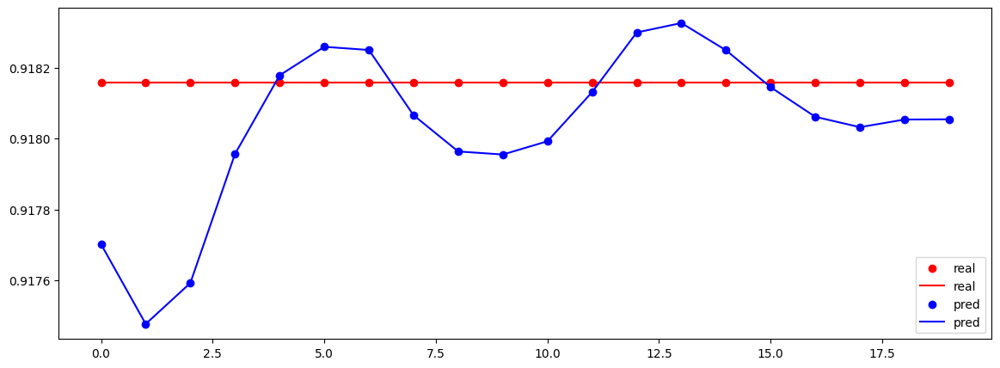

0
TOP_PRESS_f3
Test MSE Loss: 0.0005
20


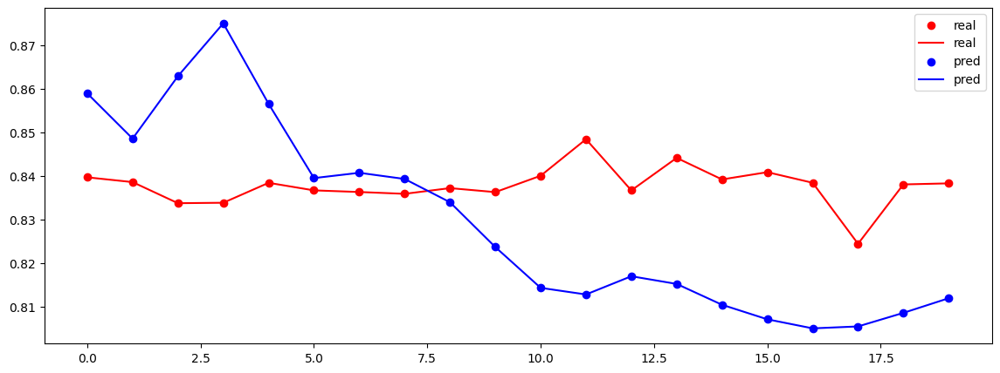

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.0140
20


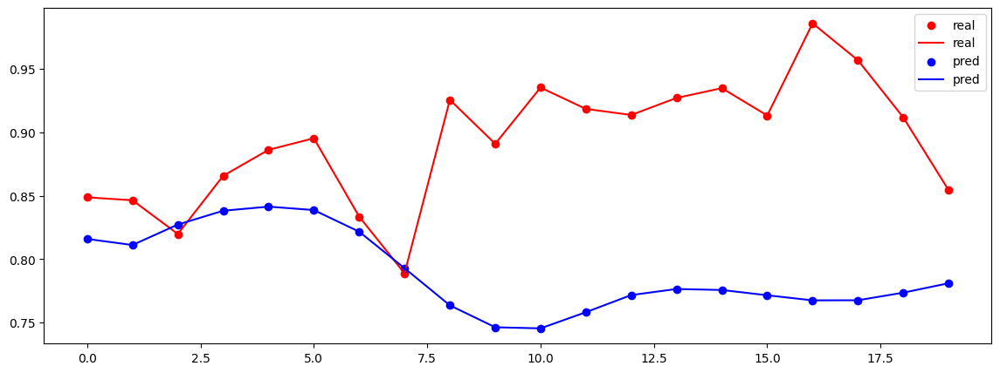

0
cokerate_f4
Test MSE Loss: 0.0017
20


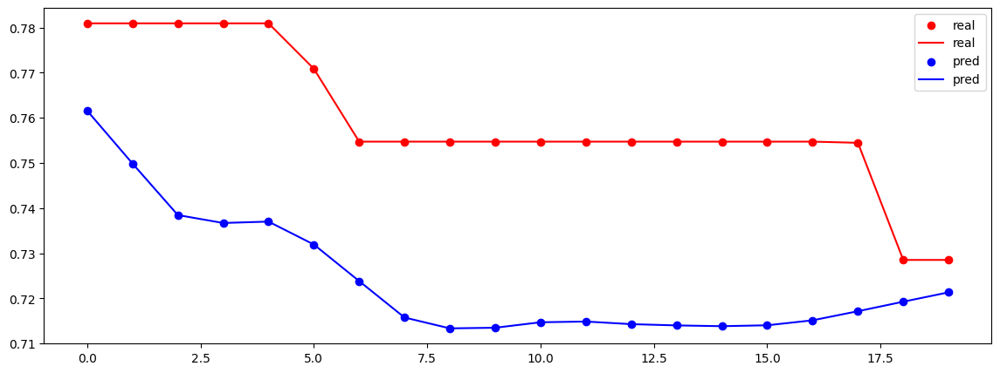

torch.Size([20, 120])
torch.Size([20, 24])
---------------
0
SI_f1
Test MSE Loss: 0.0422
20


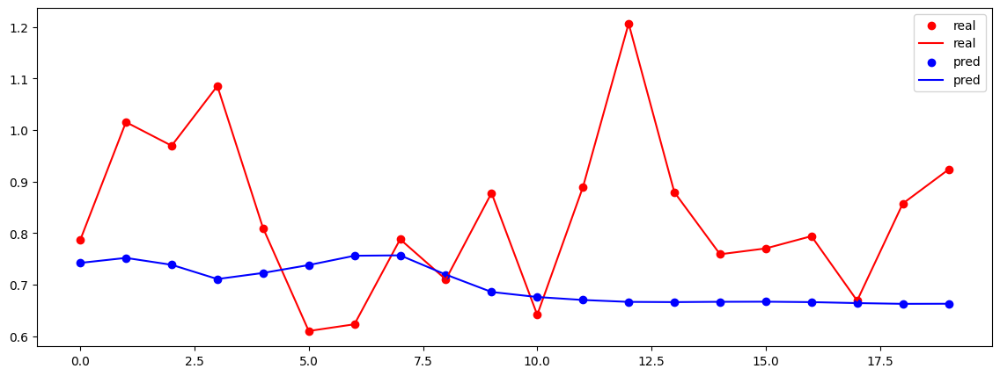

0
HOST_BLAST_MOISTURE_f3
Test MSE Loss: 0.0313
20


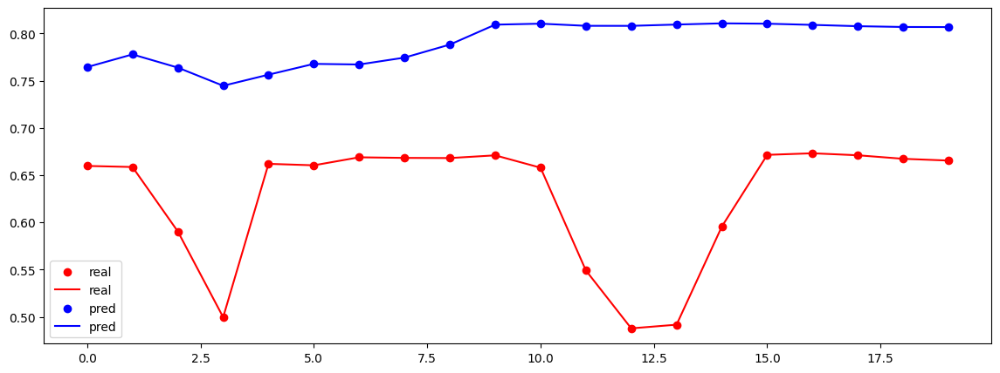

0
HOT_BLAST_TMP_NS_f3
Test MSE Loss: 0.0281
20


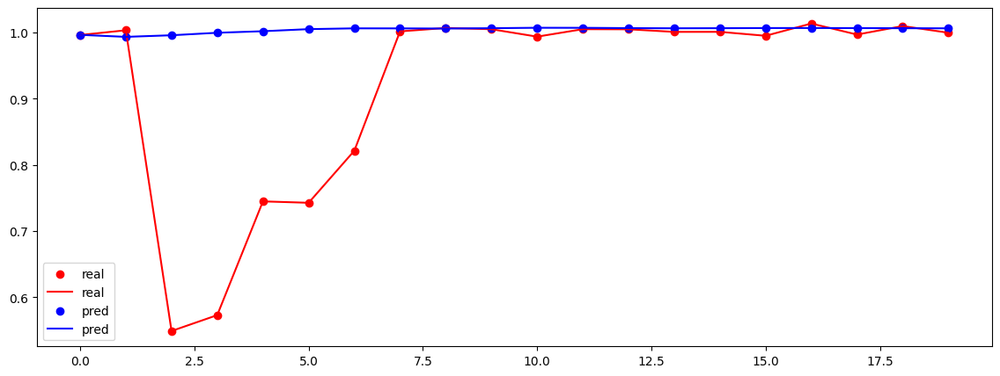

0
NAT_GAS _INJECTION_f3
Test MSE Loss: 0.0253
20


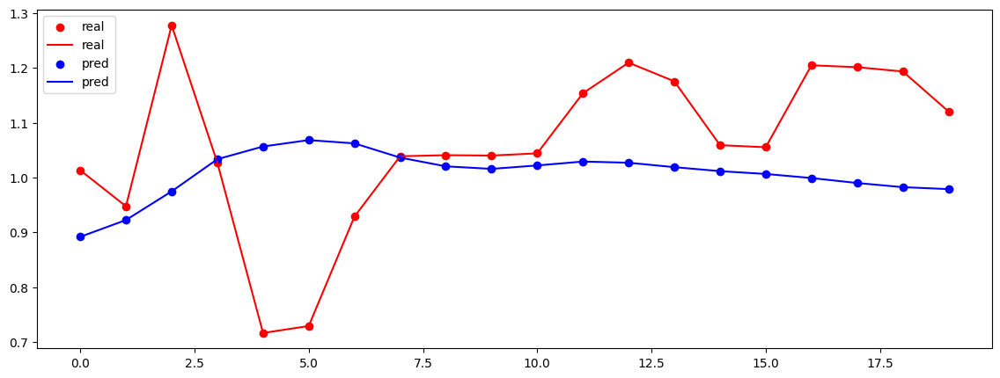

0
WINDRATE_f3
Test MSE Loss: 0.0963
20


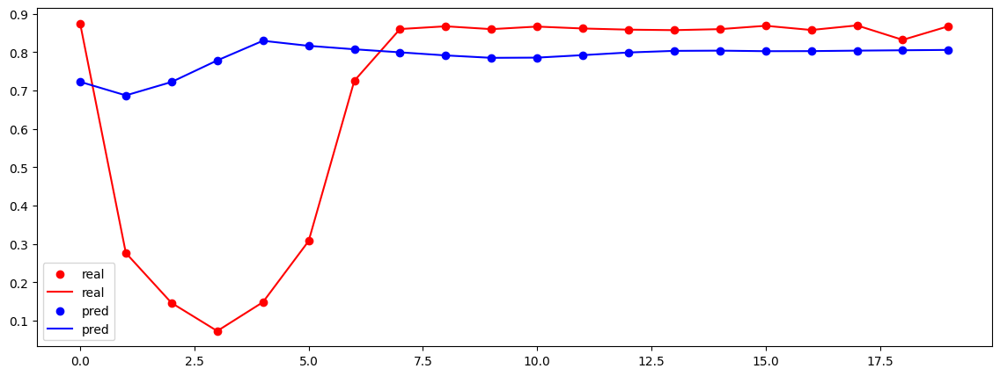

0
HIGH_PURITY_OXYGEN_f3
Test MSE Loss: 0.0566
20


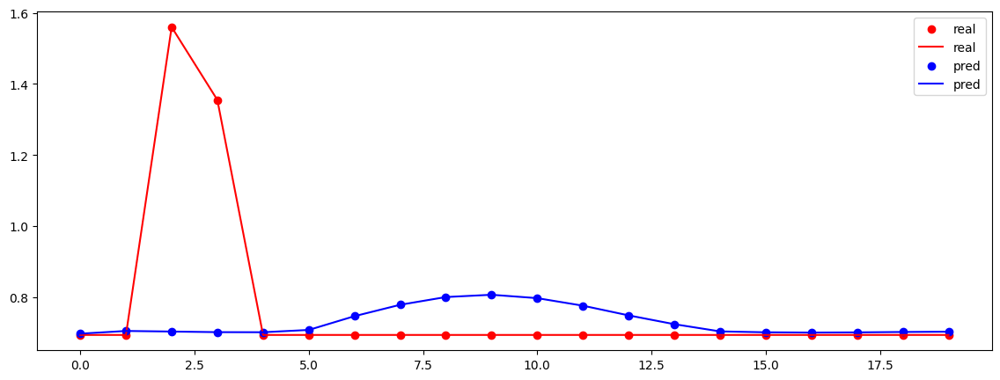

0
COAL_FLOW_f3
Test MSE Loss: 0.0000
20


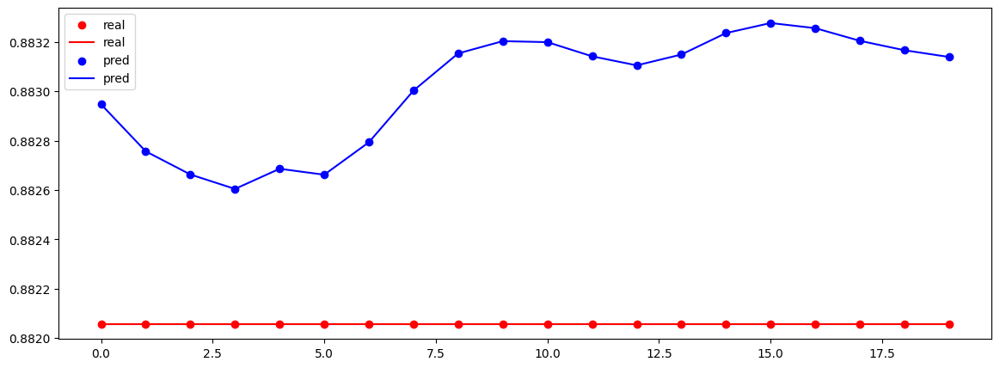

0
Cast_Avg_Mn_f2
Test MSE Loss: 0.0118
20


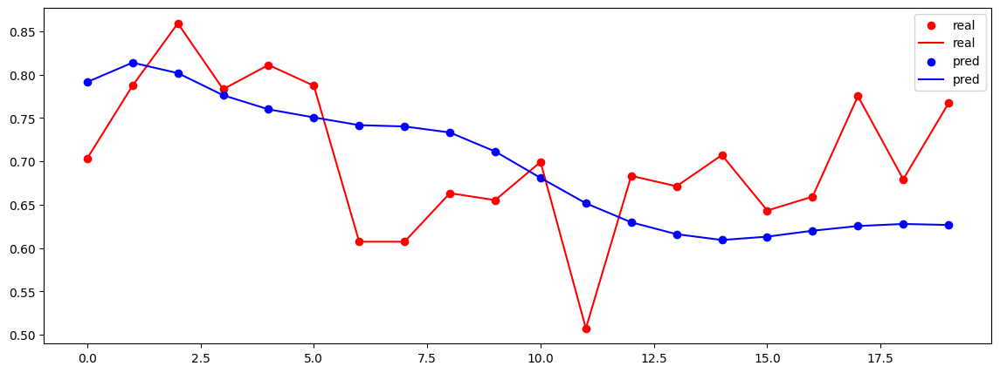

0
Slag_Fe_f2
Test MSE Loss: 0.0202
20


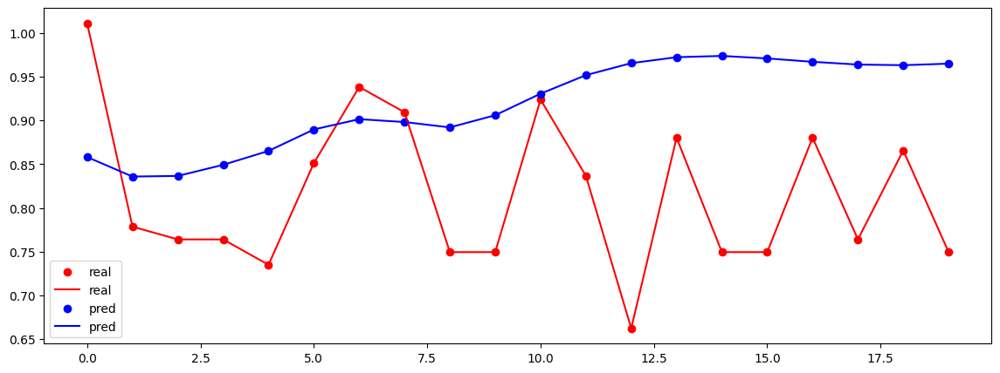

0
Selec_Top_Gas_CO_f3
Test MSE Loss: 0.0178
20


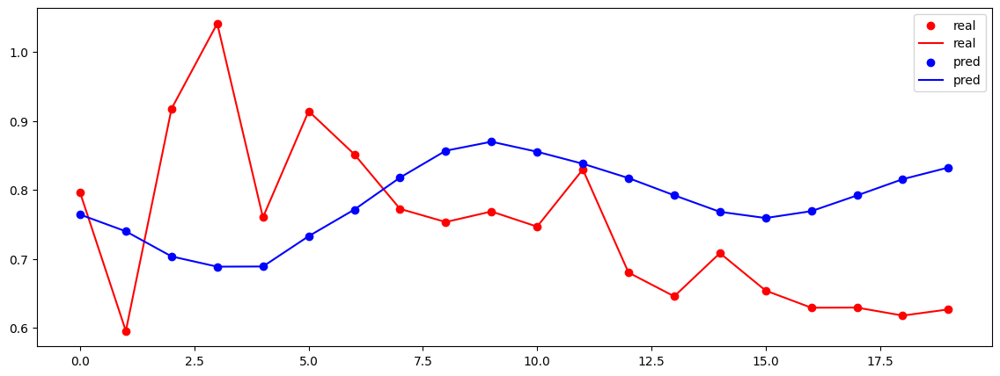

0
Selec_Top_Gas_CO2_f3
Test MSE Loss: 0.0237
20


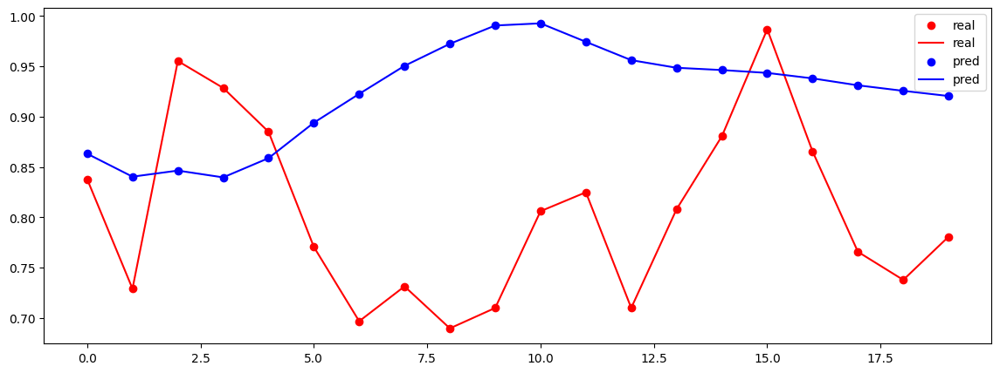

0
Selec_Top_Gas_H2_f3
Test MSE Loss: 0.0332
20


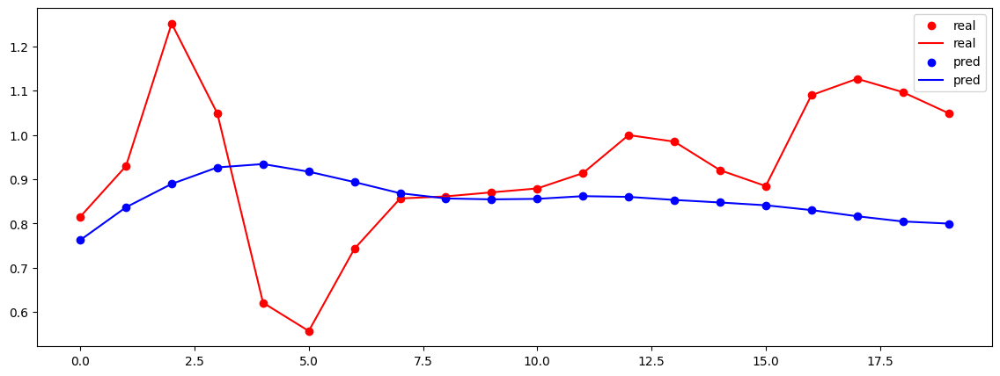

0
Selec_Top_Gas_N2_f3
Test MSE Loss: 0.0368
20


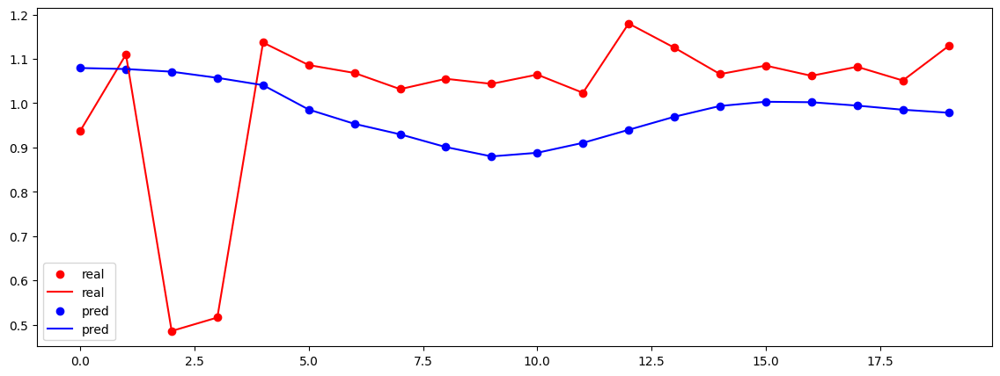

0
NE_Uptake_f3
Test MSE Loss: 0.0086
20


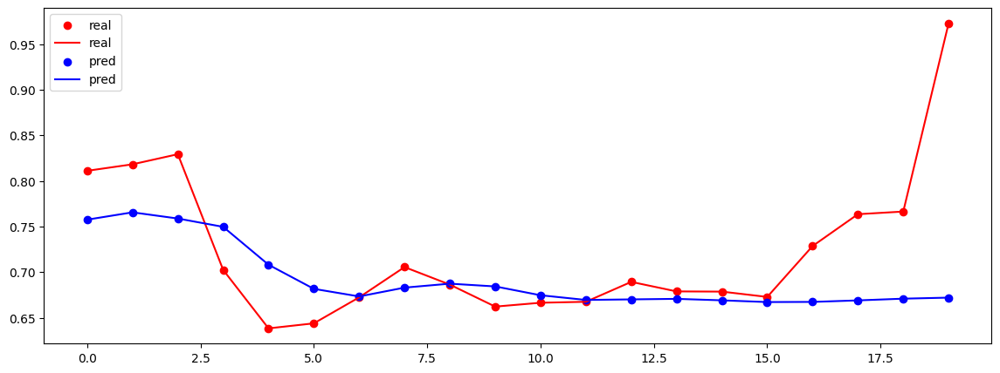

0
SE_Uptake_f3
Test MSE Loss: 0.0385
20


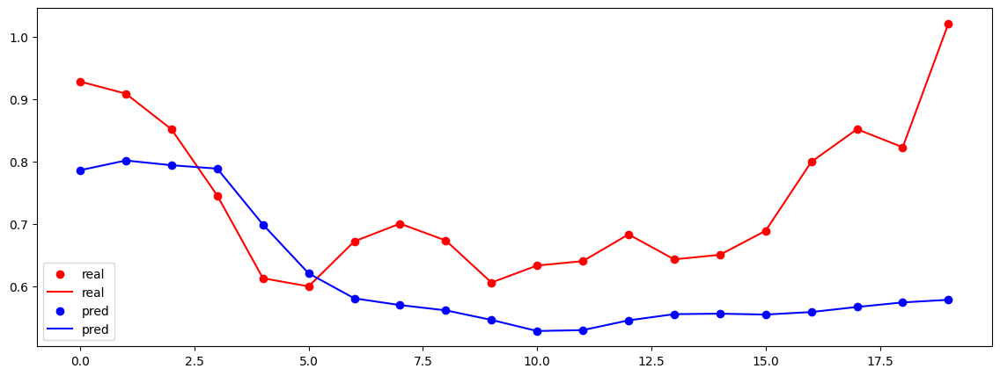

0
NW_Uptake_f3
Test MSE Loss: 0.0035
20


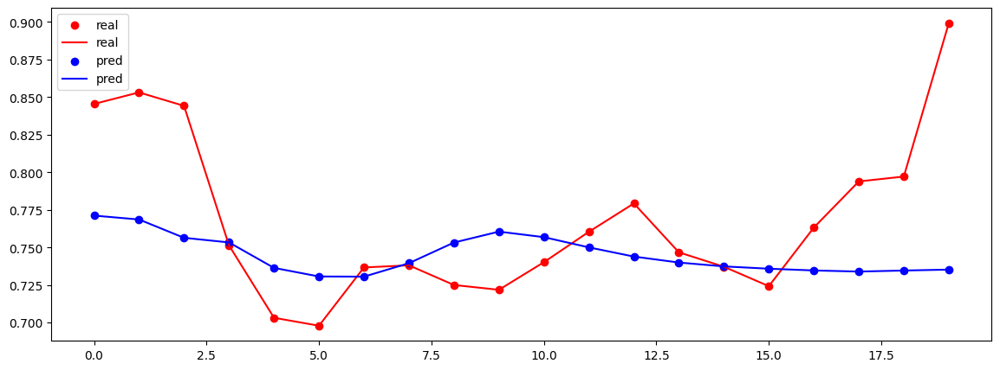

0
SW_Uptake_f3
Test MSE Loss: 0.0416
20


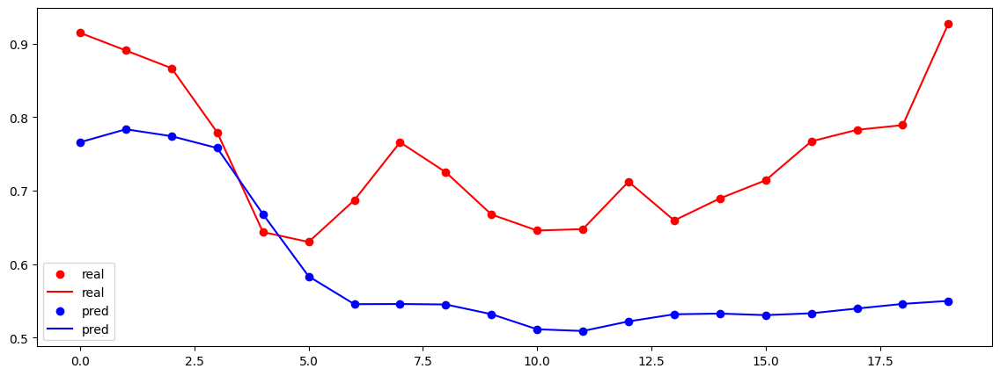

0
Slag_SiO2_f2
Test MSE Loss: 0.0096
20


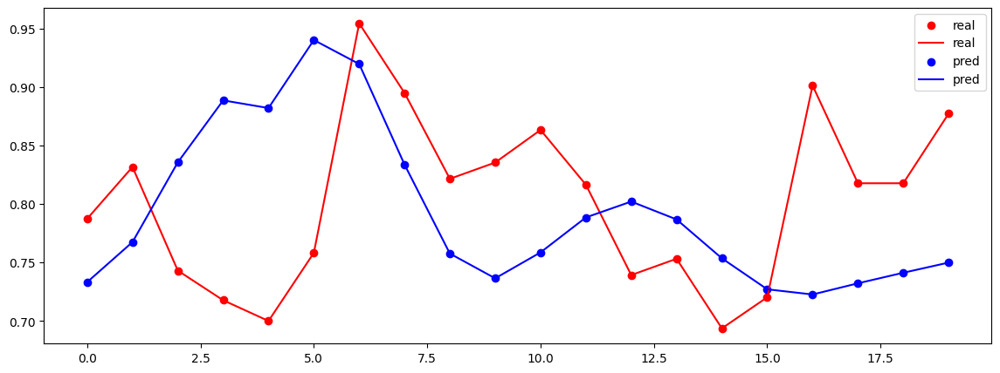

0
Slag_CaO_f2
Test MSE Loss: 0.0085
20


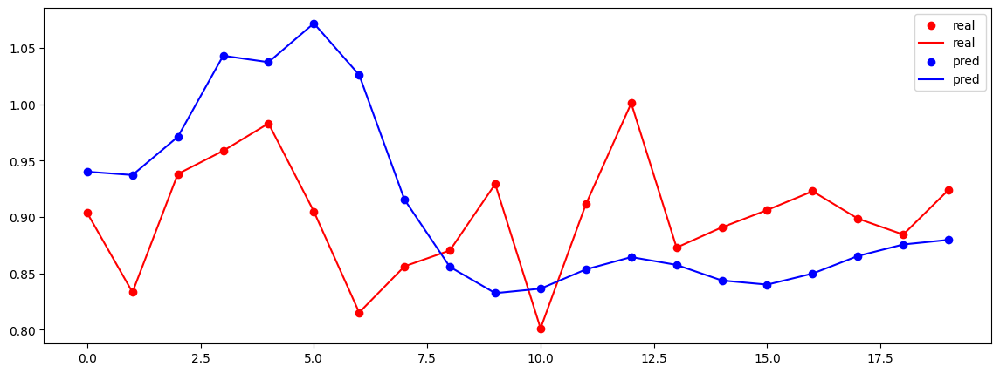

0
Slag_MgO_f2
Test MSE Loss: 0.0774
20


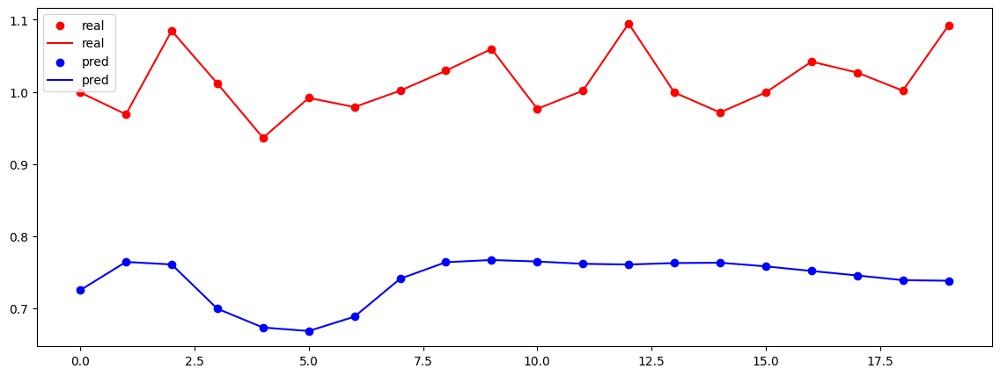

0
SNORT_VALVE_POSITION_f3
Test MSE Loss: 0.0000
20


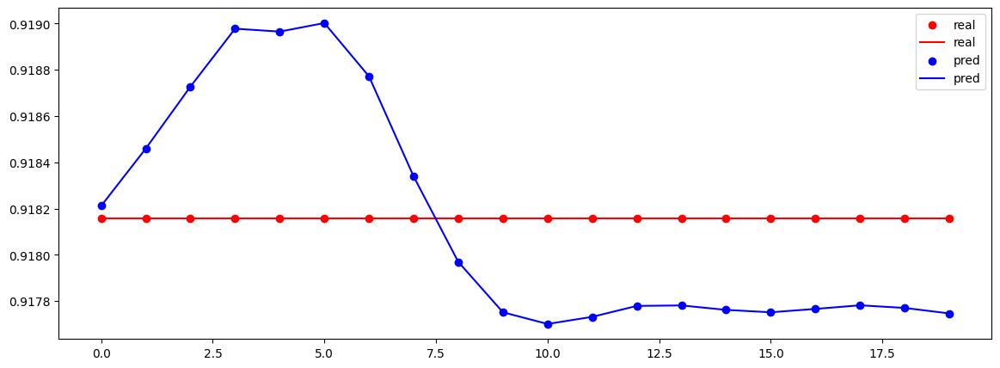

0
TOP_PRESS_f3
Test MSE Loss: 0.0923
20


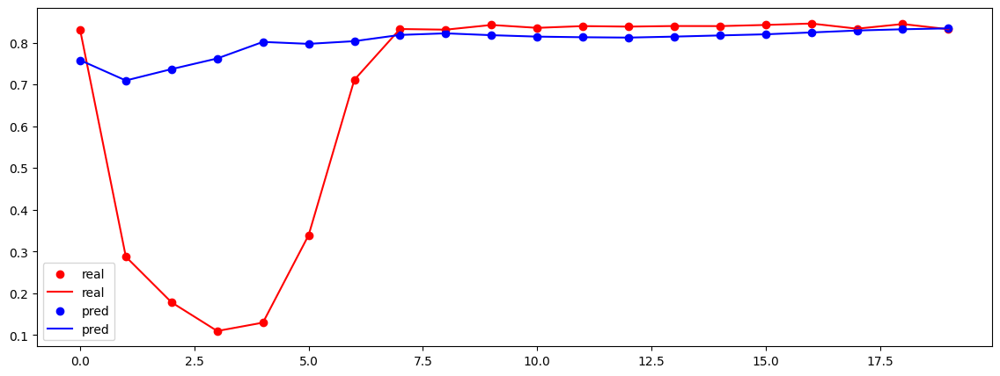

0
HOT_BLAST_PRESSURE_f3
Test MSE Loss: 0.1044
20


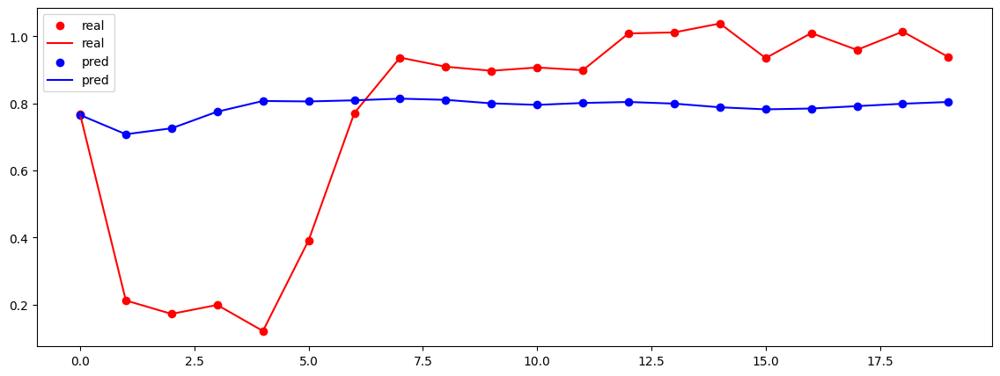

0
cokerate_f4
Test MSE Loss: 0.0004
20


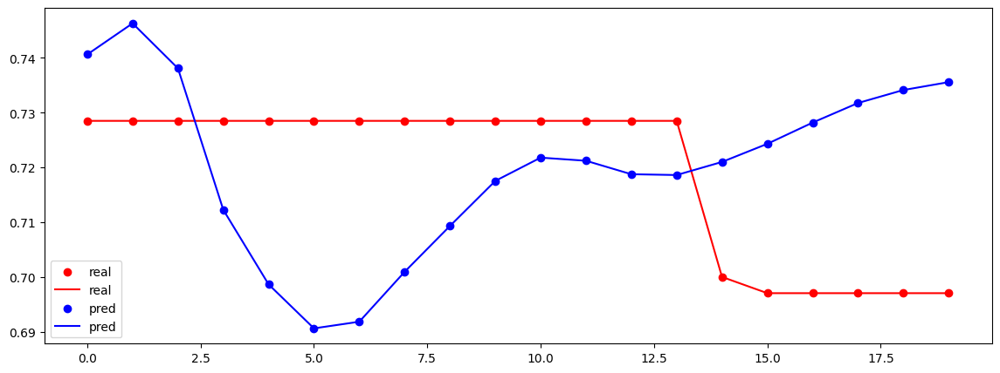

In [116]:



for i in range(0, y_test.shape[0]- bin_size, bin_size):
    batch_x_test = x_test[i:i+bin_size, :]
    print( batch_x_test.shape )

    batch_y_test = y_test[i:i+bin_size, :]
    print( batch_y_test.shape )
    print("---------------")
    for jz in range( vector_n_out ):
        bins_inference_model_pt( model, batch_x_test, batch_y_test, jz, l_new[jz] )



## View all predicted Xs


In [117]:


            
            
def View_all_predicted_Xs(x_index, model, model_type='RNN', **kwargs):
 
    x_test, y_test   = kwargs['test_data']
 
    ## Prediction
    model.eval()
    with torch.no_grad():
        h0    = model.init_hidden( x_test.shape[0] )
        y_hat = model(x_test, h0)
        
    y_hat, _ = y_hat
 
    ## Plotting
    fig, ax = plt.subplots(2, 1) 
    
    ax[0].set_title(f"{model_type} TEST MSE = {0:.4f}: Forecast vs Actual (Out-of-Sample data)")
    scale = kwargs['scale']
    print("ricardo check this")
    print(y_test.shape)
    print(y_hat.shape )
    actual = scale.inverse_y(y_test.detach().numpy() ) ## .ravel() )
    pred   = scale.inverse_y( y_hat.detach().numpy() ) ## .ravel() )
    idx = kwargs['idx']
    ##pd.Series(actual, index=idx).plot(style='k--', label='actual', alpha=0.65, color='blue')
    ##pd.Series(pred,   index=idx).plot(style='k',   label='forecast' , color='red')
    print(actual.shape)
    print(pred.shape)
    actual = actual[:, x_index]
    pred   =   pred[:, x_index]
    
    pd.Series(pred,   index=idx).plot( label='forecast' , color='red' )
    pd.Series(actual, index=idx).plot( label='actual',    color='blue')
    
    fig.tight_layout()
    ax[1].legend(); plt.show()
    
    return 0, 0
    
           

            



ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


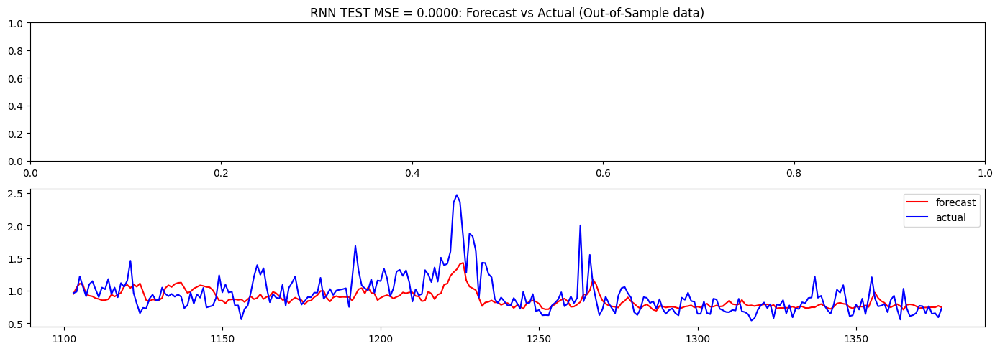

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


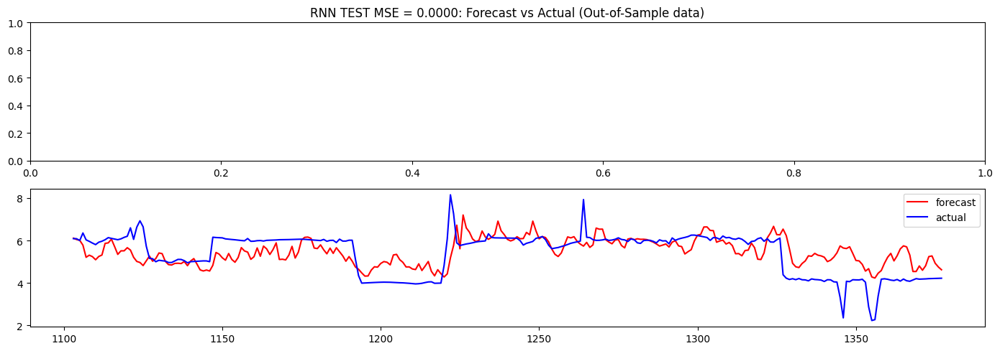

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


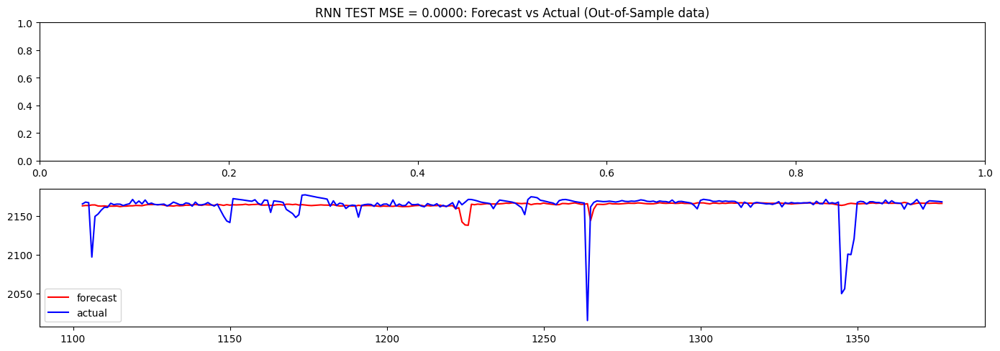

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


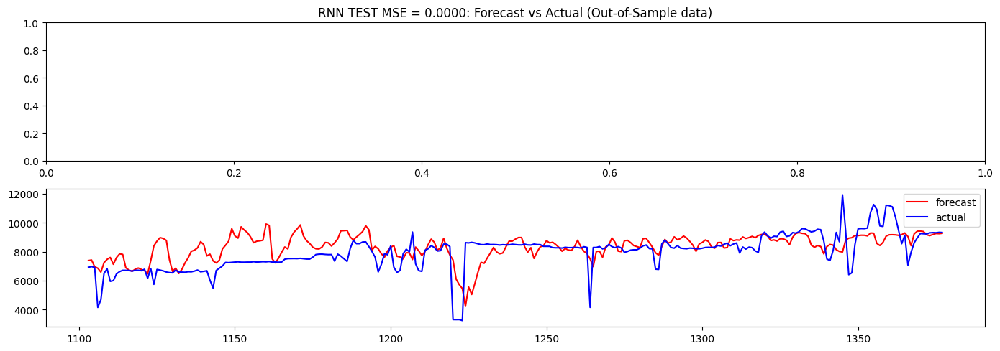

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


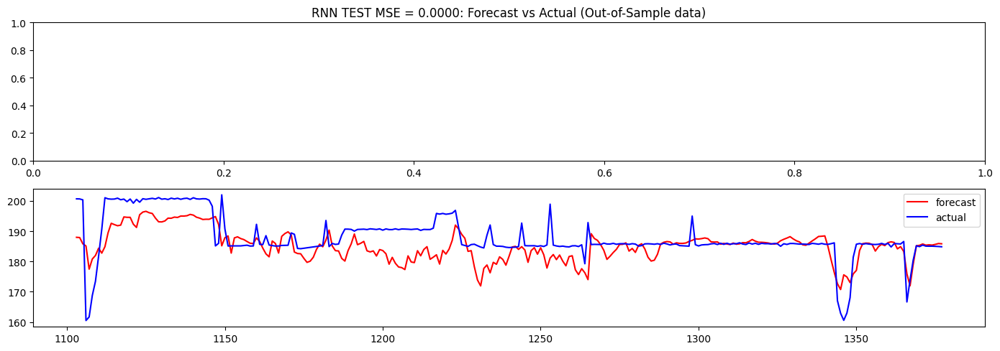

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


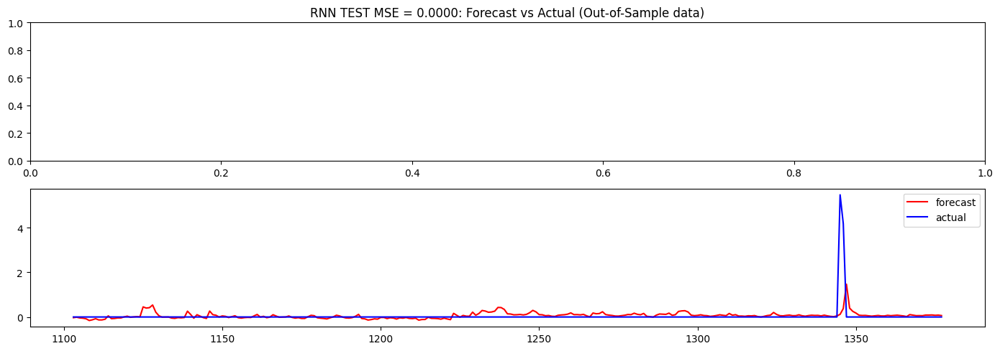

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


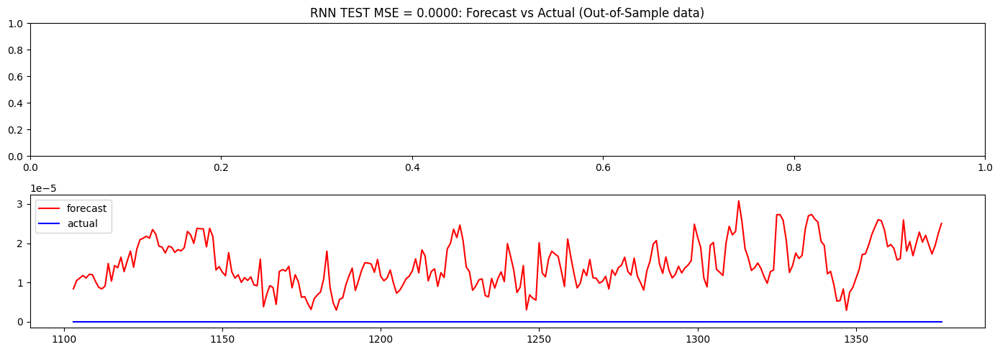

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


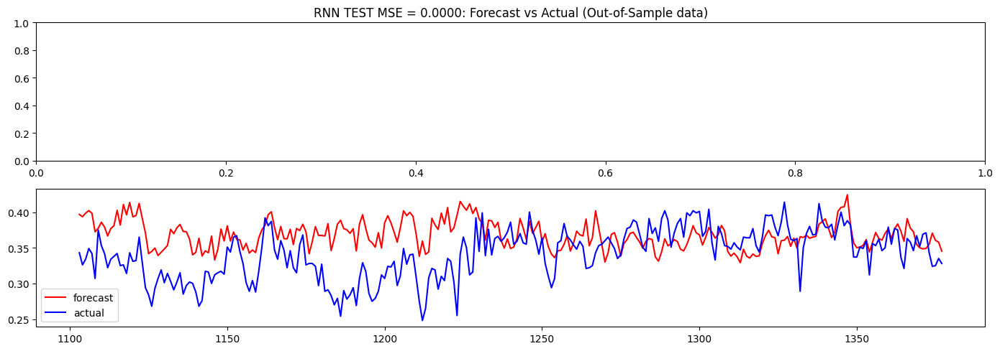

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


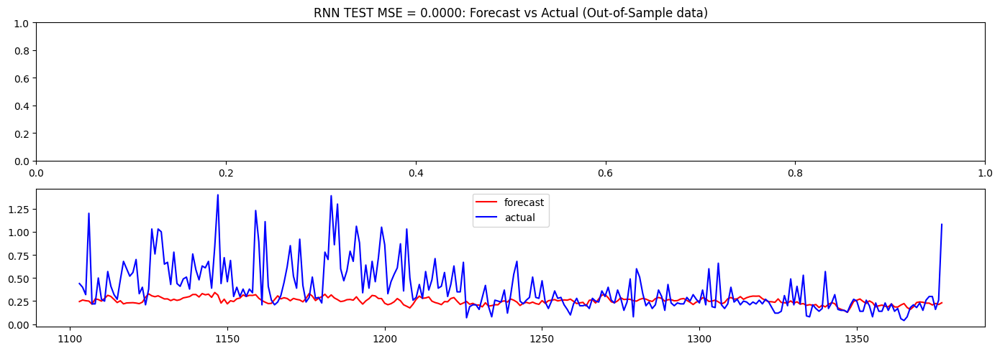

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


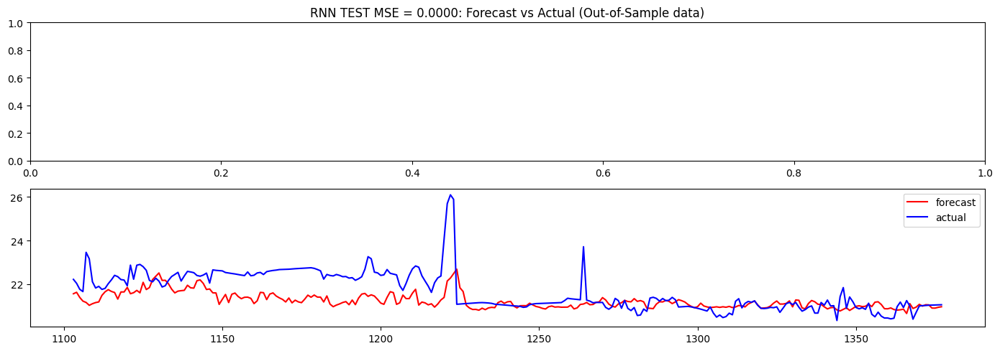

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


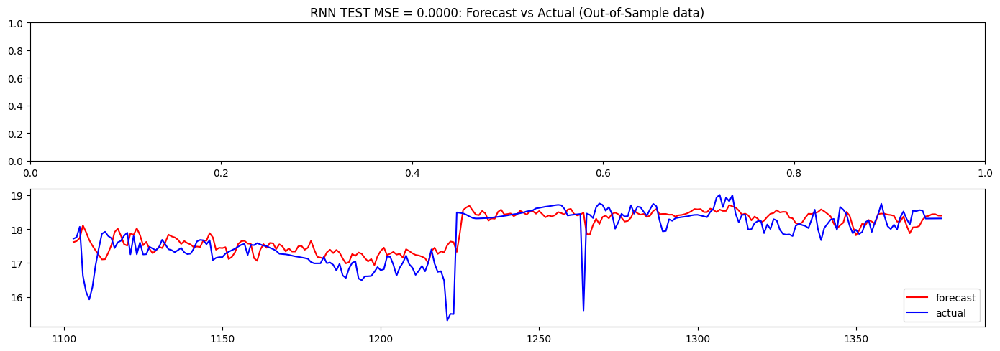

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


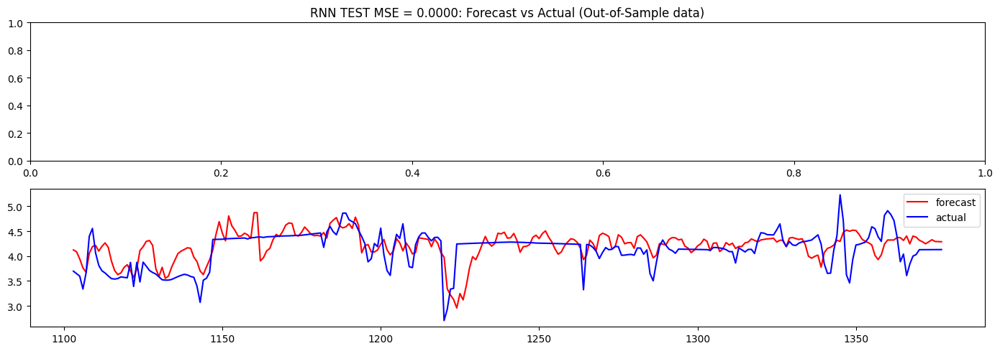

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


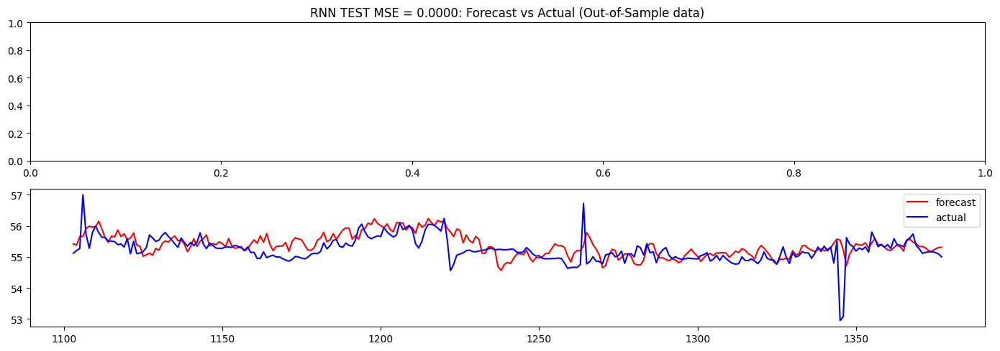

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


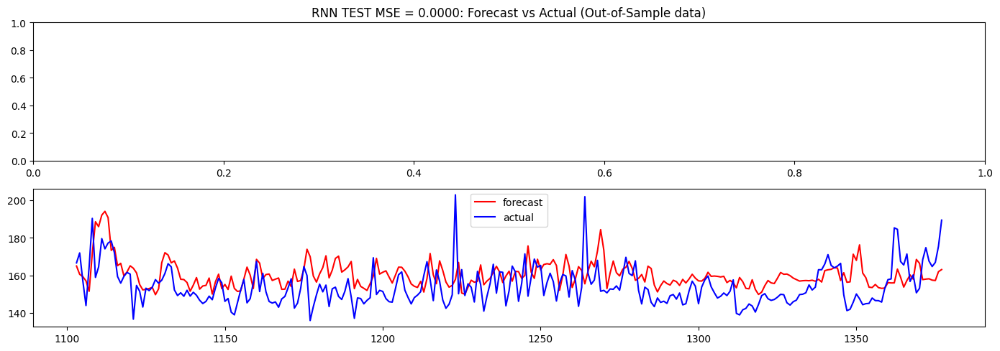

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


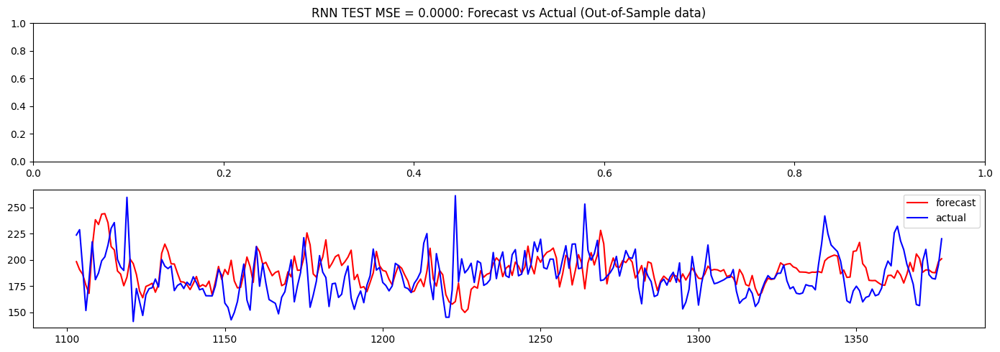

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


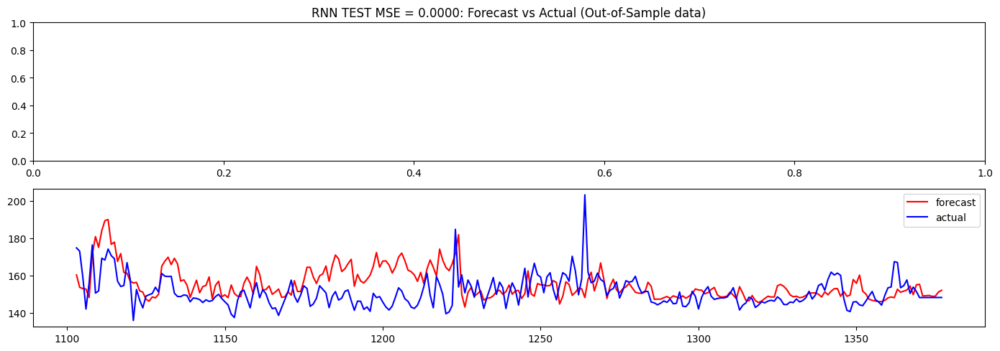

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


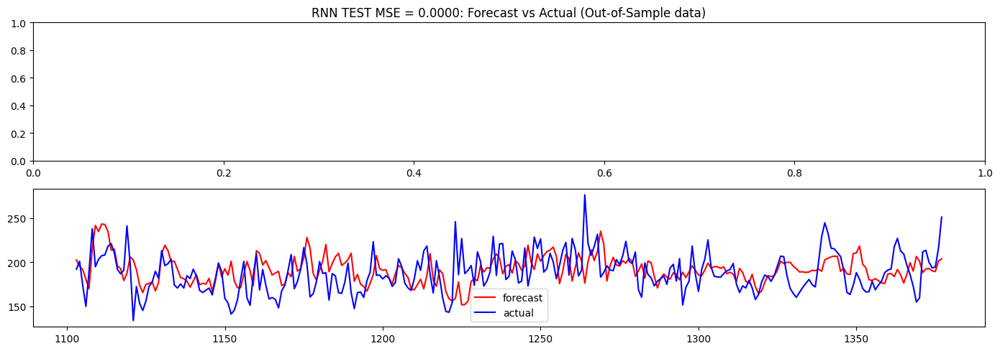

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


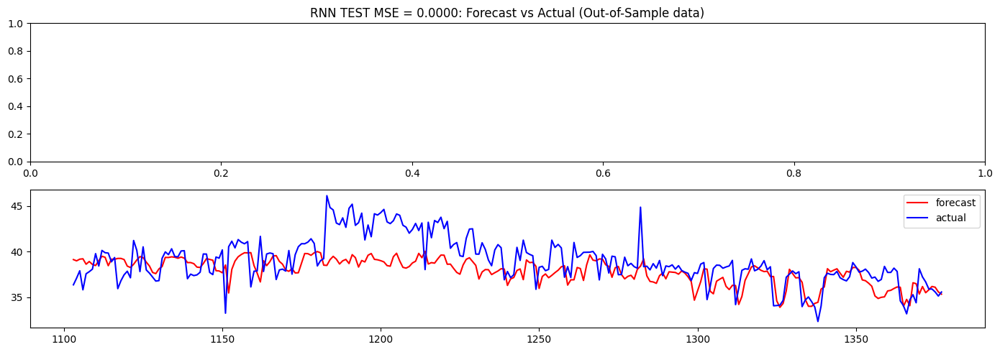

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


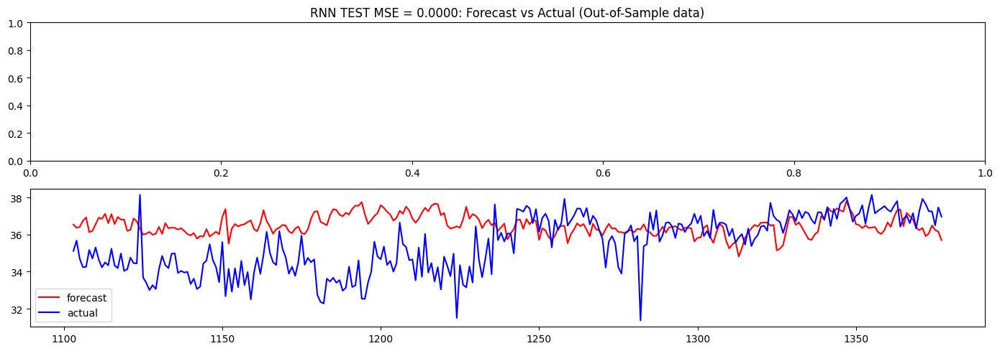

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


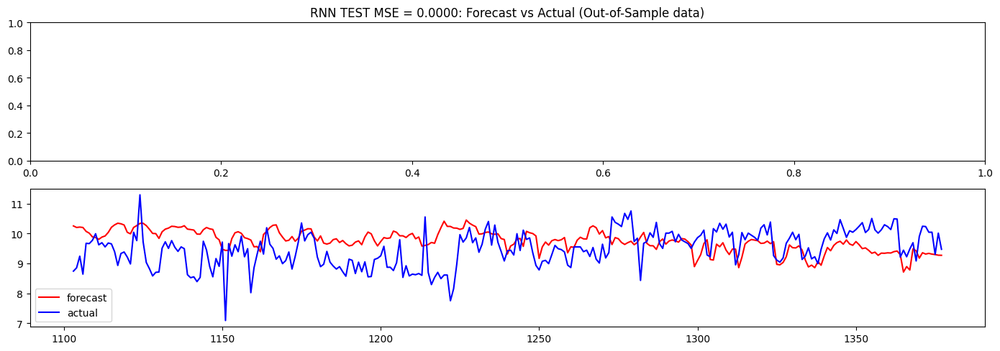

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


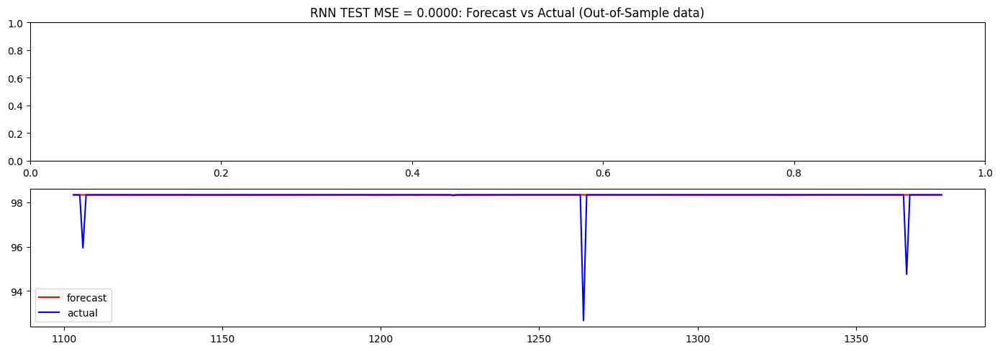

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


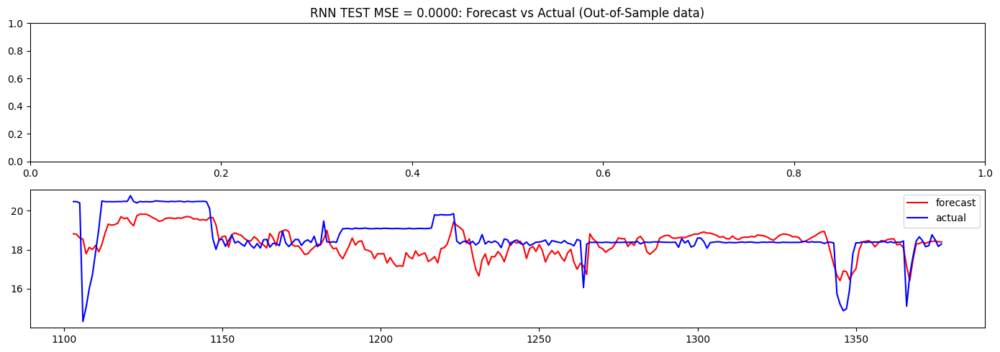

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


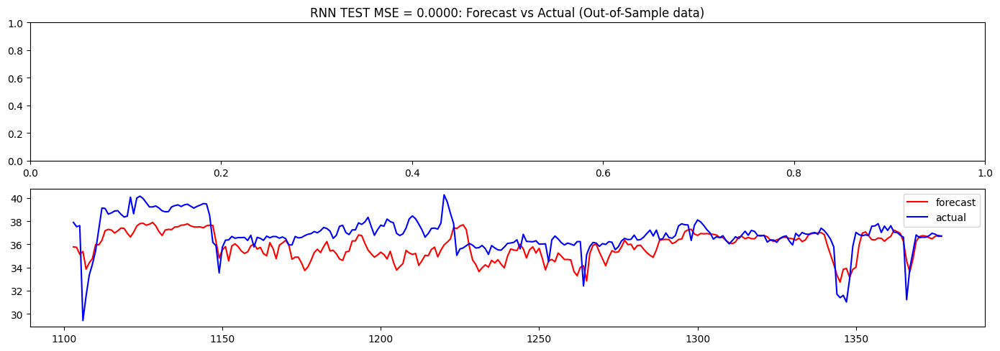

ricardo check this
torch.Size([275, 24])
torch.Size([275, 24])
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(144,)
(144,)
(24,)
(24,)
(275, 24)
(1, 24)
(1, 24)
(275, 24)
(275, 24)


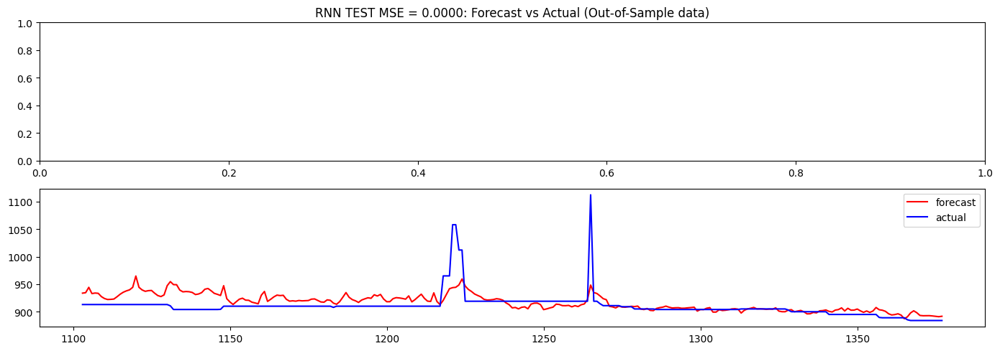

In [118]:

for i in range(24):

    x_index = i

    l1, l2 = View_all_predicted_Xs(x_index, model, model_type='RNN', **params_si )            
